# Predict the weekly sales of walmart stores by section using historical sales, markdown data and macro-economic indicators 

## Data Science Project in R-Predict the sales for each department using historical markdown data from the Walmart dataset containing data of 45 Walmart stores.

### Every Departmental store chain like Walmart wants to predict the store sales in the nearby future so that inventory planning can be done. Along with that, sales prediction helps to increase/decrease store staff based on the rush (More sales can mean more customers are coming to the stores). Also, it is always a good idea to do sales and revenue forecasting to better understand the company's cash-flows and overall growth.

### For inventory planning, you also need to know what products (or category of products aka department) will be utilised more. Under-stock some products and your sales are hit. Over-stock items like perishables and you run into losses if the product expires. That's why the sales prediction is done at a combination of store and department level (and sometimes even at product level for high-selling products).

### In this problem, we have been given the sales data of 45 stores based on store, department and week. The size and type of each store has been provided. Holiday weeks have been marked. Along with these, price markdown data (almost like discount data) has been given. A few macro-indicators like CPI, Unemployment rate, Fuel price etc. are also provided.

- Price Markdown is a method of reducing the sale price of a product

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#setting the working directory
os.chdir('C:/Users/deven/Desktop/data/')

In [3]:
#reading the required data files
sales_data = pd.read_csv('sales_data.csv')
stores_data = pd.read_csv('stores.csv')
features_data = pd.read_csv('features.csv')

# Exploratory Data Analysis (EDA)

In [4]:
sales_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [5]:
sales_data.isna().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [6]:
sales_data.dtypes

Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object

In [7]:
sales_data.shape

(421570, 5)

In [8]:
sales_data.nunique()

Store               45
Dept                81
Date               143
Weekly_Sales    359464
IsHoliday            2
dtype: int64

In [9]:
sales_data.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


In [11]:
#now we wanna see if this is a systematic issue or random
sales_data_check = sales_data.loc[sales_data['Weekly_Sales'] <= 0]
sales_data_check.shape

(1358, 5)

In [13]:
sales_data_check.nunique()

Store            45
Dept             51
Date            143
Weekly_Sales    679
IsHoliday         2
dtype: int64

In [15]:
sales_data_check.shape[0]/sales_data.shape[0]

0.003221291837654482

In [17]:
sales_data['Store'] = sales_data['Store'].astype(str)
sales_data['Dept'] = sales_data['Dept'].astype(str)
sales_data['IsHoliday'] = sales_data['IsHoliday']*1

In [18]:
#Since it affects a small percentage of the data, lets drop these records
sales_data2 = sales_data.loc[sales_data['Weekly_Sales']>0]
sales_data2.shape

(420212, 5)

In [19]:
sales_data2.dtypes

Store            object
Dept             object
Date             object
Weekly_Sales    float64
IsHoliday         int32
dtype: object

In [20]:
#Creating a function that does all of the above tasks in one go
def get_basic_stats(dfname):
    print("Shape of dataframe is " + str(dfname.shape))
    print("Below are datatypes of columns in DF")
    print(dfname.dtypes.sort_values())
    print("Below are missing values in each column")
    print(dfname.isna().sum().sort_values())
    print("Below are the number of unique values taken by a column")
    print(dfname.nunique().sort_values())
    print("Below are some records in DF")
    print(dfname.head())
    print("Basic Stats for numeric variables")
    print(dfname.describe())

In [21]:
get_basic_stats(features_data)

Shape of dataframe is (8190, 12)
Below are datatypes of columns in DF
IsHoliday          bool
Store             int64
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
Date             object
dtype: object
Below are missing values in each column
Store              0
Date               0
Temperature        0
Fuel_Price         0
IsHoliday          0
CPI              585
Unemployment     585
MarkDown5       4140
MarkDown1       4158
MarkDown3       4577
MarkDown4       4726
MarkDown2       5269
dtype: int64
Below are the number of unique values taken by a column
IsHoliday          2
Store             45
Date             182
Unemployment     404
Fuel_Price      1011
CPI             2505
MarkDown2       2715
MarkDown3       2885
MarkDown4       3405
MarkDown1       4023
MarkDown5       4045
Temperature     4178
dtype: int64
Be

get_basic_stats(stores_data)

In [23]:
#coverting variable to correct datatype
features_data['Store'] = features_data['Store'].astype(str)
stores_data['Store'] = stores_data['Store'].astype(str)

In [27]:
features_data2 = features_data.drop(['IsHoliday'], axis=1)

# Missing Value Imputation

In [28]:
features_data2['Unemployment'].fillna(features_data2['Unemployment'].mean(), inplace=True)
features_data2['CPI'].fillna(features_data2['CPI'].mean(), inplace=True)

In [31]:
#Markdown variables are missing in over half of the cases, and the most logical reason for that seems to be the absence \
#of any markdown in those cases  
features_data2.fillna(0, inplace=True)

In [32]:
stores_data.groupby('Type').agg({'Size':'mean'})

,Size
Type,
A,177247.727273
B,101190.705882
C,40541.666667


# Data preparation

In [ ]:
#Stores unique key = Store
#Features Data - Store+Date
#Store+Dept+Date

In [34]:
features_data2.groupby(['Store', 'Date']).size().shape[0] - features_data2.shape[0]

0

In [35]:
sales_data.groupby(['Store', 'Dept', 'Date']).size().shape[0] - sales_data.shape[0]

0

In [36]:
#Merging datasets
sales_features_data = pd.merge(sales_data2, features_data2, on=['Store', 'Date'], how='inner')
sales_features_data.shape

(420212, 14)

In [38]:
combined_data = pd.merge(sales_features_data, stores_data, on='Store', how='inner')
combined_data.shape

(420212, 16)

# Dividing data into train and test 

In [41]:
#getting the date variable in the correct format
combined_data['Date2'] = pd.to_datetime(combined_data['Date'], format = '%Y-%m-%d')

In [430]:
#match the number of weeks of difference with the number of distinct weeks in the data
print(combined_data['Date2'].nunique())
(combined_data['Date2'].max() - combined_data['Date2'].min())/7#1 week should be added to this

143


Timedelta('142 days 00:00:00')

In [61]:
#Getting the date that comes at 70% of the data and using it to divide the original data
unique_dates = pd.DataFrame(combined_data['Date2'].unique(), columns = ['date'])
unique_dates.sort_values('date', inplace = True)
splitter = round(unique_dates.shape[0]*0.7, 0)
split_date=unique_dates.iloc[int(splitter)-1]['date']
split_date

Timestamp('2011-12-30 00:00:00')

In [64]:
#Using that date to make the split
combined_data_train = combined_data.loc[combined_data['Date2'] <= split_date]
combined_data_test = combined_data.loc[combined_data['Date2'] > split_date]
combined_data_train.shape[0]/combined_data.shape[0]

0.6977525629920136

# Univariate Analysis

(array([7157., 7140., 6309., 7175., 6286., 7121., 6796., 6909., 6158.,
        7206., 6988., 6736., 7324., 6995., 6886., 6482., 6823., 6818.,
        7077., 7119., 6651., 6733., 7017., 7137., 6824., 6867., 7127.,
        7058., 6604., 4990., 7071., 7122., 4470., 7177., 6586., 4321.,
        4947., 5066., 6885., 6979., 6987., 4729., 4707., 4932., 6712.]),
 array([ 0.        ,  0.97777778,  1.95555556,  2.93333333,  3.91111111,
         4.88888889,  5.86666667,  6.84444444,  7.82222222,  8.8       ,
         9.77777778, 10.75555556, 11.73333333, 12.71111111, 13.68888889,
        14.66666667, 15.64444444, 16.62222222, 17.6       , 18.57777778,
        19.55555556, 20.53333333, 21.51111111, 22.48888889, 23.46666667,
        24.44444444, 25.42222222, 26.4       , 27.37777778, 28.35555556,
        29.33333333, 30.31111111, 31.28888889, 32.26666667, 33.24444444,
        34.22222222, 35.2       , 36.17777778, 37.15555556, 38.13333333,
        39.11111111, 40.08888889, 41.06666667, 42.04444444,

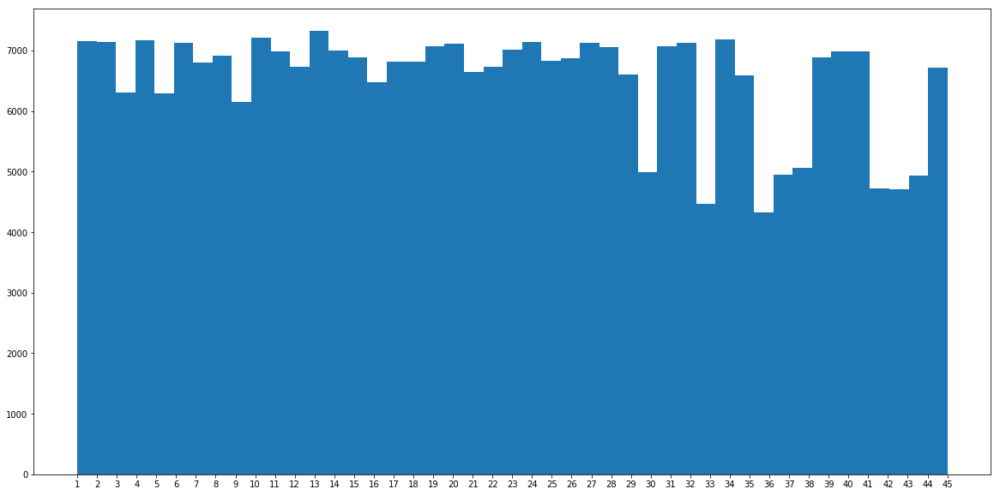

In [88]:
plt.figure(figsize=(20,10))
plt.hist(list(combined_data_train['Store']), bins = combined_data_train['Store'].nunique() )

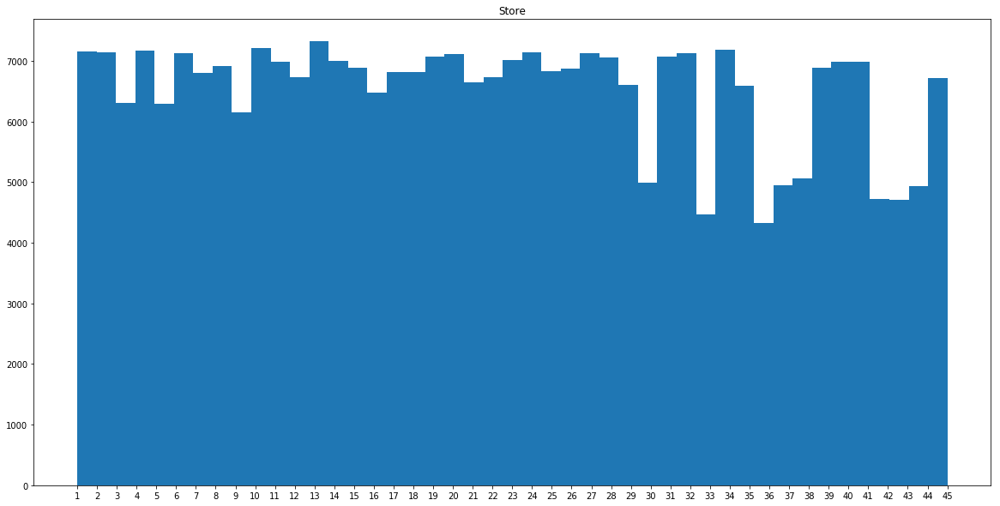

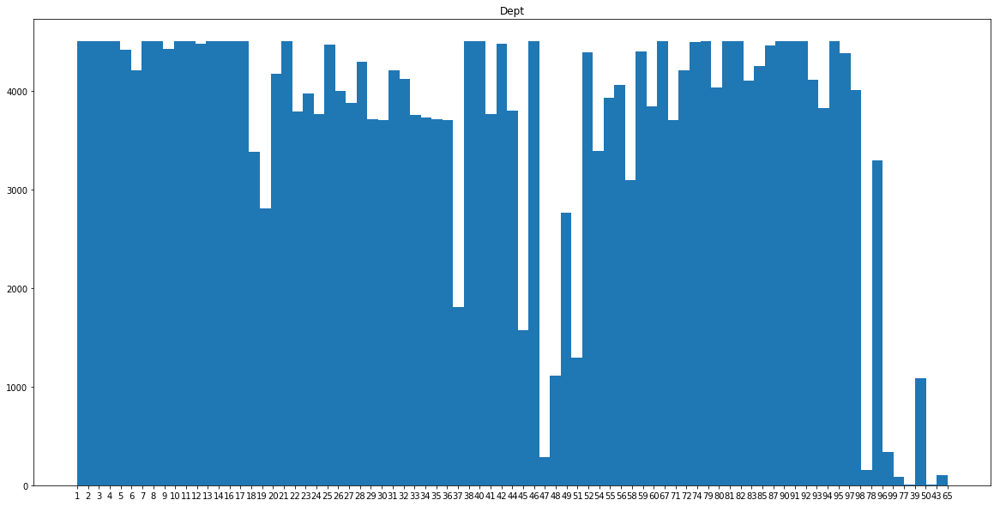

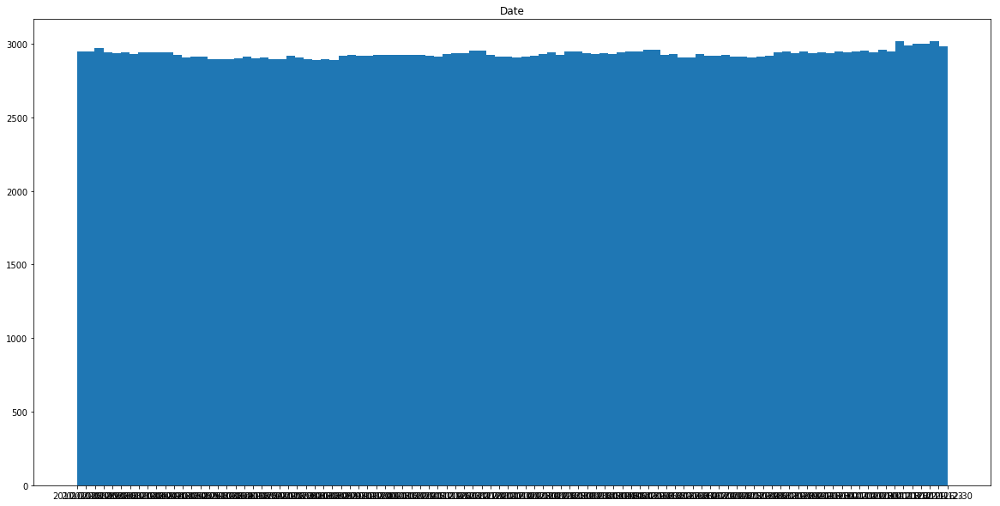

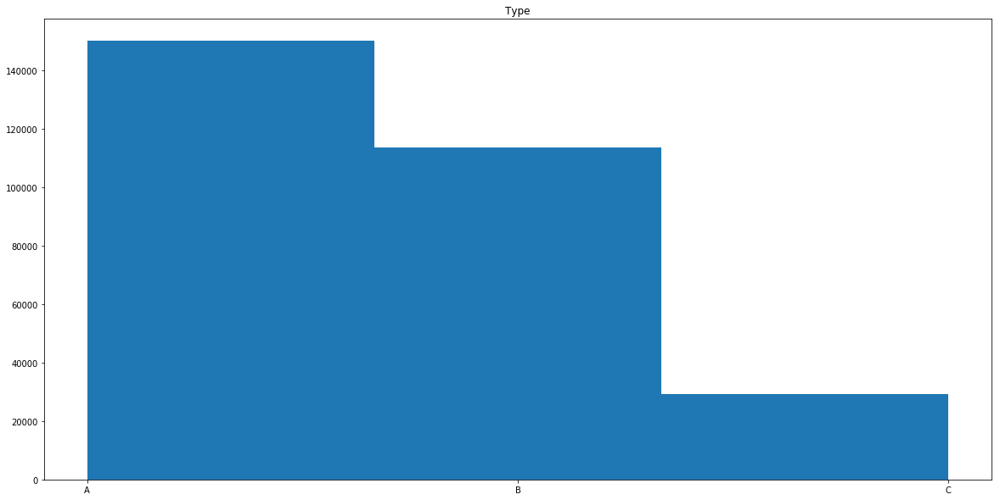

In [91]:
cat_columns = combined_data_train.select_dtypes(np.object).columns.tolist()
#univariate analysis of categorical variables
for var in cat_columns:
    plt.figure(figsize = (20,10))
    plt.hist(list(combined_data_train[var]), bins = combined_data_train[var].nunique() )
    plt.title(var)
    plt.show

In [95]:
num_columns = combined_data_train.select_dtypes(np.number).columns.tolist()
mark_columns = [x for x in num_columns if 'Mark' in x]
mark_columns
nonmark_columns = list(set(num_columns).difference(set(mark_columns)))
nonmark_columns

['CPI',
 'Temperature',
 'IsHoliday',
 'Size',
 'Weekly_Sales',
 'Fuel_Price',
 'Unemployment']

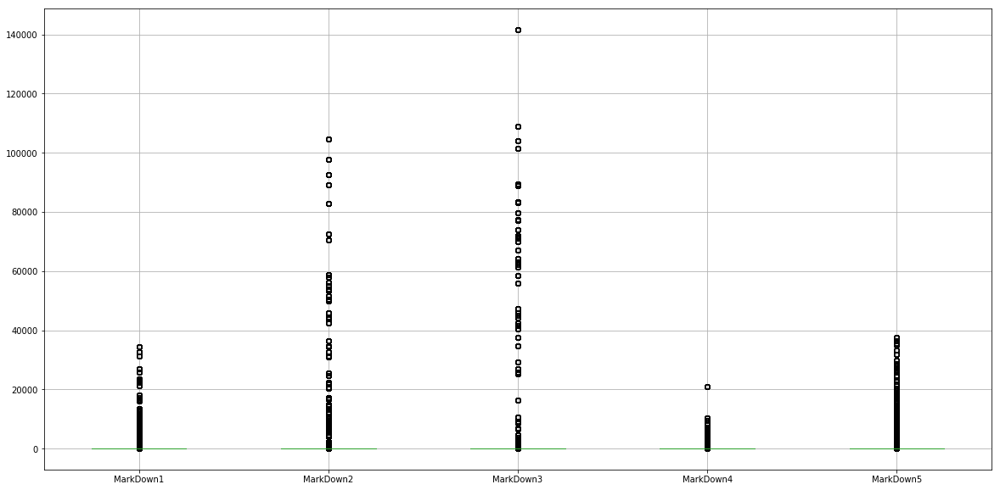

In [96]:
combined_data_train.boxplot(column = mark_columns, figsize=(20,10))

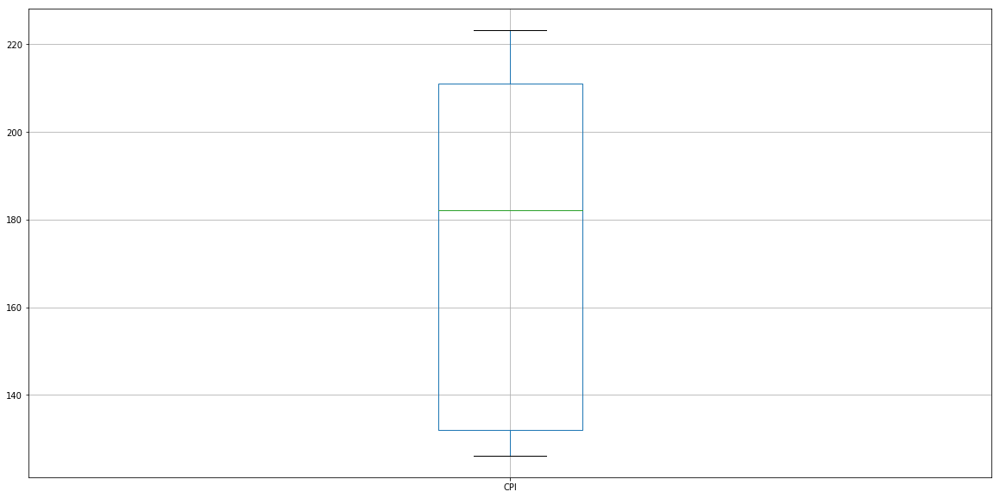

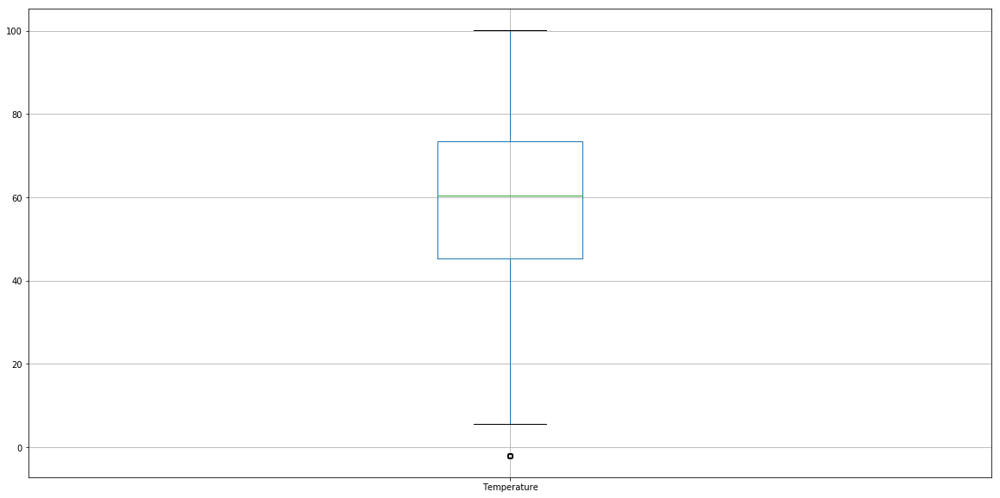

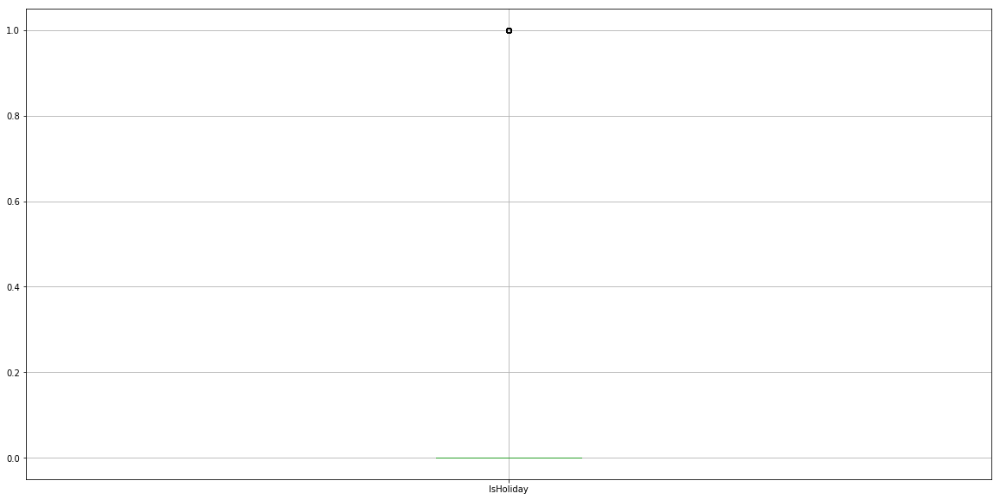

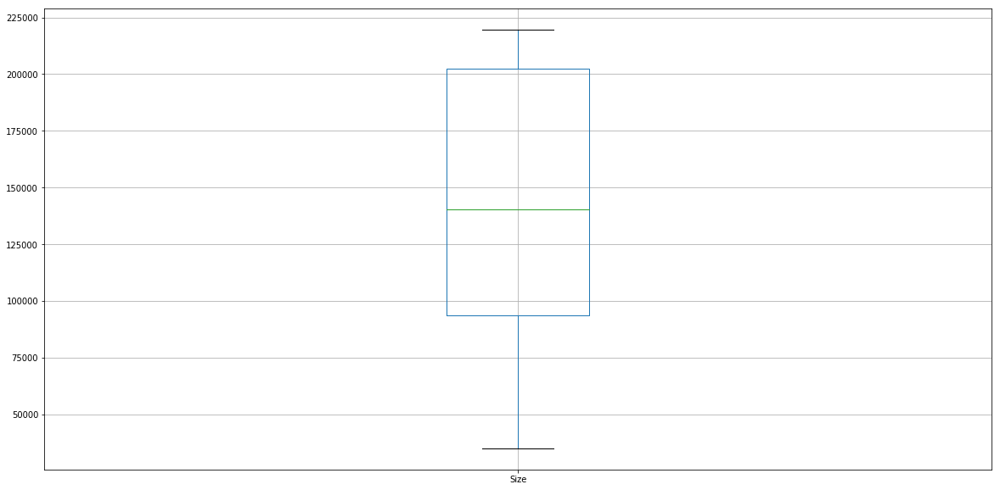

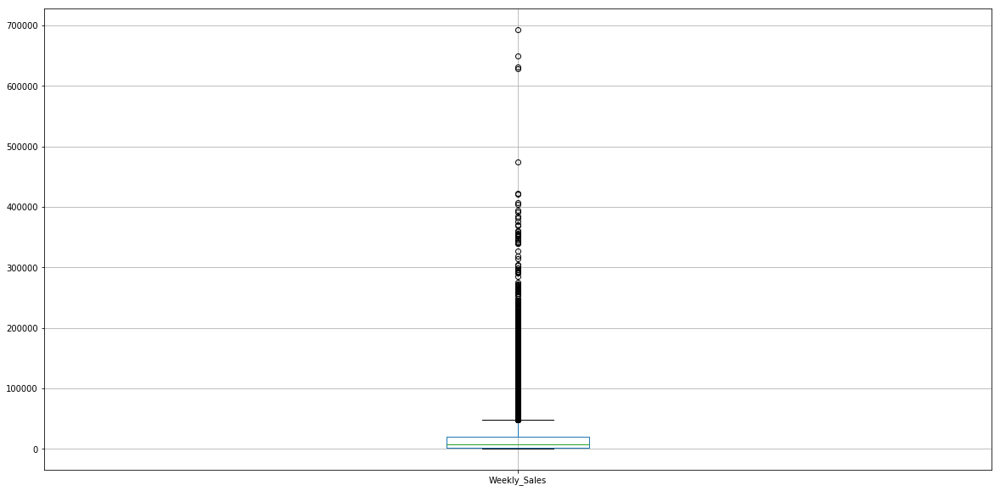

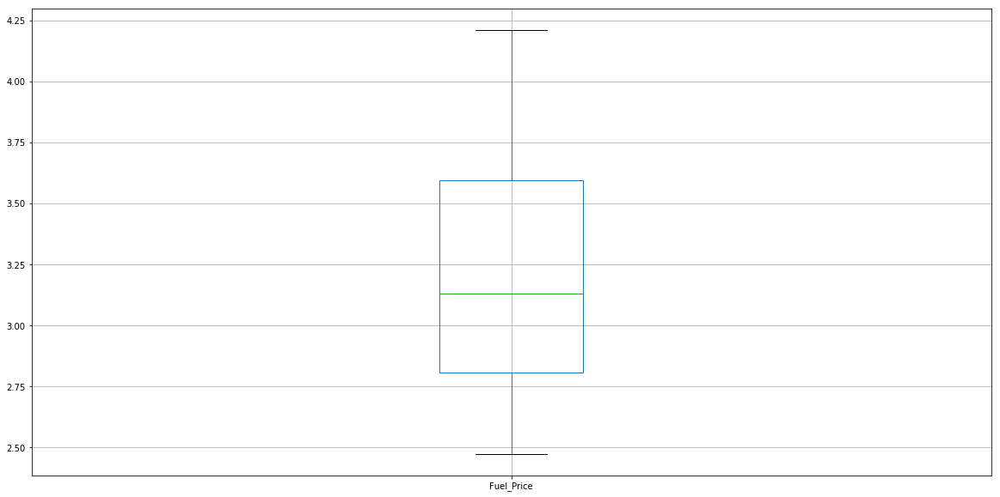

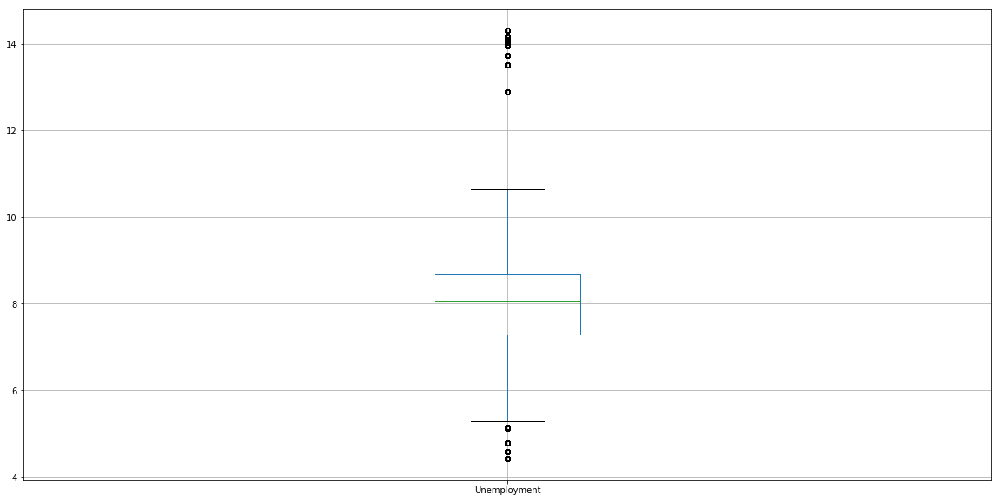

In [99]:
for var in nonmark_columns:
    combined_data_train.boxplot(column = var, figsize=(20,10))
    plt.show()

# Bivariate Analysis

In [101]:
#Keeping the numeric predictors
train_num = combined_data_train[num_columns]
train_num = train_num.drop(['Weekly_Sales'], axis=1)
train_num.head()

,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
0,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
1,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
2,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
3,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
4,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315


In [432]:
#Checking the highly correlated variables
corr_values = train_num.corr().unstack().reset_index()
print(corr_values.shape)
corr_values2 = corr_values[corr_values['level_0'] > corr_values['level_1'] ]
print(corr_values2.shape)
corr_values2.columns = ['var1', 'var2', 'corr_value']
corr_values2['corr_abs'] = corr_values2['corr_value'].abs()
corr_values2.sort_values( 'corr_abs', ascending=False, inplace=True)
corr_values2.head(10)

(121, 3)
(55, 3)


C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


,var1,var2,corr_value,corr_abs
69,MarkDown4,MarkDown1,0.764146,0.764146
83,MarkDown5,MarkDown4,0.673759,0.673759
80,MarkDown5,MarkDown1,0.573937,0.573937
47,MarkDown2,MarkDown1,0.364552,0.364552
107,Unemployment,CPI,-0.298205,0.298205
55,MarkDown3,IsHoliday,0.296824,0.296824
44,MarkDown2,IsHoliday,0.272442,0.272442
70,MarkDown4,MarkDown2,0.232324,0.232324
30,Fuel_Price,CPI,-0.180454,0.180454
11,Temperature,IsHoliday,-0.178936,0.178936


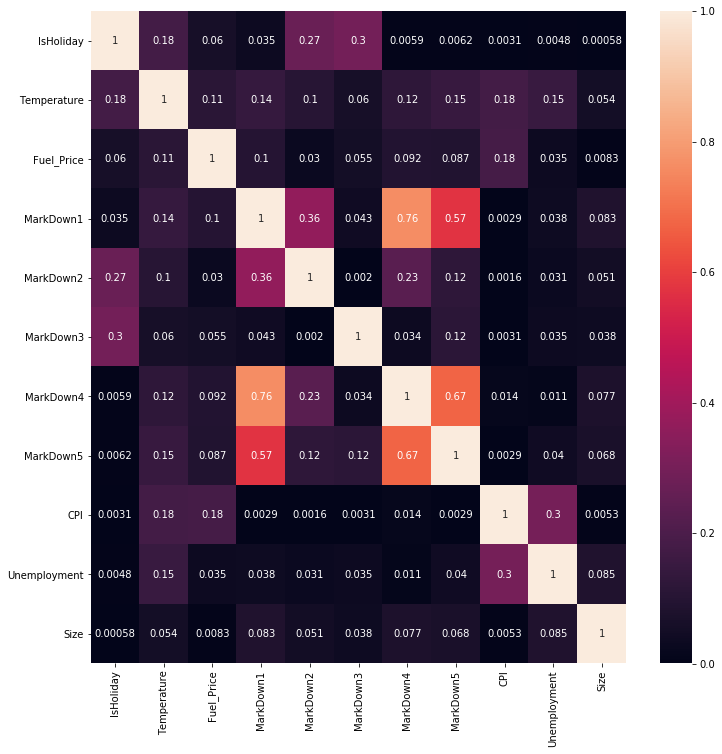

In [110]:
#creating a heat map to see the degree of correlation visually
plt.figure(figsize=(12, 12))
vg_corr = train_num.corr().abs()
sns.heatmap(vg_corr, xticklabels = vg_corr.columns.values,yticklabels = vg_corr.columns.values, annot = True)

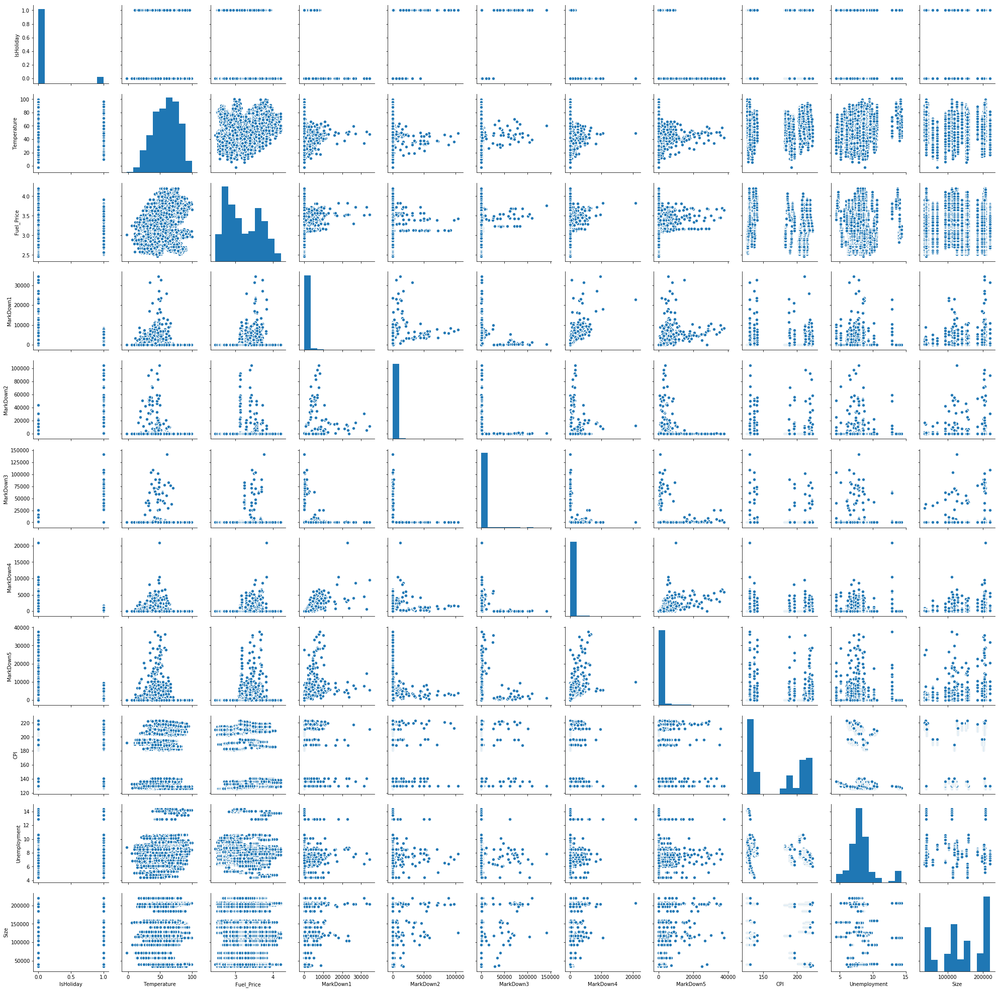

In [111]:
#Plotting each numeric predictor against the other
sns.pairplot(train_num)

# Variable trend with Dependent Variable

Store
    Store  Weekly_Sales
0       1  1.542039e+06
11      2  1.938904e+06
22      3  3.956343e+05
33      4  2.067737e+06
40      5  3.130725e+05
Dept
    Dept  Weekly_Sales
0      1  8.819285e+05
10     2  1.955582e+06
21     3  5.210935e+05
32     4  1.161434e+06
43     5  1.021350e+06


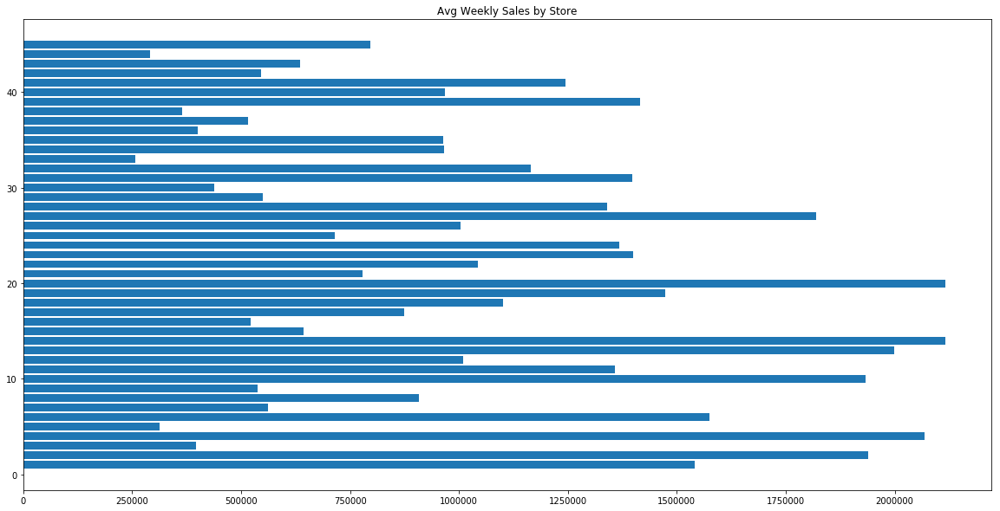

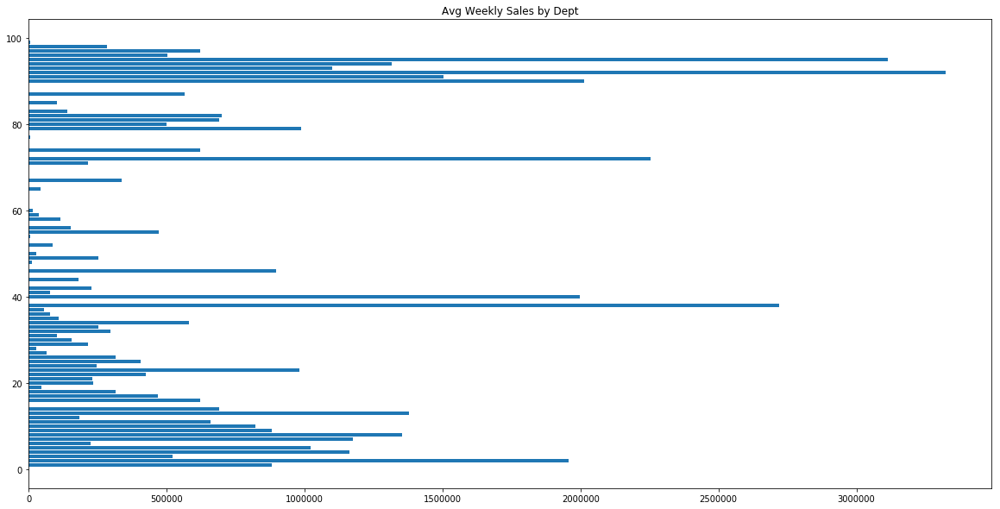

In [433]:
#Looking at average weekly Sales by STORE, DEPT...directly taking average will lead to incorrect result..
for var in ['Store', 'Dept']:
    print(var)
    agg_temp = combined_data_train.groupby([var, 'Date'], as_index=False).agg({'Weekly_Sales': 'sum'})
    agg_temp2 = agg_temp.groupby([var], as_index=False).agg({'Weekly_Sales': 'mean'})
    agg_temp2[var] = pd.to_numeric(agg_temp2[var])
    agg_temp2.sort_values(var, inplace=True)
    print(agg_temp2.head())
    plt.figure(figsize=(20,10))
    plt.title('Avg Weekly Sales by ' + var)
    plt.barh(agg_temp2[var], agg_temp2['Weekly_Sales'])

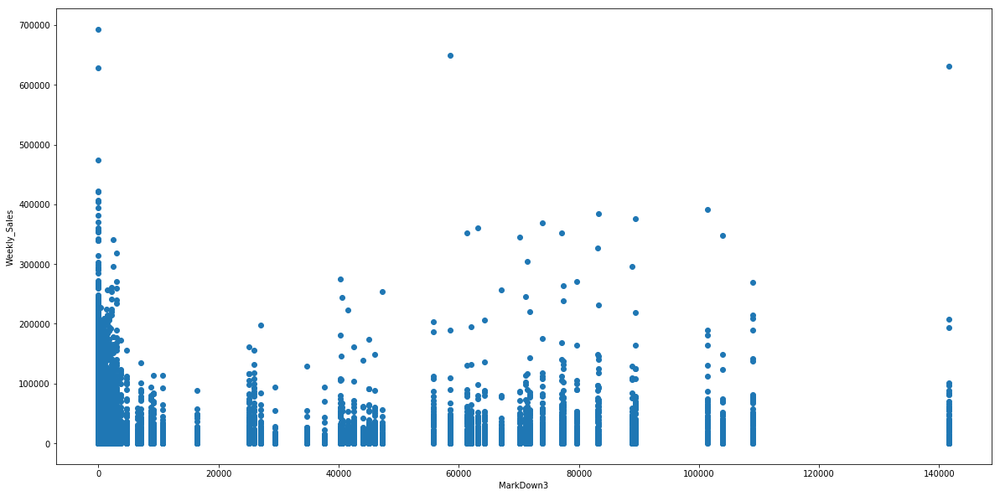

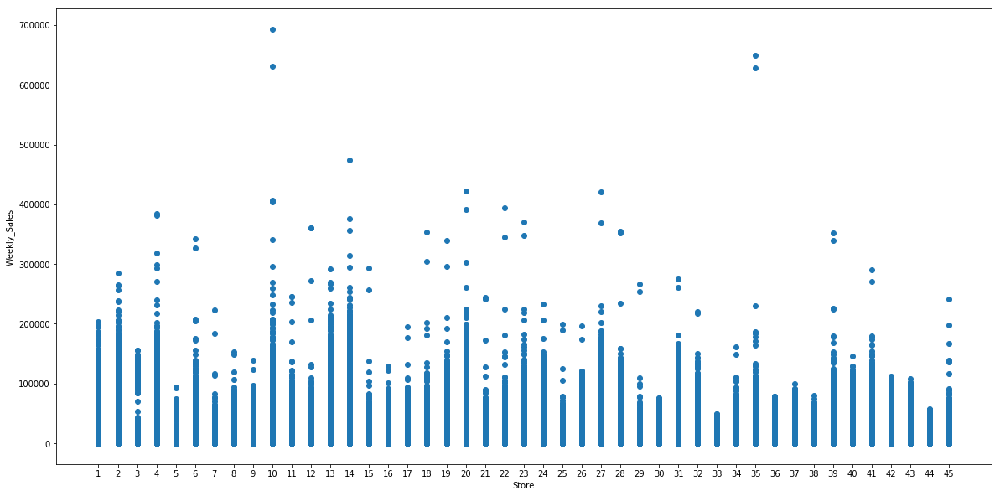

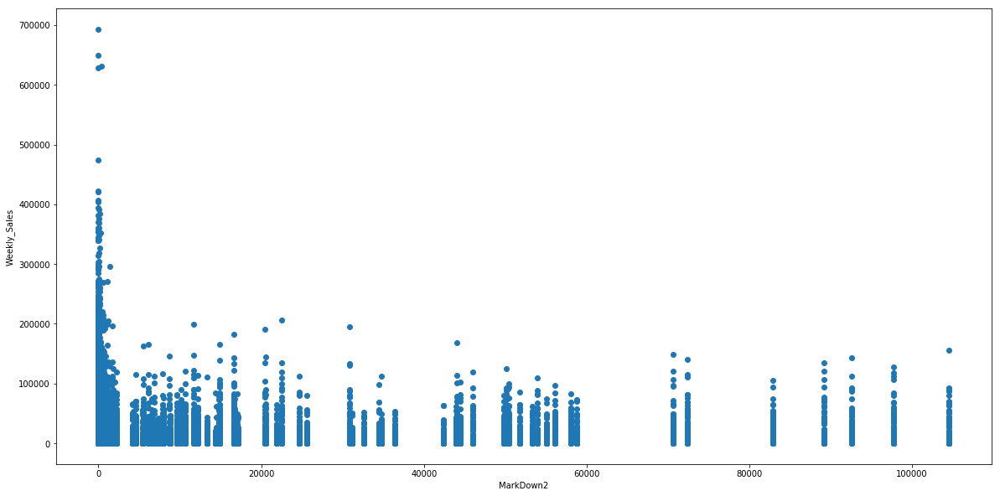

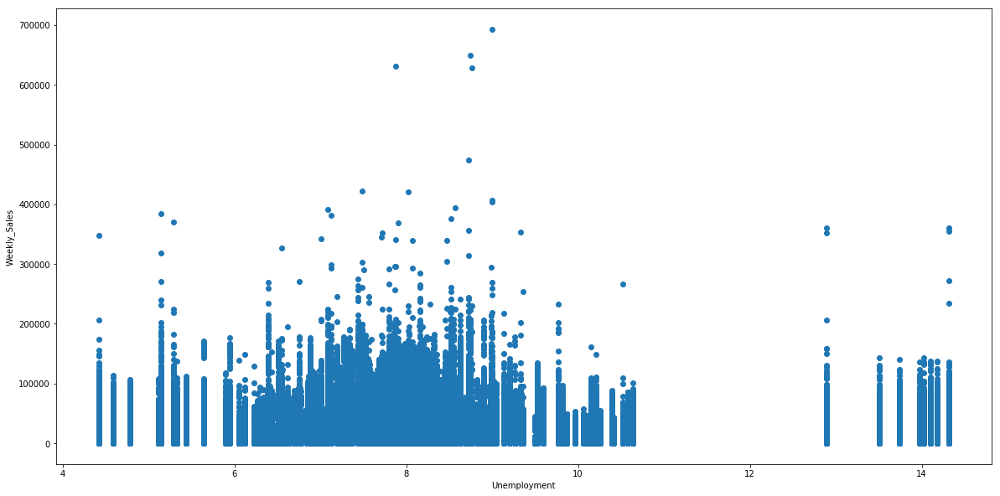

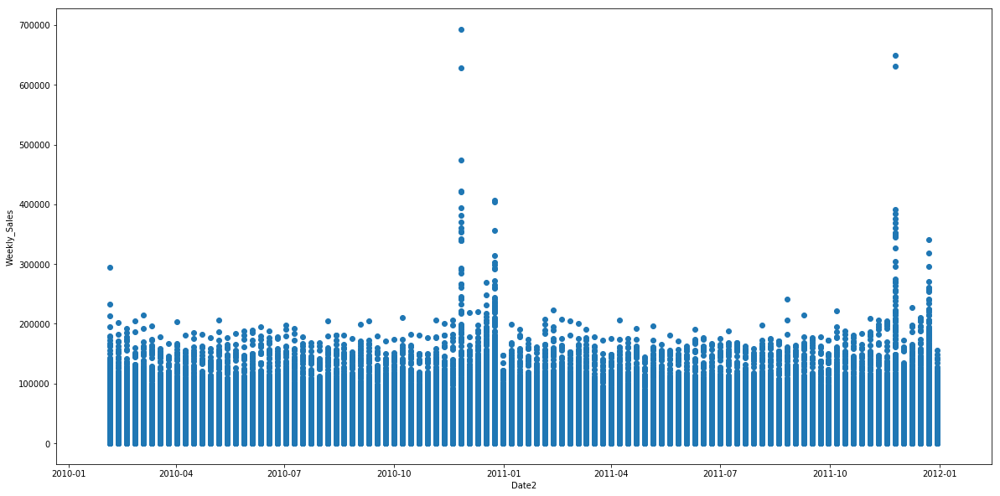

...

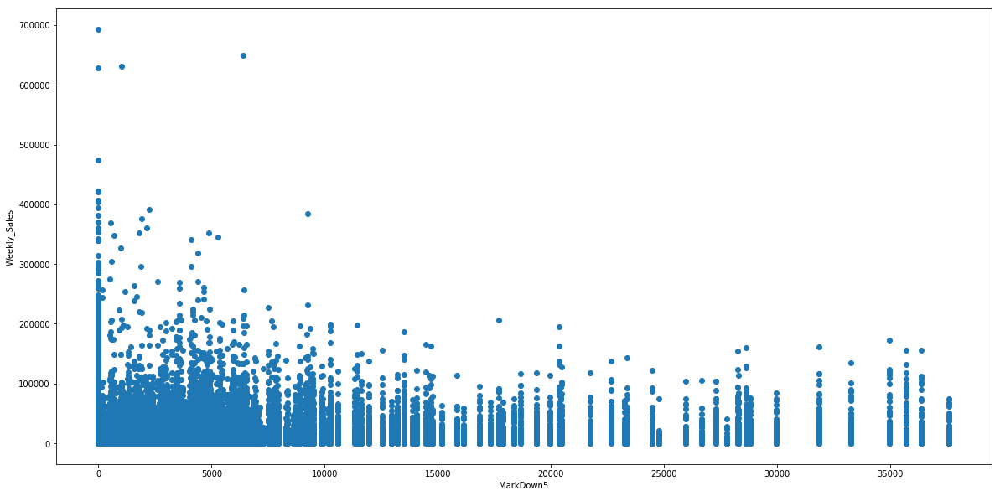

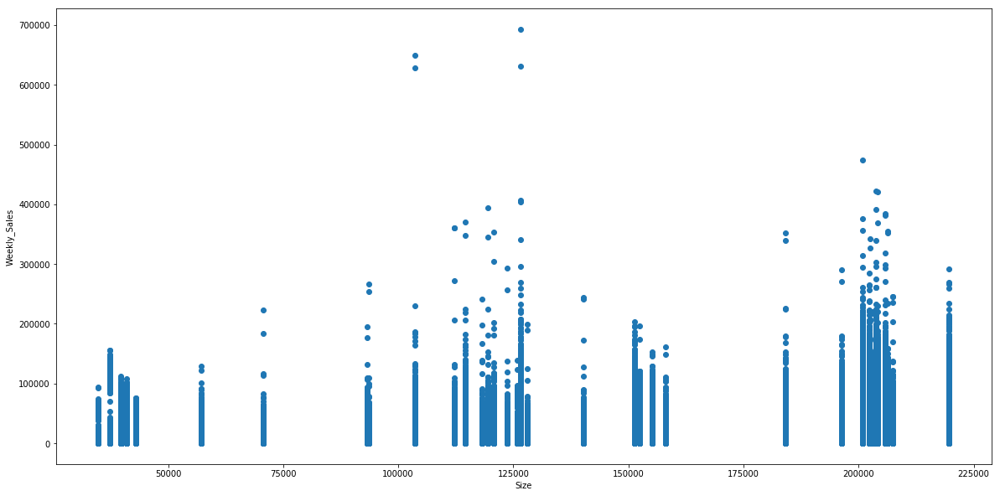

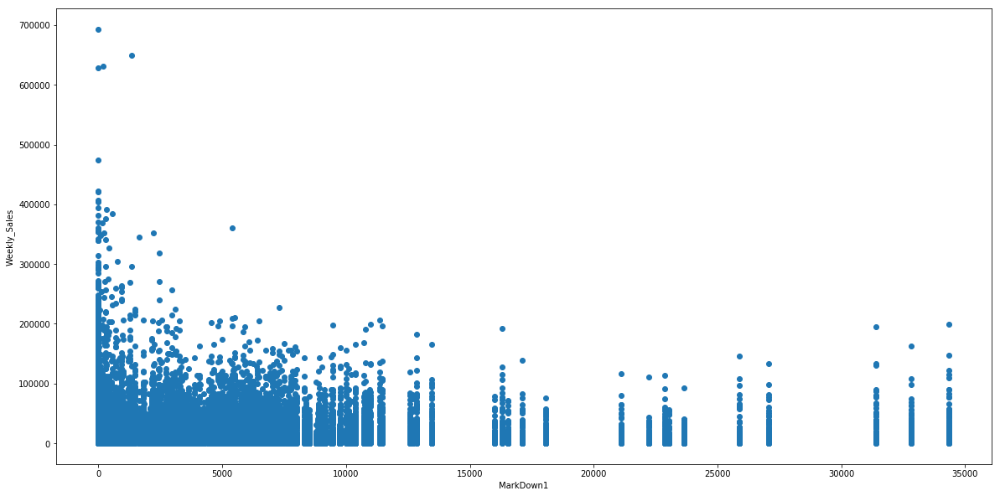

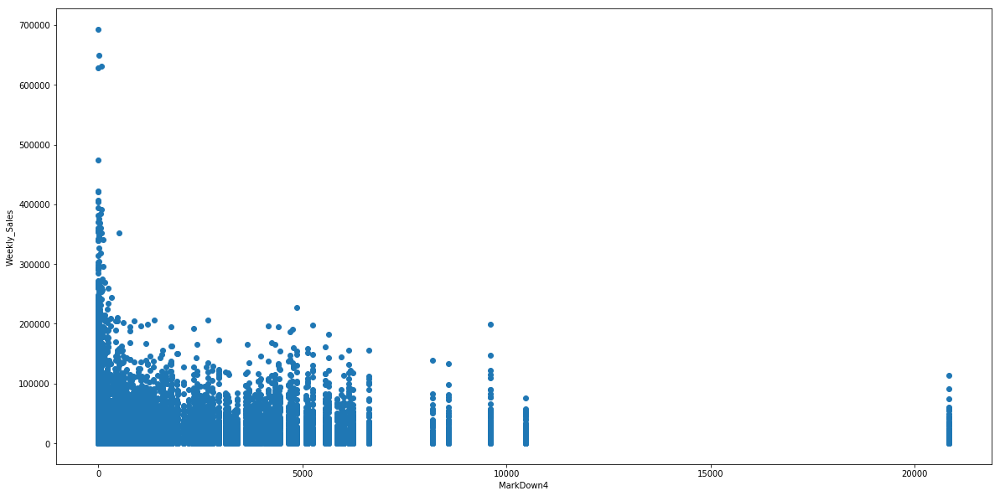

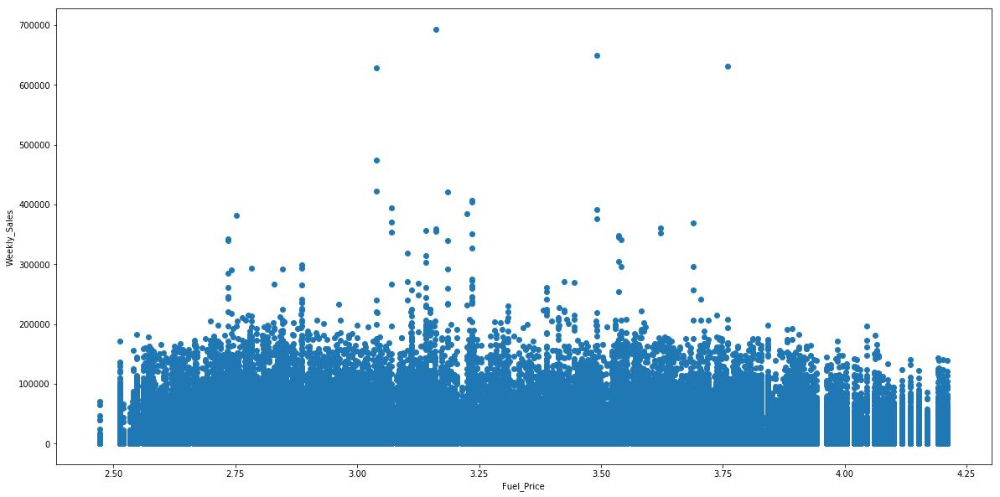

In [145]:
#Using scatter plot to check trend of predictors with dependent variable
var_list = [x for x in combined_data_train.columns]
columnstodrop = ['Weekly_Sales', 'Date']
var_list = list(set(var_list).difference(set(columnstodrop)))
for varname in var_list:
    plt.figure(figsize=(20,10))
    plt.scatter(combined_data_train[varname], combined_data_train['Weekly_Sales'])
    plt.xlabel(varname); plt.ylabel("Weekly_Sales")


In [149]:
#check trend of dependent variable with other variables
all_corr = combined_data_train.corr().unstack().reset_index()
print(all_corr.shape)
corr_table = all_corr[all_corr['level_1'] =='Weekly_Sales' ]
corr_table = corr_table.loc[ (corr_table['level_0'] != 'Weekly_Sales') ]
print(corr_table.shape)
corr_table.columns = ['var1', 'var2', 'corr_value']
corr_table['corr_abs'] = corr_table['corr_value'].abs()
corr_table = corr_table.sort_values(by= ['corr_abs'], ascending = False )
corr_table

(144, 3)
(11, 3)


,var1,var2,corr_value,corr_abs
132,Size,Weekly_Sales,0.242929,0.242929
72,MarkDown3,Weekly_Sales,0.044642,0.044642
96,MarkDown5,Weekly_Sales,0.038685,0.038685
48,MarkDown1,Weekly_Sales,0.035576,0.035576
84,MarkDown4,Weekly_Sales,0.031970,0.031970
120,Unemployment,Weekly_Sales,-0.025631,0.025631
108,CPI,Weekly_Sales,-0.021871,0.021871
60,MarkDown2,Weekly_Sales,0.016028,0.016028
12,IsHoliday,Weekly_Sales,0.013925,0.013925
24,Temperature,Weekly_Sales,-0.007911,0.007911


#  Date trends

In [434]:
#Adding the week number and year column 
combined_data_train['week_number'] = combined_data_train['Date2'].dt.week
combined_data_train['year_number'] = combined_data_train['Date2'].dt.year

In [435]:
#Checking the holiday weeks with highest total sales 
temper = combined_data_train.groupby('Date', as_index=False).agg({'Weekly_Sales':'sum'})
print(temper['Weekly_Sales'].mean())
temper = combined_data_train.groupby(['Date', 'IsHoliday', 'week_number', 'year_number'], as_index=False).agg({'Weekly_Sales':'sum'})
temper.loc[temper['IsHoliday'] == 1].sort_values(by = 'Weekly_Sales', ascending=False)

47371515.068899974


,Date,IsHoliday,week_number,year_number,Weekly_Sales
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
1,2010-02-12,1,6,2010,48336800.10
53,2011-02-11,1,6,2011,47336816.90
83,2011-09-09,1,36,2011,46763760.42
99,2011-12-30,1,52,2011,46044300.91
31,2010-09-10,1,36,2010,45635418.66
47,2010-12-31,1,52,2010,40434740.42


In [159]:
#Checking the weeks with highest total sales..please note that most of them are non holidays
temper.sort_values(by = 'Weekly_Sales', ascending=False).head(20)

,Date,IsHoliday,week_number,year_number,Weekly_Sales
46,2010-12-24,0,51,2010,80931586.20
98,2011-12-23,0,51,2011,76999773.57
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
45,2010-12-17,0,50,2010,61821317.85
97,2011-12-16,0,50,2011,60086723.16
44,2010-12-10,0,49,2010,55667840.03
96,2011-12-09,0,49,2011,55561557.73
8,2010-04-02,0,13,2010,50424232.22
17,2010-06-04,0,22,2010,50188767.60


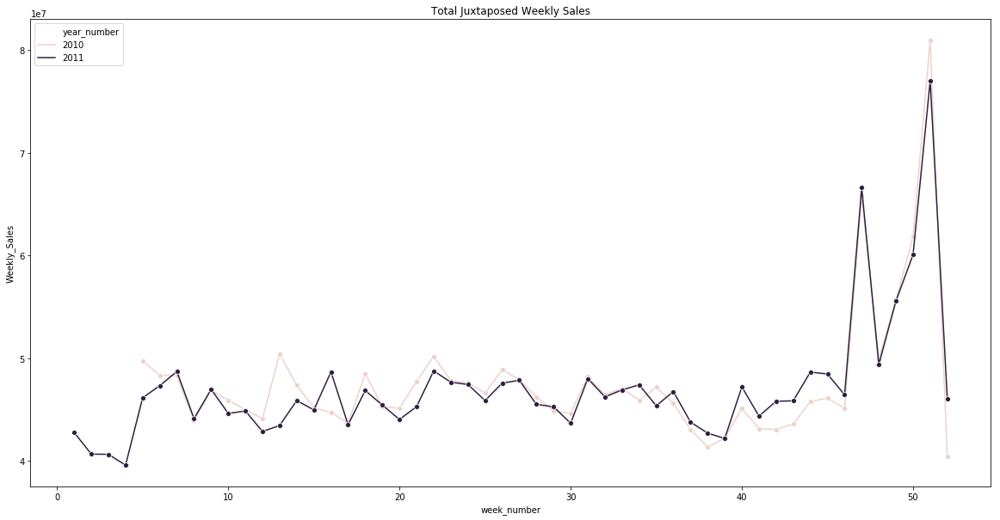

In [160]:
#Checking weekly Sales of different years juxtaposed
another_agg = combined_data_train.groupby(['week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
plt.figure(figsize=(20,10))
plt.title('Total Juxtaposed Weekly Sales')
sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = another_agg, marker = 'o')

          Date2 Store  Weekly_Sales
2075 2010-12-24    14    3818686.45
2082 2010-12-24    20    3766687.43
2071 2010-12-24    10    3749057.69
4443 2011-12-23     4    3676388.98
2074 2010-12-24    13    3595903.20
4414 2011-12-23    13    3556766.03
4422 2011-12-23    20    3555379.47
2103 2010-12-24     4    3526713.39
4411 2011-12-23    10    3487986.89
2081 2010-12-24     2    3436154.68
          Date2 Dept  Weekly_Sales
3301 2010-11-26   72   10533640.92
7292 2011-11-25   72   10089874.40
3605 2010-12-24    7    6490778.39
3607 2010-12-24   72    6020196.03
7606 2011-12-23    7    5535941.35
7608 2011-12-23   72    5028104.79
7623 2011-12-23   92    4647997.52
7307 2011-11-25   92    4330784.59
3620 2010-12-24   92    4203774.33
7543 2011-12-16   92    4093797.82


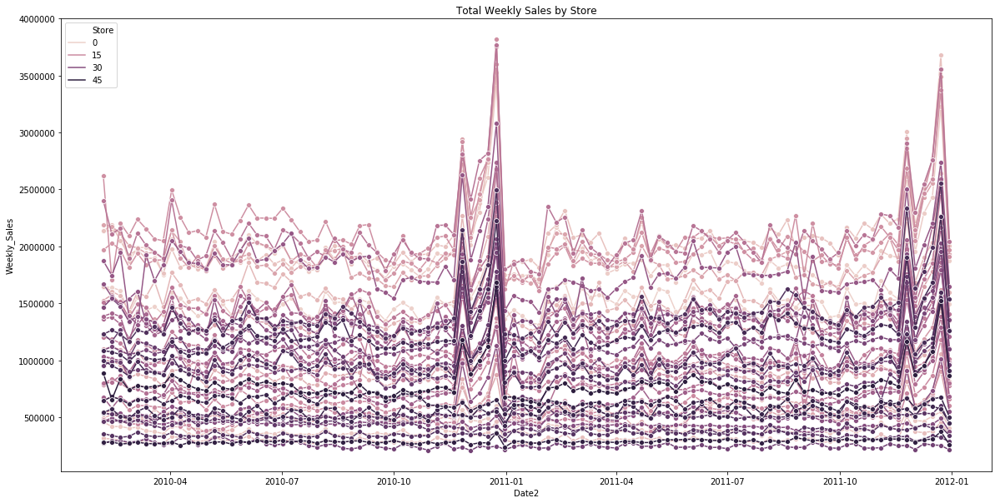

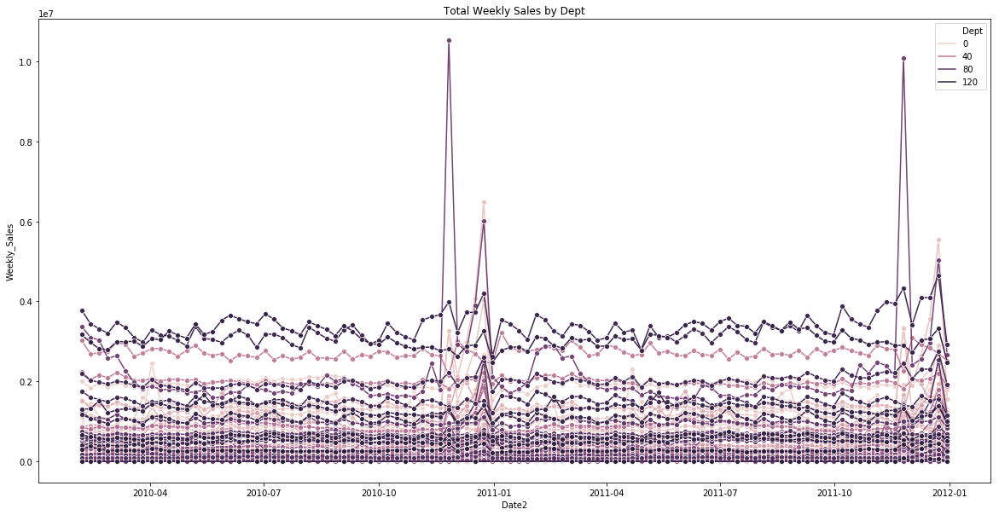

In [166]:
#Checking total weekly Sales of different Stores
for var in ['Store', 'Dept']:
    agg_temp = combined_data_train.groupby(['Date2', var], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    print(agg_temp.sort_values(by='Weekly_Sales', ascending=False).head(10))
    plt.figure(figsize=(20,10))
    plt.title('Total Weekly Sales by ' + var)
    agg_temp[var] = pd.to_numeric(agg_temp[var])#The hue variable has to be numerical 
    sns.lineplot(x="Date2", y="Weekly_Sales", hue=var, data = agg_temp, marker = 'o')

(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(7, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(6, 5)
(100, 5)
(100, 5)
(100, 5)
(89, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(98, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(9, 5)
(49, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(

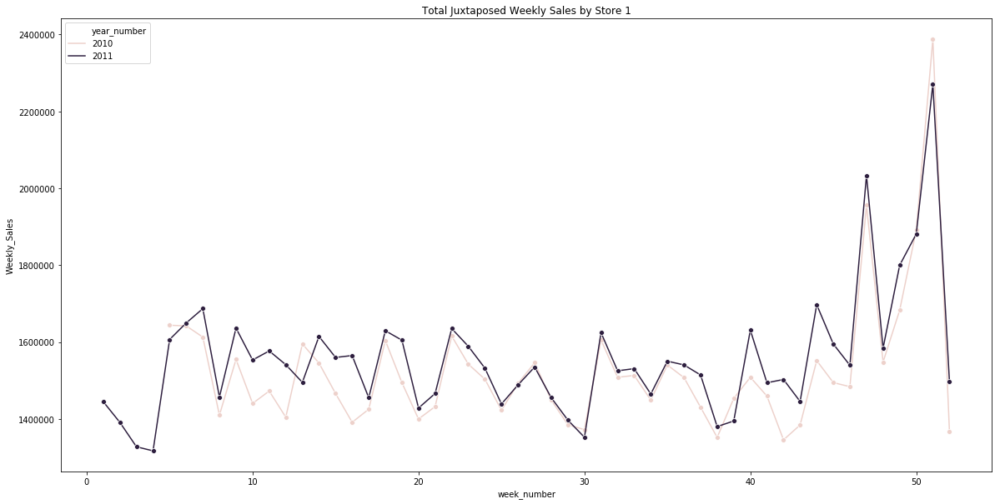

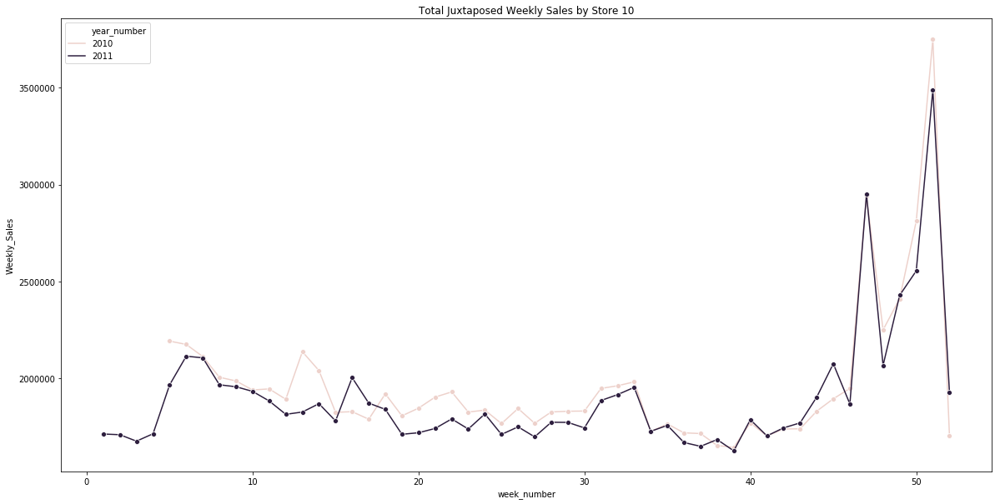

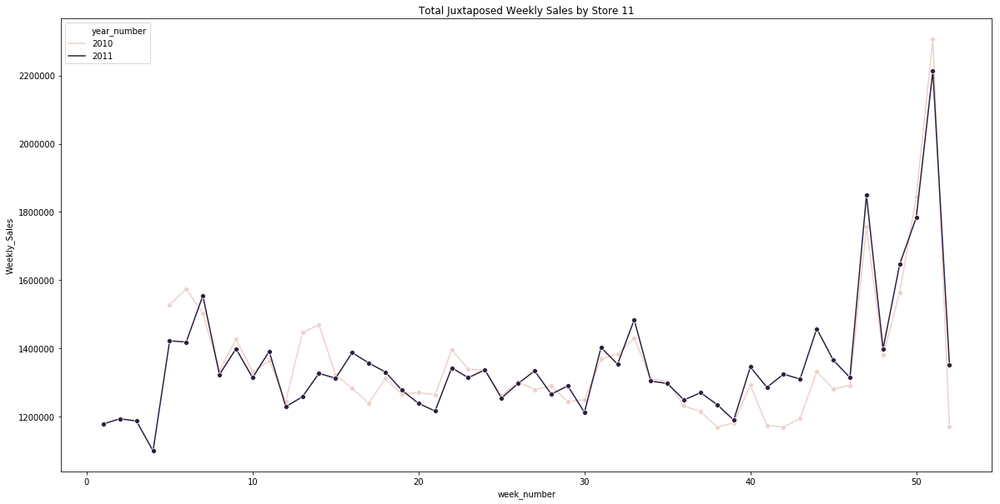

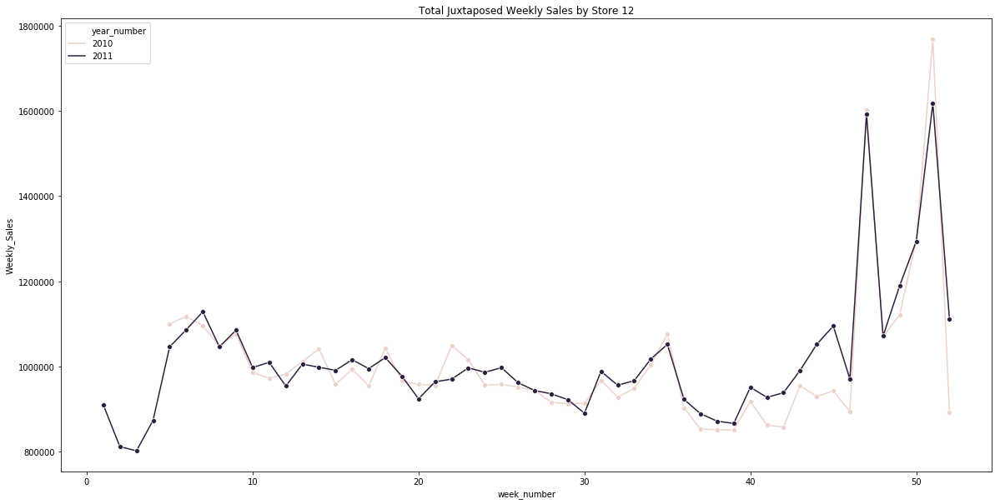

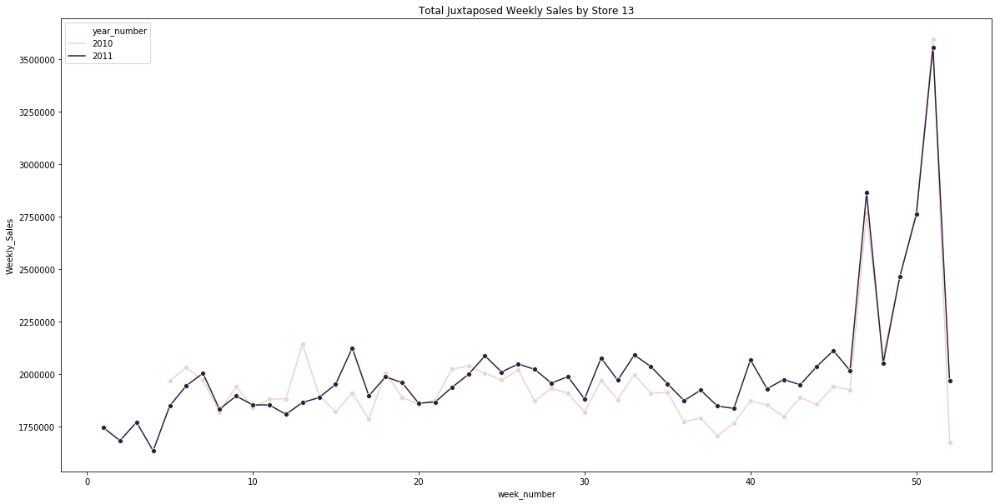

...

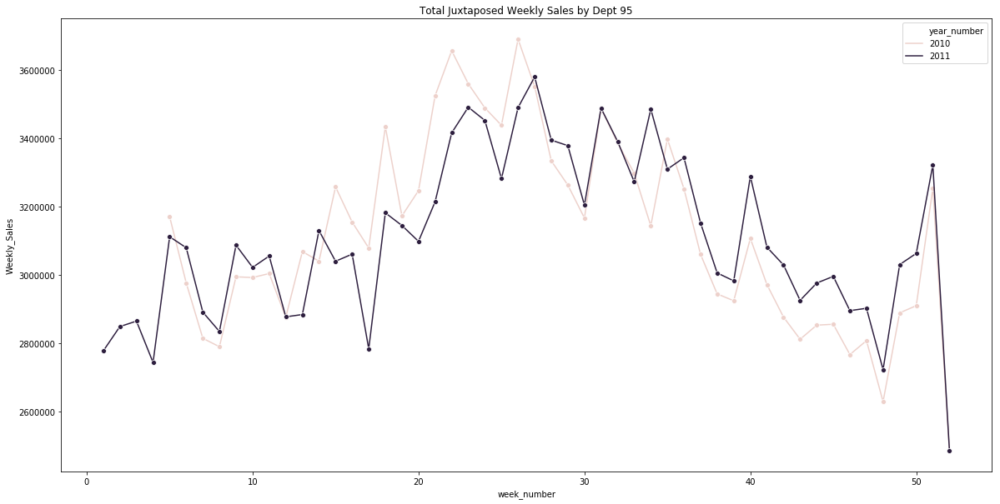

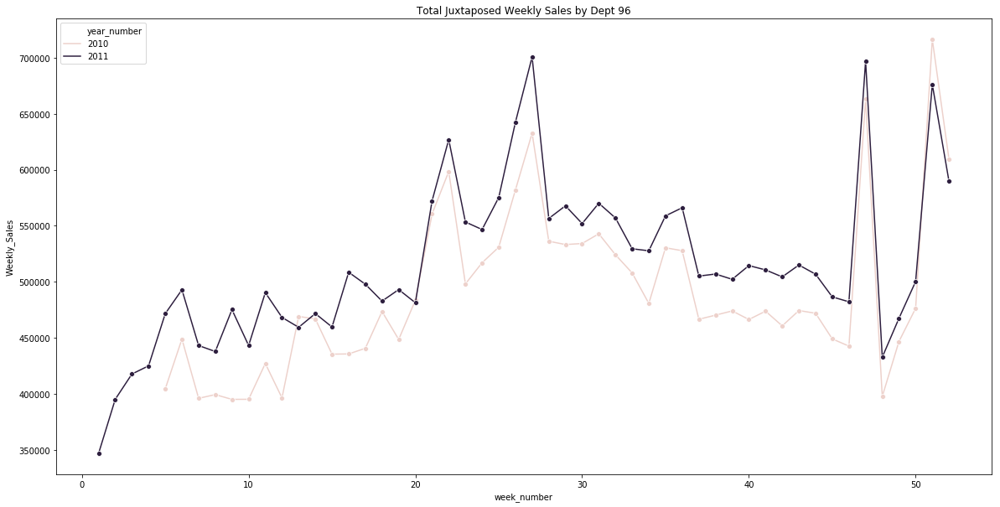

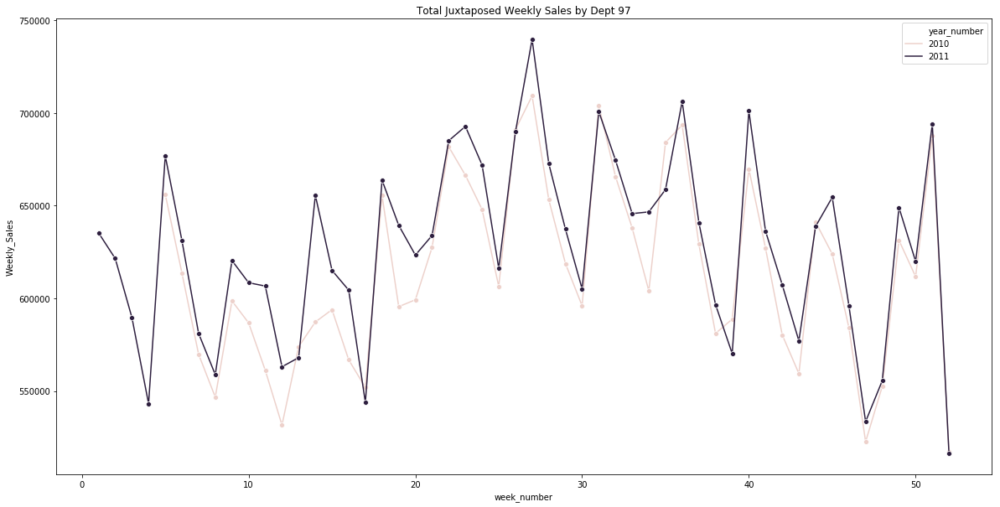

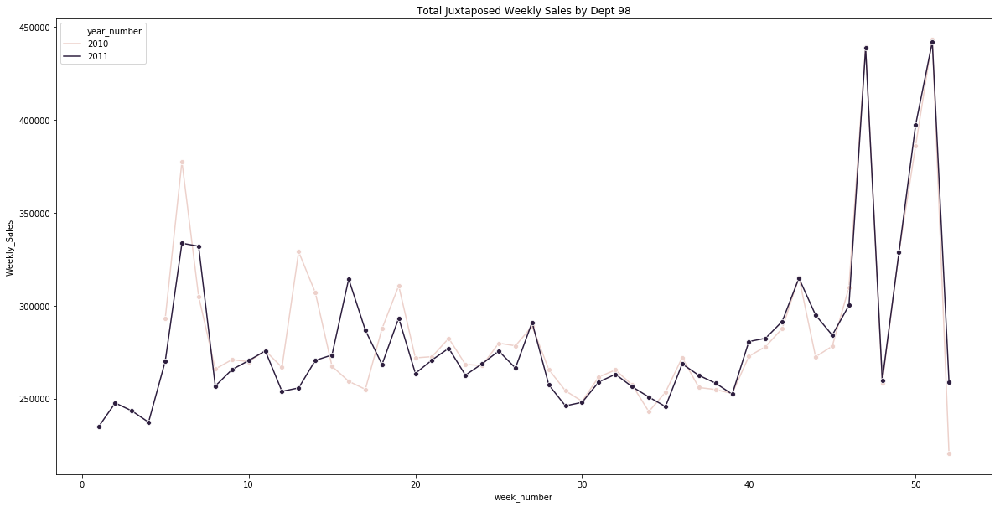

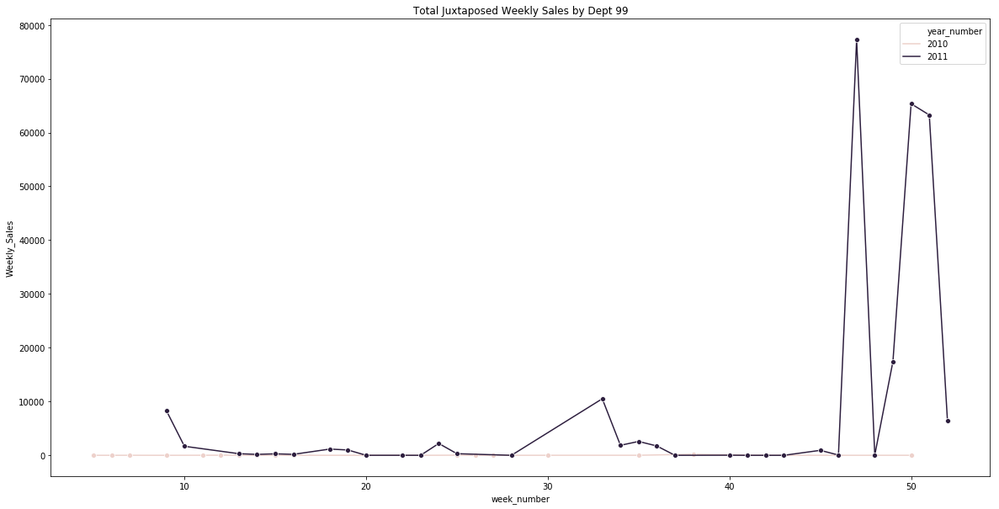

In [179]:
#Checking weekly Sales of different years juxtaposed..by Store and by Dept
for var in ['Store', 'Dept']:
    another_agg = combined_data_train.groupby([var, 'week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    for idd in another_agg[var].unique() :
        temper = another_agg.loc[ another_agg[var] == idd ]
        print(temper.shape)
        plt.figure(figsize=(20,10))
        plt.title('Total Juxtaposed Weekly Sales by ' + var + " " + idd)
        sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = temper, marker = 'o')


# Feature Creation

In [250]:
#marking the holiday names
conditions = [combined_data_train['IsHoliday'] == 0, combined_data_train['week_number'] == 52, combined_data_train['week_number'] == 47, \
             combined_data_train['week_number'] == 36, combined_data_train['week_number'] == 6]
choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
combined_data_train['holiday_type' ] = np.select(conditions, choices, default=np.nan)
combined_data_train['holiday_type'].value_counts()

C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64

In [ ]:
#function to create sales rush weeks 
def season_variables(df):
    df['week_number'] = df['Date2'].dt.week
    df['year_number'] = df['Date2'].dt.year
    conditions = [df['IsHoliday'] == 0, df['week_number'] == 52, df['week_number'] == 47, \
                 df['week_number'] == 36, df['week_number'] == 6]
    choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
    df['holiday_type' ] = np.select(conditions, choices, default=np.nan)
    print(df['holiday_type'].value_counts())
    christmas_df = pd.DataFrame(df[df['holiday_type'] == 'christmas' ]['Date2'].unique())
    christmas_df.columns = ['christmas_week']
    christmas_df['minus1'] = christmas_df['christmas_week'] -  pd.to_timedelta(7, unit='d')
    christmas_df['minus2'] = christmas_df['christmas_week'] -  pd.to_timedelta(14, unit='d')
    christmas_df['minus3'] = christmas_df['christmas_week'] -  pd.to_timedelta(21, unit='d')
    #creating all the 5 binary variables
    df['christmas_week'] = np.where(df['Date2'].isin(list(christmas_df['christmas_week']) ),1,0 )
    df['christmas_minus1'] = np.where(df['Date2'].isin(list(christmas_df['minus1']) ),1,0 )
    df['christmas_minus2'] = np.where(df['Date2'].isin(list(christmas_df['minus2']) ),1,0 )
    df['christmas_minus3'] = np.where(df['Date2'].isin(list(christmas_df['minus3']) ),1,0 )
    df['thanksgiving_week'] = np.where(df['holiday_type'] == 'thanksgiving', 1, 0)
    print(df['christmas_week'].value_counts())
    print(df['christmas_minus1'].value_counts())
    print(df['christmas_minus2'].value_counts())
    print(df['christmas_minus3'].value_counts())
    print(df['thanksgiving_week'].value_counts())
    return df

In [255]:
combined_data_train = season_variables(combined_data_train)

no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64
0    287295
1      5909
Name: christmas_week, dtype: int64
0    287234
1      5970
Name: christmas_minus1, dtype: int64
0    287251
1      5953
Name: christmas_minus2, dtype: int64
0    287266
1      5938
Name: christmas_minus3, dtype: int64
0    287258
1      5946
Name: thanksgiving_week, dtype: int64


In [256]:
combined_data_test = season_variables(combined_data_test)

C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] 

no_holiday    121057
super_bowl      2994
labor_day       2957
Name: holiday_type, dtype: int64


C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs

0    127008
Name: christmas_week, dtype: int64
0    127008
Name: christmas_minus1, dtype: int64
0    127008
Name: christmas_minus2, dtype: int64
0    127008
Name: christmas_minus3, dtype: int64
0    127008
Name: thanksgiving_week, dtype: int64


C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [260]:
#Creating another feature..Prediction based on Store and Dept
store_dept_median = combined_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Weekly_Sales' :  ['median']})
print(store_dept_median.shape)
store_dept_median.columns = ["_".join(x) for x in store_dept_median.columns.ravel()]
store_dept_median.columns = ['Store', 'Dept', 'Weekly_Sales_median']
print(store_dept_median.head())


(3292, 3)
  Store Dept  Weekly_Sales_median
0     1    1            18988.700
1     1   10            30870.720
2     1   11            23574.725
3     1   12            10607.065
4     1   13            37848.040


In [330]:
#Adding the feature into train and test data
print(combined_data_train.shape)
combined_data_train2 = pd.merge(combined_data_train, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_train2.shape)
print(combined_data_test.shape)
combined_data_test2 = pd.merge(combined_data_test, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_test2.shape)

(293204, 25)
(293204, 26)
(127008, 25)
(127008, 26)


In [331]:
#Filling the few missing values for new feature in test data with mean
combined_data_test2['Weekly_Sales_median'].fillna(combined_data_test2['Weekly_Sales_median'].mean() , inplace=True)

# Modeling

# Prediction 1

In [267]:
#Prediction based on Store, Dept and Week
simple_prediction = combined_data_train.groupby(['Store', 'Dept', 'week_number'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(simple_prediction.shape)
simple_prediction.columns = ["_".join(x) for x in simple_prediction.columns.ravel()]
simple_prediction = simple_prediction.drop(['Weekly_Sales_count'], axis=1)
simple_prediction.columns = ['Store', 'Dept', 'week_number', 'Sales_prediction']
simple_prediction['prediction_type'] = 1
simple_prediction.head()

(155979, 5)


,Store,Dept,week_number,Sales_prediction,prediction_type
0,1,1,1,15984.24,1
1,1,1,2,17359.70,1
2,1,1,3,17341.47,1
3,1,1,4,18461.18,1
4,1,1,5,23295.13,1


In [269]:
pd.merge(combined_data_test, simple_prediction, on = ['Store', 'Dept', 'week_number']).shape

(124366, 27)

In [270]:
#Prediction based on Dept..since previous prediction will miss required combinations..
#this is being done to provide approximation for sales in a dept irrespective of size 
moresimple_prediction = combined_data_train.groupby(['Dept'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(moresimple_prediction.shape)
moresimple_prediction.columns = ["_".join(x) for x in moresimple_prediction.columns.ravel()]
print(moresimple_prediction['Weekly_Sales_count'].describe())
moresimple_prediction = moresimple_prediction.drop(['Weekly_Sales_count'], axis=1)
moresimple_prediction.columns = ['Dept', 'Sales_prediction']
moresimple_prediction['prediction_type'] = 2
moresimple_prediction.head()

(81, 3)
count      81.000000
mean     3619.802469
std      1331.333180
min         6.000000
25%      3705.000000
50%      4115.000000
75%      4500.000000
max      4500.000000
Name: Weekly_Sales_count, dtype: float64


,Dept,Sales_prediction,prediction_type
0,1,19598.410840,2
1,10,18246.069967,2
2,11,14668.411385,2
3,12,4151.166962,2
4,13,30624.612680,2


In [271]:
#making sure there is no more than one entry for this combo
def score_direct(df_to_score, pred_df1, pred_df2):
    """
    We will use the 2 set of predictions made to estimate sales on the test data 
    """
    df_to_score['week_number'] =  df_to_score['Date2'].dt.week
    df_input = df_to_score[['Store', 'Dept', 'Date2',  'week_number']]
    print(df_input.shape)
    #checking if there is only 1 entry per combination being used to predict (i.e. Store, Dept, Week Number)
    print( df_input.groupby(['Store', 'Dept', 'week_number']).size().shape )
    #Using prediction1 and separate out combinations that remain unscored
    df_scored = pd.merge(df_input, pred_df1, on= ['Store', 'Dept', 'week_number'], how='left')
    df_present = df_scored[ pd.isnull(df_scored['prediction_type']) ==False ]
    df_missed =  df_scored[ pd.isnull(df_scored['prediction_type']) ]
    df_missed = df_missed.drop(['Sales_prediction', 'prediction_type'], axis=1)
    #using prediction2 to score the unscored test data
    df_missed_scored = pd.merge(df_missed, pred_df2, on= ['Dept'], how='left')
    print(df_missed_scored['prediction_type'].isna().sum())    
    #getting the scored test data in single DF
    df_full_scored = pd.concat( [df_present, df_missed_scored ] , axis=0)
    print(df_full_scored.shape)
    print(df_full_scored['prediction_type'].value_counts() )
    return df_full_scored

In [272]:
test_full_scored = score_direct(combined_data_test, simple_prediction, moresimple_prediction)

C:\Users\deven\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


(127008, 4)
(127008,)
0
(127008, 6)
1.0    124366
2.0      2642
Name: prediction_type, dtype: int64


# Prediction 2 - Random Forest Regression

In [332]:
#doing ohe of the categorical variables 
cat_columns = ['Type']
combined_data_train2 = pd.concat([combined_data_train2, pd.get_dummies(combined_data_train2[cat_columns], drop_first=True)], axis=1)
combined_data_test2 = pd.concat([combined_data_test2, pd.get_dummies(combined_data_test2[cat_columns], drop_first=True)], axis=1)

In [333]:
columnstodrop = ['Type' , 'Store', 'Dept', 'Date', 'Date2', 'Weekly_Sales', 'holiday_type', 'week_number', 'year_number']
X_train = combined_data_train2.drop(columnstodrop, axis = 1 )
X_test = combined_data_test2.drop(columnstodrop, axis = 1 )
print(X_train.shape)
print(X_test.shape)

(293204, 19)
(127008, 19)


In [334]:
#MarkDown4, 5  found to be over 60% correlated to other markdown variables
X_train = X_train.drop(['MarkDown4', 'MarkDown5'], axis = 1 )
X_test = X_test.drop(['MarkDown4', 'MarkDown5'], axis = 1 )


In [335]:
Y_train = combined_data_train2['Weekly_Sales']
Y_test = combined_data_test2['Weekly_Sales']
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [336]:
# RFR with hyper-parameter tuning
import time
aa = time.time()
rfr = RandomForestRegressor(random_state=42,  n_jobs = -1, max_depth = 5)#criterion = 'mse',
param_grid = { 
'n_estimators': [50, 100, 200]
}
CV_rfr = GridSearchCV(estimator = rfr, param_grid=param_grid, cv= 3)
CV_rfr.fit(X_train, Y_train)
rfr_best = CV_rfr.best_estimator_
print(rfr_best)
print(time.time() - aa)

RandomForestRegressor(max_depth=5, n_estimators=200, n_jobs=-1, random_state=42)
400.1462914943695


In [337]:
def get_FI(modelname, dfname):
    importance_list = pd.DataFrame(modelname.feature_importances_, columns=['importance'])
    varnames_list = pd.DataFrame(dfname.columns.tolist(), columns=['feature'])
    feature_importance = pd.concat([varnames_list, importance_list], axis=1, join_axes=[varnames_list.index])
    feature_importance = feature_importance.sort_values(by=['importance'], ascending=False)
    feature_importance['cum_importance'] = feature_importance['importance'].cumsum()
    return feature_importance

In [338]:
get_FI(rfr_best, X_train)

,feature,importance,cum_importance
14,Weekly_Sales_median,9.887667e-01,0.988767
10,christmas_minus1,6.642961e-03,0.995410
5,MarkDown3,2.713246e-03,0.998123
13,thanksgiving_week,1.440787e-03,0.999564
8,Size,2.606776e-04,0.999824
15,Type_B,7.955870e-05,0.999904
7,Unemployment,6.226944e-05,0.999966
1,Temperature,1.766254e-05,0.999984
3,MarkDown1,1.042452e-05,0.999994
6,CPI,5.580825e-06,1.000000


# Prediction 3 - ARIMA, another statistical technique

In [341]:
#Taking a example randomly to showcase ARIMA
particular_data = sales_data2.loc[(sales_data2['Store'] == '13') & (sales_data2['Dept'] == '17'), \
                                          ['Date', 'Weekly_Sales']   ]
particular_data['Date'] =  pd.to_datetime(particular_data['Date'])
particular_data.index = particular_data.Date
particular_data = particular_data.drop('Date', axis=1)
particular_data.head()

,Weekly_Sales
Date,
2010-02-05,22419.66
2010-02-12,21524.01
2010-02-19,23997.80
2010-02-26,22936.01
2010-03-05,21831.50


In [342]:
particular_data_train, particular_data_test  = particular_data[particular_data.index <= split_date],  particular_data[particular_data.index > split_date]
print(particular_data_train.shape)
print(particular_data_test.shape)

(100, 1)
(43, 1)


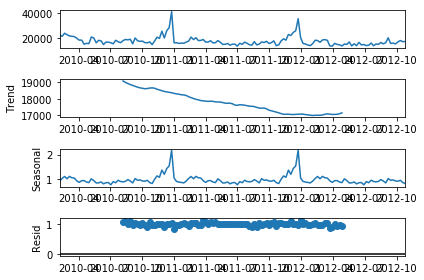

In [343]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(particular_data, model='multiplicative')
fig = result.plot()

In [344]:
from pandas.plotting import autocorrelation_plot

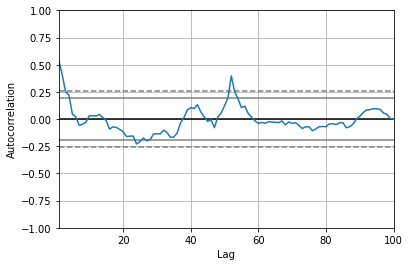

In [345]:
autocorrelation_plot(particular_data_train)

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  % freq, ValueWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:         D.Weekly_Sales   No. Observations:                   99
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -959.403
Method:                           css   S.D. of innovations           3912.767
Date:                Fri, 26 Jun 2020   AIC                           1922.806
Time:                        17:00:42   BIC                           1927.996
Sample:                    02-12-2010   HQIC                          1924.906
                         - 12-30-2011                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -18.3093    393.248     -0.047      0.963    -789.061     752.442


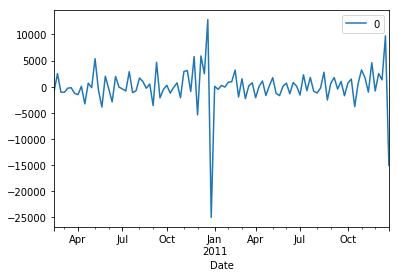

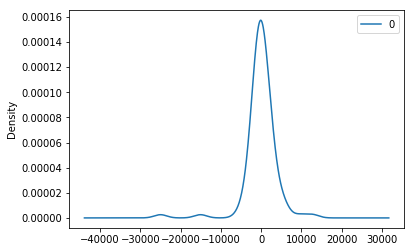

                  0
count  9.900000e+01
mean  -1.286154e-13
std    3.932679e+03
min   -2.496582e+04
25%   -1.112091e+03
50%    5.920929e+01
75%    1.480379e+03
max    1.281118e+04


In [346]:
#Running ARIMA model
from statsmodels.tsa.arima_model import ARIMA
# fit model
model = ARIMA(particular_data_train, order=(0,1,0))
model_fit = model.fit(disp=1)
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

In [348]:
# Install pyramid using
# pip install --user pmdarima
#Hyper Parameter Tuning of ARIMA model..No seasonality taken.
from pmdarima import auto_arima
auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,
                           max_p=3, max_q=3, m=1,
                           start_P=0, seasonal=False,
                           D=None, trace=True,
                           error_action='ignore'
                           )#suppress_warnings=True
auto_model.fit(particular_data_train)
print(auto_model)
test_arima = auto_model.predict(n_periods= len(particular_data_test))


Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1917.784, BIC=1928.204, Time=0.991 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1951.325, BIC=1956.535, Time=0.058 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.348, BIC=1926.163, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1931.343, BIC=1939.159, Time=0.115 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2255.538, BIC=2258.143, Time=0.027 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1918.023, BIC=1931.049, Time=0.296 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1919.181, BIC=1932.206, Time=0.096 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1923.564, BIC=1933.985, Time=0.049 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1916.061, BIC=1926.481, Time=0.047 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.013, BIC=1931.039, Time=0.088 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercep

In [349]:
sales_data_train = combined_data_train[['Store', 'Dept', 'Date2', 'Weekly_Sales']]
sales_data_test = combined_data_test[['Store', 'Dept', 'Date2', 'Weekly_Sales']]

In [353]:
#checking the number of records for each store, dept combination
temper = sales_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2': 'count' })
temper = temper.rename(columns= {'Date2' : 'counter'})
temper.head()
temper2 = temper.groupby(['counter'], as_index=False).agg({'Store': 'count' })
temper2

,counter,Store
0,1,40
1,2,40
2,3,21
3,4,29
4,5,14
5,6,14
6,7,16
7,8,10
8,9,11
9,10,7


In [354]:
temper.shape

(3292, 3)

In [359]:
from sklearn.metrics import mean_absolute_error

In [360]:
def arima_modeler(df_train, df_test):
    """
    Now we will create a function to create these models after hyper-parameter tuning for all the combinations of Store and Dept
    in the data    
    """
    combos_train = df_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' : {'min', 'max', 'count'} })
    print(combos_train.shape)
    combos_test = df_test.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' :  'count' })
    combos_test = combos_test[['Store', 'Dept']]
    print(combos_test.shape)
    combos_common = pd.merge(combos_train, combos_test, on = ['Store', 'Dept'])
    print(combos_common.shape)
    combos_common.columns = ["_".join(x) for x in combos_common.columns.ravel()]
    combos_common = combos_common.rename(columns = {'Store_' : 'Store', 'Dept_' : 'Dept'})
    combos_common['total_weeks'] = (combos_common['Date2_max'] - combos_common['Date2_min']).astype('timedelta64[D]')/7 + 1
    combos_common['date_gap'] = combos_common['total_weeks'] - combos_common['Date2_count']
    combos_common_nogap = combos_common.loc[combos_common['date_gap'] ==0 ]
    print(combos_common_nogap.shape)
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_max'] == split_date ]
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_count'] == 100 ]
    combos_common_nogap = combos_common_nogap.sort_values(by=['Store', 'Dept'])
    combos_common_nogap.reset_index(inplace=True)
    print(combos_common_nogap.shape)
    print(combos_common_nogap.head(10))
    
    sales_data_train_nogap = pd.merge(df_train, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_train_nogap.shape)
    sales_data_test_nogap = pd.merge(df_test, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_test_nogap.shape)#The remaining data cant be predicted

    sales_data_train_nogap = sales_data_train_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
    sales_data_test_nogap = sales_data_test_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
#     sales_data_test_nogap = sales_data_test_nogap[0:10000]
    
    #creating a DF that will store all the model outputs
    all_scores = pd.DataFrame(columns = ['score'])

    for i in range(len(combos_common_nogap)):#
        print(i)
        store_id = combos_common_nogap.loc[i]['Store']
        dept_id = combos_common_nogap.loc[i]['Dept']    
        print("Now the model for Store " + store_id + " and Dept " + dept_id + " will be created")
        particular_data_train = sales_data_train_nogap.loc[(sales_data_train_nogap['Store'] == store_id) & (sales_data_train_nogap['Dept'] == dept_id), \
                                              ['Date2', 'Weekly_Sales']   ]
        print(particular_data_train.shape)
        particular_data_test = sales_data_test_nogap.loc[(sales_data_test_nogap['Store'] == store_id) & (sales_data_test_nogap['Dept'] == dept_id), \
                                                  ['Date2', 'Weekly_Sales']   ]#, 'Weekly_Sales'
        print(particular_data_test.shape)
        #The date is required as index for ARIMA models
        particular_data_train.index = particular_data_train.Date2
        particular_data_test.index = particular_data_test.Date2

        particular_data_train = particular_data_train.drop('Date2', axis=1)
        particular_data_test = particular_data_test.drop('Date2', axis=1)
        
        #Hyper Parameter tuning
        auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,max_p=3, max_q=3, start_P=0, trace=True)
        auto_model.fit(particular_data_train)
        print(auto_model)
        test_arima = auto_model.predict(n_periods=len(particular_data_test))
        test_arima_df  = pd.DataFrame(test_arima, columns = ['score'] )
        #appending the new scores along with the scores already obtained
        all_scores = pd.concat([all_scores, test_arima_df], axis=0)
        all_scores = all_scores.reset_index()
        all_scores = all_scores.drop(['index'], axis=1)
        print(mean_absolute_error(particular_data_test, test_arima))
    
    #getting the model scores and actuals in one file for comparison
    sales_data_test2 = sales_data_test_nogap.reset_index()
    sales_data_test2 = sales_data_test2.drop(['index'], axis=1)
    print(sales_data_test2.head())
    test_data_scored = pd.concat([sales_data_test2, all_scores], axis=1)
    return test_data_scored

In [361]:
partialtest_scored_arima = arima_modeler(sales_data_train, sales_data_test)

(3292, 5)
(3196, 2)
(3165, 5)
(2704, 7)
(2654, 8)
   index Store Dept  Date2_max  Date2_min  Date2_count  total_weeks  date_gap
0      0     1    1 2011-12-30 2010-02-05          100        100.0       0.0
1      1     1   10 2011-12-30 2010-02-05          100        100.0       0.0
2      2     1   11 2011-12-30 2010-02-05          100        100.0       0.0
3      3     1   12 2011-12-30 2010-02-05          100        100.0       0.0
4      4     1   13 2011-12-30 2010-02-05          100        100.0       0.0
5      5     1   14 2011-12-30 2010-02-05          100        100.0       0.0
6      6     1   16 2011-12-30 2010-02-05          100        100.0       0.0
7      7     1   17 2011-12-30 2010-02-05          100        100.0       0.0
8      9     1   19 2011-12-30 2010-02-05          100        100.0       0.0
9     10     1    2 2011-12-30 2010-02-05          100        100.0       0.0


C:\Users\deven\Anaconda3\lib\site-packages\pandas\core\reshape\merge.py:522: UserWarning: merging between different levels can give an unintended result (2 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


(265400, 4)
(114020, 4)
0
Now the model for Store 1 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2086.124, BIC=2096.545, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2132.819, BIC=2138.029, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2093.937, BIC=2101.753, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2087.398, BIC=2095.214, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2312.076, BIC=2314.681, Time=0.014 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2088.278, BIC=2101.304, Time=0.258 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2086.511, BIC=2099.537, Time=0.100 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2084.936, BIC=2095.357, Time=0.050 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2086.462, BIC=2099.488, Time=0.076 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2089.764, BIC=2105.395, Time=0.127 seconds
Total fit time: 0.811 seconds
ARIMA(order=(0, 0, 2))
5475.19027383412
1
Now the model for Store 1 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.469, BIC=1882.889, Time=0.091 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1883.015, BIC=1888.225, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1872.033, BIC=1879.848, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.879, BIC=1882.694, Time=

(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1622.669, BIC=1633.089, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1650.382, BIC=1655.593, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1624.343, BIC=1632.158, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1633.579, BIC=1641.395, Time=0.122 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1948.088, BIC=1950.693, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1623.750, BIC=1636.776, Time=0.084 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1624.454, BIC=1637.480, Time=0.095 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1629.295, BIC=1639.716, Time=0.233 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1622.415, BIC=1632.835, Time=0.051 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1622.938, BIC=1635.964, Time=0.074 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1268.971, BIC=1281.997, Time=0.371 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1271.686, BIC=1282.107, Time=0.178 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1266.928, BIC=1282.559, Time=0.450 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1268.857, BIC=1281.883, Time=0.384 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1263.639, BIC=1281.875, Time=0.659 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1269.229, BIC=1284.860, Time=0.485 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1266.469, BIC=1287.310, Time=0.662 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1270.839, BIC=1289.075, Time=0.588 seconds
Total fit time: 4.301 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 2))
274.68645764632834
19
Now the model for Store 1 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1740.954, BIC=1751.375, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1780.757, BIC=1785.967, Time=0.028 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1739.545, BIC=1747.361, Time=0.109 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1754.599, BIC=1762.414, Time=0.142 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1995.841, BIC=1998.446, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1740.195, BIC=1750.616, Time=0.123 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1741.738, BIC=1754.764, Time=0.139 seconds
Total fit time: 0.662 seconds
ARIMA(order=(1, 0, 0))
1115.7229162612985
20
Now the model for Store 1 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1549.215, BIC=1559.636, Time=0.335 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1624.589, BIC=1629.799, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1558.689, BIC=1566.505, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1595.144, BIC=1602.960, Time=0.151 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1925.901, BIC=1928.506, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1546.201, BIC=1559.227, Time=0.275 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1546.310, BIC=1556.730, Time=0.092 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1548.201, BIC=1563.832, Time=0.312 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1548.495, BIC=1564.126, Time=0.331 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1549.416, BIC=1562.442, Time=0.172 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1547.398, BIC=1560.424, Time=0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



23
Now the model for Store 1 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1998.306, BIC=2008.726, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2013.737, BIC=2018.947, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1996.263, BIC=2004.078, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2000.340, BIC=2008.156, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2133.624, BIC=2136.230, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1998.253, BIC=2008.674, Time=0.050 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2000.235, BIC=2013.261, Time=0.105 seconds
Total fit time: 0.299 seconds
ARIMA(order=(1, 0, 0))
2718.16444778529
24
Now the model for Store 1 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1583.408, BIC=1591.223, Time=0.094 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1741.517, BIC=1744.123, Time=0.018 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1578.442, BIC=1588.862, Time=0.170 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1580.230, BIC=1593.256, Time=0.183 seconds
Total fit time: 0.549 seconds
ARIMA(order=(1, 0, 0))

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



658.7991243345332
33
Now the model for Store 1 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1623.362, BIC=1633.783, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1634.048, BIC=1639.258, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1627.624, BIC=1635.439, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1631.669, BIC=1639.484, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2081.603, BIC=2084.208, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1613.388, BIC=1626.414, Time=0.181 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1611.625, BIC=1622.045, Time=0.067 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1613.396, BIC=1626.422, Time=0.085 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1615.351, BIC=1630.983, Time=0.157 seconds
Total fit time: 0.667 seconds
ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2007.973, BIC=2023.604, Time=0.190 seconds
Total fit time: 0.625 seconds
ARIMA(order=(1, 0, 1))
5508.602982536015
40
Now the model for Store 1 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1767.301, BIC=1777.722, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1951.380, BIC=1956.591, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1765.354, BIC=1773.170, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.679, BIC=1880.494, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2013.207, BIC=2015.812, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1767.186, BIC=1777.607, Time=0.049 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1767.700, BIC=1780.726, Time=0.165 seconds
Total fit time: 0.443 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
3080.812031360146
41
Now the model for Store 1 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1753.232, BIC=1763.652, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1753.210, BIC=1758.420, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1752.381, BIC=1760.197, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.569, BIC=1760.384, Time=0.033 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1933.144, BIC=1935.749, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1753.608, BIC=1764.028, Time=0.053 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1754.588, BIC=1767.614, Time=0.098 seconds
Total fit time: 0.335 seconds
ARIMA(order=(1, 0, 0))
1339.3344279984021
42
Now the model for Store 1 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2003.764, BIC=2014.185, Time=0.223 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1999.739, BIC=2004.949, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2000.486, BIC=2008.302, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1996.674, BIC=2004.490, Time=0.033 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2371.365, BIC=2373.971, Time=0.010 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1993.918, BIC=2004.338, Time=0.056 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1996.395, BIC=2009.420, Time=0.389 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1986.200, BIC=1999.226, Time=0.139 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1987.737, BIC=2003.368, Time=0.294 seconds
Total fit time: 1.201 seconds
ARIMA(order=(0, 0, 3))
4919.172203017482
51
Now the model for Store 1 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1776.957, BIC=1787.377, Time=0.044 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1778.776, BIC=1791.802, Time=0.161 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1780.749, BIC=1796.380, Time=0.266 seconds
Total fit time: 0.785 seconds
ARIMA(order=(2, 0, 0))
3223.4415662136885
53
Now the model for Store 1 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1764.363, BIC=1774.784, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1760.787, BIC=1765.998, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1762.669, BIC=1770.484, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.458, BIC=1770.274, Time=0.103 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2342.361, BIC=2344.966, Time=0.011 seconds
Total fit time: 0.249 seconds
ARIMA(order=(0, 0, 0))
2130.075511627904
54


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.748, BIC=1670.774, Time=0.150 seconds
Total fit time: 0.456 seconds
ARIMA(order=(1, 0, 0))
898.2954124855161
57
Now the model for Store 1 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2054.969, BIC=2065.390, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2107.031, BIC=2112.241, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2060.225, BIC=2068.041, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2084.370, BIC=2092.186, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2425.550, BIC=2428.155, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2055.983, BIC=2069.009, Time=0.080 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2059.044, BIC=2072.070, Time=0.102 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2065.295, BIC=2075.716, Ti

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2052.324, BIC=2067.955, Time=0.627 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.100 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
8329.194299290222
58
Now the model for Store 1 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2064.052, BIC=2074.472, Time=0.075 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2094.731, BIC=2099.941, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2062.624, BIC=2070.439, Time=0.051 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2072.242, BIC=2080.058, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2338.465, BIC=2341.070, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2064.082, BIC=2074.503, Time=0.064 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2065.757, BIC=2078.783, Time=0.137 seconds
Total fit time: 0.414 seconds
ARIMA(order=(1, 0, 0))
6806.437179154451
59
Now the model for Store 1 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2059.393, BIC=2075.024, Time=0.485 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2048.807, BIC=2067.043, Time=0.368 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2065.532, BIC=2081.163, Time=0.158 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2047.950, BIC=2068.792, Time=0.467 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2057.643, BIC=2075.879, Time=0.338 seconds
Total fit time: 2.605 seconds
ARIMA(order=(3, 0, 3))
4736.549226426246
60
Now the model for Store 1 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2013.233, BIC=2023.653, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2015.393, BIC=2020.603, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2014.976, BIC=2022.791, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2004.817, BIC=2012.632, Tim

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2026.435, BIC=2042.066, Time=0.479 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2019.460, BIC=2037.696, Time=0.253 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2029.323, BIC=2044.954, Time=0.177 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2019.820, BIC=2040.661, Time=0.352 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2023.848, BIC=2042.084, Time=0.186 seconds
Total fit time: 1.899 seconds
ARIMA(order=(3, 0, 2))
3599.722190923229
64
Now the model for Store 1 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2093.591, BIC=2104.011, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2126.628, BIC=2131.839, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2091.619, BIC=2099.434, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.286, BIC=2108.101, Tim

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2095.583, BIC=2108.609, Time=0.202 seconds
Total fit time: 0.390 seconds
ARIMA(order=(1, 0, 0))
9777.639904721109
65
Now the model for Store 1 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1898.966, BIC=1909.387, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1909.915, BIC=1915.125, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1903.498, BIC=1911.314, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1896.786, BIC=1904.601, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2377.405, BIC=2380.011, Time=0.013 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1899.131, BIC=1909.552, Time=0.074 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1900.513, BIC=1913.539, Time=0.165 seconds
Total fit time: 0.408 seconds
ARIMA(order=(0, 0, 1))
3013.803296067647
66
N

Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2153.856, BIC=2169.487, Time=0.154 seconds
Total fit time: 0.572 seconds
ARIMA(order=(2, 0, 0))
6169.310635523979
73
Now the model for Store 10 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1979.005, BIC=1989.426, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2223.076, BIC=2228.286, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1978.742, BIC=1986.557, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2166.129, BIC=2173.945, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2368.302, BIC=2370.907, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1978.163, BIC=1988.584, Time=0.057 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1977.929, BIC=1990.954, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1959.170, BIC=1974.801, Time=0.680 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.251, BIC=1991.277, Time=0.116 seconds
Total fit time: 1.159 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 1))
5593.761138576148
74
Now the model for Store 10 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1952.876, BIC=1963.297, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1978.227, BIC=1983.438, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1953.994, BIC=1961.809, Time=0.087 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.075, BIC=1971.891, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2331.010, BIC=2333.615, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1951.696, BIC=1964.722, Time=0.090 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1949.776, BIC=1960.197, Time=0.058 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1951.788, BIC=1964.814, Time=0.085 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1953.597, BIC=1969.228, Time=0.168 seconds
Total fit ti

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.089, BIC=1820.114, Time=0.306 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.873, BIC=1823.504, Time=0.141 seconds
Total fit time: 0.802 seconds
ARIMA(order=(2, 0, 0))
1446.8327175322665
78
Now the model for Store 10 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1788.015, BIC=1798.436, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1808.832, BIC=1814.042, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1786.614, BIC=1794.429, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.557, BIC=1801.372, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2131.458, BIC=2134.063, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1787.515, BIC=1797.936, Time=0.054 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1789.535, BIC=1802.561, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2015.326, BIC=2028.352, Time=0.101 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2016.165, BIC=2031.796, Time=0.260 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2015.113, BIC=2030.744, Time=0.249 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2019.127, BIC=2032.153, Time=0.084 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2015.264, BIC=2033.500, Time=0.269 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2013.824, BIC=2032.061, Time=0.163 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2020.905, BIC=2036.536, Time=0.101 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2015.691, BIC=2036.532, Time=0.247 seconds
Total fit time: 1.648 seconds
ARIMA(order=(2, 0, 3))
4975.771116564018
82
Now the model for Store 10 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.206, BIC=1911.627, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1921.452, BIC=1926.662, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.014, BIC=1907.829, Time=0.106 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1908.268, BIC=1916.083, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2282.885, BIC=2285.490, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1764.296, BIC=1777.322, Time=0.088 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1768.860, BIC=1779.281, Time=0.173 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1762.229, BIC=1772.650, Time=0.057 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1762.958, BIC=1775.984, Time=0.082 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1764.965, BIC=1780.596, Time=0.187 seconds
Total fit time: 0.995 seconds
ARIMA(order=(2, 0, 0))
2067.6363606220175
90
Now the model for Store 10 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2129.197, BIC=2139.618, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2150.385, BIC=2155.596, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2127.474, BIC=2135.290, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2130.396, BIC=2138.212, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2008.934, BIC=2024.565, Time=0.283 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2014.353, BIC=2027.379, Time=0.083 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2009.388, BIC=2027.624, Time=0.339 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2007.434, BIC=2025.670, Time=0.163 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2014.338, BIC=2029.969, Time=0.130 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2008.806, BIC=2029.648, Time=0.312 seconds
Total fit time: 1.961 seconds
ARIMA(order=(2, 0, 3))
5043.840555605132
92
Now the model for Store 10 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2040.905, BIC=2051.326, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2072.130, BIC=2077.340, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2040.839, BIC=2048.654, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2055.663, BIC=2063.479, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2428.516, BIC=2431.122, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2034.589, BIC=2050.220, Time=0.341 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2040.922, BIC=2053.948, Time=0.090 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2035.102, BIC=2053.338, Time=0.414 seconds
Total fit time: 1.691 seconds
ARIMA(order=(2, 0, 1))
5637.392986500184
93
Now the model for Store 10 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1736.520, BIC=1746.941, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1782.990, BIC=1788.200, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1739.569, BIC=1747.385, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1759.750, BIC=1767.566, Time=0.114 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2094.777, BIC=2097.382, Time=0.018 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1734.910, BIC=1747.936, Time=0.112 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1733.220, BIC=1743.640, Time=0.048 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1734.854, BIC=1747.880, T

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1777.818, BIC=1785.634, Time=0.144 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2113.356, BIC=2115.961, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1756.233, BIC=1766.654, Time=0.131 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1757.777, BIC=1770.802, Time=0.206 seconds
Total fit time: 0.641 seconds
ARIMA(order=(1, 0, 0))
884.4610648531366
102
Now the model for Store 10 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2089.736, BIC=2100.157, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2119.555, BIC=2124.765, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2087.783, BIC=2095.599, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2096.396, BIC=2104.212, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2472.612, BIC=2475.217,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1650.058, BIC=1665.689, Time=0.528 seconds
Total fit time: 1.457 seconds
ARIMA(order=(1, 0, 1))
1408.9131557673766
104
Now the model for Store 10 and Dept 49 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1855.343, BIC=1865.764, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1875.774, BIC=1880.984, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1859.479, BIC=1867.295, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1866.494, BIC=1874.309, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2262.901, BIC=2265.506, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.884, BIC=1866.910, Time=0.118 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1853.236, BIC=1863.657, Time=0.092 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1851.537, BIC=1864.563,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2186.457, BIC=2202.088, Time=0.332 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2192.090, BIC=2205.116, Time=0.102 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2189.819, BIC=2202.844, Time=0.087 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2186.491, BIC=2204.728, Time=0.309 seconds
Total fit time: 1.346 seconds
ARIMA(order=(2, 0, 1))
8029.339079387495
109
Now the model for Store 10 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1573.753, BIC=1584.173, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1667.286, BIC=1672.496, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1578.481, BIC=1586.297, Time=0.099 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1622.788, BIC=1630.604, Time=0.107 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1747.472, BIC=1750.077, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1574.218, BIC=1587.244, Time=0.099 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1573.543, BIC=1586.569, Time=0.253 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1601.523, BIC=1611.943, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1940.893, BIC=1953.918, Time=0.079 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1946.643, BIC=1957.064, Time=0.097 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1939.656, BIC=1950.077, Time=0.040 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1940.561, BIC=1953.586, Time=0.077 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1942.584, BIC=1958.215, Time=0.178 seconds
Total fit time: 0.714 seconds
ARIMA(order=(2, 0, 0))
2518.5769005721045
112
Now the model for Store 10 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2052.546, BIC=2062.967, Time=0.079 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2057.992, BIC=2063.202, Time=0.026 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2050.768, BIC=2058.583, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2052.141, BIC=2059.957, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1869.748, BIC=1885.379, Time=0.302 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1873.283, BIC=1886.308, Time=0.128 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1871.506, BIC=1889.742, Time=0.476 seconds
Total fit time: 1.866 seconds
ARIMA(order=(2, 0, 1))
2630.4315129438733
116
Now the model for Store 10 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2557.422, BIC=2567.843, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2558.236, BIC=2563.446, Time=0.038 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2556.462, BIC=2564.277, Time=0.060 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2557.365, BIC=2565.180, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2700.442, BIC=2703.047, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2557.102, BIC=2567.522, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2558.570, BIC=2571.596, Time=0.077 seconds
Total fit time: 0.338 seconds
ARIMA(order=(1, 0, 0))
40798.56286923061
1

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1649.297, BIC=1657.113, Time=0.166 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1899.372, BIC=1901.977, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1645.856, BIC=1656.277, Time=0.066 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1647.797, BIC=1660.823, Time=0.073 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1647.926, BIC=1660.952, Time=0.124 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1649.821, BIC=1665.452, Time=0.176 seconds
Total fit time: 0.735 seconds
ARIMA(order=(2, 0, 0))
323.84438042714066
125
Now the model for Store 10 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.767, BIC=1832.188, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.347, BIC=1871.557, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.191, BIC=1841.006,

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1468.389, BIC=1478.810, Time=0.080 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1507.844, BIC=1513.055, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1468.925, BIC=1476.741, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1484.075, BIC=1491.891, Time=0.093 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2005.714, BIC=2008.319, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1469.976, BIC=1483.001, Time=0.121 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1467.535, BIC=1480.561, Time=0.143 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1465.952, BIC=1476.373, Time=0.286 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1467.248, BIC=1480.274, Time=0.408 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1469.068, BIC=1484.699, Time=0.225 seconds
Total fit time: 1.4

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1928.398, BIC=1941.424, Time=0.147 seconds
Total fit time: 0.432 seconds
ARIMA(order=(1, 0, 0))
7873.31125720061
141
Now the model for Store 11 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1831.139, BIC=1841.560, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1867.474, BIC=1872.684, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1829.413, BIC=1837.228, Time=0.118 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1841.145, BIC=1848.961, Time=0.101 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2191.462, BIC=2194.067, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1830.791, BIC=1841.212, Time=0.062 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.768, BIC=1845.793, Time=0.096 seconds
Total fit time: 0.473 seconds
ARIMA(order=(1, 0, 0))
1678.9845955384899
14

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1891.763, BIC=1904.789, Time=0.592 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.448, BIC=1909.079, Time=0.226 seconds
Total fit time: 1.116 seconds
ARIMA(order=(2, 0, 0))
1807.8272033711253
148
Now the model for Store 11 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1784.324, BIC=1794.745, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.585, BIC=1806.795, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1783.016, BIC=1790.831, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1787.239, BIC=1795.055, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2150.712, BIC=2153.317, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.379, BIC=1794.800, Time=0.050 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1786.173, BIC=1799.199,

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1852.063, BIC=1862.484, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1889.685, BIC=1894.895, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1851.432, BIC=1859.247, Time=0.078 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1857.396, BIC=1865.211, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2107.788, BIC=2110.393, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1851.537, BIC=1861.958, Time=0.059 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.578, BIC=1866.603, Time=0.094 seconds
Total fit time: 0.398 seconds
ARIMA(order=(1, 0, 0))
1985.1060924842336
158
Now the model for Store 11 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1892.904, BIC=1903.325, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1928.186, BIC=1933.396,

(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1540.749, BIC=1551.169, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1557.377, BIC=1562.587, Time=0.007 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1546.404, BIC=1554.220, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1551.938, BIC=1559.753, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2023.834, BIC=2026.439, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1535.095, BIC=1548.121, Time=0.169 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1534.303, BIC=1544.724, Time=0.071 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1534.684, BIC=1547.710, Time=0.092 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1536.488, BIC=1552.119, Time=0.144 seconds
Total fit time: 0.678 seconds
ARIMA(order=(2, 0, 0))
808.1892619219357
167
Now the model for Store 11 and Dept 44 will b

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1563.308, BIC=1576.334, Time=0.314 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1563.643, BIC=1576.669, Time=0.067 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1598.697, BIC=1609.117, Time=0.179 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1571.538, BIC=1581.959, Time=0.087 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1562.399, BIC=1578.030, Time=0.545 seconds
Total fit time: 1.729 seconds
ARIMA(order=(1, 0, 1))
361.38341628715415
172
Now the model for Store 11 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2037.142, BIC=2047.562, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2069.709, BIC=2074.920, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2037.779, BIC=2045.594, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2051.896, BIC=2059.712, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2219.810, BIC=2222.415, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2038.479, BIC=2051.505, Time=0.071 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2039.792, BIC=2052.818, Time=0.074 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2042.972, BIC=2053.393,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1803.179, BIC=1818.810, Time=0.190 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.570 seconds
ARIMA(order=(1, 0, 1))
1703.2546496362122
175
Now the model for Store 11 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1844.461, BIC=1854.882, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1894.959, BIC=1900.170, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1847.329, BIC=1855.144, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1850.787, BIC=1858.602, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1910.575, BIC=1913.180, Time=0.005 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1846.452, BIC=1859.478, Time=0.086 seconds
Fit AR

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1861.909, BIC=1874.935, Time=0.072 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.906, BIC=1879.537, Time=0.121 seconds
Total fit time: 0.481 seconds
ARIMA(order=(2, 0, 0))
1881.3680272396798
184
Now the model for Store 11 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1663.417, BIC=1673.837, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1690.266, BIC=1695.477, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1661.591, BIC=1669.406, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1664.456, BIC=1672.271, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2180.527, BIC=2183.132, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1663.153, BIC=1673.573, Time=0.062 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.567, BIC=1678.593,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1526.247, BIC=1539.273, Time=0.321 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1524.100, BIC=1537.126, Time=0.093 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1518.841, BIC=1529.261, Time=0.164 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1519.460, BIC=1532.485, Time=0.292 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1522.630, BIC=1538.261, Time=0.135 seconds
Total fit time: 1.355 seconds
ARIMA(order=(0, 0, 2))
514.6107888450254
188
Now the model for Store 11 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1518.995, BIC=1529.416, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1553.681, BIC=1558.891, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1516.946, BIC=1524.762, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1526.407, BIC=1534.222, T

(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1997.666, BIC=2008.086, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2033.725, BIC=2038.935, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1996.998, BIC=2004.813, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2011.412, BIC=2019.228, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2536.513, BIC=2539.118, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1998.426, BIC=2008.846, Time=0.058 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1998.795, BIC=2011.821, Time=0.210 seconds
Total fit time: 0.415 seconds
ARIMA(order=(1, 0, 0))
5594.526935082624
197
Now the model for Store 11 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1888.478, BIC=1898.899, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1817.978, BIC=1831.003, Time=0.218 seconds
Total fit time: 0.484 seconds
ARIMA(order=(1, 0, 0))
1686.999919479665
200
Now the model for Store 12 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2083.614, BIC=2094.035, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2116.038, BIC=2121.248, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2086.172, BIC=2093.987, Time=0.062 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2082.967, BIC=2090.782, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2265.312, BIC=2267.917, Time=0.009 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2082.569, BIC=2092.990, Time=0.046 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2084.259, BIC=2097.285, Time=0.073 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2084.261, BIC=2097.287, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1760.537, BIC=1776.168, Time=0.664 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1765.805, BIC=1784.041, Time=0.676 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1768.292, BIC=1786.529, Time=0.203 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1770.366, BIC=1785.997, Time=0.165 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1773.342, BIC=1788.973, Time=0.169 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1767.726, BIC=1788.567, Time=0.474 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.014 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
3290.485013359326
207
Now the model for Store 12 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1759.704, BIC=1770.125, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1807.608, BIC=1812.818, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1759.303, BIC=1767.118, Time=0.083 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1777.911, BIC=1785.726, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2160.617, BIC=2163.222, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1759.445, BIC=1769.866, Time=0.055 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1761.238, BIC=1774.264, Time=0.091 seconds
Total fit time: 0.389 seconds
ARIMA(order=(1, 0, 0))
1431.9286643248258
208
Now the model for Store 12 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1872.550, BIC=1882.971, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.563, BIC=1887.588, Time=0.106 seconds
Total fit time: 0.345 seconds
ARIMA(order=(1, 0, 0))
2583.924587030356
216
Now the model for Store 12 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1880.600, BIC=1891.020, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1908.584, BIC=1913.794, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1884.559, BIC=1892.375, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1894.360, BIC=1902.175, Time=0.105 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2201.275, BIC=2203.880, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1880.652, BIC=1893.678, Time=0.057 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1882.046, BIC=1895.072, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1789.415, BIC=1805.046, Time=0.443 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 0.969 seconds
ARIMA(order=(1, 0, 1))
1072.4969212599087
220
Now the model for Store 12 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2081.165, BIC=2091.586, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2190.774, BIC=2195.985, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2099.431, BIC=2107.247, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2108.710, BIC=2116.525, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2282.754, BIC=2285.359, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2083.356, BIC=2096.382, Time=0.069 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1737.311, BIC=1750.337, Time=0.168 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1738.400, BIC=1754.031, Time=0.177 seconds
Total fit time: 0.818 seconds
ARIMA(order=(2, 0, 0))
1235.9492916395259
223
Now the model for Store 12 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1981.666, BIC=1992.087, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1992.160, BIC=1997.370, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1979.278, BIC=1987.093, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1982.119, BIC=1989.934, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2146.651, BIC=2149.257, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1981.258, BIC=1991.678, Time=0.067 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1983.659, BIC=1996.685,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1523.857, BIC=1539.488, Time=0.463 seconds
Total fit time: 1.717 seconds
ARIMA(order=(1, 0, 1))
912.5896959449858
232
Now the model for Store 12 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1516.938, BIC=1527.359, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1571.160, BIC=1576.370, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1526.917, BIC=1534.733, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1546.015, BIC=1553.831, Time=0.121 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2014.082, BIC=2016.687, Time=0.005 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1517.115, BIC=1530.141, Time=0.106 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1511.850, BIC=1524.876, Time=0.220 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1537.009, BIC=1547.429, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1510.631, BIC=1526.262, Time=0.636 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1512.649, BIC=1530.886, Time=0.652 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1511.822, BIC=1530.058, Time=0.365 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1511.550, BIC=1527.181, Time=0.116 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1516.134, BIC=1531.765, Time=0.170 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1510.875, BIC=1531.717, Time=0.606 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 3.237 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
912.8120799453657
233
Now the model for Store 12 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1695.722, BIC=1706.143, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1744.309, BIC=1749.520, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1695.326, BIC=1703.142, Time=0.085 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1716.157, BIC=1723.972, Time=0.094 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2051.565, BIC=2054.170, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1694.808, BIC=1705.229, Time=0.054 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1696.140, BIC=1709.166, Time=0.109 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1694.048, BIC=1707.074, Time=0.159 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1696.037, BIC=1711.668, Time=0.263 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1695.077, BIC=1710.708, Time=0.247 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1697.445, BIC=1710.471, Time=0.080 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1695.251, BIC=1713.487, Time=0.323 seconds
Total fit time: 1.485 seconds
ARIMA(order=(2, 0, 1))
805.4472851387268
234
Now the model for Store 12 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1966.030, BIC=1976.450, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2022.432, BIC=2027.642, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1964.074, BIC=1971.890, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1982.445, BIC=1990.261, Time=0.022 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2361.625, BIC=2364.230, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1965.947, BIC=1976.367, Time=0.086 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1968.007, BIC=1981.033, Time=0.091 seconds
Total fit time: 0.309 seconds
ARIMA(order=(1, 0, 0))
4577.196134697616
23

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1530.190, BIC=1545.821, Time=0.562 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1531.595, BIC=1549.831, Time=0.701 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1529.624, BIC=1547.860, Time=0.438 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1531.003, BIC=1546.634, Time=0.119 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1531.323, BIC=1552.165, Time=0.468 seconds
Total fit time: 2.991 seconds
ARIMA(order=(2, 0, 3))
815.6282199269954
239
Now the model for Store 12 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1830.200, BIC=1840.621, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.379, BIC=1904.590, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1836.474, BIC=1844.289, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1843.365, BIC=1851.180, Time=0.101 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1921.400, BIC=1924.006, 

Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2419.150, BIC=2421.755, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1871.330, BIC=1884.356, Time=0.089 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1869.378, BIC=1879.799, Time=0.068 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1870.520, BIC=1883.546, Time=0.114 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.828, BIC=1888.459, Time=0.154 seconds
Total fit time: 0.628 seconds
ARIMA(order=(2, 0, 0))
2870.9928975481157
248
Now the model for Store 12 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1804.423, BIC=1814.844, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1821.033, BIC=1826.244, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1805.911, BIC=1813.727, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1811.676, BIC=1819.492, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1510.832, BIC=1518.648, Time=0.144 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1535.728, BIC=1543.543, Time=0.141 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2063.538, BIC=2066.143, Time=0.005 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1508.154, BIC=1521.180, Time=0.133 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1506.895, BIC=1519.921, Time=0.240 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1524.670, BIC=1535.091, Time=0.249 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1504.573, BIC=1520.204, Time=0.450 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1506.927, BIC=1525.163, Time=0.503 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1508.422, BIC=1526.658, Time=0.525 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1511.507, BIC=1527.138, Time=0.337 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1507.591, BIC=1523.222, Time=0.172 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1501.962, BIC=1522.804, Time=0.570 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.549 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
483.1932390958506
250
Now the model for Store 12 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.314, BIC=1882.734, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1924.916, BIC=1930.127, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1870.304, BIC=1878.119, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1887.364, BIC=1895.180, Time=0.152 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2213.702, BIC=2216.307, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1872.276, BIC=1882.696, Time=0.071 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.313, BIC=1887.339, Time=0.130 seconds
Total fit time: 0.514 seconds
ARIMA(order=(1, 0, 0))
1590.7240922172412
251
Now the model for Store 12 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1549.527, BIC=1567.763, Time=0.714 seconds
Total fit time: 2.332 seconds
ARIMA(order=(1, 0, 2))
665.0971394828398
256
Now the model for Store 12 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1575.503, BIC=1585.923, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1660.489, BIC=1665.700, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1581.331, BIC=1589.147, Time=0.065 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1620.576, BIC=1628.391, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2047.674, BIC=2050.280, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1577.173, BIC=1590.199, Time=0.162 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1576.756, BIC=1589.782, Time=0.074 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1585.970, BIC=1596.390, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1814.355, BIC=1829.986, Time=0.476 seconds
Total fit time: 1.130 seconds
ARIMA(order=(1, 0, 1))
2777.01053634218
258
Now the model for Store 12 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1240.532, BIC=1250.953, Time=0.244 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1287.905, BIC=1293.115, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1249.956, BIC=1257.771, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1264.287, BIC=1272.103, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1539.845, BIC=1542.450, Time=0.008 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1242.425, BIC=1255.451, Time=0.305 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1242.357, BIC=1255.383, Time=0.357 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1256.557, BIC=1266.977, Time=0.194 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1247.625, BIC=1258.046, Time=0.097 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1244.246, BIC=1259.877, Time=0.442 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 1.763 seconds
ARIMA(order=(1, 0, 1))
139.92547939942705
259
Now the model for Store 12 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1900.451, BIC=1910.872, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2030.944, BIC=2036.154, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1901.250, BIC=1909.066, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1966.906, BIC=1974.721, Time=0.111 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2423.174, BIC=2425.779, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.319, BIC=1915.345, Time=0.080 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1304.723, BIC=1315.143, Time=0.260 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1341.249, BIC=1346.460, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1305.922, BIC=1313.738, Time=0.067 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1312.072, BIC=1319.887, Time=0.115 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1624.317, BIC=1626.922, Time=0.011 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1308.345, BIC=1321.371, Time=0.200 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1304.442, BIC=1317.468, Time=0.401 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1312.096, BIC=1322.516, Time=0.202 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1306.006, BIC=1321.637, Time=0.270 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1304.851, BIC=1320.482, Time=0.093 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1308.673, BIC=1321.699, Time=0.296 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1306.942, BIC=1325.178, Time=0.143 seconds
Total fit time: 2.081 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 2))
257.937287294046
262
Now the model for Store 13 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2318.354, BIC=2328.774, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2349.732, BIC=2354.942, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2321.358, BIC=2329.174, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2318.392, BIC=2326.207, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2474.526, BIC=2477.131, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2318.079, BIC=2331.105, Time=0.184 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2316.057, BIC=2326.477, Time=0.078 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2317.937, BIC=2330.963, Time=0.091 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2319.933, BIC=2335.564, Time=0.191 seconds
Total fit time: 0.666 seconds
ARIMA(order=(2, 0, 0))
14890.206356117418
263
Now the model for Store 13 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1959.040, BIC=1969.461, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1982.644, BIC=1987.854, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1963.460, BIC=1971.276, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1973.150, BIC=1980.965, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2343.870, BIC=2346.475, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1956.051, BIC=1969.077,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2049.119, BIC=2062.145, Time=0.208 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 0.432 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(2, 0, 1))
17129.72204425467
269
Now the model for Store 13 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1917.784, BIC=1928.204, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1951.325, BIC=1956.535, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.348, BIC=1926.163, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1931.343, BIC=1939.159, Time=0.098 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2255.538, BIC=2258.143, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1918.023, BIC=1931.049, Time=0.102 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1919.181, BIC=1932.206, Time=0.094 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1923.564, BIC=1933.985, Time=0.044 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1916.061, BIC=1926.481, Time=0.043 seconds
Fit ARIMA(3

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1955.427, BIC=1971.058, Time=0.204 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1958.140, BIC=1971.165, Time=0.091 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1956.911, BIC=1969.937, Time=0.086 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1954.853, BIC=1973.089, Time=0.291 seconds
Total fit time: 1.239 seconds
ARIMA(order=(2, 0, 1))
2573.5094636506346
277
Now the model for Store 13 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1920.866, BIC=1931.286, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1934.282, BIC=1939.493, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1919.751, BIC=1927.567, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1924.633, BIC=1932.448, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2217.791, BIC=2220.397, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1920.084, BIC=1930.505, Time=0.047 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1922.081, BIC=1935.107, Time=0.091 seconds
Total fit time: 0.263 seconds
ARIMA(order=(1, 0, 0))
2210.6614947501566


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1958.535, BIC=1968.956, Time=0.091 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1975.524, BIC=1980.735, Time=0.030 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1956.550, BIC=1964.365, Time=0.054 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1961.600, BIC=1969.416, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2150.945, BIC=2153.550, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.238, BIC=1968.659, Time=0.037 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1959.785, BIC=1972.811, Time=0.097 seconds
Total fit time: 0.350 seconds
ARIMA(order=(1, 0, 0))
1716.4936936693991
286
Now the model for Store 13 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1941.724, BIC=1952.145, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1972.957, BIC=1978.167,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1939.969, BIC=1955.600, Time=0.224 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1943.441, BIC=1956.467, Time=0.081 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1939.765, BIC=1958.001, Time=0.345 seconds
Total fit time: 1.295 seconds
ARIMA(order=(2, 0, 1))
2768.790592999129
287
Now the model for Store 13 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1896.554, BIC=1906.975, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1914.358, BIC=1919.568, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1896.709, BIC=1904.525, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.985, BIC=1910.801, Time=0.083 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2254.660, BIC=2257.265, Time=0.019 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1897.060, BIC=1910.085, Time=0.094 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1897.923, BIC=1910.949, Time=0.078 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1899.495, BIC=1909.915, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1741.712, BIC=1754.738, Time=0.103 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1741.605, BIC=1754.631, Time=0.082 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1744.726, BIC=1755.147, Time=0.195 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1739.729, BIC=1750.150, Time=0.039 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1743.417, BIC=1759.048, Time=0.118 seconds
Total fit time: 0.786 seconds
ARIMA(order=(1, 0, 1))
1286.8254088027397
290
Now the model for Store 13 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1484.959, BIC=1495.380, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1495.505, BIC=1500.715, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1485.700, BIC=1493.516, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1490.324, BIC=1498.140, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1798.024, BIC=1811.050, Time=0.113 seconds
Total fit time: 0.417 seconds
ARIMA(order=(1, 0, 0))
1425.4021270101437
295
Now the model for Store 13 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1609.782, BIC=1620.202, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1631.334, BIC=1636.544, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1610.820, BIC=1618.636, Time=0.048 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1615.747, BIC=1623.563, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2081.518, BIC=2084.123, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1610.920, BIC=1623.946, Time=0.139 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1611.342, BIC=1624.368, Time=0.107 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1615.996, BIC=1626.417,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1871.716, BIC=1887.347, Time=0.280 seconds
Total fit time: 0.778 seconds
ARIMA(order=(1, 0, 1))
1461.6888222365553
297
Now the model for Store 13 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2020.302, BIC=2030.723, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2058.267, BIC=2063.478, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2018.200, BIC=2026.015, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2028.728, BIC=2036.544, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2412.605, BIC=2415.210, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2020.211, BIC=2030.631, Time=0.043 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2022.136, BIC=2035.162, Time=0.122 seconds
Total fit time: 0.305 seconds
ARIMA(order=(1, 0, 0))
3774.296802419074
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2185.152, BIC=2198.178, Time=0.101 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2181.118, BIC=2194.143, Time=0.058 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2177.705, BIC=2195.942, Time=0.230 seconds
Total fit time: 1.228 seconds
ARIMA(order=(2, 0, 1))
8942.184276479651
304
Now the model for Store 13 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1913.518, BIC=1923.939, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2073.195, BIC=2078.405, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1911.959, BIC=1919.774, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1997.404, BIC=2005.220, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2125.294, BIC=2127.899, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1913.215, BIC=1923.636, Time=0.052 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1914.829, BIC=1927.855, Time=0.110 seconds
Total fit time: 0.359 seconds
ARIMA(order=(1, 0, 0))

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



5630.454915590794
305
Now the model for Store 13 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1851.141, BIC=1861.562, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1857.893, BIC=1863.104, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1850.761, BIC=1858.577, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.549, BIC=1861.365, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2074.848, BIC=2077.454, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1850.072, BIC=1860.493, Time=0.061 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1851.846, BIC=1864.872, Time=0.064 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1851.944, BIC=1864.970, Time=0.071 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.759, BIC=1869.390, Time=0.131 seconds
Total fit time: 0.457 seconds
ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1739.781, BIC=1752.807, Time=0.186 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1739.940, BIC=1752.966, Time=0.223 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1751.872, BIC=1762.292, Time=0.196 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1751.745, BIC=1762.165, Time=0.051 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1741.671, BIC=1757.302, Time=0.127 seconds
Total fit time: 1.178 seconds
ARIMA(order=(1, 0, 1))
1283.5783380828634
307
Now the model for Store 13 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2028.342, BIC=2038.763, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2026.225, BIC=2031.436, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2026.410, BIC=2034.226, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2026.692, BIC=2034.508, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2142.753, BIC=2145.358, Time=0.010 seconds
Total fit time: 0.118 seconds
ARIMA(order=(0, 0, 0))
3625.722455813955
308
Now the model for Store 13 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwis

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1447.170, BIC=1460.196, Time=0.327 seconds
Total fit time: 0.571 seconds
ARIMA(order=(1, 0, 0))
135.6201766080636
309
Now the model for Store 13 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1995.676, BIC=2006.097, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2027.753, BIC=2032.963, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1999.739, BIC=2007.555, Time=0.050 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1991.059, BIC=1998.875, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2235.730, BIC=2238.336, Time=0.009 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1992.778, BIC=2003.198, Time=0.052 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1994.195, BIC=2007.221, Time=0.089 seconds
Total fit time: 0.360 seconds
ARIMA(order=(0, 0, 1))
3759.1220125307873
3

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2399.279, BIC=2412.305, Time=0.088 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2397.605, BIC=2410.631, Time=0.069 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2396.844, BIC=2415.081, Time=0.267 seconds
Total fit time: 1.101 seconds
ARIMA(order=(2, 0, 1))
15813.121015485644
311
Now the model for Store 13 and Dept 71 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1841.276, BIC=1851.697, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1853.874, BIC=1859.084, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1839.641, BIC=1847.457, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1845.133, BIC=1852.949, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2130.307, BIC=2132.912, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1837.943, BIC=1848.363, Time=0.066 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1840.890, BIC=1853.916, Time=0.075 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1839.993, BIC=1853.019,

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1608.682, BIC=1621.708, Time=0.108 seconds
Total fit time: 0.329 seconds
ARIMA(order=(1, 0, 0))
620.3658732311684
320
Now the model for Store 13 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1779.894, BIC=1790.315, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1828.970, BIC=1834.181, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.202, BIC=1799.018, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1780.364, BIC=1788.179, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2010.044, BIC=2012.649, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1779.409, BIC=1792.434, Time=0.151 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1777.102, BIC=1787.522, Time=0.040 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1778.441, BIC=1791.467, Time=0.094 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1780.461, BIC=1796.092, Time=0.182 seconds
Total fit time: 0.736 seconds
ARIMA(order=(2, 0, 0))
1331.3082580676635
321
Now the model for Store 13 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.473, BIC=1831.894, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1871.093, BIC=1876.303, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1831.420, BIC=1839.236, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1850.479, BIC=1858.294, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2203.741, BIC=2206.346, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1822.177, BIC=1835.203, Time=0.066 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1814.444, BIC=1827.470

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1817.313, BIC=1832.944, Time=0.489 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1838.979, BIC=1852.005, Time=0.227 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1823.993, BIC=1842.229, Time=0.690 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.211 seconds
ARIMA(order=(1, 0, 2))
2184.435304834537
322
Now the model for Store 13 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.025, BIC=2110.446, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2224.453, BIC=2229.663, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2103.775, BIC=2111.591, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2181.090, BIC=2188.905, Time=0.059 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2424.656, BIC=2427.261, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2101.123, BIC=2114.149, Time=0.084 seconds
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2094.517, BIC=2115.358, Time=0.747 seconds
Total fit time: 2.965 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
6836.601860709638
324
Now the model for Store 13 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2013.649, BIC=2024.070, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2009.908, BIC=2015.118, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2011.449, BIC=2019.264, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2011.729, BIC=2019.545, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2544.540, BIC=2547.145, Time=0.014 seconds
Total fit time: 0.161 seconds
ARIMA(order=(0, 0, 0))
4234.379576744179
325
Now the model for Store 13 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2223.920, BIC=2234.340, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2255.985, BIC=2261.195, Time=0.016 seconds
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2078.812, BIC=2089.232, Time=0.219 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2074.202, BIC=2089.833, Time=0.162 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2075.155, BIC=2088.181, Time=0.125 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2070.815, BIC=2089.051, Time=0.550 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2068.637, BIC=2084.268, Time=0.541 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2064.410, BIC=2085.252, Time=0.765 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2073.621, BIC=2091.857, Time=0.286 seconds
Total fit time: 2.932 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
9263.30000239533
328
Now the model for Store 13 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2140.453, BIC=2150.874, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2184.237, BIC=2189.447, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2145.298, BIC=2153.114, Time=0.103 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2164.893, BIC=2172.709, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2646.527, BIC=2649.133, Time=0.017 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2140.445, BIC=2153.471, Time=0.175 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2139.083, BIC=2149.504, Time=0.121 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2140.500, BIC=2153.526, Time=0.110 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2142.077, BIC=2157.708, Time=0.274 seconds
Total fit ti

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1702.680, BIC=1723.521, Time=0.827 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.512 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1265.6324964097594
330
Now the model for Store 13 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1844.710, BIC=1855.131, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.830, BIC=1886.040, Time=0.028 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1851.092, BIC=1858.907, Time=0.113 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1866.979, BIC=1874.795, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2327.664, BIC=2330.269, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1841.434, BIC=1854.460, Time=0.123 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1839.570, BIC=1849.991, Time=0.055 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1841.479, BIC=1854.505, Time=0.111 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1843.402, BIC=1859.033, Time=0.196 seconds
Total fit 

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2149.659, BIC=2160.080, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2348.886, BIC=2354.097, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2147.618, BIC=2155.434, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2288.183, BIC=2295.999, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2419.719, BIC=2422.324, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2149.617, BIC=2160.037, Time=0.043 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2151.359, BIC=2164.385, Time=0.126 seconds
Total fit time: 0.317 seconds
ARIMA(order=(1, 0, 0))
17522.52226003313
339
Now the model for Store 14 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1965.779, BIC=1976.200, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1981.226, BIC=1986.437, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1967.523, BIC=1975.339, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1973.577, BIC=1981.392, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2310.319, BIC=2312.924, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.288, BIC=1977.314, Time=0.092 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1962.347, BIC=1972.767, Time=0.059 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1964.226, BIC=1977.252, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1785.296, BIC=1800.927, Time=0.445 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1786.401, BIC=1799.427, Time=0.082 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.842, BIC=1797.868, Time=0.068 seconds
Total fit time: 1.088 seconds
ARIMA(order=(3, 0, 0))
1668.8965112316228
342
Now the model for Store 14 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.654, BIC=1832.075, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1838.859, BIC=1844.069, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1820.484, BIC=1828.299, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1826.175, BIC=1833.991, Time=0.038 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1416.277, BIC=1429.302, Time=0.397 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1418.958, BIC=1429.379, Time=0.157 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1419.693, BIC=1435.324, Time=0.536 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1418.752, BIC=1434.383, Time=0.426 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1420.495, BIC=1433.521, Time=0.180 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1419.721, BIC=1432.747, Time=0.202 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1420.242, BIC=1438.478, Time=0.455 seconds
Total fit time: 2.805 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 1))
379.49817741739724
350
Now the model for Store 14 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1944.382, BIC=1954.803, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.009, BIC=1963.220, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1942.737, BIC=1950.553, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1947.370, BIC=1955.185, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2155.041, BIC=2157.647, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1943.892, BIC=1954.312, Time=0.036 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1945.886, BIC=1958.912, Time=0.063 seconds
Total fit time: 0.266 seconds
ARIMA(order=(1, 0, 0))
2696.1461734371273
351
Now the model for Store 14 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


ARIMA(order=(1, 0, 0))
9435.662682529754
352
Now the model for Store 14 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.425, BIC=1675.845, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1765.294, BIC=1770.504, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1680.738, BIC=1688.553, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1724.554, BIC=1732.369, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2063.425, BIC=2066.030, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.938, BIC=1678.963, Time=0.066 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1665.648, BIC=1678.674, Time=0.212 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1702.635, BIC=1713.056, Time=0.157 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1666.416, BIC=1676.837, Time=0.053 seconds
Fit ARIMA(2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1760.702, BIC=1773.728, Time=0.127 seconds
Total fit time: 0.369 seconds
ARIMA(order=(1, 0, 0))
2047.8520672475863
359
Now the model for Store 14 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2101.688, BIC=2112.109, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2098.499, BIC=2103.710, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2099.941, BIC=2107.757, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.304, BIC=2108.119, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2602.553, BIC=2605.158, Time=0.008 seconds
Total fit time: 0.155 seconds
ARIMA(order=(0, 0, 0))
13904.737558139548
360
Now the model for Store 14 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1998.226, BIC=200

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2265.088, BIC=2280.719, Time=0.429 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 0.769 seconds
ARIMA(order=(1, 0, 1))
17305.84853425984
368
Now the model for Store 14 and Dept 50 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1536.974, BIC=1547.395, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1559.320, BIC=1564.530, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1539.740, BIC=1547.556, Time=0.093 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1547.328, BIC=1555.144, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1835.007, BIC=1837.612, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1537.398, BIC=1550.423, Time=0.075 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'



Total fit time: 0.463 seconds
ARIMA(order=(1, 0, 0))
4444.198166719576
372
Now the model for Store 14 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1843.670, BIC=1854.090, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1864.681, BIC=1869.891, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1845.026, BIC=1852.841, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1852.299, BIC=1860.115, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2079.253, BIC=2081.858, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1844.379, BIC=1857.405, Time=0.118 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1844.187, BIC=1857.213, Time=0.086 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1848.474, BIC=1858.895, Time=0.053 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1842.627, BIC=1853.047,

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1940.599, BIC=1951.020, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1957.579, BIC=1962.789, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1948.613, BIC=1956.428, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1954.260, BIC=1962.076, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2400.153, BIC=2402.758, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1923.421, BIC=1936.447, Time=0.112 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1924.012, BIC=1934.432, Time=0.064 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1925.199, BIC=1940.830, Time=0.148 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1920.415, BIC=1936.046, Time=0.155 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1929.611, BIC=1942.637, Time=0.093 seconds
Fit ARIMA(3,0,2)x(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1907.711, BIC=1928.552, Time=0.564 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.026 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
4947.7390662129865
382
Now the model for Store 14 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1980.701, BIC=1991.121, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1977.276, BIC=1982.486, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1978.047, BIC=1985.862, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.810, BIC=1986.626, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2470.002, BIC=2472.607, Time=0.008 seconds
Total fit time: 0.174 seconds
ARIMA(order=(0, 0, 0))
6374.882286046518
383
Now the model for Store 14 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1884.805, BIC=1895.226, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1879.217, BIC=1884.427, Time=0.009 seconds
Fit A

Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2149.067, BIC=2162.093, Time=0.133 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2147.589, BIC=2160.614, Time=0.067 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2150.412, BIC=2166.043, Time=0.098 seconds
Total fit time: 0.497 seconds
ARIMA(order=(0, 0, 2))
14516.979853420744
391
Now the model for Store 14 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2182.952, BIC=2193.372, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2169.950, BIC=2175.161, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2178.724, BIC=2186.540, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2180.143, BIC=2187.958, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2580.483, BIC=2583.088, Time=0.006 seconds
Total fit time: 0.158 seconds
ARIMA(order=(0, 0, 0))
15153.346679069782


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.469, BIC=1820.495, Time=0.305 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.547 seconds
ARIMA(order=(1, 0, 0))
1364.3446786442717
400
Now the model for Store 15 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2009.883, BIC=2020.303, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2019.156, BIC=2024.366, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2008.371, BIC=2016.186, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2010.865, BIC=2018.680, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2209.391, BIC=2211.996, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2009.684, BIC=2020.105, Time=0.037 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1506.466, BIC=1522.097, Time=0.606 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1533.891, BIC=1546.917, Time=0.073 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1516.084, BIC=1534.320, Time=0.760 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1529.785, BIC=1548.021, Time=0.550 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1532.525, BIC=1548.156, Time=0.447 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1526.381, BIC=1547.223, Time=0.579 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.480 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
300.3050150240472
402
Now the model for Store 15 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1738.431, BIC=1748.852, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1799.809, BIC=1805.019, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1757.698, BIC=1765.513, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1783.885, BIC=1791.701, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2259.004, BIC=2261.609, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1731.230, BIC=1744.256, Time=0.083 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1730.928, BIC=1741.349, Time=0.052 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1731.142, BIC=1744.168, Time=0.075 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1732.979, BIC=1748.610, Time=0.297 seconds
Total fit t

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2049.727, BIC=2062.753, Time=0.145 seconds
Total fit time: 0.391 seconds
ARIMA(order=(1, 0, 0))
9411.396796742047
405
Now the model for Store 15 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1843.596, BIC=1854.016, Time=0.059 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1863.061, BIC=1868.272, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1844.021, BIC=1851.836, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1849.933, BIC=1857.748, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2162.389, BIC=2164.995, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1844.701, BIC=1857.727, Time=0.084 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1845.038, BIC=1858.063, Time=0.211 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1848.803, BIC=1859.224, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1778.246, BIC=1791.272, Time=0.168 seconds
Total fit time: 0.388 seconds
ARIMA(order=(1, 0, 0))
1216.780807309535
413
Now the model for Store 15 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1798.665, BIC=1809.086, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1828.432, BIC=1833.643, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1796.841, BIC=1804.656, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1810.131, BIC=1817.947, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2119.553, BIC=2122.158, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1797.677, BIC=1808.098, Time=0.041 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1795.460, BIC=1808.486, Time=0.162 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.724, BIC=1809.355, Time=0.170 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.803, BIC=1804.828, Time=0.088 seconds
Total fit time: 0.604 seconds
ARIMA(order=(3, 0, 0))
1629.523439820041
414
Now the model for Store 15 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1756.041, BIC=1766.462, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1768.779, BIC=1773.990, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1757.081, BIC=1764.897, Time=0.116 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.485, BIC=1770.301, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2006.097, BIC=2008.703, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1755.231, BIC=1768.257, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1866.039, BIC=1876.460, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1876.712, BIC=1881.922, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1864.072, BIC=1871.887, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1865.279, BIC=1873.094, Time=0.096 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2030.191, BIC=2032.797, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.021, BIC=1876.441, Time=0.047 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1868.033, BIC=1881.059, Time=0.077 seconds
Total fit time: 0.324 seconds
ARIMA(order=(1, 0, 0))
1385.698840907298
422
Now the model for Store 15 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.293, BIC=1762.714, Time=0.037 seconds
Fit ARIMA(0,0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1601.162, BIC=1614.188, Time=0.362 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1613.874, BIC=1624.294, Time=0.140 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1601.769, BIC=1612.190, Time=0.041 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1604.579, BIC=1620.210, Time=0.302 seconds
Total fit time: 1.188 seconds
ARIMA(order=(1, 0, 1))
770.6712690162823
430
Now the model for Store 15 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1545.246, BIC=1555.667, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1587.929, BIC=1593.139, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1546.553, BIC=1554.368, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1562.417, BIC=1570.233, Time=0.129 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1921.837, BIC=1924.442, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1544.861, BIC=1557.887, Time=0.170 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1543.492, BIC=1553.913, Time=0.059 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1542.145, BIC=1555.171,

Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1465.328, BIC=1473.143, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1483.842, BIC=1491.657, Time=0.127 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1581.959, BIC=1584.564, Time=0.005 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1467.290, BIC=1477.711, Time=0.034 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1469.282, BIC=1482.307, Time=0.220 seconds
Total fit time: 0.527 seconds
ARIMA(order=(1, 0, 0))
369.9853971162105
439
Now the model for Store 15 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1934.644, BIC=1945.064, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1933.180, BIC=1938.390, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1932.869, BIC=1940.684, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1933.332, BIC=1941.148, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2032.116, BIC=2034.721, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1934.401, BIC=1944.822, Time=0.029 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1936.342, BIC=1949.368, Time=0.063 seconds
Total fit time: 0.216 seconds
ARIMA(order=(1, 0, 0))
2307.7921993314258
44

ARIMA(order=(1, 0, 0))
1775.6127150542475
449
Now the model for Store 15 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1237.177, BIC=1247.598, Time=0.205 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1321.769, BIC=1326.979, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1246.734, BIC=1254.549, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1286.346, BIC=1294.161, Time=0.109 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1500.571, BIC=1503.176, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1237.311, BIC=1250.337, Time=0.163 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1237.963, BIC=1250.988, Time=0.272 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1261.609, BIC=1272.030, Time=0.220 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1235.295, BIC=1245.716, Time=0.182 seconds
Fit ARIMA(

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1754.907, BIC=1762.722, Time=0.165 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1948.209, BIC=1950.814, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1746.393, BIC=1759.419, Time=0.088 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1744.721, BIC=1755.141, Time=0.043 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1744.912, BIC=1757.938, Time=0.070 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1746.764, BIC=1762.395, Time=0.159 seconds
Total fit time: 0.623 seconds
ARIMA(order=(2, 0, 0))
1201.08524381268
451
Now the model for Store 15 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1707.456, BIC=1717.877, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1732.625, BIC=1737.836, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1707.550, BIC=1715.365, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1228.970, BIC=1239.391, Time=0.353 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1255.115, BIC=1260.326, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1235.543, BIC=1243.358, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1242.533, BIC=1250.349, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1512.714, BIC=1515.319, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1235.895, BIC=1248.921, Time=0.100 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1230.499, BIC=1243.525, Time=0.383 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1238.474, BIC=1248.894, Time=0.202 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1234.492, BIC=1244.913, Time=0.072 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1232.678, BIC=1248.309, Time=0.426 seconds
Total fit time: 1.690 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
77.43640868418754
457
Now the model for Store 15 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1871.331, BIC=1881.751, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1932.802, BIC=1938.013, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1870.564, BIC=1878.379, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1891.429, BIC=1899.244, Time=0.120 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2331.383, BIC=2333.988, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1871.845, BIC=1882.265, Time=0.047 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.742, BIC=1885.768, Time=0.199 seconds
Total fit time: 0.466 seconds
ARIMA(order=(1, 0, 0))
2701.5651435305685
458
Now the model for Store 15 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1548.365, BIC=1561.391, Time=0.246 seconds
Total fit time: 0.485 seconds
ARIMA(order=(1, 0, 0))
1205.7087304669506
459
Now the model for Store 15 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1519.783, BIC=1530.204, Time=0.121 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1594.490, BIC=1599.700, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1518.388, BIC=1526.203, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1538.515, BIC=1546.330, Time=0.077 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1832.454, BIC=1835.059, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1519.999, BIC=1530.420, Time=0.043 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1522.314, BIC=1535.340, Time=0.256 seconds
Total fit time: 0.545 seconds
ARIMA(order=(1, 0, 0))
462.8046385959103
460
Now the model for Store 16 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1894.192, BIC=1904.613, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1921.169, BIC=1926.379, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1895.659, BIC=1903.475, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.310, BIC=1901.126, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2173.019, BIC=2175.624, Time=0.006 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1893.872, BIC=1904.293, Time=0.048 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1895.442, BIC=1908.468, Time=0.095 seconds
Total fit time: 0.336 seconds
ARIMA(order=(0, 0, 1))
2888.2765266152683
46

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1783.570, BIC=1799.201, Time=0.443 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1791.953, BIC=1810.189, Time=0.237 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1789.729, BIC=1807.965, Time=0.193 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1789.721, BIC=1805.352, Time=0.104 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1792.098, BIC=1807.729, Time=0.124 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1789.811, BIC=1810.652, Time=0.372 seconds
Total fit time: 2.144 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
2913.1526030416717
463
Now the model for Store 16 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1548.047, BIC=1558.468, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1704.355, BIC=1709.566, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1551.360, BIC=1559.176, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1634.619, BIC=1642.434, Time=0.167 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1958.988, BIC=1961.593, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1549.518, BIC=1562.544, Time=0.072 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1549.289, BIC=1562.314, Time=0.074 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1607.548, BIC=1617.968, Time=0.209 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1547.724, BIC=1558.145, Time=0.043 seconds
Fit ARIMA(

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1748.566, BIC=1756.382, Time=0.115 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2213.855, BIC=2216.460, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1692.170, BIC=1705.196, Time=0.098 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1690.728, BIC=1701.148, Time=0.061 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1691.402, BIC=1704.428, Time=0.126 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1692.713, BIC=1708.344, Time=0.207 seconds
Total fit time: 0.822 seconds
ARIMA(order=(2, 0, 0))
1836.9255374180773
465
Now the model for Store 16 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1880.829, BIC=1891.250, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1913.117, BIC=1918.327, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.666, BIC=1888.481,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1756.926, BIC=1772.557, Time=0.174 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1757.646, BIC=1775.882, Time=0.441 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1755.216, BIC=1773.452, Time=0.445 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1762.900, BIC=1778.531, Time=0.075 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1753.605, BIC=1774.446, Time=0.567 seconds
Total fit time: 2.322 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
5139.081067213814
468
Now the model for Store 16 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1450.444, BIC=1460.865, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1515.864, BIC=1521.075, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1449.503, BIC=1457.319, Time=0.050 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1470.292, BIC=1478.108, Time=0.168 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1664.907, BIC=1667.512, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1450.882, BIC=1461.302, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1449.630, BIC=1462.656, Time=0.460 seconds
Total fit time: 0.852 seconds
ARIMA(order=(1, 0, 0))
407.1755994026375
469
Now the model for Store 16 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1890.063, BIC=1900.483, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1938.292, BIC=1943.502, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1890.619, BIC=1898.435, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1908.612, BIC=1916.428, Time=0.143 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2304.223, BIC=2306.829, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1890.935, BIC=1903.961, Time=0.120 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1890.709, BIC=1903.735, Time=0.086 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1903.788, BIC=1914.208, T

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1378.350, BIC=1388.771, Time=0.043 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1380.369, BIC=1393.395, Time=0.084 seconds
Total fit time: 0.393 seconds
ARIMA(order=(1, 0, 0))
114.63346845570327
478
Now the model for Store 16 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1234.570, BIC=1244.990, Time=0.155 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1323.604, BIC=1328.814, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1233.668, BIC=1241.484, Time=0.103 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1274.020, BIC=1281.836, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1460.012, BIC=1462.618, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1234.661, BIC=1245.081, Time=0.097 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1236.629, BIC=1249.655,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



1871.8354494799057
481
Now the model for Store 16 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1376.457, BIC=1386.878, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1458.848, BIC=1464.058, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1378.879, BIC=1386.694, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1415.760, BIC=1423.576, Time=0.132 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1732.085, BIC=1734.690, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1377.694, BIC=1390.720, Time=0.163 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1376.866, BIC=1389.892, Time=0.061 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1402.172, BIC=1412.593, Time=0.153 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1375.812, BIC=1386.233, Time=0.053 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [inte

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1510.875, BIC=1526.506, Time=0.455 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1511.487, BIC=1527.118, Time=0.312 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1514.553, BIC=1527.578, Time=0.313 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1512.804, BIC=1525.830, Time=0.161 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1512.875, BIC=1531.111, Time=0.256 seconds
Total fit time: 2.202 seconds
ARIMA(order=(2, 0, 1))
516.5713280515924
483
Now the model for Store 16 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1802.161, BIC=1812.581, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1830.096, BIC=1835.306, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1800.210, BIC=1808.025, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.598, BIC=1815.414, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1997.290, BIC=1999.895, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1802.128, BIC=1812.549, Time=0.039 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1804.157, BIC=1817.183, Time=0.107 seconds
Total fit time: 0.271 seconds
ARIMA(order=(1, 0, 0))
938.8743357578156
48

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1383.254, BIC=1396.280, Time=0.313 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1384.562, BIC=1394.983, Time=0.035 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1384.483, BIC=1400.114, Time=0.459 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1385.619, BIC=1401.250, Time=0.129 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1382.933, BIC=1395.959, Time=0.435 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1393.579, BIC=1403.999, Time=0.158 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1384.867, BIC=1400.498, Time=0.473 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1393.636, BIC=1406.661, Time=0.359 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1380.751, BIC=1398.987, Time=0.649 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1374.185, BIC=1395.026, Time=0.584 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1385.790, BIC=1404.026, Time=0.523 seconds
Total fit time: 4.305 seconds
ARIMA(order=(3, 0, 3))
438.1475716889268
487
Now the model for Store 16 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1628.237, BIC=1638.658, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1692.129, BIC=1697.339, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1627.742, BIC=1635.557, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1655.031, BIC=1662.847, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1828.161, BIC=1830.766, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1628.117, BIC=1638.538, Time=0.044 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1630.116, BIC=1643.142, Time=0.065 seconds
Total fit time: 0.300 seconds
ARIMA(order=(1, 0, 0))
697.5465400382672
48

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1685.262, BIC=1698.288, Time=0.153 seconds
Total fit time: 0.411 seconds
ARIMA(order=(1, 0, 0))
1633.8885415338448
490
Now the model for Store 16 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1867.167, BIC=1877.588, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1980.053, BIC=1985.263, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1865.624, BIC=1873.439, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1912.871, BIC=1920.686, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2363.726, BIC=2366.331, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.929, BIC=1877.349, Time=0.041 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1868.980, BIC=1882.006, Time=0.200 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.441 seconds
ARIMA(order=(1, 0, 0))
3713.0026203706952
491
Now the model for Store 16 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1601.203, BIC=1611.624, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1650.789, BIC=1655.999, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1599.454, BIC=1607.269, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1617.149, BIC=1624.964, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1793.989, BIC=1796.595, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1601.161, BIC=1611.581, Time=0.049 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1603.149, BIC=1616.175, Time=0.089 seconds
Total fit time: 0.354 seconds
ARIMA(order=(1, 0, 0))
572.8157827622308
492
Now the model for Store 16 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepw

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1484.696, BIC=1495.116, Time=0.284 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1516.148, BIC=1521.359, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1495.626, BIC=1503.441, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1505.210, BIC=1513.026, Time=0.108 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1783.103, BIC=1785.708, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1487.945, BIC=1500.971, Time=0.106 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1489.734, BIC=1502.759, Time=0.077 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1495.106, BIC=1505.527, Time=0.274 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1486.091, BIC=1496.511, Time=0.052 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1486.050, BIC=1501.681, Time=0.186 seconds
Total fit time: 1.150 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
514.4351024286988
497
Now the model for Store 16 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.629, BIC=1971.049, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1990.274, BIC=1995.484, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1963.132, BIC=1970.948, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1976.128, BIC=1983.943, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2113.994, BIC=2116.599, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1956.121, BIC=1969.147, Time=0.120 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.222, BIC=1968.642, Time=0.035 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1957.885, BIC=1973.516, Time=0.192 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1956.017, BIC=1971.648, Time=0.109 seconds
Fit ARIMA(1

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1736.377, BIC=1744.193, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2211.182, BIC=2213.787, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1730.448, BIC=1743.474, Time=0.150 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1730.537, BIC=1743.563, Time=0.122 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1734.285, BIC=1744.706, Time=0.199 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1729.372, BIC=1739.792, Time=0.100 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1728.821, BIC=1741.847, Time=0.119 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1730.833, BIC=1746.464, Time=0.165 seconds
Total fit time: 1.064 seconds
ARIMA(order=(3, 0, 0))
1527.5327768300965
506
Now the model for Store 16 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1486.026, BIC=1496.447,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1671.053, BIC=1684.079, Time=0.137 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1668.779, BIC=1679.200, Time=0.045 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1670.249, BIC=1683.275, Time=0.079 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1672.275, BIC=1687.906, Time=0.163 seconds
Total fit time: 0.621 seconds
ARIMA(order=(2, 0, 0))
1027.6579842100682
509
Now the model for Store 16 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1710.769, BIC=1721.189, Time=0.272 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1800.970, BIC=1806.181, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1722.699, BIC=1730.515, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1765.235, BIC=1773.051, Time=0.083 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2095.009, BIC=2097.614, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1708.525, BIC=1721.551, Time=0.134 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1705.692, BIC=1716.112, Time=0.197 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1708.463, BIC=1721.488, Time=0.174 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary star

Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1707.443, BIC=1723.074, Time=0.426 seconds
Total fit time: 1.339 seconds
ARIMA(order=(2, 0, 0))
2480.2527405314736
510
Now the model for Store 16 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2228.771, BIC=2239.191, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2281.940, BIC=2287.150, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2232.029, BIC=2239.845, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2259.457, BIC=2267.273, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2381.699, BIC=2384.304, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2225.593, BIC=2238.619, Time=0.074 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2224.899, BIC=2235.320, Time=0.033 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2225.818, BIC=2238.844, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1662.297, BIC=1670.112, Time=0.082 seconds
Near non-invertible roots for order (0, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1862.061, BIC=1864.666, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1526.088, BIC=1539.114, Time=0.282 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1526.086, BIC=1539.111, Time=0.383 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1608.297, BIC=1618.718, Time=0.295 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1525.262, BIC=1535.683, Time=0.051 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1527.166, BIC=1542.797, Time=0.464 seconds
Total fit time: 1.831 seconds
ARIMA(order=(1, 0, 1))
1863.38142219905
513
Now the model for Store 16 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1836.668, BIC=1847.089, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1962.374, BIC=1967.584, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1841.176, BIC=1848.991, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.764, BIC=1909.580, Time=0.101 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2261.853, BIC=2264.459, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1837.067, BIC=1850.093, Time=0.077 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1838.221, BIC=1851.246, Time=0.068 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1866.540, BIC=1876.961, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



515
Now the model for Store 16 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1169.312, BIC=1179.733, Time=0.132 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1220.100, BIC=1225.310, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1167.797, BIC=1175.612, Time=0.069 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1186.301, BIC=1194.117, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1294.238, BIC=1296.843, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1169.294, BIC=1179.714, Time=0.093 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1171.294, BIC=1184.320, Time=0.127 seconds
Total fit time: 0.559 seconds
ARIMA(order=(1, 0, 0))
62.02492235641387
516
Now the model for Store 16 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1414.883, BIC=1427.909, Time=0.318 seconds
Total fit time: 0.532 seconds
ARIMA(order=(1, 0, 0))
817.2765709977325
517
Now the model for Store 17 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2122.480, BIC=2132.901, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2152.202, BIC=2157.413, Time=0.026 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2125.583, BIC=2133.399, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2120.466, BIC=2128.281, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2312.365, BIC=2314.970, Time=0.006 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2121.489, BIC=2131.910, Time=0.050 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2122.995, BIC=2136.021, Time=0.086 seconds
Total fit time: 0.290 seconds
ARIMA(order=(0, 0, 1))
5711.552877634452
518

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1632.171, BIC=1645.197, Time=0.163 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1630.533, BIC=1643.559, Time=0.076 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1680.466, BIC=1690.886, Time=0.189 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1630.426, BIC=1646.057, Time=0.127 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1628.453, BIC=1646.689, Time=0.227 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1627.616, BIC=1643.247, Time=0.116 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1625.628, BIC=1638.654, Time=0.094 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1633.261, BIC=1643.682, Time=0.052 seconds
Total fit time: 1.244 seconds
ARIMA(order=(3, 0, 0))
2050.6196950528188
521
Now the model for Store 17 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1987.028, BIC=1997.449, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1938.156, BIC=1951.182, Time=0.383 seconds
Total fit time: 0.735 seconds
ARIMA(order=(1, 0, 0))
10181.41418674169
524
Now the model for Store 17 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1835.868, BIC=1846.289, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1854.741, BIC=1859.951, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1838.182, BIC=1845.998, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1846.507, BIC=1854.323, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2145.817, BIC=2148.422, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.063, BIC=1846.089, Time=0.106 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1831.041, BIC=1841.461, Time=0.066 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.021, BIC=1846.047, 

Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1778.936, BIC=1784.146, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1757.316, BIC=1765.131, Time=0.054 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1765.388, BIC=1773.203, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2008.871, BIC=2011.476, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1757.494, BIC=1767.915, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1759.444, BIC=1772.470, Time=0.083 seconds
Total fit time: 0.278 seconds
ARIMA(order=(1, 0, 0))
1253.2223967453306
542
Now the model for Store 17 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1754.748, BIC=1765.168, Time=0.146 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1787.303, BIC=1792.513, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1755.315, BIC=1763.131,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1757.834, BIC=1773.465, Time=0.401 seconds
Total fit time: 0.928 seconds
ARIMA(order=(1, 0, 1))
3904.015291372896
543
Now the model for Store 17 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1523.659, BIC=1534.079, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1536.302, BIC=1541.512, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1525.397, BIC=1533.213, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1529.478, BIC=1537.294, Time=0.139 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1773.756, BIC=1776.361, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1523.979, BIC=1537.005, Time=0.186 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1523.406, BIC=1536.432, Time=0.244 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1526.424, BIC=1536.845, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1526.980, BIC=1545.216, Time=0.506 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.162 seconds
ARIMA(order=(1, 0, 2))
332.70874574289667
544
Now the model for Store 17 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1724.848, BIC=1735.269, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1797.867, BIC=1803.078, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1722.906, BIC=1730.722, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.054, BIC=1759.869, Time=0.142 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1877.918, BIC=1880.523, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1724.809, BIC=1735.230, Time=0.055 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1560.568, BIC=1578.805, Time=0.417 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.006 seconds
ARIMA(order=(1, 0, 3))
684.5219368996112
549
Now the model for Store 17 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1731.319, BIC=1741.740, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.730, BIC=1796.941, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1729.503, BIC=1737.319, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.812, BIC=1760.628, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2083.182, BIC=2085.787, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1731.340, BIC=1741.761, Time=0.053 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.502, BIC=1908.318, Time=0.135 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.976, BIC=1911.791, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2315.980, BIC=2318.585, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.224, BIC=1910.645, Time=0.049 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1901.447, BIC=1914.473, Time=0.084 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.028, BIC=1915.054, Time=0.119 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.378, BIC=1919.009, Time=0.186 seconds
Total fit time: 0.698 seconds
ARIMA(order=(2, 0, 0))
2658.108046547273
551
Now the model for Store 17 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2216.281, BIC=2226.701, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2232.720, BIC=2237.931, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1364.157, BIC=1379.788, Time=0.345 seconds
Total fit time: 1.173 seconds
ARIMA(order=(1, 0, 1))
336.6542780469658
555
Now the model for Store 17 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1947.844, BIC=1958.264, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1944.853, BIC=1950.063, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1945.840, BIC=1953.656, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1945.993, BIC=1953.809, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2073.915, BIC=2076.520, Time=0.010 seconds
Total fit time: 0.121 seconds
ARIMA(order=(0, 0, 0))
2265.792267441862
556
Now the model for Store 17 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1275.909, BIC=1286.

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1300.076, BIC=1313.101, Time=0.178 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1300.003, BIC=1313.029, Time=0.324 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1314.159, BIC=1324.580, Time=0.133 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1298.197, BIC=1308.618, Time=0.094 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1301.556, BIC=1317.187, Time=0.278 seconds
Total fit time: 1.339 seconds
ARIMA(order=(1, 0, 1))
166.57677232394462
565
Now the model for Store 17 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1810.913, BIC=1821.333, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1837.252, BIC=1842.463, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1811.768, BIC=1819.583, Time=0.088 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1822.683, BIC=1830.498, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1708.538, BIC=1721.564, Time=0.130 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1710.453, BIC=1723.479, Time=0.094 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1708.653, BIC=1719.073, Time=0.169 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1706.468, BIC=1716.889, Time=0.042 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1708.410, BIC=1721.436, Time=0.069 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1710.430, BIC=1726.062, Time=0.172 seconds
Total fit time: 0.865 seconds
ARIMA(order=(2, 0, 0))
931.8155215653832
569
Now the model for Store 17 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1759.142, BIC=1769.562, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1840.750, BIC=1845.960, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1780.598, BIC=1788.414, T

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1700.592, BIC=1711.013, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1734.846, BIC=1740.056, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1703.882, BIC=1711.697, Time=0.066 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1716.874, BIC=1724.690, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2070.208, BIC=2072.814, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1701.343, BIC=1714.369, Time=0.100 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1701.624, BIC=1714.650, Time=0.075 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1706.823, BIC=1717.244, Time=0.158 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1699.881, BIC=1710.302, Time=0.033 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.035, BIC=1714.061, Time=0.081 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1702.901, BIC=1718.532, Time=0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2027.139, BIC=2040.165, Time=0.280 seconds
Total fit time: 0.633 seconds
ARIMA(order=(1, 0, 0))
8799.079645732752
584
Now the model for Store 18 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.830, BIC=1914.250, Time=0.079 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1920.323, BIC=1925.533, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1907.329, BIC=1915.144, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1913.772, BIC=1921.588, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2230.974, BIC=2233.579, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1899.637, BIC=1912.663, Time=0.101 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1897.920, BIC=1908.341, Time=0.049 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.398, BIC=1912.424, 

ARIMA(order=(1, 0, 0))
2357.7563959837084
592
Now the model for Store 18 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1882.016, BIC=1892.436, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1894.658, BIC=1899.868, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.064, BIC=1887.879, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1883.183, BIC=1890.998, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2235.858, BIC=2238.464, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1881.956, BIC=1892.377, Time=0.048 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1883.972, BIC=1896.998, Time=0.089 seconds
Total fit time: 0.290 seconds
ARIMA(order=(1, 0, 0))
2153.4027575162477
593
Now the model for Store 18 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2097.469, BIC=2110.495, Time=0.133 seconds
Total fit time: 0.296 seconds
ARIMA(order=(1, 0, 0))
8816.390410604825
598
Now the model for Store 18 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1659.790, BIC=1670.210, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1740.262, BIC=1745.472, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1670.651, BIC=1678.467, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1704.248, BIC=1712.064, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2039.766, BIC=2042.371, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1660.500, BIC=1673.526, Time=0.087 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1660.356, BIC=1673.382, Time=0.079 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1690.666, BIC=1701.086, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1660.090, BIC=1675.721, Time=0.446 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.025 seconds
ARIMA(order=(1, 0, 1))
808.1672901515323
599
Now the model for Store 18 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.564, BIC=1773.985, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1811.056, BIC=1816.266, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1762.760, BIC=1770.576, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1775.404, BIC=1783.220, Time=0.111 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1963.046, BIC=1965.651, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1762.872, BIC=1773.292, Time=0.059 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.468 seconds
ARIMA(order=(1, 0, 0))
1512.7255377646402
600
Now the model for Store 18 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1967.614, BIC=1978.035, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1979.334, BIC=1984.544, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1965.700, BIC=1973.516, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1968.426, BIC=1976.241, Time=0.134 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2149.584, BIC=2152.189, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1967.526, BIC=1977.946, Time=0.054 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1969.497, BIC=1982.523, Time=0.109 seconds
Total fit time: 0.442 seconds
ARIMA(order=(1, 0, 0))
3113.701630978252
601
Now the model for Store 18 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepw

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1650.752, BIC=1666.383, Time=0.461 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.013 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
1049.9299972383942
604
Now the model for Store 18 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1650.597, BIC=1661.018, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1718.338, BIC=1723.549, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1648.650, BIC=1656.466, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1675.130, BIC=1682.945, Time=0.111 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1858.288, BIC=1860.894, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1650.531, BIC=1660.951, Time=0.042 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1653.270, BIC=1666.296, Time=0.085 seconds
Total fit time: 0.320 seconds
ARIMA(order=(1, 0, 0))
1160.169654472
605
Now the model for Store 18 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARI

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1862.200, BIC=1872.621, Time=0.057 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1861.448, BIC=1874.474, Time=0.084 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.114, BIC=1878.745, Time=0.122 seconds
Total fit time: 0.504 seconds
ARIMA(order=(3, 0, 0))
1759.3862392323956
613
Now the model for Store 18 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2203.665, BIC=2214.086, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2233.000, BIC=2238.211, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2204.899, BIC=2212.715, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2216.849, BIC=2224.665, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2349.873, BIC=2352.478, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2205.072, BIC=2218.098, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2205.640, BIC=2221.271, Time=0.219 seconds
Total fit time: 0.579 seconds
ARIMA(order=(1, 0, 1))
9484.621569663435
614
Now the model for Store 18 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1621.879, BIC=1632.300, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1627.924, BIC=1633.134, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1622.486, BIC=1630.302, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1625.361, BIC=1633.176, Time=0.033 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1907.553, BIC=1910.158, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1620.078, BIC=1633.104, Time=0.071 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1618.147, BIC=1628.568, Time=0.048 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1619.988, BIC=1633.014, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2036.729, BIC=2049.755, Time=0.075 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2032.863, BIC=2045.889, Time=0.079 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2029.525, BIC=2047.761, Time=0.245 seconds
Total fit time: 1.087 seconds
ARIMA(order=(2, 0, 1))
4969.465515996442
616
Now the model for Store 18 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1824.795, BIC=1835.215, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2049.190, BIC=2054.400, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1828.936, BIC=1836.751, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1949.433, BIC=1957.249, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2090.485, BIC=2093.090, Time=0.011 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1811.262, BIC=1824.287, Time=0.359 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1821.741, BIC=1832.162, Time=0.038 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1810.916, BIC=1826.547, Time=0.329 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1816.142, BIC=1829.168, Time=0.067 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1809.367, BIC=1827.604, Time=0.321 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1807.779, BIC=1823.410, Time=0.309 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1824.131, BIC=1837.157, Time=0.214 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1805.688, BIC=1823.924, Time=0.218 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1804.750, BIC=1820.381, Time=0.134 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1872.013, BIC=1885.039, Time=0.337 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1900.281, BIC=1910.702, Time=0.230 seconds
Total fit time: 2.782 seconds
ARIMA(order=(1, 0, 3))
4269.989922667952
617
Now the model for Store 18 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1804.287, BIC=1814.708, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1834.896, BIC=1840.106, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1813.327, BIC=1821.142, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1823.117, BIC=1830.933, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1972.129, BIC=1974.734, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1802.579, BIC=1815.605, Time=0.056 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1803.858, BIC=1814.279, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1800.213, BIC=1818.449, Time=0.679 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1802.585, BIC=1818.216, Time=0.097 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1804.189, BIC=1825.030, Time=0.723 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 2.716 seconds
ARIMA(order=(3, 0, 2))
1499.7814640560202
618
Now the model for Store 18 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1834.566, BIC=1844.987, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.022, BIC=1905.233, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1835.106, BIC=1842.921, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1851.995, BIC=1859.811, Time=0.096 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1914.018, BIC=1916.623, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1835.462, BIC=1848.487, Time=0.063 seconds
Fit AR

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1907.420, BIC=1917.840, Time=0.069 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1908.909, BIC=1921.935, Time=0.120 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1910.907, BIC=1926.538, Time=0.146 seconds
Total fit time: 0.562 seconds
ARIMA(order=(2, 0, 0))
3886.787431857924
627
Now the model for Store 18 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1712.593, BIC=1723.014, Time=0.059 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1774.589, BIC=1779.800, Time=0.027 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1715.579, BIC=1723.394, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1743.999, BIC=1751.815, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2155.264, BIC=2157.869, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1713.018, BIC=1726.044, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.255, BIC=1620.281, Time=0.146 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1604.934, BIC=1615.355, Time=0.046 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1606.518, BIC=1619.543, Time=0.094 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1608.531, BIC=1624.162, Time=0.178 seconds
Total fit time: 0.707 seconds
ARIMA(order=(2, 0, 0))
399.2504644265724
630
Now the model for Store 18 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1871.860, BIC=1882.280, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1882.334, BIC=1887.544, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1872.266, BIC=1880.082, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1875.820, BIC=1883.635, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2247.441, BIC=2250.046, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.084, BIC=1871.715, Time=0.144 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1861.414, BIC=1877.045, Time=0.348 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1857.602, BIC=1870.628, Time=0.073 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1855.029, BIC=1868.055, Time=0.065 seconds
Total fit time: 0.966 seconds
ARIMA(order=(3, 0, 0))
8962.91510848207
633
Now the model for Store 18 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1892.572, BIC=1902.993, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2038.852, BIC=2044.062, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1890.991, BIC=1898.807, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.097, BIC=1971.912, Time=0.117 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1944.117, BIC=1957.143, Time=0.329 seconds
Total fit time: 0.563 seconds
ARIMA(order=(1, 0, 0))
2849.185804745212
638
Now the model for Store 19 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2164.963, BIC=2175.384, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2168.246, BIC=2173.457, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2162.962, BIC=2170.778, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2164.124, BIC=2171.939, Time=0.024 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2315.395, BIC=2318.000, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2164.846, BIC=2175.267, Time=0.042 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2166.905, BIC=2179.931, Time=0.080 seconds
Total fit time: 0.299 seconds
ARIMA(order=(1, 0, 0))
8012.466369987774
63

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1663.752, BIC=1676.778, Time=0.320 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 0.567 seconds
ARIMA(order=(1, 0, 0))
841.3415697972094
640
Now the model for Store 19 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1859.574, BIC=1869.995, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1922.767, BIC=1927.978, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1862.796, BIC=1870.611, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1891.027, BIC=1898.842, Time=0.094 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2376.413, BIC=2379.018, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1860.819, BIC=1873.844, Time=0.112 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2150.119, BIC=2163.145, Time=0.097 seconds
Total fit time: 0.280 seconds
ARIMA(order=(1, 0, 0))
18396.330329127362
643
Now the model for Store 19 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1945.168, BIC=1955.588, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1968.352, BIC=1973.562, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1943.117, BIC=1950.932, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1949.450, BIC=1957.265, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2248.604, BIC=2251.209, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1945.120, BIC=1955.541, Time=0.032 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1947.167, BIC=1960.193, Time=0.069 seconds
Total fit time: 0.282 seconds
ARIMA(order=(1, 0, 0))
3057.106047321969
6

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



2341.521083163749
651
Now the model for Store 19 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1804.760, BIC=1815.181, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1829.519, BIC=1834.730, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1804.652, BIC=1812.468, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1814.197, BIC=1822.013, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2090.980, BIC=2093.585, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1803.406, BIC=1813.826, Time=0.041 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1805.337, BIC=1818.362, Time=0.071 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1805.410, BIC=1818.436, Time=0.075 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.352, BIC=1822.983, Time=0.139 seconds
Total fit time: 0.519 seconds
ARI

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1830.087, BIC=1843.113, Time=0.102 seconds
Total fit time: 0.276 seconds
ARIMA(order=(1, 0, 0))
1514.1020478942899
660
Now the model for Store 19 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1909.976, BIC=1920.396, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1937.140, BIC=1942.350, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1909.438, BIC=1917.253, Time=0.053 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1920.073, BIC=1927.888, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2242.746, BIC=2245.351, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1910.212, BIC=1920.632, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1911.662, BIC=1924.688, Time=0.081 seconds
Total fit time: 0.289 seconds
ARIMA(order=(1, 0, 0))
3234.268521875839
6

ARIMA(order=(3, 0, 0))
854.8230408100338
669
Now the model for Store 19 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1710.013, BIC=1720.434, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1735.820, BIC=1741.030, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1709.791, BIC=1717.607, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1718.517, BIC=1726.333, Time=0.094 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2021.261, BIC=2023.866, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1708.993, BIC=1719.413, Time=0.049 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1711.015, BIC=1724.041, Time=0.082 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1711.041, BIC=1724.067, Time=0.076 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1713.041, BIC=1728.672, Time=0.111 seconds
Total fit t

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1714.598, BIC=1722.413, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1895.258, BIC=1897.863, Time=0.011 seconds
Total fit time: 0.236 seconds
ARIMA(order=(0, 0, 0))
1664.485348837209
677
Now the model for Store 19 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1573.849, BIC=1584.269, Time=0.125 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1650.719, BIC=1655.929, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1573.494, BIC=1581.309, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1592.128, BIC=1599.943, Time=0.134 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1718.350, BIC=1720.955, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1573.838, BIC=1584.259, Time=0.047 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1575.910, BIC=1588.935,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



94.92290875435052
680
Now the model for Store 19 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1988.349, BIC=1998.769, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2017.756, BIC=2022.966, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1993.627, BIC=2001.442, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1986.038, BIC=1993.854, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2209.586, BIC=2212.191, Time=0.007 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1986.862, BIC=1997.283, Time=0.045 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1988.793, BIC=2001.819, Time=0.067 seconds
Total fit time: 0.266 seconds
ARIMA(order=(0, 0, 1))
3310.43363396068
681
Now the model for Store 19 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [i

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2183.468, BIC=2193.889, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2214.135, BIC=2219.345, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2181.621, BIC=2189.437, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2190.212, BIC=2198.028, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2334.340, BIC=2336.945, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2183.340, BIC=2193.761, Time=0.044 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2185.390, BIC=2198.416, Time=0.062 seconds
Total fit time: 0.281 seconds
ARIMA(order=(1, 0, 0))
3846.1516067432685
690
Now the model for Store 19 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1681.614, BIC=1692.035, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.204, BIC=1706.414,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1761.789, BIC=1774.815, Time=0.166 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1761.529, BIC=1777.160, Time=0.164 seconds
Total fit time: 0.693 seconds
ARIMA(order=(2, 0, 0))
1183.97436453995
692
Now the model for Store 19 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1828.515, BIC=1838.936, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1837.312, BIC=1842.522, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1827.856, BIC=1835.671, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.123, BIC=1839.939, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2228.264, BIC=2230.869, Time=0.020 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1824.578, BIC=1834.998, Time=0.057 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1825.662, BIC=1838.688, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1943.441, BIC=1959.072, Time=0.463 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1946.929, BIC=1967.770, Time=0.468 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1945.123, BIC=1963.359, Time=0.208 seconds
Total fit time: 1.897 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
3531.3294491346905
699
Now the model for Store 19 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2099.137, BIC=2109.558, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2119.799, BIC=2125.009, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2098.121, BIC=2105.936, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2105.075, BIC=2112.890, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2586.814, BIC=2589.419, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2099.392, BIC=2109.812, Time=0.038 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.867, BIC=2113.893, Time=0.095 seconds
Total fit time: 0.287 seconds
ARIMA(order=(1, 0, 0))
6812.36149395179
700
Now the model for Store 19 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.367 seconds
ARIMA(order=(1, 0, 0))
3774.479640111337
701
Now the model for Store 19 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1846.541, BIC=1856.962, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1876.596, BIC=1881.806, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1844.491, BIC=1852.306, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1851.489, BIC=1859.304, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2274.887, BIC=2277.492, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1846.504, BIC=1856.925, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1848.384, BIC=1861.410, Time=0.140 seconds
Total fit time: 0.392 seconds
ARIMA(order=(1, 0, 0))
1942.342412312151
702
Now the model for Store 19 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwi

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2065.381, BIC=2078.407, Time=0.114 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2065.471, BIC=2078.497, Time=0.117 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2179.586, BIC=2190.006, Time=0.078 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2063.347, BIC=2073.767, Time=0.072 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2065.359, BIC=2078.385, Time=0.097 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2067.351, BIC=2082.982, Time=0.205 seconds
Total fit time: 0.892 seconds
ARIMA(order=(2, 0, 0))
16554.86196253446
710
Now the model for Store 2 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1892.914, BIC=1903.334, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1924.582, BIC=1929.792, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1892.238, BIC=1900.054, Ti

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1946.488, BIC=1956.909, Time=0.033 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1943.687, BIC=1956.713, Time=0.121 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1938.180, BIC=1953.812, Time=0.131 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1936.194, BIC=1949.220, Time=0.092 seconds
Total fit time: 0.507 seconds
ARIMA(order=(3, 0, 0))
2960.1404173626643
718
Now the model for Store 2 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1908.213, BIC=1918.633, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.339, BIC=1923.549, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1906.844, BIC=1914.660, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1911.073, BIC=1918.888, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2224.157, BIC=2226.762, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1906.920, BIC=1917.341, Time=0.049 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1908.618, BIC=1921.644, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1853.265, BIC=1866.290, Time=0.089 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1849.700, BIC=1862.726, Time=0.079 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1850.746, BIC=1868.983, Time=0.245 seconds
Total fit time: 1.111 seconds
ARIMA(order=(2, 0, 1))
2046.9088195825773
720
Now the model for Store 2 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.572, BIC=1617.992, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1693.108, BIC=1698.318, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1605.563, BIC=1613.378, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1638.451, BIC=1646.267, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1830.271, BIC=1832.876, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1607.552, BIC=1617.973, Time=0.047 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1609.559, BIC=1622.585, Time=0.080 seconds
Total fit time: 0.360 seconds
ARIMA(order=(1, 0, 0))
566.0729403300901
72

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1610.687, BIC=1626.318, Time=0.437 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.973 seconds
ARIMA(order=(2, 0, 0))
739.8607007456588
725
Now the model for Store 2 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.677, BIC=1774.098, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1819.009, BIC=1824.219, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1763.265, BIC=1771.081, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1773.525, BIC=1781.341, Time=0.163 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1970.673, BIC=1973.278, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1763.027, BIC=1773.448, Time=0.054 seconds
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1765.116, BIC=1778.142, Time=0.126 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1766.587, BIC=1782.218, Time=0.144 seconds
Total fit time: 0.653 seconds
ARIMA(order=(2, 0, 0))
1224.5796265016554
726
Now the model for Store 2 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2051.753, BIC=2062.174, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2062.785, BIC=2067.995, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2049.752, BIC=2057.568, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2051.315, BIC=2059.131, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2198.679, BIC=2201.284, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2051.686, BIC=2062.107, Time=0.050 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2053.743, BIC=2066.769, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1894.209, BIC=1907.235, Time=0.125 seconds
Total fit time: 0.523 seconds
ARIMA(order=(3, 0, 0))
2251.146584766399
728
Now the model for Store 2 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1884.909, BIC=1895.330, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1925.391, BIC=1930.601, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1885.851, BIC=1893.666, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1905.038, BIC=1912.854, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2246.529, BIC=2249.134, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1876.863, BIC=1889.889, Time=0.101 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.632, BIC=1891.052, Time=0.045 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1878.408, BIC=1894.039, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'



Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1882.398, BIC=1895.424, Time=0.096 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.940, BIC=1890.966, Time=0.085 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1879.094, BIC=1897.330, Time=0.420 seconds
Total fit time: 1.296 seconds
ARIMA(order=(2, 0, 1))
2270.6390918035686
729
Now the model for Store 2 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1601.351, BIC=1611.771, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1629.843, BIC=1635.053, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1601.387, BIC=1609.203, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1610.888, BIC=1618.703, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1945.891, BIC=1948.496, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1602.779, BIC=1615.805, Time=0.110 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1602.819, BIC=1615.845, Time=0.082 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1605.044, BIC=1615.464, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1711.672, BIC=1724.698, Time=0.134 seconds
Total fit time: 0.469 seconds
ARIMA(order=(1, 0, 0))
1589.4470272321023
731
Now the model for Store 2 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1539.442, BIC=1549.863, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1564.177, BIC=1569.387, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1543.526, BIC=1551.341, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1553.163, BIC=1560.979, Time=0.076 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1969.266, BIC=1971.872, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1536.070, BIC=1549.096, Time=0.087 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1534.149, BIC=1544.570, Time=0.060 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1535.952, BIC=1548.978, 

Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1866.724, BIC=1882.355, Time=0.123 seconds
Total fit time: 0.529 seconds
ARIMA(order=(2, 0, 0))
2675.797186486552
740
Now the model for Store 2 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2247.384, BIC=2257.804, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2274.829, BIC=2280.040, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2248.917, BIC=2256.732, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2260.835, BIC=2268.650, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2398.681, BIC=2401.286, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2247.853, BIC=2260.879, Time=0.066 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2250.127, BIC=2263.153, Time=0.064 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2252.493, BIC=2262.913, Ti

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.576, BIC=1876.601, Time=0.097 seconds
Total fit time: 0.519 seconds
ARIMA(order=(3, 0, 0))
4321.547408744551
744
Now the model for Store 2 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2035.587, BIC=2046.007, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2051.680, BIC=2056.890, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2037.079, BIC=2044.895, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2042.182, BIC=2049.997, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2294.532, BIC=2297.137, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2036.438, BIC=2049.464, Time=0.077 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2036.549, BIC=2049.575, Time=0.087 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2041.263, BIC=2051.683, T

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1937.146, BIC=1947.567, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1956.919, BIC=1962.129, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1938.655, BIC=1946.470, Time=0.081 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1946.543, BIC=1954.359, Time=0.033 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2480.616, BIC=2483.222, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1934.634, BIC=1947.660, Time=0.126 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1932.666, BIC=1943.087, Time=0.071 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1934.371, BIC=1947.397, Time=0.094 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1936.194, BIC=1951.825, Time=0.216 seconds
Total fit time: 0.712 seconds
ARIMA(order=(2, 0, 0))
2472.569984547744
754
Now the model for Store 2 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise searc

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2272.543, BIC=2282.964, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2288.159, BIC=2293.369, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2272.949, BIC=2280.765, Time=0.019 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2278.277, BIC=2286.092, Time=0.020 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2687.405, BIC=2690.010, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2273.838, BIC=2286.864, Time=0.093 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2275.072, BIC=2288.098, Time=0.096 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2276.716, BIC=2287.137, Time=0.050 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2273.057, BIC=2283.477, Time=0.052 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2271.307, BIC=2286.938, Time=0.350 seconds
Fit ARIMA(3,0,2)x(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2056.942, BIC=2072.573, Time=0.468 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2060.219, BIC=2078.455, Time=0.355 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2060.701, BIC=2078.937, Time=0.284 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2059.694, BIC=2075.325, Time=0.126 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2064.138, BIC=2079.769, Time=0.177 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2052.012, BIC=2072.853, Time=0.716 seconds
Total fit time: 2.637 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
4983.130216335811
766
Now the model for Store 2 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2109.808, BIC=2120.229, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2132.598, BIC=2137.809, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2109.113, BIC=2116.929, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2117.828, BIC=2125.643, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2659.217, BIC=2661.822, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2109.991, BIC=2120.411, Time=0.065 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2111.521, BIC=2124.547, Time=0.117 seconds
Total fit time: 0.333 seconds
ARIMA(order=(1, 0, 0))
8644.866168566818
767
Now the model for Store 2 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARI

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2149.416, BIC=2159.837, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2186.242, BIC=2191.452, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2150.673, BIC=2158.489, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2166.505, BIC=2174.320, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2338.891, BIC=2341.496, Time=0.005 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2150.267, BIC=2163.293, Time=0.061 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2152.547, BIC=2165.573, Time=0.060 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2155.175, BIC=2165.596, Time=0.058 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2148.232, BIC=2158.652, Time=0.035 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2150.252, BIC=2163.277, Time=0.054 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2152.266, BIC=2167.897, Time=0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2119.583, BIC=2135.214, Time=0.126 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2122.402, BIC=2135.427, Time=0.092 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2120.529, BIC=2138.766, Time=0.169 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2123.261, BIC=2138.892, Time=0.123 seconds
Total fit time: 0.886 seconds
ARIMA(order=(3, 0, 1))
20314.593967583147
777
Now the model for Store 20 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1973.261, BIC=1983.682, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2006.031, BIC=2011.242, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1974.819, BIC=1982.634, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1988.768, BIC=1996.584, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2263.802, BIC=2266.407,

Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1897.950, BIC=1905.766, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1908.333, BIC=1916.149, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2186.370, BIC=2188.975, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1898.346, BIC=1908.767, Time=0.081 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1900.349, BIC=1913.374, Time=0.099 seconds
Total fit time: 0.367 seconds
ARIMA(order=(1, 0, 0))
2616.319989387488
786
Now the model for Store 20 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1685.845, BIC=1696.265, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1740.199, BIC=1745.409, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1685.176, BIC=1692.991, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1706.246, BIC=1714.062, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1350.849, BIC=1363.875, Time=0.303 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1351.139, BIC=1366.770, Time=0.244 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1348.801, BIC=1364.432, Time=0.382 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1348.194, BIC=1361.220, Time=0.067 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1369.348, BIC=1379.769, Time=0.234 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1349.174, BIC=1364.805, Time=0.215 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1353.584, BIC=1366.610, Time=0.349 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1350.846, BIC=1369.082, Time=0.342 seconds
Total fit time: 2.572 seconds
ARIMA(order=(1, 0, 2))
266.2503435476103
788
Now the model for Store 20 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1894.433, BIC=1904.854, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



5492.908896651675
790
Now the model for Store 20 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1653.608, BIC=1664.029, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1753.371, BIC=1758.581, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1653.286, BIC=1661.102, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1702.617, BIC=1710.432, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2048.259, BIC=2050.864, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1653.802, BIC=1664.222, Time=0.048 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1655.553, BIC=1668.579, Time=0.097 seconds
Total fit time: 0.345 seconds
ARIMA(order=(1, 0, 0))
1006.2018768357083
791
Now the model for Store 20 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0)

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
1091.688519653305
792
Now the model for Store 20 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2085.864, BIC=2096.284, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2100.862, BIC=2106.073, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2084.372, BIC=2092.187, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2089.028, BIC=2096.844, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2228.468, BIC=2231.073, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2085.431, BIC=2095.851, Time=0.044 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2087.433, BIC=2100.458, Time=0.068 seconds
Total fit time: 0.255 seconds
ARIMA(order=(1, 0, 0))
3262.4911928112106
793
Now the model for Store 20 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1909.005, BIC=1922.031, Time=0.194 seconds
Total fit time: 0.367 seconds
ARIMA(order=(1, 0, 0))
2401.7264711818852
794
Now the model for Store 20 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1959.111, BIC=1969.532, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1972.888, BIC=1978.099, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.291, BIC=1966.106, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1962.838, BIC=1970.653, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2288.639, BIC=2291.244, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.500, BIC=1968.920, Time=0.054 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.478, BIC=1973.504, Time=0.085 seconds
Total fit time: 0.342 seconds
ARIMA(order=(1, 0, 0))
4199.779203845959
7

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1792.660, BIC=1805.686, Time=0.086 seconds
Total fit time: 0.254 seconds
ARIMA(order=(1, 0, 0))
898.9694833763663
804
Now the model for Store 20 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2047.523, BIC=2057.943, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2088.185, BIC=2093.395, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2045.562, BIC=2053.378, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2056.779, BIC=2064.595, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2376.323, BIC=2378.928, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2047.479, BIC=2057.900, Time=0.043 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2049.551, BIC=2062.577, Time=0.127 seconds
Total fit time: 0.358 seconds
ARIMA(order=(1, 0, 0))
3250.053226507989
80

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2158.957, BIC=2171.983, Time=0.070 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2155.362, BIC=2173.598, Time=0.282 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2154.635, BIC=2172.871, Time=0.154 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2161.048, BIC=2176.679, Time=0.112 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2152.808, BIC=2173.649, Time=0.281 seconds
Total fit time: 1.625 seconds
ARIMA(order=(3, 0, 3))
14635.744454586651
810
Now the model for Store 20 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1919.753, BIC=1930.173, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2049.883, BIC=2055.093, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1917.696, BIC=1925.511, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1970.261, BIC=1978.076, Time=0.137 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2095.389, BIC=2097.994,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1848.347, BIC=1863.978, Time=0.447 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 1.022 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 1))
3494.908690426925
818
Now the model for Store 20 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2468.100, BIC=2478.520, Time=0.075 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2481.065, BIC=2486.275, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2471.388, BIC=2479.204, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2475.659, BIC=2483.475, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2615.791, BIC=2618.396, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2467.431, BIC=2480.457, Time=0.082 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2467.561, BIC=2477.982, Time=0.071 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2466.953, BIC=2482.584, Time=0.118 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2465.714, BIC=2478.740, Time=0.094 seconds
Total fit t

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1838.880, BIC=1851.906, Time=0.241 seconds
Total fit time: 0.501 seconds
ARIMA(order=(1, 0, 0))
3748.1020038131555
824
Now the model for Store 20 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2177.920, BIC=2188.340, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2210.015, BIC=2215.225, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2176.557, BIC=2184.372, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2186.320, BIC=2194.136, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2371.782, BIC=2374.387, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2177.727, BIC=2188.147, Time=0.035 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2179.754, BIC=2192.780, Time=0.072 seconds
Total fit time: 0.243 seconds
ARIMA(order=(1, 0, 0))
2863.5473025529154


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1737.351, BIC=1750.377, Time=0.240 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1737.674, BIC=1750.700, Time=0.078 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1735.139, BIC=1745.559, Time=0.167 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1736.813, BIC=1749.838, Time=0.191 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1739.394, BIC=1755.025, Time=0.112 seconds
Total fit time: 0.999 seconds
ARIMA(order=(0, 0, 2))
924.5462951351686
827
Now the model for Store 20 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2111.699, BIC=2122.119, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2117.800, BIC=2123.010, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2109.882, BIC=2117.698, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2111.603, BIC=2119.418, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2172.545, BIC=2185.571, Time=0.214 seconds
Total fit time: 0.426 seconds
ARIMA(order=(1, 0, 0))
9438.158919487794
835
Now the model for Store 20 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1877.733, BIC=1888.154, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1903.699, BIC=1908.909, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1878.666, BIC=1886.482, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.061, BIC=1879.876, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2317.391, BIC=2319.996, Time=0.008 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1875.809, BIC=1886.230, Time=0.050 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1874.258, BIC=1887.284, Time=0.117 seconds
Total fit time: 0.361 seconds
ARIMA(order=(0, 0, 1))
2118.4786669952814
8

Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1779.709, BIC=1792.735, Time=0.092 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1847.260, BIC=1857.680, Time=0.205 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA para

Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1775.710, BIC=1791.341, Time=0.489 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1782.023, BIC=1800.260, Time=0.356 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1780.120, BIC=1798.356, Time=0.337 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1779.693, BIC=1795.324, Time=0.109 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1768.741, BIC=1784.372, Time=0.507 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1780.934, BIC=1793.960, Time=0.076 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1779.144, BIC=1789.565, Time=0.043 seconds
Total fit time: 2.510 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 1))
1532.1010593140472
844
Now the model for Store 21 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1707.269, BIC=1717.690, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1746.119, BIC=1751.329, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1705.606, BIC=1713.421, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1717.553, BIC=1725.368, Time=0.102 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2075.675, BIC=2078.280, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1707.191, BIC=1717.611, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1709.105, BIC=1722.131, Time=0.107 seconds
Total fit time: 0.399 seconds
ARIMA(order=(1, 0, 0))
1507.3145857757916
845
Now the model for Store 21 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1831.519, BIC=1844.545, Time=0.103 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1829.621, BIC=1840.042, Time=0.047 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1831.953, BIC=1844.979, Time=0.090 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.435, BIC=1849.066, Time=0.209 seconds
Total fit time: 0.693 seconds
ARIMA(order=(2, 0, 0))
2060.0964548461493
850
Now the model for Store 21 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2093.609, BIC=2104.029, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2117.851, BIC=2123.061, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2091.556, BIC=2099.371, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2096.889, BIC=2104.705, Time=0.105 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2399.776, BIC=2402.381,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



2965.23870717656
852
Now the model for Store 21 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.070, BIC=1873.491, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1876.025, BIC=1881.235, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1861.048, BIC=1868.864, Time=0.077 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.657, BIC=1871.472, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2256.577, BIC=2259.182, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1863.084, BIC=1873.505, Time=0.055 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1865.049, BIC=1878.075, Time=0.094 seconds
Total fit time: 0.333 seconds
ARIMA(order=(1, 0, 0))
2438.8464666873583
853
Now the model for Store 21 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1314.052, BIC=1324.473, Time=0.174 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1431.759, BIC=1436.969, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1313.445, BIC=1321.261, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1364.263, BIC=1372.079, Time=0.093 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1636.228, BIC=1638.833, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1314.523, BIC=1324.944, Time=0.041 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1315.657, BIC=1328.683, Time=0.344 seconds
Total fit time: 0.712 seconds
ARIMA(order=(1, 0, 0))
265.14868963347794
856
Now the model for Store 21 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1727.406, BIC=1737.827, Time=0.198 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1754.193, BIC=1759.404, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1725.743, BIC=1733.559, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1734.077, BIC=1741.892, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2007.832, BIC=2010.437, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1727.259, BIC=1737.680, Time=0.030 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1729.238, BIC=1742.264, Time=0.085 seconds
Total fit time: 0.447 seconds
ARIMA(order=(1, 0, 0))
661.5127616181729
8

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2081.976, BIC=2089.792, Time=0.120 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2258.343, BIC=2260.948, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2031.882, BIC=2044.908, Time=0.064 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2032.046, BIC=2045.072, Time=0.075 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2045.762, BIC=2056.183, Time=0.309 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2036.017, BIC=2046.437, Time=0.036 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2032.307, BIC=2047.938, Time=0.102 seconds
Total fit time: 0.801 seconds
ARIMA(order=(1, 0, 1))
7227.420577723799
858
Now the model for Store 21 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1594.519, BIC=1604.940, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1632.042, BIC=1637.252,

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1754.040, BIC=1767.065, Time=0.203 seconds
Total fit time: 0.458 seconds
ARIMA(order=(1, 0, 0))
2018.154831081834
867
Now the model for Store 21 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.591, BIC=1832.012, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1822.635, BIC=1827.846, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1819.563, BIC=1827.379, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1820.025, BIC=1827.841, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2404.575, BIC=2407.180, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1821.482, BIC=1831.902, Time=0.126 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1823.562, BIC=1836.587, Time=0.144 seconds
Total fit time: 0.428 seconds
ARIMA(order=(1, 0, 0))
2339.240955232989
86

ARIMA(order=(1, 0, 0))
3276.0525745393593
876
Now the model for Store 21 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.054, BIC=1617.475, Time=0.122 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1749.483, BIC=1754.693, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1608.890, BIC=1616.706, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1666.240, BIC=1674.055, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1817.572, BIC=1820.177, Time=0.006 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1601.210, BIC=1614.236, Time=0.350 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1605.783, BIC=1616.204, Time=0.040 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.613, BIC=1623.244, Time=0.130 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1607.787, BIC=1623.418, Time=0.161 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1606.332, BIC=1619.358, Time=0.330 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1605.634, BIC=1618.659, Time=0.078 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1607.105, BIC=1625.341, Time=0.548 seconds
Total fit time: 1.907 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 1))
877.9326033480861
877
Now the model for Store 21 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1708.059, BIC=1718.479, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1792.414, BIC=1797.624, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1718.899, BIC=1726.714, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.278, BIC=1734.094, Time=0.201 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1812.220, BIC=1814.825, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1709.906, BIC=1722.932, Time=0.066 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1710.061, BIC=1723.087, Time=0.079 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1709.440, BIC=1719.861, Time=0.165 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1709.988, BIC=1720.408, Time=0.031 seconds
Fit ARIMA(2

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1492.638, BIC=1503.059, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1637.835, BIC=1643.045, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1500.282, BIC=1508.097, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1575.695, BIC=1583.511, Time=0.160 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1991.262, BIC=1993.867, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1494.032, BIC=1507.058, Time=0.128 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1494.785, BIC=1507.811, Time=0.096 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1540.188, BIC=1550.609, Time=0.219 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1493.018, BIC=1503.439, Time=0.050 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1494.388, BIC=1510.019, Time=0.440 seconds
Total fit time: 1.2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1163.684, BIC=1179.315, Time=0.497 seconds
Total fit time: 1.845 seconds
ARIMA(order=(1, 0, 1))
84.12110697469559
889
Now the model for Store 21 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1488.089, BIC=1498.509, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1519.143, BIC=1524.353, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1487.131, BIC=1494.946, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1488.957, BIC=1496.773, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1771.342, BIC=1773.947, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1487.799, BIC=1498.219, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1489.838, BIC=1502.863, Time=0.084 seconds
Total fit time: 0.360 seconds
ARIMA(order=(1, 0, 0))
575.7401882946732
89

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.445 seconds
ARIMA(order=(1, 0, 0))
4390.626210224433
897
Now the model for Store 21 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1427.909, BIC=1438.330, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1443.929, BIC=1449.139, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1428.348, BIC=1436.163, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1433.146, BIC=1440.962, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1902.349, BIC=1904.954, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1429.218, BIC=1442.244, Time=0.277 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1426.890, BIC=1439.915, Time=0.273 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1431.214, BIC=1441.635, Time=0.205 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1425.016, BIC=1440.647, Time=0.484 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1429.077, BIC=1444.708, Time=0.204 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1432.881, BIC=1445.907, Time=0.346 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1429.702, BIC=1447.938, Time=0.546 seconds
Total fit time: 2.530 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
165.66774437408785
898
Now the model for Store 22 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2179.654, BIC=2190.074, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2214.488, BIC=2219.698, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2181.901, BIC=2189.716, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2181.326, BIC=2189.141, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2327.568, BIC=2330.173, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2180.210, BIC=2193.235, Time=0.079 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2181.139, BIC=2194.165, Time=0.071 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2179.911, BIC=2190.332, Time=0.047 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2178.201, BIC=2188.621, Time=0.052 seconds
Fit ARIMA(3

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2069.369, BIC=2082.395, Time=0.213 seconds
Total fit time: 0.414 seconds
ARIMA(order=(1, 0, 0))
12104.687759384851
905
Now the model for Store 22 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1875.787, BIC=1886.208, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.750, BIC=1904.960, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1879.226, BIC=1887.042, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1888.259, BIC=1896.075, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2216.677, BIC=2219.282, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.528, BIC=1885.554, Time=0.064 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1870.540, BIC=1880.961, Time=0.063 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1872.503, BIC=1885.529,

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1806.641, BIC=1819.667, Time=0.072 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1806.691, BIC=1819.717, Time=0.089 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1808.665, BIC=1824.296, Time=0.144 seconds
Total fit time: 0.478 seconds
ARIMA(order=(2, 0, 0))
1561.7796384177366
914
Now the model for Store 22 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1601.037, BIC=1611.458, Time=0.127 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1656.845, BIC=1662.056, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1603.937, BIC=1611.753, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1625.472, BIC=1633.288, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1831.170, BIC=1833.775, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1602.630, BIC=1615.656,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2003.310, BIC=2016.336, Time=0.152 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2001.954, BIC=2012.375, Time=0.034 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1999.716, BIC=2012.742, Time=0.077 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2001.725, BIC=2017.356, Time=0.142 seconds
Total fit time: 0.533 seconds
ARIMA(order=(3, 0, 0))
7940.986242204313
918
Now the model for Store 22 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1582.470, BIC=1592.891, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1706.517, BIC=1711.727, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1587.534, BIC=1595.349, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1653.848, BIC=1661.664, Time=0.080 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1995.542, BIC=1998.147, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.575, BIC=1911.996, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1909.445, BIC=1914.655, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.719, BIC=1907.535, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.771, BIC=1910.587, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2067.078, BIC=2069.684, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.812, BIC=1911.233, Time=0.053 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.208, BIC=1915.234, Time=0.081 seconds
Total fit time: 0.301 seconds
ARIMA(order=(1, 0, 0))
1453.7316366694797
921
Now the model for Store 22 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1813.289, BIC=1823.709, Time=0.053 seconds
Fit ARIMA(0,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1663.294, BIC=1676.320, Time=0.117 seconds
Total fit time: 0.341 seconds
ARIMA(order=(1, 0, 0))
917.667835623116
925
Now the model for Store 22 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2080.565, BIC=2090.985, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2079.050, BIC=2084.260, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2080.017, BIC=2087.832, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2080.349, BIC=2088.165, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2509.670, BIC=2512.275, Time=0.013 seconds
Total fit time: 0.156 seconds
ARIMA(order=(0, 0, 0))
10534.859139534865
926
Now the model for Store 22 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1868.910, BIC=1879.

ARIMA(order=(1, 0, 0))
504.3712544166098
934
Now the model for Store 22 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2065.861, BIC=2076.282, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2122.359, BIC=2127.569, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2070.046, BIC=2077.861, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2098.501, BIC=2106.316, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2220.207, BIC=2222.812, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.934, BIC=2072.960, Time=0.094 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2062.873, BIC=2073.294, Time=0.036 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2061.769, BIC=2077.400, Time=0.192 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2060.691, BIC=2076.322, Time=0.169 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2068.068, BIC=2081.093, Time=0.072 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2064.303, BIC=2077.329, Time=0.077 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2061.382, BIC=2079.618, Time=0.217 seconds
Total fit time: 0.992 seconds
ARIMA(order=(2, 0, 1))
6341.127821439874
935
Now the model for Store 22 and Dept 58 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1757.295, BIC=1767.715, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1770.312, BIC=1775.522, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1758.169, BIC=1765.984, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.481, BIC=1770.297, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1928.059, BIC=1930.664, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1758.338, BIC=1771.363, Time=0.057 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1756.708, BIC=1769.734, Time=0.094 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1761.084, BIC=1771.505, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1755.019, BIC=1770.650, Time=0.273 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1756.987, BIC=1775.223, Time=0.408 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1757.179, BIC=1775.416, Time=0.303 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1757.538, BIC=1773.169, Time=0.090 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1758.736, BIC=1774.367, Time=0.122 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1758.528, BIC=1779.370, Time=0.499 seconds
Total fit time: 2.154 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(2, 0, 2))
1667.474925468086
936
Now the model for Store 22 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1779.526, BIC=1789.947, Time=0.102 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.009, BIC=1838.219, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1777.556, BIC=1785.372, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1796.757, BIC=1804.573, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1852.123, BIC=1854.729, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1779.538, BIC=1789.959, Time=0.033 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1781.588, BIC=1794.614, Time=0.130 seconds
Total fit time: 0.363 seconds
ARIMA(order=(1, 0, 0))
982.7406827403364
937
Now the model for Store 22 and Dept 6 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1969.619, BIC=1980.040, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1969.875, BIC=1975.085, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1967.880, BIC=1975.696, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1968.601, BIC=1976.417, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2071.302, BIC=2073.907, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1969.535, BIC=1979.955, Time=0.037 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1971.418, BIC=1984.444, Time=0.056 seconds
Total fit time: 0.225 seconds
ARIMA(order=(1, 0, 0))
2610.6201792289658
93

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'



76.99732638532531
939
Now the model for Store 22 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1961.467, BIC=1971.888, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1988.163, BIC=1993.373, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1962.288, BIC=1970.103, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1961.168, BIC=1968.983, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2181.301, BIC=2183.906, Time=0.006 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1961.348, BIC=1971.769, Time=0.055 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1963.151, BIC=1976.177, Time=0.076 seconds
Total fit time: 0.261 seconds
ARIMA(order=(0, 0, 1))
2916.889813806169
940
Now the model for Store 22 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2267.804, BIC=2280.830, Time=0.085 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2266.192, BIC=2279.218, Time=0.072 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2266.071, BIC=2284.307, Time=0.210 seconds
Total fit time: 0.948 seconds
ARIMA(order=(2, 0, 1))
10032.714649638488
941
Now the model for Store 22 and Dept 71 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.354, BIC=1736.775, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1732.480, BIC=1737.690, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1725.659, BIC=1733.474, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1728.264, BIC=1736.079, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2009.120, BIC=2011.725, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1724.865, BIC=1735.286, Time=0.048 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1726.480, BIC=1739.506, Time=0.084 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.808, BIC=1739.833,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1712.699, BIC=1728.330, Time=0.489 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.983 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
1188.2326441446755
948
Now the model for Store 22 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2079.860, BIC=2090.281, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2106.931, BIC=2112.141, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2078.073, BIC=2085.888, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2086.300, BIC=2094.116, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2269.883, BIC=2272.488, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2079.536, BIC=2089.957, Time=0.040 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2081.497, BIC=2094.523, Time=0.078 seconds
Total fit time: 0.257 seconds
ARIMA(order=(1, 0, 0))
2079.3116369008085
949
Now the model for Store 22 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1799.923, BIC=1818.159, Time=0.559 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1800.078, BIC=1815.709, Time=0.107 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1799.921, BIC=1820.762, Time=0.653 seconds
Total fit time: 2.464 seconds
ARIMA(order=(2, 0, 2))
1256.6263621090454
954
Now the model for Store 22 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1805.196, BIC=1815.617, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1814.500, BIC=1819.710, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1805.794, BIC=1813.609, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.524, BIC=1817.340, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2284.217, BIC=2286.822, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1804.273, BIC=1817.299, Time=0.080 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1802.970, BIC=1813.391, Time=0.064 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1803.773, BIC=1816.799,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2028.974, BIC=2044.605, Time=0.475 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2030.859, BIC=2046.490, Time=0.164 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2039.827, BIC=2052.852, Time=0.088 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2031.185, BIC=2049.422, Time=0.547 seconds
Total fit time: 1.694 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
3147.678515487432
958
Now the model for Store 22 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1523.426, BIC=1533.847, Time=0.150 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1520.375, BIC=1525.586, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1521.775, BIC=1529.591, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1521.381, BIC=1529.197, Time=0.219 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1975.032, BIC=1977.638, Time=0.013 seconds
Total fit time: 0.459 seconds
ARIMA(order=(0, 0, 0))
361.2577441860468
959
Now the model for Store 23 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2243.598, BIC=2254.019, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2268.323, BIC=2273.533, Time=0.018 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2244.387, BIC=2257.413, Time=0.239 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2245.242, BIC=2258.267, Time=0.116 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2243.563, BIC=2253.984, Time=0.072 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2245.432, BIC=2258.458, Time=0.105 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2247.943, BIC=2263.574, Time=0.132 seconds
Total fit time: 0.879 seconds
ARIMA(order=(0, 0, 2))
9512.149387705753
960
Now the model for Store 23 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1936.903, BIC=1947.323, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2002.220, BIC=2007.430, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1937.403, BIC=1945.219, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1958.510, BIC=1966.326, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1938.044, BIC=1951.070, Time=0.151 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1937.832, BIC=1950.858, Time=0.104 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1938.130, BIC=1948.551, Time=0.047 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1935.991, BIC=1946.411, Time=0.030 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1937.860, BIC=1950.885, Time=0.099 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1939.847, BIC=1955.478, Time=0.203 seconds
Total fit time: 0.773 seconds
ARIMA(order=(2, 0, 0))
2508.9100462715815
961
Now the model for Store 23 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2214.663, BIC=2225.083, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2227.295, BIC=2232.505, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2212.772, BIC=2220.587, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1587.216, BIC=1602.847, Time=0.484 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1593.449, BIC=1611.686, Time=0.566 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1594.097, BIC=1612.334, Time=0.134 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1593.654, BIC=1609.285, Time=0.117 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1598.437, BIC=1614.068, Time=0.129 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1592.821, BIC=1613.662, Time=0.618 seconds
Total fit time: 2.684 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
750.4967047977038
963
Now the model for Store 23 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1939.672, BIC=1950.093, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2022.151, BIC=2027.362, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1948.780, BIC=1956.595, Time=0.084 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1994.149, BIC=2001.965, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2397.797, BIC=2400.402, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1938.765, BIC=1951.791, Time=0.101 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1936.764, BIC=1947.185, Time=0.062 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1938.760, BIC=1951.786, Time=0.078 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1940.763, BIC=1956.394, Time=0.162 seconds
Total fit t

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.313, BIC=2115.944, Time=0.154 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2104.157, BIC=2117.182, Time=0.088 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2102.212, BIC=2120.449, Time=0.439 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2101.106, BIC=2116.737, Time=0.185 seconds
Total fit time: 1.273 seconds
ARIMA(order=(3, 0, 1))
17456.596640710566
966
Now the model for Store 23 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2011.542, BIC=2021.963, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2040.109, BIC=2045.319, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2009.797, BIC=2017.613, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2020.312, BIC=2028.127, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2337.652, BIC=2340.258,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1907.323, BIC=1917.743, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1962.900, BIC=1968.110, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1905.333, BIC=1913.149, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1926.909, BIC=1934.724, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2236.927, BIC=2239.532, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1907.222, BIC=1917.643, Time=0.038 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1909.195, BIC=1922.221, Time=0.090 seconds
Total fit time: 0.355 seconds
ARIMA(order=(1, 0, 0))
2428.019038553828
975
Now the model for Store 23 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1911.953, BIC=1922.374, Time=0.045 seconds
Fit ARIMA(0,0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1742.028, BIC=1755.054, Time=0.138 seconds
Total fit time: 0.623 seconds
ARIMA(order=(3, 0, 0))
1343.7702607268498
982
Now the model for Store 23 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1976.819, BIC=1987.240, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1996.121, BIC=2001.331, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1974.992, BIC=1982.808, Time=0.128 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.094, BIC=1985.910, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2179.368, BIC=2181.973, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1976.696, BIC=1987.117, Time=0.036 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.775, BIC=1991.801, Time=0.091 seconds
Total fit time: 0.373 seconds
ARIMA(order=(1, 0, 0))
2090.645318698255
9

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1935.610, BIC=1951.241, Time=0.458 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 0.864 seconds
ARIMA(order=(1, 0, 1))
4484.4328129506985
985
Now the model for Store 23 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1695.502, BIC=1705.923, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1741.159, BIC=1746.369, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1698.616, BIC=1706.432, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1717.807, BIC=1725.623, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2005.777, BIC=2008.382, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1695.788, BIC=1708.814, Time=0.067 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1709.442, BIC=1722.468, Time=0.119 seconds
Total fit time: 0.349 seconds
ARIMA(order=(1, 0, 0))
1750.6346471465465
987
Now the model for Store 23 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1985.026, BIC=1995.447, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1985.159, BIC=1990.369, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1985.123, BIC=1992.939, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1985.976, BIC=1993.791, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2421.339, BIC=2423.944, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1981.474, BIC=1994.500, Time=0.199 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1981.277, BIC=1991.698, Time=0.038 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1978.028, BIC=1991.054,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.452, BIC=1734.267, Time=0.098 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2157.879, BIC=2160.484, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1698.692, BIC=1711.718, Time=0.089 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1697.495, BIC=1710.521, Time=0.094 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1716.412, BIC=1726.832, Time=0.181 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1697.583, BIC=1708.004, Time=0.063 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1698.967, BIC=1714.598, Time=0.150 seconds
Total fit time: 0.905 seconds
ARIMA(order=(1, 0, 1))
1435.2926726888138
992
Now the model for Store 23 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.866, BIC=1885.287, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1927.652, BIC=1932.863,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1912.337, BIC=1930.573, Time=0.318 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1911.905, BIC=1927.536, Time=0.277 seconds
Total fit time: 1.411 seconds
ARIMA(order=(3, 0, 1))
3325.5616754255175
995
Now the model for Store 23 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2289.954, BIC=2300.375, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2327.696, BIC=2332.906, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2292.542, BIC=2300.357, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2309.454, BIC=2317.270, Time=0.026 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2442.478, BIC=2445.083, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2290.816, BIC=2303.842, Time=0.075 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2291.961, BIC=2304.987, Time=0.070 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2300.990, BIC=2311.411, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1311.406, BIC=1327.037, Time=0.457 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.018 seconds
ARIMA(order=(1, 0, 1))
160.96578120456672
999
Now the model for Store 23 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2124.744, BIC=2135.164, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2187.001, BIC=2192.211, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2124.202, BIC=2132.017, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2154.323, BIC=2162.138, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2289.981, BIC=2292.586, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2124.696, BIC=2135.116, Time=0.047 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



1001
Now the model for Store 23 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1812.906, BIC=1823.327, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1891.899, BIC=1897.109, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1813.944, BIC=1821.759, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1836.363, BIC=1844.179, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1920.174, BIC=1922.779, Time=0.017 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1814.440, BIC=1827.466, Time=0.077 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1814.758, BIC=1827.784, Time=0.082 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1815.091, BIC=1825.511, Time=0.167 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1812.379, BIC=1822.800, Time=0.035 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1931.982, BIC=1945.007, Time=0.129 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1933.434, BIC=1949.065, Time=0.239 seconds
Total fit time: 0.621 seconds
ARIMA(order=(2, 0, 0))
2268.3296209060513
1010
Now the model for Store 23 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1639.561, BIC=1649.982, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1702.147, BIC=1707.357, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1644.600, BIC=1652.416, Time=0.140 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1672.823, BIC=1680.639, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2104.708, BIC=2107.313, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1640.708, BIC=1653.734, Time=0.088 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1641.164, BIC=1654.190, Time=0.101 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1655.540, BIC=1665.961, Time=0.156 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1638.895, BIC=1649.316, Time=0.049 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1640.802, BIC=1653.828, Time=0.078 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1642.706, BIC=1658.337, Time=0.153 seconds
Total fit time: 0.935 seconds
ARIMA(order=(2, 0, 0))
666.7190294480564
1011
Now the model for Store 23 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2114.543, BIC=2124.964,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2116.249, BIC=2129.275, Time=0.137 seconds
Total fit time: 0.316 seconds
ARIMA(order=(1, 0, 0))
2969.341298041228
1012
Now the model for Store 23 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1810.555, BIC=1820.976, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1871.427, BIC=1876.638, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1819.116, BIC=1826.932, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1819.131, BIC=1826.946, Time=0.111 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2031.191, BIC=2033.797, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1806.451, BIC=1819.476, Time=0.081 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1804.434, BIC=1814.855, Time=0.046 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1806.432, BIC=1819.458,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1929.572, BIC=1939.993, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2128.832, BIC=2134.043, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1930.017, BIC=1937.832, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2075.373, BIC=2083.188, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2271.097, BIC=2273.702, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1928.727, BIC=1941.753, Time=0.123 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1928.912, BIC=1939.333, Time=0.043 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1930.700, BIC=1946.331, Time=0.153 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1930.607, BIC=1946.238, Time=0.140 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1931.867, BIC=1944.893, Time=0.104 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1930.745, BIC=1943.771, Time=0.083 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1929.014, BIC=1947.250, Time=0.430 seconds
Total fit time: 1.237 seconds
ARIMA(order=(2, 0, 1))
5777.5585718605325
1017
Now the model for Store 23 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2074.931, BIC=2085.351, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2172.524, BIC=2177.734, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2078.771, BIC=2086.587, Time=0.082 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2135.593, BIC=2143.408, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2474.828, BIC=2477.433, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2076.274, BIC=2089.299, Time=0.126 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2076.538, BIC=2089.564, Time=0.096 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2116.675, BIC=2127.096

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



3095.5847786911972
1020
Now the model for Store 23 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1694.695, BIC=1705.116, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1790.369, BIC=1795.579, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1695.437, BIC=1703.252, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1742.402, BIC=1750.217, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2022.548, BIC=2025.153, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1695.898, BIC=1708.924, Time=0.108 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1696.863, BIC=1709.889, Time=0.084 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1709.667, BIC=1720.088, Time=0.219 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1694.164, BIC=1704.584, Time=0.038 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [int

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1591.119, BIC=1606.750, Time=0.207 seconds
Total fit time: 0.806 seconds
ARIMA(order=(1, 0, 1))
1071.7567422784884
1025
Now the model for Store 24 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1827.883, BIC=1838.303, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1878.758, BIC=1883.969, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1834.413, BIC=1842.228, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1857.443, BIC=1865.259, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2347.007, BIC=2349.612, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1828.961, BIC=1841.987, Time=0.090 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1827.192, BIC=1840.218, Time=0.083 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1842.347, BIC=1852.767

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1895.783, BIC=1906.203, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1917.813, BIC=1923.023, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1894.701, BIC=1902.517, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.999, BIC=1909.815, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2207.845, BIC=2210.450, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1895.911, BIC=1906.332, Time=0.109 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1897.614, BIC=1910.640, Time=0.061 seconds
Total fit time: 0.290 seconds
ARIMA(order=(1, 0, 0))
2226.735213038404
1029
Now the model for Store 24 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1997.456, BIC=2007.877, Time=0.072 seconds
Fit ARIMA(0,0

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1595.601, BIC=1608.627, Time=0.073 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1595.814, BIC=1608.840, Time=0.185 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1600.321, BIC=1610.742, Time=0.157 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1593.819, BIC=1604.240, Time=0.043 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1595.507, BIC=1608.533, Time=0.071 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1597.408, BIC=1613.039, Time=0.259 seconds
Total fit time: 0.977 seconds
ARIMA(order=(2, 0, 0))
577.1032145463225
1038
Now the model for Store 24 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1311.959, BIC=1322.379, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1401.544, BIC=1406.755, Time=0.027 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1311.837, BIC=1319.652, 

ARIMA(order=(1, 0, 0))
748.3752622837677
1047
Now the model for Store 24 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1677.459, BIC=1687.880, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1734.917, BIC=1740.127, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1675.409, BIC=1683.225, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1694.891, BIC=1702.707, Time=0.101 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1836.500, BIC=1839.105, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1677.417, BIC=1687.838, Time=0.043 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1679.446, BIC=1692.472, Time=0.106 seconds
Total fit time: 0.348 seconds
ARIMA(order=(1, 0, 0))
1133.9365705581129
1048
Now the model for Store 24 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1496.346, BIC=1517.188, Time=0.569 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1497.865, BIC=1516.101, Time=0.315 seconds
Total fit time: 2.337 seconds
ARIMA(order=(3, 0, 2))
274.26469266279196
1049
Now the model for Store 24 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2073.533, BIC=2083.954, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2072.021, BIC=2077.231, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2072.070, BIC=2079.885, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2072.402, BIC=2080.218, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2480.863, BIC=2483.468, Time=0.013 seconds
Total fit time: 0.150 seconds
ARIMA(order=(0, 0, 0))
5082.259158139533
1050
Now the model for Store 24 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepw

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1840.170, BIC=1855.801, Time=0.475 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1.153 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
2720.2516662075177
1051
Now the model for Store 24 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.775, BIC=1874.196, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1860.557, BIC=1865.767, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1861.880, BIC=1869.696, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1862.018, BIC=1869.834, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2426.537, BIC=2429.142, Time=0.010 seconds
Total fit time: 0.163 seconds
ARIMA(order=(0, 0, 0))
3022.7278302325517
1052
Now the model for Store 24 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1569.570, BIC=1579.991, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1591.706, BIC=1596.916, Time=0.012 seconds
F

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2099.730, BIC=2112.756, Time=0.142 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2099.583, BIC=2110.004, Time=0.041 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2101.380, BIC=2114.406, Time=0.067 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.884, BIC=2116.515, Time=0.213 seconds
Total fit time: 0.593 seconds
ARIMA(order=(2, 0, 0))
10629.134840914377
1061
Now the model for Store 24 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1851.198, BIC=1861.619, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2013.878, BIC=2019.089, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1849.325, BIC=1857.141, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1932.495, BIC=1940.311, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2067.590, BIC=2070.195

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.180, BIC=1866.206, Time=0.303 seconds
Total fit time: 0.654 seconds
ARIMA(order=(1, 0, 0))
3559.915654556399
1062
Now the model for Store 24 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1674.835, BIC=1685.256, Time=0.181 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1723.772, BIC=1728.982, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1672.915, BIC=1680.730, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1688.259, BIC=1696.075, Time=0.105 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1751.244, BIC=1753.849, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1674.843, BIC=1685.263, Time=0.076 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1676.612, BIC=1689.638, Time=0.497 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 0.940 seconds
ARIMA(order=(1, 0, 0))
610.1345424220307
1063
Now the model for Store 24 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1937.656, BIC=1948.076, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1939.730, BIC=1944.940, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1935.945, BIC=1943.761, Time=0.087 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1937.312, BIC=1945.128, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2050.037, BIC=2052.642, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1937.127, BIC=1947.547, Time=0.037 seconds
Fit ARI

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1858.425, BIC=1871.451, Time=0.131 seconds
Total fit time: 0.308 seconds
ARIMA(order=(1, 0, 0))
1757.196986153289
1072
Now the model for Store 24 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1805.960, BIC=1816.381, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1824.350, BIC=1829.560, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1805.205, BIC=1813.020, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1811.448, BIC=1819.263, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2308.505, BIC=2311.110, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1806.474, BIC=1816.894, Time=0.091 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.522, BIC=1820.548, Time=0.124 seconds
Total fit time: 0.366 seconds
ARIMA(order=(1, 0, 0))
1597.8488988783226


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2026.884, BIC=2039.910, Time=0.144 seconds
Total fit time: 0.385 seconds
ARIMA(order=(1, 0, 0))
7422.212330053965
1078
Now the model for Store 24 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.436, BIC=2069.857, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2059.431, BIC=2064.641, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2058.521, BIC=2066.337, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.296, BIC=2067.112, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2524.043, BIC=2526.648, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2057.554, BIC=2067.974, Time=0.050 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2059.323, BIC=2072.349, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.340, BIC=2072.366,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2009.337, BIC=2030.178, Time=0.653 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2009.089, BIC=2027.325, Time=0.275 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2010.530, BIC=2026.161, Time=0.120 seconds
Total fit time: 2.162 seconds
ARIMA(order=(2, 0, 3))
5847.467160676109
1083
Now the model for Store 24 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2110.643, BIC=2121.063, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2160.908, BIC=2166.118, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2110.577, BIC=2118.392, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2133.922, BIC=2141.738, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2576.397, BIC=2579.002, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2111.453, BIC=2121.874,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



1085
Now the model for Store 24 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1823.487, BIC=1833.908, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1839.334, BIC=1844.545, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1821.901, BIC=1829.717, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1822.850, BIC=1830.665, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2250.163, BIC=2252.768, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1823.000, BIC=1833.421, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1825.995, BIC=1839.021, Time=0.167 seconds
Total fit time: 0.368 seconds
ARIMA(order=(1, 0, 0))
2092.959959103123
1086
Now the model for Store 24 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1730.285, BIC=1740.705, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1731.454, BIC=1736.664, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1728.522, BIC=1736.337, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1729.773, BIC=1737.588, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2127.252, BIC=2129.857, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1728.908, BIC=1739.329, Time=0.071 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1730.350, BIC=1743.376, Time=0.181 seconds
Total fit time: 0.455 seconds
ARIMA(order=(1, 0, 0))
760.5290058779979
1

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1991.383, BIC=2007.014, Time=0.230 seconds
Total fit time: 0.632 seconds
ARIMA(order=(1, 0, 1))
3545.33549210697
1093
Now the model for Store 25 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2015.301, BIC=2025.721, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2196.897, BIC=2202.107, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2013.248, BIC=2021.063, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2109.527, BIC=2117.342, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2276.160, BIC=2278.765, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2015.243, BIC=2025.664, Time=0.043 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2017.055, BIC=2030.080, Time=0.119 seconds
Total fit time: 0.359 seconds
ARIMA(order=(1, 0, 0))
9840.264543350688
10

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1835.181, BIC=1845.602, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.622, BIC=1882.832, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1838.374, BIC=1846.189, Time=0.061 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.804, BIC=1861.619, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2149.121, BIC=2151.726, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1835.604, BIC=1848.630, Time=0.083 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1836.194, BIC=1849.220, Time=0.075 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1848.155, BIC=1858.575, Time=0.052 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.856, BIC=1844.277, Time=0.051 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1835.532, BIC=1848.558, Time=0.073 seconds
Fit ARIMA(3,0,1)x(0

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1666.563, BIC=1676.983, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1698.672, BIC=1703.883, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1669.515, BIC=1677.331, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1682.333, BIC=1690.148, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1948.310, BIC=1950.915, Time=0.005 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1664.966, BIC=1677.992, Time=0.080 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1662.935, BIC=1673.355, Time=0.048 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1664.951, BIC=1677.977, Time=0.071 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1666.964, BIC=1682.595, Time=0.129 seconds
Total fit time: 0.498 seconds
ARIMA(order=(2, 0, 0))
698.3157358920147
1103
Now the model for Store 25 and Dept

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1624.391, BIC=1637.417, Time=0.101 seconds
Total fit time: 0.277 seconds
ARIMA(order=(1, 0, 0))
584.6602626645633
1111
Now the model for Store 25 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1820.558, BIC=1830.978, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1883.625, BIC=1888.836, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1823.810, BIC=1831.626, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.067, BIC=1863.882, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2161.906, BIC=2164.512, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.471, BIC=1834.497, Time=0.071 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1821.572, BIC=1834.598, Time=0.072 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1834.984, BIC=1845.405,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
649.1183869925597
1114
Now the model for Store 25 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1494.514, BIC=1504.935, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1557.375, BIC=1562.585, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1494.661, BIC=1502.476, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1519.235, BIC=1527.050, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1889.605, BIC=1892.210, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1496.290, BIC=1509.315, Time=0.086 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1496.337, BIC=1509.363, Time=0.074 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1506.929, BIC=1517.350, Time=0.196 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1494.395, BIC=1504.816, Time=0.047 seconds
Fit ARIMA(

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1574.266, BIC=1584.687, Time=0.075 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1601.577, BIC=1606.788, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1572.271, BIC=1580.086, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1582.442, BIC=1590.258, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1999.316, BIC=2001.921, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1573.127, BIC=1583.548, Time=0.064 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1574.608, BIC=1587.634, Time=0.101 seconds
Total fit time: 0.325 seconds
ARIMA(order=(1, 0, 0))
725.75975782018
1120
Now the model for Store 25 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1654.013, BIC=1664.434, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1868.693, BIC=1881.718, Time=0.310 seconds
Total fit time: 0.621 seconds
ARIMA(order=(1, 0, 0))
3273.630202367074
1128
Now the model for Store 25 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1385.994, BIC=1396.415, Time=0.273 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1493.211, BIC=1498.422, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1389.409, BIC=1397.225, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1425.836, BIC=1433.651, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1622.844, BIC=1625.449, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1387.869, BIC=1400.895, Time=0.363 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1387.539, BIC=1400.565, Time=0.438 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1393.147, BIC=1403.568,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.044, BIC=1876.070, Time=0.148 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1860.931, BIC=1871.351, Time=0.045 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1862.460, BIC=1875.486, Time=0.081 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1864.473, BIC=1880.104, Time=0.164 seconds
Total fit time: 0.557 seconds
ARIMA(order=(2, 0, 0))
2249.3851624064964
1130
Now the model for Store 25 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2157.792, BIC=2168.213, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2211.552, BIC=2216.763, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2156.137, BIC=2163.953, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2178.731, BIC=2186.546, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2308.852, BIC=2311.457,

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1188.343, BIC=1201.369, Time=0.172 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1185.142, BIC=1198.168, Time=0.244 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1186.710, BIC=1202.341, Time=0.399 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1186.135, BIC=1201.766, Time=0.425 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1188.802, BIC=1201.828, Time=0.288 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1188.695, BIC=1206.932, Time=0.514 seconds
Total fit time: 2.570 seconds
ARIMA(order=(2, 0, 1))
177.53119771956395
1139
Now the model for Store 25 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1740.617, BIC=1751.037, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1786.313, BIC=1791.523, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1740.542, BIC=1748.357, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1750.851, BIC=1758.666, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1948.829, BIC=1951.434, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1739.297, BIC=1749.718, Time=0.045 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1739.941, BIC=1752.966, Time=0.074 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1741.891, BIC=1754.917, Time=0.143 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1741.769, BIC=1757.400, Time=0.148 seconds
Total fit time: 0.563 seconds
ARIMA(order=(2, 0, 0))
887.5793124450827
1140
Now the model for Store 25 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1658.228, BIC=1668.649, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1672.974, BIC=1678.184, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1658.502, BIC=1666.317, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1662.180, BIC=1669.995, Time=0.083 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2036.494, BIC=2039.099, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1659.923, BIC=1672.949, Time=0.116 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1659.062, BIC=1672.088,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1658.665, BIC=1674.296, Time=0.491 seconds
Total fit time: 1.156 seconds
ARIMA(order=(1, 0, 1))
809.7367790866633
1141
Now the model for Store 25 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.299, BIC=1970.720, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2013.417, BIC=2018.628, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.644, BIC=1966.460, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1980.752, BIC=1988.567, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2214.562, BIC=2217.167, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1960.181, BIC=1970.601, Time=0.056 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1962.039, BIC=1975.065, Time=0.093 seconds
Total fit time: 0.341 seconds
ARIMA(order=(1, 0, 0))
4357.5862206642805
1

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1659.526, BIC=1672.551, Time=0.382 seconds
Total fit time: 0.675 seconds
ARIMA(order=(1, 0, 0))
902.4246954056387
1143
Now the model for Store 25 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1561.607, BIC=1572.028, Time=0.180 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1580.542, BIC=1585.752, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1559.393, BIC=1567.208, Time=0.077 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1566.763, BIC=1574.578, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2073.383, BIC=2075.989, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1559.875, BIC=1570.296, Time=0.155 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1560.113, BIC=1573.139, Time=0.302 seconds
Total fit time: 0.868 seconds
ARIMA(order=(1, 0, 0))
725.5518745985049
1144
Now the model for Store 25 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1940.114, BIC=1950.535, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1989.052, BIC=1994.262, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1941.379, BIC=1949.195, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.451, BIC=1968.267, Time=0.083 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2393.941, BIC=2396.546, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1940.855, BIC=1953.881, Time=0.121 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1941.481, BIC=1954.507, Time=0.088 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1947.634, BIC=1958.054,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1287.596, BIC=1303.227, Time=0.355 seconds
Total fit time: 1.638 seconds
ARIMA(order=(1, 0, 1))
231.37032451815423
1146
Now the model for Store 25 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1930.406, BIC=1940.827, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2011.584, BIC=2016.794, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1932.618, BIC=1940.434, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1962.949, BIC=1970.764, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2422.459, BIC=2425.064, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1932.108, BIC=1945.134, Time=0.091 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1931.662, BIC=1944.688, Time=0.101 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1970.323, BIC=1980.744

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1582.942, BIC=1598.573, Time=0.223 seconds
Total fit time: 0.918 seconds
ARIMA(order=(1, 0, 1))
1379.9289073563318
1152
Now the model for Store 26 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1740.028, BIC=1750.449, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1778.897, BIC=1784.107, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1747.510, BIC=1755.326, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1761.317, BIC=1769.132, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2277.227, BIC=2279.832, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1740.691, BIC=1753.716, Time=0.115 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1737.914, BIC=1750.940, Time=0.093 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1751.008, BIC=1761.429

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1722.090, BIC=1742.931, Time=0.614 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 2.390 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1517.4693216156463
1153
Now the model for Store 26 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1981.800, BIC=1992.220, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2005.323, BIC=2010.534, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1980.456, BIC=1988.272, Time=0.019 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1988.331, BIC=1996.146, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2172.155, BIC=2174.760, Time=0.016 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1981.909, BIC=1992.330, Time=0.049 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1983.673, BIC=1996.699, Time=0.063 seconds
Total fit time: 0.259 seconds
ARIMA(order=(1, 0, 0))
1592.068654827597
1154
Now the model for Store 26 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1768.518, BIC=1778.938, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1806.661, BIC=1811.871, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1767.861, BIC=1775.677, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1780.090, BIC=1787.905, Time=0.142 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2090.599, BIC=2093.204, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1768.431, BIC=1778.852, Time=0.035 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1770.345, BIC=1783.370, Time=0.079 seconds
Total fit time: 0.352 seconds
ARIMA(order=(1, 0, 0))
1143.6520766177775
1156
Now the model for Store 26 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1438.800, BIC=1449.220, Time=0.048 seconds
Fit ARIMA(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1676.242, BIC=1689.268, Time=0.198 seconds
Total fit time: 0.511 seconds
ARIMA(order=(1, 0, 0))
771.4319476778131
1163
Now the model for Store 26 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1718.097, BIC=1728.518, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1753.546, BIC=1758.757, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1716.735, BIC=1724.550, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1727.635, BIC=1735.451, Time=0.135 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2043.507, BIC=2046.112, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1718.145, BIC=1728.566, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1719.873, BIC=1732.899, Time=0.087 seconds
Total fit time: 0.422 seconds
ARIMA(order=(1, 0, 0))
1074.07124902117
11

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
2278.3835140354104
1169
Now the model for Store 26 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1455.018, BIC=1465.438, Time=0.229 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1554.357, BIC=1559.568, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1459.363, BIC=1467.178, Time=0.061 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1500.448, BIC=1508.264, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1850.500, BIC=1853.105, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1457.429, BIC=1470.455, Time=0.195 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1455.760, BIC=1468.786, Time=0.306 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1488.161, BIC=1498.582, Time=0.160 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1457.854, BIC=1468.275, Time=0.043 seconds
Fit ARIMA

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1815.367, BIC=1828.393, Time=0.228 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1814.600, BIC=1825.020, Time=0.067 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1812.511, BIC=1825.537, Time=0.105 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1814.500, BIC=1830.131, Time=0.370 seconds
Total fit time: 0.933 seconds
ARIMA(order=(3, 0, 0))
2004.282341912761
1179
Now the model for Store 26 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1576.651, BIC=1587.071, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1605.287, BIC=1610.497, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1574.829, BIC=1582.644, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1583.657, BIC=1591.472, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1764.796, BIC=1767.401,

Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1979.973, BIC=1987.789, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2010.391, BIC=2018.207, Time=0.109 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2166.042, BIC=2168.647, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1977.367, BIC=1990.393, Time=0.076 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1978.753, BIC=1991.779, Time=0.082 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1987.476, BIC=1997.896, Time=0.181 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1975.339, BIC=1985.760, Time=0.034 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1977.320, BIC=1990.345, Time=0.068 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1979.342, BIC=1994.973, Time=0.176 seconds
Total fit time: 0.815 seconds
ARIMA(order=(2, 0, 0))
6397.554437398851
1187
Now the model for Store 26 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise sea

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1338.367, BIC=1348.788, Time=0.180 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1446.439, BIC=1451.649, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1345.848, BIC=1353.664, Time=0.089 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1374.340, BIC=1382.156, Time=0.089 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1507.786, BIC=1510.391, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1339.412, BIC=1352.437, Time=0.278 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1338.666, BIC=1351.692, Time=0.354 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1338.768, BIC=1349.189, Time=0.203 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1337.762, BIC=1348.183, Time=0.143 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1339.347, BIC=1352.373, Time=0.171 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1341.340, BIC=1356.971, Time=0.258 seconds
Total fit time: 1.807 seconds
ARIMA(order=(2, 0, 0))
168.18877220123974
1189
Now the model for Store 26 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1926.355, BIC=1936.776, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1923.443, BIC=1928.654

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1834.137, BIC=1847.163, Time=0.144 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1833.780, BIC=1846.806, Time=0.073 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1832.250, BIC=1842.671, Time=0.185 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1833.685, BIC=1846.711, Time=0.060 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1835.699, BIC=1851.330, Time=0.091 seconds
Total fit time: 0.684 seconds
ARIMA(order=(0, 0, 2))
1869.8368929192138
1191
Now the model for Store 26 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2135.003, BIC=2145.424, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2180.783, BIC=2185.993, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2133.549, BIC=2141.365, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2149.365, BIC=2157.180, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1751.755, BIC=1772.596, Time=0.575 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1770.003, BIC=1788.240, Time=0.252 seconds
Total fit time: 2.226 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1863.9503710485642
1199
Now the model for Store 26 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1963.528, BIC=1973.949, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2015.884, BIC=2021.095, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1961.746, BIC=1969.562, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1979.880, BIC=1987.695, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2210.235, BIC=2212.840, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1963.360, BIC=1973.780, Time=0.050 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1965.342, BIC=1978.368, Time=0.071 seconds
Total fit time: 0.275 seconds
ARIMA(order=(1, 0, 0))
1818.0495081050356
1200
Now the model for Store 26 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
F

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1561.226, BIC=1574.252, Time=0.157 seconds
Total fit time: 0.544 seconds
ARIMA(order=(1, 0, 0))
543.6747832148726
1202
Now the model for Store 26 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1916.991, BIC=1927.412, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1969.016, BIC=1974.227, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1925.845, BIC=1933.661, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1946.035, BIC=1953.851, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2251.004, BIC=2253.609, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1916.834, BIC=1929.860, Time=0.078 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.121, BIC=1928.541, Time=0.042 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1915.372, BIC=1931.003,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1935.497, BIC=1951.128, Time=0.427 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 0.819 seconds
ARIMA(order=(1, 0, 1))
5604.503509733063
1204
Now the model for Store 26 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2028.626, BIC=2039.046, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2029.042, BIC=2034.252, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2027.992, BIC=2035.807, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2029.129, BIC=2036.944, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2474.254, BIC=2476.859, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2022.634, BIC=2033.055, Time=0.054 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1838.507, BIC=1848.928, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1859.835, BIC=1865.046, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1839.644, BIC=1847.460, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1847.769, BIC=1855.584, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2208.038, BIC=2210.643, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1839.752, BIC=1852.778, Time=0.087 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1838.787, BIC=1851.813, Time=0.093 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1842.990, BIC=1853.411, Time=0.063 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1839.081, BIC=1849.501, Time=0.053 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1835.650, BIC=1851.281, Time=0.416 seconds
Fit ARIMA(3,0,2)x(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2133.532, BIC=2146.558, Time=0.152 seconds
Total fit time: 0.380 seconds
ARIMA(order=(1, 0, 0))
15692.47599094727
1220
Now the model for Store 27 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1924.183, BIC=1934.604, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1944.100, BIC=1949.310, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1925.603, BIC=1933.418, Time=0.068 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1932.795, BIC=1940.611, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2265.439, BIC=2268.044, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1925.058, BIC=1938.084, Time=0.115 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1925.502, BIC=1938.528, Time=0.379 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1929.609, BIC=1940.030,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1349.708, BIC=1365.339, Time=0.429 seconds
Total fit time: 1.988 seconds
ARIMA(order=(2, 0, 0))
764.3875536092576
1222
Now the model for Store 27 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2091.169, BIC=2101.589, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2106.067, BIC=2111.277, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2094.079, BIC=2101.895, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2098.874, BIC=2106.689, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2543.535, BIC=2546.140, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2089.880, BIC=2102.906, Time=0.112 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2089.027, BIC=2099.447, Time=0.030 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2088.523, BIC=2101.549, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1825.203, BIC=1833.019, Time=0.140 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1829.652, BIC=1837.467, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2157.201, BIC=2159.806, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1824.178, BIC=1837.203, Time=0.067 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1824.691, BIC=1837.717, Time=0.083 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1827.343, BIC=1837.764, Time=0.068 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1822.657, BIC=1833.078, Time=0.035 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1823.827, BIC=1836.853, Time=0.072 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1825.653, BIC=1841.284, Time=0.120 seconds
Total fit time: 0.727 seconds
ARIMA(order=(2, 0, 0))
1922.9096704653034
1224
Now the model for Store 27 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise se

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1367.159, BIC=1380.185, Time=0.172 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1365.119, BIC=1375.540, Time=0.168 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1367.186, BIC=1380.212, Time=0.081 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1369.094, BIC=1384.726, Time=0.278 seconds
Total fit time: 1.049 seconds
ARIMA(order=(2, 0, 0))
283.26795844202564
1232
Now the model for Store 27 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1818.453, BIC=1828.873, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1832.908, BIC=1838.118, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1816.630, BIC=1824.446, Time=0.048 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.220, BIC=1829.036, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2088.779, BIC=2091.385

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1644.477, BIC=1660.108, Time=0.450 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1645.978, BIC=1661.609, Time=0.261 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1661.409, BIC=1674.435, Time=0.192 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1646.441, BIC=1664.677, Time=0.520 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.052 seconds
ARIMA(order=(1, 0, 2))
978.1285638388083
1235
Now the model for Store 27 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1718.462, BIC=1728.882, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [inter

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1713.947, BIC=1726.973, Time=0.139 seconds
Total fit time: 0.375 seconds
ARIMA(order=(1, 0, 0))
1613.912829678219
1241
Now the model for Store 27 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1463.164, BIC=1473.585, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1483.871, BIC=1489.081, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1463.369, BIC=1471.185, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1469.126, BIC=1476.941, Time=0.101 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1864.050, BIC=1866.655, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1464.482, BIC=1477.507, Time=0.097 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1464.483, BIC=1477.509, Time=0.193 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1467.080, BIC=1477.501,

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2232.032, BIC=2242.453, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2263.855, BIC=2269.066, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2232.243, BIC=2240.058, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2244.955, BIC=2252.771, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2389.550, BIC=2392.155, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2233.688, BIC=2246.714, Time=0.060 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2234.666, BIC=2247.691, Time=0.073 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2240.240, BIC=2250.661, Time=0.052 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2232.356, BIC=2242.776, Time=0.039 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2234.779, BIC=2250.410, Time=0.259 seconds
Total fit time: 0.600 seconds
ARIMA(order=(1, 0, 1))
12681.048228600988
1251
Now the model for Store 27 and Dept 50 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1557.640, BIC=1568.060, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1561.414, BIC=1566.624, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1555.539, BIC=1563.355, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1555.075, BIC=1562.891, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1875.180, BIC=1877.785, Time=0.008 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1557.049, BIC=1567.469, Time=0.046 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1558.747, BIC=1571.773, Time=0.105 seconds
Total fit time: 0.310 seconds
ARIMA(order=(0, 0, 1))
417.74633991209066

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1572.731, BIC=1588.362, Time=0.348 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1573.830, BIC=1592.066, Time=0.506 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1573.152, BIC=1591.389, Time=0.412 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1576.508, BIC=1592.139, Time=0.438 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1577.860, BIC=1593.491, Time=0.120 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1565.133, BIC=1585.975, Time=0.550 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.333 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1249.2248237114338
1253
Now the model for Store 27 and Dept 54 will be created
(100, 2)
(37, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1175.279, BIC=1185.700, Time=0.229 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1198.044, BIC=1203.254, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1189.285, BIC=1197.101, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1192.683, BIC=1200.498, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1288.171, BIC=1290.776, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1177.095, BIC=1190.121, Time=0.293 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1177.042, BIC=1190.068, Time=0.337 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1191.225, BIC=1201.645, Time=0.168 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1186.066, BIC=1196.487, Time=0.157 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2117.423, BIC=2133.054, Time=0.218 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2123.325, BIC=2136.351, Time=0.091 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2118.559, BIC=2136.796, Time=0.294 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2117.810, BIC=2136.046, Time=0.322 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2126.023, BIC=2141.654, Time=0.074 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2114.930, BIC=2135.771, Time=0.458 seconds
Total fit time: 2.142 seconds
ARIMA(order=(3, 0, 3))
10778.42047097699
1255
Now the model for Store 27 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1867.923, BIC=1878.343, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2032.188, BIC=2037.398, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1865.872, BIC=1873.688, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1956.769, BIC=1964.584, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2084.831, BIC=2087.437,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1869.272, BIC=1882.298, Time=0.124 seconds
Total fit time: 0.398 seconds
ARIMA(order=(1, 0, 0))
4631.119733763106
1256
Now the model for Store 27 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1831.614, BIC=1842.034, Time=0.129 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.259, BIC=1905.470, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1829.673, BIC=1837.489, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.355, BIC=1864.170, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1920.168, BIC=1922.773, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1831.610, BIC=1842.031, Time=0.041 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.172, BIC=1846.197, Time=0.122 seconds
Total fit time: 0.430 seconds
ARIMA(order=(1, 0, 0))
1488.9741300197034
1257
Now the model for Store 27 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2016.838, BIC=2027.258, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2015.303, BIC=2020.513, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2014.937, BIC=2022.753, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2015.245, BIC=2023.060, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2140.311, BIC=2142.916, Time=0.006 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2016.799, BIC=2027.220, Time=0.032 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2018.728, BIC=2031.754, Time=0.055 seconds
Total fit time: 0.230 seconds
ARIMA(order=(1, 0, 0))
4320.8777823607525


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1852.588, BIC=1863.009, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1863.557, BIC=1868.767, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1854.853, BIC=1862.669, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1859.285, BIC=1867.100, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2349.747, BIC=2352.352, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1850.114, BIC=1863.140, Time=0.068 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1848.252, BIC=1858.673, Time=0.065 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1850.102, BIC=1863.128, Time=0.093 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1852.068, BIC=1867.699, Time=0.180 seconds
Total fit time: 0.561 seconds
ARIMA(order=(2, 0, 0))
2293.8547291726313
1267
Now the model for Store 27 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise se

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2200.741, BIC=2211.161, Time=0.233 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2196.545, BIC=2201.755, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2198.602, BIC=2206.417, Time=0.020 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2198.940, BIC=2206.756, Time=0.024 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2668.375, BIC=2670.980, Time=0.008 seconds
Total fit time: 0.300 seconds
ARIMA(order=(0, 0, 0))
9221.598411627927
1275
Now the model for Store 27 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2037.022, BIC=2047.443, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2035.433, BIC=2040.643, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2035.104, BIC=2042.920, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2035.475, BIC=2043.291,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1835.950, BIC=1851.581, Time=0.467 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1837.013, BIC=1852.644, Time=0.145 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1846.922, BIC=1859.948, Time=0.225 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1832.762, BIC=1850.998, Time=0.334 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1831.300, BIC=1852.141, Time=0.384 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1832.422, BIC=1850.658, Time=0.407 seconds
Total fit time: 2.418 seconds
ARIMA(order=(3, 0, 3))
2081.0691246254746
1280
Now the model for Store 27 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1796.525, BIC=1806.946, Time=0.053 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1868.499, BIC=1881.525, Time=0.288 seconds
Total fit time: 0.543 seconds
ARIMA(order=(1, 0, 0))
1726.0594918627655
1284
Now the model for Store 28 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1513.730, BIC=1524.150, Time=0.160 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1576.547, BIC=1581.758, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1523.082, BIC=1530.898, Time=0.062 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1545.949, BIC=1553.764, Time=0.131 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1919.916, BIC=1922.521, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1513.965, BIC=1526.991, Time=0.211 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1511.553, BIC=1524.578, Time=0.406 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1538.305, BIC=1548.726, Time=0.213 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1514.676, BIC=1530.307, Time=0.403 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1508.101, BIC=1523.732, Time=0.304 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1529.179, BIC=1542.205, Time=0.327 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1509.192, BIC=1527.428, Time=0.447 seconds
Total fit time: 2.699 seconds
ARIMA(order=(1, 0, 3))
359.22206338455186
1285
Now the model for Store 28 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1896.575, BIC=1906.996, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1896.571, BIC=1901.782, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1894.134, BIC=1901.950,

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1680.554, BIC=1693.580, Time=0.109 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1678.750, BIC=1694.381, Time=0.481 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 2.463 seconds
ARIMA(order=(2, 0, 0))
985.3180964104181
1292
Now the model for Store 28 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1610.003, BIC=1620.423, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1627.800, BIC=1633.010, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1611.093, BIC=1618.908, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1617.997, BIC=1625.813, Time=0.029 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2008.264, BIC=2010.869, Time=0.005 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1608.515, BIC=1621.541, Time=0.097 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1836.884, BIC=1852.515, Time=0.278 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1843.214, BIC=1856.240, Time=0.097 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1839.008, BIC=1857.244, Time=0.336 seconds
Total fit time: 1.399 seconds
ARIMA(order=(2, 0, 1))
2810.5047930492815
1294
Now the model for Store 28 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2053.157, BIC=2063.578, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2065.382, BIC=2070.592, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2052.438, BIC=2060.254, Time=0.019 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2057.427, BIC=2065.242, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2370.561, BIC=2373.166, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2051.781, BIC=2062.202, Time=0.048 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2053.757, BIC=2066.783, Time=0.081 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2053.813, BIC=2066.839

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1504.305, BIC=1519.936, Time=0.434 seconds
Total fit time: 1.337 seconds
ARIMA(order=(1, 0, 1))
337.48230067475373
1299
Now the model for Store 28 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1240.665, BIC=1251.086, Time=0.212 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1317.248, BIC=1322.458, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1245.234, BIC=1253.049, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1271.190, BIC=1279.006, Time=0.108 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1561.101, BIC=1563.707, Time=0.006 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1242.080, BIC=1255.106, Time=0.313 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1241.358, BIC=1254.384, Time=0.302 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1266.328, BIC=1276.749, Time=0.217 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1244.041, BIC=1254.462, Time=0.058 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1240.889, BIC=1256.520, Time=0.246 seconds
Total fit time: 1.509 seconds
ARIMA(order=(1, 0, 1))
140.34954739119584
1300
Now the model for Store 28 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1771.809, BIC=1782.229, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.513, BIC=1806.723, Time=0.008 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1773.433, BIC=1781.248, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1782.524, BIC=1790.339,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1761.239, BIC=1782.081, Time=0.781 seconds
Total fit time: 2.393 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1947.2764310441823
1301
Now the model for Store 28 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2001.255, BIC=2011.676, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2093.314, BIC=2098.524, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2005.632, BIC=2013.448, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2027.347, BIC=2035.163, Time=0.121 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2207.873, BIC=2210.479, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2003.321, BIC=2016.347, Time=0.067 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2003.002, BIC=2016.028, Time=0.069 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2021.495, BIC=2031.916, Time=0.050 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2001.305, BIC=2011.726, Time=0.053 seconds
Fit ARIMA(

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1883.502, BIC=1899.133, Time=0.465 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1880.481, BIC=1896.112, Time=0.448 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1891.701, BIC=1904.727, Time=0.096 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1882.695, BIC=1900.931, Time=0.516 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 2.052 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
2812.338178585371
1306
Now the model for Store 28 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1546.174, BIC=1556.595, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1588.062, BIC=1593.272, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1547.491, BIC=1555.307, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1565.805, BIC=1573.620, Time=0.153 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1872.746, BIC=1875.351, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1545.551, BIC=1558.577, Time=0.092 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1543.721, BIC=1554.142, Time=0.058 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1545.622, BIC=1558.648, Time=0.186 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1547.549, BIC=1563.180, Time=0.149 seconds
Total fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1902.817, BIC=1918.448, Time=0.478 seconds
Total fit time: 1.078 seconds
ARIMA(order=(1, 0, 1))
4037.998047882988
1312
Now the model for Store 28 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1663.810, BIC=1674.230, Time=0.157 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1693.670, BIC=1698.880, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1662.124, BIC=1669.940, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1671.246, BIC=1679.061, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1779.047, BIC=1781.652, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1663.788, BIC=1674.208, Time=0.113 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.744, BIC=1678.770, Time=0.173 seconds
Total fit time: 0.519 seconds
ARIMA(order=(1, 0, 0))
707.3254370786191
1

(100, 2)
(41, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1515.206, BIC=1525.627, Time=0.196 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1620.390, BIC=1625.600, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1515.035, BIC=1522.851, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1555.290, BIC=1563.106, Time=0.077 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1679.693, BIC=1682.298, Time=0.006 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1515.816, BIC=1526.237, Time=0.133 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1517.045, BIC=1530.071, Time=0.174 seconds
Total fit time: 0.648 seconds
ARIMA(order=(1, 0, 0))
540.0492164857832
1321
Now the model for Store 28 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1799.475, BIC=1809.896, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.019, BIC=1806.229, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1799.838, BIC=1807.654, Time=0.068 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1800.954, BIC=1808.770, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1973.071, BIC=1975.676, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1797.546, BIC=1810.572, Time=0.063 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1796.601, BIC=1807.022,

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1925.410, BIC=1938.436, Time=0.112 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1927.252, BIC=1942.883, Time=0.235 seconds
Total fit time: 0.748 seconds
ARIMA(order=(2, 0, 0))
3066.2292797944046
1330
Now the model for Store 28 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1811.262, BIC=1821.683, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1814.261, BIC=1819.472, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1810.582, BIC=1818.397, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1812.506, BIC=1820.321, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2370.924, BIC=2373.529, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1804.184, BIC=1814.605, Time=0.071 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1806.337, BIC=1819.363,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1884.998, BIC=1892.813, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.672, BIC=1880.487, Time=0.152 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2287.933, BIC=2290.538, Time=0.012 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1865.987, BIC=1876.408, Time=0.183 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1867.311, BIC=1880.336, Time=0.399 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1859.878, BIC=1872.904, Time=0.366 seconds
Near non-invertible roots for order (0, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1861.797, BIC=1877.428, Time=0.278 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1824.049, BIC=1842.285, Time=0.539 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1815.686, BIC=1831.317, Time=0.472 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1804.366, BIC=1825.208, Time=0.670 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1805.478, BIC=1823.714, Time=0.586 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 3.884 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1604.2826566982603
1333
Now the model for Store 28 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1948.960, BIC=1959.380, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1963.014, BIC=1968.224, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1947.377, BIC=1955.193, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1952.118, BIC=1959.933, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2267.368, BIC=2269.973, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1948.320, BIC=1958.741, Time=0.062 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1950.223, BIC=1963.249, Time=0.147 seconds
Total fit time: 0.407 seconds
ARIMA(order=(1, 0, 0))
2306.938918879665
1334
Now the model for Store 28 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.982, BIC=1843.403, Time=0.369 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1832.443, BIC=1837.653, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.927, BIC=1841.743, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1830.595, BIC=1838.410, Time=0.080 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2042.107, BIC=2044.712, Time=0.007 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1824.050, BIC=1834.471, Time=0.051 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1826.188, BIC=1839.214, Time=0.138 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1810.063, BIC=1823.089, Time=0.305 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1816.639, BIC=1832.270, Time=0.150 seconds
Total fit time: 1.146 seconds
ARIMA(order=(0, 0, 3))
1949.3421734026088
1335
Now the model for Store 28 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise se

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2190.154, BIC=2200.574, Time=0.172 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2181.992, BIC=2187.202, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2182.507, BIC=2190.322, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2171.747, BIC=2179.563, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2483.010, BIC=2485.615, Time=0.008 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2164.493, BIC=2174.914, Time=0.067 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2167.193, BIC=2180.218, Time=0.128 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2154.526, BIC=2167.552, Time=0.135 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2156.041, BIC=2171.672, Time=0.175 seconds
Total fit time: 0.784 seconds
ARIMA(order=(0, 0, 3))
10873.494979238929
1340
Now the model for Store 28 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2290.373, BIC=2300.794, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2285.615, BIC=2290.826, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2287.331, BIC=2295.147, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2286.978, BIC=2294.794, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2587.633, BIC=2590.238, Time=0.009 seconds
Total fit time: 0.130 seconds
ARIMA(order=(0, 0, 0))
18527.092955813954

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2023.183, BIC=2033.604, Time=0.143 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2017.433, BIC=2022.644, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2017.884, BIC=2025.700, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2008.533, BIC=2016.348, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2306.674, BIC=2309.279, Time=0.009 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2002.399, BIC=2012.820, Time=0.071 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2005.008, BIC=2018.034, Time=0.139 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1993.661, BIC=2006.687, Time=0.098 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1995.539, BIC=2011.170, Time=0.195 seconds
Total fit time: 0.735 seconds
ARIMA(order=(0, 0, 3))
4735.292132575236
1346
Now the model for Store 28 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1824.564, BIC=1834.985, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1836.131, BIC=1841.341, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1823.594, BIC=1831.410, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1826.134, BIC=1833.949, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2154.495, BIC=2157.100, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1825.184, BIC=1835.604,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1888.582, BIC=1901.608, Time=0.195 seconds
Total fit time: 0.459 seconds
ARIMA(order=(1, 0, 0))
4619.649887936396
1354
Now the model for Store 29 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1791.537, BIC=1801.958, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1812.401, BIC=1817.611, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.187, BIC=1799.002, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1796.944, BIC=1804.760, Time=0.076 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2095.776, BIC=2098.381, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.649, BIC=1802.069, Time=0.050 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.098, BIC=1806.124, Time=0.099 seconds
Total fit time: 0.359 seconds
ARIMA(order=(1, 0, 0))
1098.1216563265602


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1570.829, BIC=1581.250, Time=0.208 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1614.961, BIC=1620.172, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1571.393, BIC=1579.209, Time=0.106 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1587.224, BIC=1595.039, Time=0.208 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1768.746, BIC=1771.352, Time=0.026 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1572.432, BIC=1585.458, Time=0.211 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1572.837, BIC=1585.863, Time=0.186 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1577.319, BIC=1587.740, Time=0.255 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1570.408, BIC=1580.828, Time=0.090 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1572.422, BIC=1585.447, Time=0.100 seconds
Fit ARIMA(3,0,1)x(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1310.349, BIC=1328.585, Time=0.566 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.955 seconds
ARIMA(order=(1, 0, 3))
202.79390058133566
1365
Now the model for Store 29 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1721.716, BIC=1732.137, Time=0.149 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1739.029, BIC=1744.239, Time=0.063 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1720.201, BIC=1728.017, Time=0.146 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.225, BIC=1734.041, Time=0.149 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1985.522, BIC=1988.127, Time=0.054 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1721.348, BIC=1731.768, Time=0.136 seconds
Fit A

Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2415.887, BIC=2418.492, Time=0.014 seconds
Total fit time: 0.194 seconds
ARIMA(order=(0, 0, 0))
3614.4633023255806
1374
Now the model for Store 29 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1675.496, BIC=1685.917, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1694.991, BIC=1700.201, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1673.642, BIC=1681.458, Time=0.188 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1677.844, BIC=1685.660, Time=0.195 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2192.427, BIC=2195.032, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1675.489, BIC=1685.910, Time=0.091 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1677.444, BIC=1690.470, Time=0.240 seconds
Total fit time: 0.865 seconds
ARIMA(order=(1, 0, 0))
2074.9735298899936

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1958.986, BIC=1972.011, Time=0.062 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1961.316, BIC=1974.342, Time=0.079 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1965.926, BIC=1976.347, Time=0.056 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1957.206, BIC=1967.626, Time=0.034 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1959.027, BIC=1972.053, Time=0.073 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.872, BIC=1976.503, Time=0.124 seconds
Total fit time: 0.578 seconds
ARIMA(order=(2, 0, 0))
3888.9486601884796
1383
Now the model for Store 29 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1786.443, BIC=1796.863, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1927.567, BIC=1932.777, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.719, BIC=1792.534,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1788.380, BIC=1801.406, Time=0.238 seconds
Total fit time: 0.535 seconds
ARIMA(order=(1, 0, 0))
2654.6091575552327
1384
Now the model for Store 29 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1494.174, BIC=1504.594, Time=0.131 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1546.500, BIC=1551.711, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1492.183, BIC=1499.998, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1510.249, BIC=1518.064, Time=0.234 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1589.032, BIC=1591.637, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1494.192, BIC=1504.613, Time=0.081 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1494.688, BIC=1507.713, Time=0.985 seconds
Total fit time: 1.490 seconds
ARIMA(order=(1, 0, 0))
291.91340961082176
1385
Now the model for Store 29 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1921.224, BIC=1931.645, Time=0.169 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.117, BIC=1923.327, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1919.138, BIC=1926.954, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1919.203, BIC=1927.018, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1996.057, BIC=1998.662, Time=0.012 seconds
Total fit time: 0.354 seconds
ARIMA(order=(0, 0, 0))
1823.898272093024
1386
Now the model for Store 29 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1869.315, BIC=18

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1288.080, BIC=1298.501, Time=0.891 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1307.350, BIC=1312.560, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1297.027, BIC=1304.843, Time=0.254 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1301.647, BIC=1309.463, Time=0.256 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1609.568, BIC=1612.173, Time=0.023 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1292.784, BIC=1305.810, Time=0.157 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1294.939, BIC=1307.964, Time=0.391 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1297.147, BIC=1307.568, Time=0.346 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1291.131, BIC=1301.552, Time=0.110 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1292.424, BIC=1308.055, Time=0.583 seconds
Total fit time: 3.059 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
124.39231980509166
1396
Now the model for Store 29 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1596.088, BIC=1606.509, Time=0.107 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1657.498, BIC=1662.708, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1606.317, BIC=1614.133, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1605.948, BIC=1613.764, Time=0.261 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1821.404, BIC=1824.009, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1590.378, BIC=1603.404, Time=0.103 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1588.347, BIC=1598.768, Time=0.070 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1590.370, BIC=1603.396, Time=0.118 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1592.375, BIC=1608.006, Time=0.187 seconds
Total fit

ARIMA(order=(2, 0, 2))
2461.2015890162966
1404
Now the model for Store 29 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1383.753, BIC=1394.174, Time=0.138 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1385.868, BIC=1391.078, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1381.795, BIC=1389.611, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1381.757, BIC=1389.573, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1818.196, BIC=1820.802, Time=0.007 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1383.621, BIC=1394.042, Time=0.242 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1385.376, BIC=1398.402, Time=0.101 seconds
Total fit time: 0.671 seconds
ARIMA(order=(0, 0, 1))
198.70389617568597
1405
Now the model for Store 3 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1801.763, BIC=1814.789, Time=0.350 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 0.625 seconds
ARIMA(order=(1, 0, 0))
3782.5454152337456
1408
Now the model for Store 3 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1478.287, BIC=1488.708, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1504.466, BIC=1509.676, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1478.740, BIC=1486.556, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1488.224, BIC=1496.039, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1834.776, BIC=1837.381, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1479.695, BIC=1492.721, Time=0.129 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1795.579, BIC=1811.210, Time=0.567 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1797.943, BIC=1816.179, Time=0.370 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1794.305, BIC=1812.541, Time=0.414 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1794.986, BIC=1810.617, Time=0.356 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1793.405, BIC=1814.246, Time=0.630 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.110 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
4938.521053536636
1412
Now the model for Store 3 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1512.720, BIC=1523.140, Time=0.171 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1553.480, BIC=1558.690, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1520.965, BIC=1528.781, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1535.336, BIC=1543.152, Time=0.186 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1867.044, BIC=1869.649, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1512.381, BIC=1525.407, Time=0.134 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1512.483, BIC=1522.903, Time=0.063 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1512.574, BIC=1528.205, Time=0.157 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1514.808, BIC=1530.439, Time=0.361 seconds
Fit ARIMA(1

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1608.197, BIC=1616.013, Time=0.079 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1947.532, BIC=1950.137, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1592.292, BIC=1605.318, Time=0.107 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1591.250, BIC=1604.276, Time=0.210 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1601.333, BIC=1611.753, Time=0.144 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1591.473, BIC=1601.894, Time=0.032 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1590.616, BIC=1606.247, Time=0.465 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.148 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
913.9399339425169
1421
Now the model for Store 3 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1630.451, BIC=1640.872, Time=0.269 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1682.319, BIC=1687.530, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1637.556, BIC=1645.372, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1654.834, BIC=1662.649, Time=0.115 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1895.027, BIC=1897.632, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1633.056, BIC=1646.082, Time=0.068 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1632.456, BIC=1645.482, Time=0.093 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1650.332, BIC=1660.753, Time=0.178 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1632.785, BIC=1643.206, Time=0.055 seconds
Fit ARIMA(2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1332.885, BIC=1348.516, Time=0.373 seconds
Total fit time: 1.699 seconds
ARIMA(order=(1, 0, 1))
116.39900181111949
1423
Now the model for Store 3 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1104.439, BIC=1114.860, Time=0.161 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1166.668, BIC=1171.878, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1116.663, BIC=1124.479, Time=0.053 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1140.825, BIC=1148.641, Time=0.140 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1341.917, BIC=1344.522, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1105.715, BIC=1118.741, Time=0.295 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1105.925, BIC=1118.951, Time=0.288 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1122.257, BIC=1132.678,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1372.671, BIC=1385.697, Time=0.406 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1372.636, BIC=1385.662, Time=0.479 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1394.357, BIC=1404.778, Time=0.295 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1372.994, BIC=1383.415, Time=0.120 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1374.087, BIC=1389.718, Time=0.329 seconds
Total fit time: 2.326 seconds
ARIMA(order=(1, 0, 1))
390.7435524088898
1427
Now the model for Store 3 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1461.662, BIC=1472.083, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1506.076, BIC=1511.286, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1459.699, BIC=1467.515, Time=0.046 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1471.268, BIC=1479.083, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1734.884, BIC=1750.515, Time=0.611 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1714.210, BIC=1732.447, Time=0.385 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1736.260, BIC=1751.891, Time=0.326 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1710.667, BIC=1731.508, Time=0.512 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1730.343, BIC=1748.579, Time=0.243 seconds
Total fit time: 2.831 seconds
ARIMA(order=(3, 0, 3))
2051.689091176553
1435
Now the model for Store 3 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1475.355, BIC=1485.775, Time=0.213 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1524.106, BIC=1529.316, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1479.056, BIC=1486.872, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1496.962, BIC=1504.777, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1478.212, BIC=1493.843, Time=0.547 seconds
Total fit time: 1.647 seconds
ARIMA(order=(1, 0, 1))
433.4573496146761
1436
Now the model for Store 3 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1661.495, BIC=1671.916, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1658.530, BIC=1663.740, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1658.853, BIC=1666.668, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1659.382, BIC=1667.197, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1956.214, BIC=1958.819, Time=0.005 seconds
Total fit time: 0.147 seconds
ARIMA(order=(0, 0, 0))
1254.9487767441856
1437
Now the model for Store 3 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1528.864, BIC=153

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1532.886, BIC=1548.517, Time=0.187 seconds
Total fit time: 1.046 seconds
ARIMA(order=(1, 0, 1))
425.91626271963105
1438
Now the model for Store 3 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1776.829, BIC=1787.250, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1845.762, BIC=1850.973, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1779.058, BIC=1786.874, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1786.014, BIC=1793.830, Time=0.102 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2045.659, BIC=2048.264, Time=0.008 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1779.619, BIC=1792.645, Time=0.133 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1777.773, BIC=1790.799, Time=0.076 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1776.643, BIC=1787.063, Time=0.173 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1778.413, BIC=1791.438, Time=0.205 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1779.658, BIC=1795.289, Time=0.105 seconds
Total fit time: 0.915 seconds
ARIMA(order=(0, 0, 2))
494.15003139742356
1439
Now the model for Store 3 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2019.539, BIC=2029.960, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2045.904, BIC=2051.114, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2023.825, BIC=2031.641, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2033.537, BIC=2041.353, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1609.466, BIC=1622.492, Time=0.227 seconds
Total fit time: 0.525 seconds
ARIMA(order=(1, 0, 0))
1491.5283368859536
1443
Now the model for Store 3 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1750.351, BIC=1760.772, Time=0.094 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1751.357, BIC=1756.568, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1749.680, BIC=1757.495, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1750.664, BIC=1758.480, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1859.219, BIC=1861.824, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1749.910, BIC=1760.331, Time=0.062 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1751.228, BIC=1764.254, Time=0.127 seconds
Total fit time: 0.390 seconds
ARIMA(order=(1, 0, 0))
587.0717987741576
14

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1468.048, BIC=1483.679, Time=0.459 seconds
Total fit time: 1.105 seconds
ARIMA(order=(2, 0, 0))
553.1372379320653
1448
Now the model for Store 3 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2166.721, BIC=2177.142, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2174.302, BIC=2179.513, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2168.814, BIC=2176.629, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2171.467, BIC=2179.283, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2305.785, BIC=2308.390, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2165.222, BIC=2178.247, Time=0.057 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2164.670, BIC=2175.091, Time=0.054 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2163.765, BIC=2176.791, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1251.164, BIC=1264.190, Time=0.387 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1292.585, BIC=1303.005, Time=0.126 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1252.103, BIC=1267.734, Time=0.587 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1251.441, BIC=1267.072, Time=0.454 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1281.433, BIC=1294.459, Time=0.213 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1254.027, BIC=1272.263, Time=0.578 seconds
Total fit time: 3.055 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 2))
499.7955923714064
1453
Now the model for Store 3 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1767.260, BIC=1777.680, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1809.040, BIC=1814.251, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1765.367, BIC=1773.183, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1772.810, BIC=1780.626, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2047.114, BIC=2049.720, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1767.117, BIC=1777.538, Time=0.044 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1769.248, BIC=1782.274, Time=0.132 seconds
Total fit time: 0.387 seconds
ARIMA(order=(1, 0, 0))
1323.0837933751639
1454
Now the model for Store 3 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1409.616, BIC=1422.642, Time=0.403 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1409.543, BIC=1422.569, Time=0.433 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1439.655, BIC=1450.075, Time=0.217 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1419.557, BIC=1429.978, Time=0.152 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1410.956, BIC=1426.587, Time=0.526 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.482 seconds
ARIMA(order=(1, 0, 1))
350.3774212837706
1456
Now the model for Store 3 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1796.597, BIC=1807.018, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1876.384, BIC=1881.594, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1796.139, BIC=1803.954, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.138, BIC=1839.953, Time=0.107 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2100.754, BIC=2103.360, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1795.903, BIC=1806.324, Time=0.079 seconds
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1267.213, BIC=1280.239, Time=0.356 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1267.215, BIC=1280.241, Time=0.354 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1327.559, BIC=1337.979, Time=0.130 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1272.009, BIC=1282.429, Time=0.153 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1268.992, BIC=1284.623, Time=0.468 seconds
Total fit time: 2.039 seconds
ARIMA(order=(1, 0, 1))
102.74999726241683
1458
Now the model for Store 3 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1160.118, BIC=1170.539, Time=0.196 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1228.694, BIC=1233.904, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1173.859, BIC=1181.675, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1199.253, BIC=1207.068, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1163.736, BIC=1179.367, Time=0.878 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.422 seconds
ARIMA(order=(1, 0, 1))
191.98803014214755
1459
Now the model for Store 3 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1605.892, BIC=1616.313, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1706.300, BIC=1711.511, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1606.967, BIC=1614.783, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1656.598, BIC=1664.414, Time=0.117 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2057.331, BIC=2059.936, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.884, BIC=1620.910, Time=0.105 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1420.910, BIC=1439.146, Time=0.893 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1420.006, BIC=1435.637, Time=0.720 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1428.122, BIC=1441.148, Time=0.325 seconds
Total fit time: 5.206 seconds
ARIMA(order=(1, 0, 3))
227.0460525400397
1465
Now the model for Store 30 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=919.390, BIC=929.810, Time=0.136 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=917.122, BIC=922.333, Time=1.816 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=917.350, BIC=925.166, Time=0.089 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=917.068, BIC=924.883, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1136.837, BIC=1139.442, Time=0.006 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=917.523, BIC=927.944, Time=0.16

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1504.924, BIC=1523.160, Time=0.564 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1507.685, BIC=1528.526, Time=0.714 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1512.057, BIC=1530.294, Time=0.186 seconds
Total fit time: 2.953 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 3))
351.5759823977491
1469
Now the model for Store 30 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1596.608, BIC=1607.029, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1656.870, BIC=1662.080, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1604.563, BIC=1612.378, Time=0.095 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1630.365, BIC=1638.180, Time=0.324 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2183.411, BIC=2186.016, Time=0.021 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1597.722, BIC=1610.748, Time=0.283 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1596.892, BIC=1609.918, Time=0.183 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1613.660, BIC=1624.080, Time=0.271 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1596.253, BIC=1606.674, Time=0.226 seconds
Fit ARIMA(3

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1349.600, BIC=1360.021, Time=0.551 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1464.240, BIC=1469.450, Time=0.028 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1373.331, BIC=1381.147, Time=0.086 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1424.313, BIC=1432.128, Time=0.153 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1783.662, BIC=1786.267, Time=0.016 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1351.511, BIC=1364.537, Time=0.601 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1351.514, BIC=1364.540, Time=0.694 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1397.033, BIC=1407.454, Time=0.480 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1356.811, BIC=1367.232, Time=0.113 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1351.208, BIC=1366.839, Time=0.716 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.470 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
161.35505872253432
1471
Now the model for Store 30 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1033.364, BIC=1043.785, Time=0.275 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1086.904, BIC=1092.115, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1046.546, BIC=1054.362, Time=0.135 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1066.361, BIC=1074.176, Time=0.150 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1237.144, BIC=1239.749, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1033.893, BIC=1046.919, Time=0.172 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1034.273, BIC=1047.299, Time=0.529 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1049.853, BIC=1060.273, Time=0.185 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1032.873, BIC=1043.294, Time=0.154 seconds
Fit ARIMA

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1358.780, BIC=1369.201, Time=0.052 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1360.508, BIC=1373.534, Time=0.086 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1360.830, BIC=1373.856, Time=0.236 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1362.515, BIC=1378.146, Time=0.147 seconds
Total fit time: 0.751 seconds
ARIMA(order=(2, 0, 0))
197.67819761866613
1480
Now the model for Store 30 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1585.451, BIC=1595.872, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1615.343, BIC=1620.553, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1591.317, BIC=1599.132, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1578.971, BIC=1586.787, Time=0.138 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1769.208, BIC=1771.813

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1750.791, BIC=1761.212, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.395, BIC=1789.606, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1748.886, BIC=1756.702, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.987, BIC=1760.802, Time=0.210 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1988.931, BIC=1991.536, Time=0.018 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1750.698, BIC=1761.118, Time=0.066 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.783, BIC=1765.809, Time=0.277 seconds
Total fit time: 0.720 seconds
ARIMA(order=(1, 0, 0))
618.7300032578281
1488
Now the model for Store 30 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1395.672, BIC=1406.093, Time=0.316 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1485.366, BIC=1490.576,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1247.421, BIC=1257.841, Time=0.547 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1269.772, BIC=1274.982, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1264.753, BIC=1272.569, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1267.662, BIC=1275.478, Time=0.140 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1450.956, BIC=1453.561, Time=0.020 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1248.402, BIC=1261.428, Time=0.706 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1248.453, BIC=1261.479, Time=0.773 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1260.102, BIC=1270.523, Time=0.464 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1253.624, BIC=1264.045, Time=0.080 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1249.610, BIC=1265.241, Time=0.702 seconds
Total fit time: 3.523 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
83.76844862290531
1490
Now the model for Store 30 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1864.848, BIC=1875.268, Time=0.209 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1864.797, BIC=1870.007, Time=0.047 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1863.095, BIC=1870.910, Time=0.083 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1863.870, BIC=1871.686, Time=0.190 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2374.408, BIC=2377.013, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1863.704, BIC=1874.125, Time=0.097 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1864.934, BIC=1877.960, Time=0.172 seconds
Total fit time: 0.823 seconds
ARIMA(order=(1, 0, 0))
1562.2039831329116
1491
Now the model for Store 30 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fi

Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1681.346, BIC=1696.977, Time=0.209 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1686.699, BIC=1699.725, Time=0.372 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1683.065, BIC=1701.301, Time=0.562 seconds
Total fit time: 3.330 seconds
ARIMA(order=(2, 0, 2))
424.29983658327836
1498
Now the model for Store 30 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1599.720, BIC=1610.140, Time=0.133 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1620.740, BIC=1625.950, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1597.724, BIC=1605.539, Time=0.064 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1599.156, BIC=1606.971, Time=0.170 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1902.254, BIC=1904.859, Time=0.029 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1599.734, BIC=1610.155

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1601.386, BIC=1614.412, Time=0.298 seconds
Total fit time: 0.867 seconds
ARIMA(order=(1, 0, 0))
312.1453845049437
1499
Now the model for Store 31 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2015.914, BIC=2026.334, Time=0.138 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2047.063, BIC=2052.273, Time=0.045 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2020.207, BIC=2028.023, Time=0.050 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2014.230, BIC=2022.046, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2254.321, BIC=2256.926, Time=0.018 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2014.816, BIC=2025.237, Time=0.118 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2016.549, BIC=2029.575, Time=0.120 seconds
Total fit time: 0.583 seconds
ARIMA(order=(0, 0, 1))
3633.602290839111
15

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1823.505, BIC=1839.136, Time=0.392 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1819.383, BIC=1832.409, Time=0.110 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1847.061, BIC=1857.482, Time=0.210 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1816.805, BIC=1832.436, Time=0.117 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1838.977, BIC=1852.002, Time=0.285 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1818.905, BIC=1837.141, Time=0.263 seconds
Total fit time: 2.147 seconds
ARIMA(order=(1, 0, 3))
1971.4910366107492
1501
Now the model for Store 31 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.456, BIC=1819.877, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1847.142, BIC=1852.352, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1812.331, BIC=1820.146,

ARIMA(order=(3, 0, 0))
846.6404166327935
1509
Now the model for Store 31 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1599.061, BIC=1609.482, Time=0.107 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1606.994, BIC=1612.204, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1598.622, BIC=1606.437, Time=0.067 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1596.944, BIC=1604.760, Time=0.226 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1986.813, BIC=1989.419, Time=0.011 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1598.765, BIC=1609.186, Time=0.183 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1600.828, BIC=1613.854, Time=0.147 seconds
Total fit time: 0.773 seconds
ARIMA(order=(0, 0, 1))
839.9233050377695
1510
Now the model for Store 31 and Dept 22 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1807.049, BIC=1814.864, Time=0.177 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1812.144, BIC=1819.960, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2108.727, BIC=2111.332, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1808.214, BIC=1818.634, Time=0.071 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.992, BIC=1823.018, Time=0.136 seconds
Total fit time: 0.565 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 0))
1556.6911897574587
1511
Now the model for Store 31 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1963.011, BIC=1973.431, Time=0.148 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1984.407, BIC=1989.618, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1961.066, BIC=1968.881, Time=0.070 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1967.091, BIC=1974.906, Time=0.080 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2281.532, BIC=2284.137, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1962.994, BIC=1973.415, Time=0.091 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.996, BIC=1978.022, Time=0.185 seconds
Total fit time: 0.623 seconds
ARIMA(order=(1, 0, 0))
2172.10413308903
1512
Now the model for Store 31 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1758.142, BIC=1765.957, Time=0.305 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1760.361, BIC=1768.176, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2120.123, BIC=2122.729, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1759.726, BIC=1770.147, Time=0.070 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1761.646, BIC=1774.672, Time=0.097 seconds
Total fit time: 0.658 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 0))
1376.3212148408356
1514
Now the model for Store 31 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1767.917, BIC=1778.338, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.533, BIC=1796.743, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1769.609, BIC=1777.424, Time=0.046 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1777.570, BIC=1785.385, Time=0.123 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2072.947, BIC=2075.552, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1768.692, BIC=1781.718, Time=0.105 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1769.938, BIC=1782.964, Time=0.096 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1773.196, BIC=1783.616, Time=0.204 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1767.218, BIC=1777.639, Time=0.070 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1307.250, BIC=1322.881, Time=0.553 seconds
Total fit time: 2.185 seconds
ARIMA(order=(1, 0, 1))
311.47294415407856
1517
Now the model for Store 31 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1687.779, BIC=1698.200, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1726.749, BIC=1731.959, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1686.525, BIC=1694.340, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1697.648, BIC=1705.464, Time=0.185 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1970.910, BIC=1973.516, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1688.018, BIC=1698.439, Time=0.066 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1689.626, BIC=1702.652, Time=0.088 seconds
Total fit time: 0.480 seconds
ARIMA(order=(1, 0, 0))
514.521255437319
1

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1623.022, BIC=1636.047, Time=0.155 seconds
Total fit time: 0.513 seconds
ARIMA(order=(1, 0, 0))
1014.2824472581561
1526
Now the model for Store 31 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1479.710, BIC=1490.130, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1483.531, BIC=1488.742, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1477.585, BIC=1485.400, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1477.794, BIC=1485.610, Time=0.178 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1900.168, BIC=1902.773, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1479.540, BIC=1489.961, Time=0.090 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1481.727, BIC=1494.753, Time=0.166 seconds
Total fit time: 0.589 seconds
ARIMA(order=(1, 0, 0))
514.566164128777
1

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2123.952, BIC=2134.372, Time=0.051 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2125.715, BIC=2138.741, Time=0.086 seconds
Total fit time: 0.285 seconds
ARIMA(order=(1, 0, 0))
6506.812226553002
1536
Now the model for Store 31 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1400.660, BIC=1411.081, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1405.568, BIC=1410.778, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1399.659, BIC=1407.474, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1401.645, BIC=1409.461, Time=0.155 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1624.986, BIC=1627.591, Time=0.018 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1399.730, BIC=1410.150, Time=0.049 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1401.686, BIC=1414.711,

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1736.786, BIC=1749.812, Time=0.134 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1733.005, BIC=1746.031, Time=0.120 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1732.618, BIC=1748.249, Time=0.548 seconds
Total fit time: 1.248 seconds
ARIMA(order=(2, 0, 0))
1374.339418764965
1545
Now the model for Store 31 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2379.249, BIC=2389.670, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2376.669, BIC=2381.879, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2377.607, BIC=2385.422, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2377.874, BIC=2385.689, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2483.395, BIC=2486.000, Time=0.008 seconds
Total fit time: 0.163 seconds
ARIMA(order=(0, 0, 0))
11064.056916279076
1546
Now the model for Store 31 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1842.898, BIC=1

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1683.281, BIC=1696.307, Time=0.113 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1686.791, BIC=1697.212, Time=0.058 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1681.701, BIC=1697.332, Time=0.147 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1681.031, BIC=1694.057, Time=0.098 seconds
Total fit time: 0.653 seconds
ARIMA(order=(3, 0, 0))
1321.2098371178968
1555
Now the model for Store 31 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.468, BIC=1819.889, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1864.702, BIC=1869.912, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1817.320, BIC=1825.135, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1842.356, BIC=1850.171, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2150.136, BIC=2152.741,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2059.088, BIC=2066.903, Time=0.206 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.967, BIC=2067.783, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2475.180, BIC=2477.785, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2061.081, BIC=2071.502, Time=0.065 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2063.042, BIC=2076.067, Time=0.217 seconds
Total fit time: 0.634 seconds
ARIMA(order=(1, 0, 0))
6029.13774173538
1560
Now the model for Store 31 and Dept 94 will be created


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1993.386, BIC=2003.806, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2074.081, BIC=2079.291, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2009.222, BIC=2017.037, Time=0.053 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2042.416, BIC=2050.232, Time=0.142 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2512.341, BIC=2514.946, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1993.667, BIC=2006.693, Time=0.094 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1994.365, BIC=2007.391, Time=0.093 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2023.978, BIC=2034.399, Time=0.210 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1998.333, BIC=2008.754, Time=0.074 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1990.431, BIC=2006.062, Time=0.506 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 1.267 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
6859.198348157108
1561
Now the model for Store 31 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2055.504, BIC=2065.925, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2096.028, BIC=2101.238, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2053.438, BIC=2061.253, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2066.625, BIC=2074.440, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2600.361, BIC=2602.967, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2055.356, BIC=2065.777, Time=0.214 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2057.390, BIC=2070.416, Time=0.383 seconds
Total fit time: 0.852 seconds
ARIMA(order=(1, 0, 0))
5391.101384865252
1562
Now the model for Store 31 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1963.428, BIC=1973.849, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1969.016, BIC=1974.227, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1961.441, BIC=1969.256, Time=0.146 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1962.141, BIC=1969.957, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2352.491, BIC=2355.096, Time=0.016 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1963.410, BIC=1973.831, Time=0.100 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1965.414, BIC=1978.440, Time=0.204 seconds
Total fit time: 0.614 seconds
ARIMA(order=(1, 0, 0))
2285.5774478793337


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2032.963, BIC=2043.384, Time=0.042 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2032.444, BIC=2048.075, Time=0.190 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2034.120, BIC=2052.356, Time=0.267 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2031.179, BIC=2049.415, Time=0.259 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2034.599, BIC=2050.230, Time=0.134 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2023.672, BIC=2044.513, Time=0.414 seconds
Total fit time: 1.712 seconds
ARIMA(order=(3, 0, 3))
3843.499397941068
1571
Now the model for Store 32 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.040, BIC=1988.461, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2163.695, BIC=2168.906, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1976.028, BIC=1983.844, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1971.894, BIC=1984.920, Time=0.211 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1968.403, BIC=1984.034, Time=0.190 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1972.902, BIC=1985.927, Time=0.139 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1970.565, BIC=1988.801, Time=0.246 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1969.898, BIC=1985.529, Time=0.145 seconds
Total fit time: 1.360 seconds
ARIMA(order=(3, 0, 1))
10557.444062291133
1572
Now the model for Store 32 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1826.775, BIC=1837.195, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1847.457, BIC=1852.667, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1828.814, BIC=1836.629, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1837.065, BIC=1844.881,

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1746.859, BIC=1759.885, Time=0.095 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1746.893, BIC=1759.919, Time=0.078 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1748.878, BIC=1764.509, Time=0.149 seconds
Total fit time: 0.557 seconds
ARIMA(order=(2, 0, 0))
1030.6281212474037
1580
Now the model for Store 32 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1775.961, BIC=1786.382, Time=0.077 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1787.139, BIC=1792.349, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1775.533, BIC=1783.349, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1780.980, BIC=1788.796, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2082.676, BIC=2085.281, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1768.980, BIC=1779.401

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1765.939, BIC=1781.570, Time=0.325 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1773.713, BIC=1786.739, Time=0.077 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1767.100, BIC=1785.336, Time=0.339 seconds
Total fit time: 1.615 seconds
ARIMA(order=(2, 0, 1))
1224.4423448444422
1581
Now the model for Store 32 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1745.210, BIC=1755.631, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.116, BIC=1789.326, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1747.703, BIC=1755.518, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.306, BIC=1771.122, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2033.205, BIC=2035.810, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1745.738, BIC=1758.764, Time=0.089 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1748.568, BIC=1761.594, Time=0.087 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1751.716, BIC=1762.137

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1615.241, BIC=1628.267, Time=0.422 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1618.563, BIC=1634.194, Time=0.475 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1618.486, BIC=1634.117, Time=0.365 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1620.240, BIC=1633.266, Time=0.117 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1619.246, BIC=1632.272, Time=0.105 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1618.751, BIC=1636.987, Time=0.468 seconds
Total fit time: 2.346 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 1))
966.8387384103477
1588
Now the model for Store 32 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.299, BIC=1843.720, Time=0.114 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1840.546, BIC=1845.756, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1831.311, BIC=1839.126, Time=0.066 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.204, BIC=1840.019, Time=0.155 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2018.177, BIC=2020.782, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.308, BIC=1843.729, Time=0.056 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1835.298, BIC=1848.324, Time=0.144 seconds
Total fit time: 0.588 seconds
ARIMA(order=(1, 0, 0))
787.8095316012648
1589
Now the model for Store 32 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1983.022, BIC=2001.258, Time=0.438 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1983.983, BIC=1999.614, Time=0.352 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1979.143, BIC=1999.985, Time=0.512 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2079.833, BIC=2098.069, Time=0.639 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.709 seconds
ARIMA(order=(3, 0, 3))
6113.8029108782175
1595
Now the model for Store 32 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1776.825, BIC=1787.246, Time=0.197 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.507, BIC=1806.718, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1781.783, BIC=1789.598, Time=0.077 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1792.169, BIC=1799.985, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2334.194, BIC=2336.800, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1770.349, BIC=1783.375, Time=0.182 seconds
Fit AR

Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1523.316, BIC=1531.132, Time=0.065 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1525.274, BIC=1533.089, Time=0.118 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1858.309, BIC=1860.915, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1522.914, BIC=1533.334, Time=0.083 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1524.782, BIC=1537.808, Time=0.101 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1524.813, BIC=1537.839, Time=0.077 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1526.701, BIC=1542.332, Time=0.156 seconds
Total fit time: 0.689 seconds
ARIMA(order=(2, 0, 0))
334.8587595822714
1604
Now the model for Store 32 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2060.878, BIC=2071.299, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2089.973, BIC=2095.183,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1497.142, BIC=1510.168, Time=0.279 seconds
Total fit time: 0.753 seconds
ARIMA(order=(1, 0, 0))
525.6574906037499
1608
Now the model for Store 32 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1925.459, BIC=1935.880, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1921.981, BIC=1927.191, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1923.538, BIC=1931.353, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1923.657, BIC=1931.473, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2030.078, BIC=2032.683, Time=0.021 seconds
Total fit time: 0.167 seconds
ARIMA(order=(0, 0, 0))
1468.8480581395359
1609
Now the model for Store 32 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1432.517, BIC=14

Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.144, BIC=1667.564, Time=0.155 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1674.995, BIC=1680.206, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1658.237, BIC=1666.052, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.536, BIC=1673.351, Time=0.118 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2237.580, BIC=2240.185, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.885, BIC=1670.911, Time=0.208 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1658.006, BIC=1671.032, Time=0.161 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1658.572, BIC=1668.992, Time=0.188 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1655.958, BIC=1666.379, Time=0.158 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1657.928, BIC=1670.954, Time=0.132 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercep

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2128.531, BIC=2138.952, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2161.600, BIC=2166.810, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2138.732, BIC=2146.547, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2151.734, BIC=2159.549, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2587.920, BIC=2590.525, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2119.682, BIC=2132.708, Time=0.111 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2120.636, BIC=2131.057, Time=0.063 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2121.115, BIC=2136.746, Time=0.166 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2114.358, BIC=2129.989, Time=0.225 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2128.469, BIC=2141.495, Time=0.150 seconds
Fit ARIMA(3,0,2)x(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1453.954, BIC=1464.375, Time=0.499 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1516.562, BIC=1521.773, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1462.925, BIC=1470.740, Time=0.054 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1482.601, BIC=1490.417, Time=0.173 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1834.456, BIC=1837.061, Time=0.018 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1458.944, BIC=1471.970, Time=0.424 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1458.502, BIC=1471.527, Time=0.355 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1476.596, BIC=1487.017, Time=0.395 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1461.174, BIC=1471.595, Time=0.093 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1457.435, BIC=1473.066, Time=0.281 seconds
Total fit time: 2.337 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
398.1894551882341
1631
Now the model for Store 32 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1719.230, BIC=1729.651, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1717.664, BIC=1722.874, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1718.195, BIC=1726.010, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1718.752, BIC=1726.567, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2238.295, BIC=2240.900, Time=0.009 seconds
Total fit time: 0.198 seconds
ARIMA(order=(0, 0, 0))
925.1829813953498
1632
Now the model for Store 32 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1709.219, BIC=1719.639, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1719.923, BIC=1725.134, Time=0.010 seconds
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1117.493, BIC=1133.124, Time=0.509 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.180 seconds
ARIMA(order=(1, 0, 1))
57.790013407881794
1636
Now the model for Store 33 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1517.165, BIC=1527.586, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1528.967, BIC=1534.177, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1515.383, BIC=1523.198, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1514.544, BIC=1522.359, Time=0.152 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2046.627, BIC=2049.232, Time=0.012 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1516.316, BIC=1526.737, Time=0.176 seconds
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1223.437, BIC=1236.462, Time=0.370 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1223.374, BIC=1236.400, Time=0.498 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1231.246, BIC=1241.667, Time=0.238 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1227.314, BIC=1237.735, Time=0.148 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1224.962, BIC=1240.594, Time=0.542 seconds
Total fit time: 2.385 seconds
ARIMA(order=(1, 0, 1))
114.35259659507271
1639
Now the model for Store 33 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1205.459, BIC=1215.879, Time=0.239 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1267.145, BIC=1272.355, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1205.826, BIC=1213.641, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1223.983, BIC=1231.799, Time=0.153 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1457.190, BIC=1459.795, Time=0.015 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1206.296, BIC=1219.322, Time=1.982 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1205.268, BIC=1218.294, Time=0.427 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1221.079, BIC=1231.500, Time=0.177 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1205.991, BIC=1221.622, Time=0.593 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1206.050, BIC=1221.681, Time=0.330 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1211.039, BIC=1224.064, Time=0.397 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1207.752, BIC=1225.989, Time=0.525 seconds
Total fit time: 4.927 seconds
ARIMA(order=(1, 0, 2))
84.31359284107553
1640
Now the model for Store 33 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1513.785, BIC=1524.206, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1538.661, BIC=1543.871, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1512.510, BIC=1520.325, Time=0.129 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1519.397, BIC=1527.213, Time=0.202 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2060.810, BIC=2063.416, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1046.301, BIC=1059.327, Time=0.445 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1046.305, BIC=1059.330, Time=0.501 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1085.830, BIC=1096.251, Time=0.233 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1061.449, BIC=1071.870, Time=0.087 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1047.877, BIC=1063.508, Time=0.558 seconds
Total fit time: 2.526 seconds
ARIMA(order=(1, 0, 1))
39.87846209481155
1642
Now the model for Store 33 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1381.836, BIC=1392.257, Time=0.237 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1382.680, BIC=1387.890, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1381.356, BIC=1389.172, Time=0.068 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1381.822, BIC=1389.638, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1406.173, BIC=1408.778, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1382.771, BIC=1393.192, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1383.823, BIC=1396.849, Time=0.434 seconds
Total fit time: 0.948 seconds
ARIMA(order=(1, 0, 0))
43.50927123613166
1

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1475.054, BIC=1482.870, Time=0.149 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1553.828, BIC=1556.433, Time=0.013 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1476.624, BIC=1487.045, Time=0.290 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1478.487, BIC=1491.513, Time=0.236 seconds
Total fit time: 1.005 seconds
ARIMA(order=(0, 0, 1))
198.49776787740993
1651
Now the model for Store 33 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1209.131, BIC=1219.552, Time=0.357 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1235.280, BIC=1240.490, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1208.822, BIC=1216.637, Time=0.095 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1213.922, BIC=1221.737, Time=0.220 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1477.193, BIC=1479.79

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1629.234, BIC=1642.259, Time=0.207 seconds
Total fit time: 0.570 seconds
ARIMA(order=(1, 0, 0))
1776.4034014108386
1655
Now the model for Store 33 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1589.806, BIC=1600.227, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1616.048, BIC=1621.258, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1589.161, BIC=1596.976, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1591.531, BIC=1599.346, Time=0.143 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2101.922, BIC=2104.527, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1589.927, BIC=1600.347, Time=0.071 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1593.378, BIC=1606.404, Time=0.249 seconds
Total fit time: 0.613 seconds
ARIMA(order=(1, 0, 0))
696.6015918218385
1656
Now the model for Store 33 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1471.494, BIC=1481.915, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1518.072, BIC=1523.283, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1471.502, BIC=1479.318, Time=0.045 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1490.058, BIC=1497.873, Time=0.096 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1887.800, BIC=1890.406, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1473.417, BIC=1486.443, Time=0.105 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1474.299, BIC=1487.325, Time=0.109 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1470.342, BIC=1480.763,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1717.395, BIC=1730.421, Time=0.514 seconds
Total fit time: 0.939 seconds
ARIMA(order=(1, 0, 0))
838.1585904407192
1658
Now the model for Store 33 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1812.295, BIC=1822.716, Time=0.096 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.421, BIC=1838.631, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1811.075, BIC=1818.891, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1812.949, BIC=1820.765, Time=0.105 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2308.877, BIC=2311.482, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1812.024, BIC=1822.445, Time=0.089 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1815.436, BIC=1828.462, Time=0.184 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.554 seconds
ARIMA(order=(1, 0, 0))
1615.5464503026335
1659
Now the model for Store 33 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1741.221, BIC=1751.642, Time=0.075 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1761.853, BIC=1767.064, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1748.520, BIC=1756.336, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1739.445, BIC=1747.261, Time=0.022 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2116.683, BIC=2119.288, Time=0.008 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1725.589, BIC=1736.009, Time=0.230 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1743.873, BIC=1756.899, Time=0.114 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1714.838, BIC=1727.864, Time=0.278 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1721.206, BIC=1736.83

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.648, BIC=1991.674, Time=0.200 seconds
Total fit time: 0.449 seconds
ARIMA(order=(1, 0, 0))
7925.26290760627
1662
Now the model for Store 33 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1876.091, BIC=1886.512, Time=0.083 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2062.716, BIC=2067.926, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1884.010, BIC=1891.825, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1988.307, BIC=1996.122, Time=0.146 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2357.768, BIC=2360.373, Time=0.012 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1875.860, BIC=1888.885, Time=0.367 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1882.210, BIC=1892.631, Time=0.056 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1869.437, BIC=1885.068, Time=0.160 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1874.504, BIC=1887.530, Time=0.127 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1854.654, BIC=1872.890, Time=0.235 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1877.427, BIC=1893.058, Time=0.135 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1854.613, BIC=1875.454, Time=0.282 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1863.228, BIC=1881.465, Time=0.273 seconds
Total fit time: 1.934 seconds
ARIMA(order=(3, 0, 3))
2355.000892315351
1663
Now the model for Store 33 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.730, BIC=1867.151, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1859.476, BIC=1872.502, Time=0.289 seconds
Total fit time: 0.741 seconds
ARIMA(order=(1, 0, 0))
3975.0061289461114
1664
Now the model for Store 33 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1721.583, BIC=1732.004, Time=0.107 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1726.725, BIC=1731.935, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1720.820, BIC=1728.635, Time=0.095 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1722.680, BIC=1730.496, Time=0.156 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2105.106, BIC=2107.711, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1721.011, BIC=1731.432, Time=0.085 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1722.747, BIC=1735.773, Time=0.165 seconds
Total fit time: 0.644 seconds
ARIMA(order=(1, 0, 0))
1862.6633692295318

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1722.477, BIC=1732.898, Time=0.100 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1724.361, BIC=1737.387, Time=0.166 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.362, BIC=1741.993, Time=0.236 seconds
Total fit time: 0.815 seconds
ARIMA(order=(2, 0, 0))
1161.9225369817577
1672
Now the model for Store 34 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.949, BIC=1971.370, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1976.249, BIC=1981.460, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1963.972, BIC=1971.787, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1969.085, BIC=1976.901, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2150.816, BIC=2153.421, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.990, BIC=1974.016

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



1674
Now the model for Store 34 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1719.112, BIC=1729.533, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1755.187, BIC=1760.398, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1721.883, BIC=1729.699, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1733.265, BIC=1741.081, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2054.223, BIC=2056.828, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1720.620, BIC=1733.646, Time=0.080 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1721.171, BIC=1734.197, Time=0.087 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1728.522, BIC=1738.942, Time=0.205 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1720.186, BIC=1730.607, Time=0.069 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1

(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1393.923, BIC=1404.344, Time=0.240 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1479.199, BIC=1484.410, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1397.110, BIC=1404.926, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1437.127, BIC=1444.942, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1631.985, BIC=1634.590, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1387.899, BIC=1400.924, Time=0.328 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1392.316, BIC=1402.737, Time=0.114 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1389.876, BIC=1405.507, Time=0.469 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1389.846, BIC=1405.477, Time=0.504 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1395.114, BIC=1408.140, Time=0.393 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1393.303, BIC=1406.329, Time=0.086 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1391.838, BIC=1410.075, Time=0.299 seconds
Total fit time: 2.608 seconds
ARIMA(order=(2, 0, 1))
242.1395269074411
1684
Now the model for Store 34 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1172.787, BIC=1183.208, Time=0.214 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1243.477, BIC=1248.687, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1184.389, BIC=1192.204, Time=0.062 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1212.499, BIC=1220.314, Time=0.139 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1437.091, BIC=1439.696, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1173.977, BIC=1187.003, Time=0.318 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1173.800, BIC=1186.826, Time=0.320 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1197.098, BIC=1207.519,

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1502.177, BIC=1509.992, Time=0.147 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1792.811, BIC=1795.416, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1495.221, BIC=1505.642, Time=0.073 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1496.869, BIC=1509.895, Time=0.092 seconds
Total fit time: 0.466 seconds
ARIMA(order=(1, 0, 0))
465.17666151785977
1693
Now the model for Store 34 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1524.368, BIC=1534.789, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1601.420, BIC=1606.630, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1522.365, BIC=1530.180, Time=0.045 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1542.422, BIC=1550.237, Time=0.108 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1701.944, BIC=1704.55

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1523.439, BIC=1536.465, Time=0.496 seconds
Total fit time: 0.813 seconds
ARIMA(order=(1, 0, 0))
395.54348457464465
1694
Now the model for Store 34 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1417.614, BIC=1428.035, Time=0.514 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1449.179, BIC=1454.390, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1426.497, BIC=1434.312, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1436.071, BIC=1443.886, Time=0.216 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1824.995, BIC=1827.600, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1421.690, BIC=1434.715, Time=0.301 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1423.358, BIC=1436.384, Time=0.379 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1430.762, BIC=1441.183, Time=0.334 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1420.396, BIC=1430.816, Time=0.072 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1421.895, BIC=1437.526, Time=0.559 seconds
Total fit time: 2.465 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
271.08923558570723
1695
Now the model for Store 34 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2003.600, BIC=2014.020, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2002.355, BIC=2007.565, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2002.631, BIC=2010.446, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2003.005, BIC=2010.821, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2446.764, BIC=2449.369, Time=0.011 seconds
Total fit time: 0.186 seconds
ARIMA(order=(0, 0, 0))
3694.9075441860477
1696
Now the model for Store 34 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1787.606, BIC=1798.027, Time=0.093 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1792.777, BIC=1797.987, Time=0.017 seconds
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1625.025, BIC=1632.840, Time=0.203 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1628.334, BIC=1636.149, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1910.683, BIC=1913.288, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1626.807, BIC=1637.228, Time=0.058 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1628.494, BIC=1641.520, Time=0.151 seconds
Total fit time: 0.614 seconds
ARIMA(order=(1, 0, 0))
532.9693532299252
1700
Now the model for Store 34 and Dept 46 will be created


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1899.395, BIC=1909.816, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1927.185, BIC=1932.395, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1897.429, BIC=1905.245, Time=0.112 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1905.298, BIC=1913.113, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2242.110, BIC=2244.715, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.325, BIC=1909.746, Time=0.053 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.362, BIC=1914.388, Time=0.081 seconds
Total fit time: 0.411 seconds
ARIMA(order=(1, 0, 0))
1245.7848755497737
1701
Now the model for Store 34 and Dept 49 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1703.136, BIC=1713.557, Time=0.075 seconds
Fit ARIMA(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.426, BIC=1776.452, Time=0.417 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1775.297, BIC=1788.323, Time=0.104 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1841.530, BIC=1851.950, Time=0.238 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1773.184, BIC=1783.605, Time=0.051 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1765.440, BIC=1781.071, Time=0.478 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 1.635 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 1))
2661.757523289714
1706
Now the model for Store 34 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1573.528, BIC=1583.948, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1622.788, BIC=1627.998, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1571.486, BIC=1579.302, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1587.150, BIC=1594.966, Time=0.179 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1668.129, BIC=1670.734, Time=0.018 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1573.455, BIC=1583.876, Time=0.043 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1575.464, BIC=1588.490, Time=0.434 seconds
Total fit time: 0.766 seconds
ARIMA(order=(1, 0, 0))
411.1321631409266
1707
Now the model for Store 34 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1877.620, BIC=1888.041, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.766, BIC=1882.976, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1875.913, BIC=1883.728, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1876.513, BIC=1884.328, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1978.363, BIC=1980.968, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.264, BIC=1887.685, Time=0.071 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1879.256, BIC=1892.282, Time=0.111 seconds
Total fit time: 0.404 seconds
ARIMA(order=(1, 0, 0))
1344.0020487104748
1

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1791.766, BIC=1802.187, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1796.534, BIC=1801.745, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1793.770, BIC=1801.585, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1795.663, BIC=1803.479, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2327.444, BIC=2330.049, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1781.995, BIC=1795.021, Time=0.114 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1780.726, BIC=1791.146, Time=0.089 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1781.675, BIC=1794.701, Time=0.118 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1783.648, BIC=1799.279, Time=0.136 seconds
Total fit time: 0.727 seconds
ARIMA(order=(2, 0, 0))
949.5121858087236
1716
Now the model for Store 34 and Dept

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1651.729, BIC=1667.360, Time=0.506 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1658.923, BIC=1674.554, Time=0.234 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1673.024, BIC=1686.050, Time=0.322 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1656.313, BIC=1674.549, Time=0.416 seconds
Total fit time: 2.149 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
567.0461044558601
1717
Now the model for Store 34 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1648.824, BIC=1659.244, Time=0.079 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1646.497, BIC=1651.707, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1648.033, BIC=1655.848, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1648.260, BIC=1656.076, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2213.594, BIC=2216.199, Time=0.010 seconds
Total fit time: 0.216 seconds
ARIMA(order=(0, 0, 0))
1709.4502023255775
1718
Now the model for Store 34 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2001.236, BIC=2011.657, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2037.500, BIC=2042.710, Time=0.014 seconds
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1681.222, BIC=1696.853, Time=0.509 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1683.056, BIC=1698.687, Time=0.095 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1693.218, BIC=1706.244, Time=0.267 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1683.283, BIC=1701.519, Time=0.647 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 2.117 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
1736.831991638485
1722
Now the model for Store 34 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1993.097, BIC=2003.517, Time=0.208 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1993.367, BIC=1998.577, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1990.934, BIC=1998.750, Time=0.107 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1992.064, BIC=1999.880, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2241.175, BIC=2243.780, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1991.252, BIC=2001.673, Time=0.098 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1991.383, BIC=2004.409, Time=0.190 seconds
Total fit time: 0.682 seconds
ARIMA(order=(1, 0, 0))
3323.6590679721285
1723
Now the model for Store 34 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1940.546, BIC=1961.387, Time=0.635 seconds
Total fit time: 2.990 seconds
ARIMA(order=(2, 0, 3))
2446.76611324381
1724
Now the model for Store 34 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1839.577, BIC=1849.997, Time=0.077 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1835.552, BIC=1840.763, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1837.548, BIC=1845.364, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1837.606, BIC=1845.421, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2368.161, BIC=2370.766, Time=0.008 seconds
Total fit time: 0.182 seconds
ARIMA(order=(0, 0, 0))
2949.698751162785
1725
Now the model for Store 34 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2093.514, BIC=210

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2338.057, BIC=2340.662, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1916.520, BIC=1926.941, Time=0.071 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1918.525, BIC=1931.551, Time=0.097 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1918.526, BIC=1931.552, Time=0.148 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1920.526, BIC=1936.157, Time=0.229 seconds
Total fit time: 0.850 seconds
ARIMA(order=(2, 0, 0))
3892.3474535826454
1727
Now the model for Store 34 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1954.608, BIC=1965.029, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1971.021, BIC=1976.231, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.918, BIC=1966.733, Time=0.058 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.402, BIC=1972.21

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1767.351, BIC=1775.166, Time=0.198 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1768.889, BIC=1776.704, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2084.020, BIC=2086.626, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1769.365, BIC=1779.786, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1771.288, BIC=1784.313, Time=0.388 seconds
Total fit time: 0.787 seconds
ARIMA(order=(1, 0, 0))
910.6834136762131
1732
Now the model for Store 35 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.581, BIC=2070.001, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2082.427, BIC=2087.638, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2059.823, BIC=2067.638, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2059.296, BIC=2067.112, Time=0.028 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2262.992, BIC=2265.597, Time=0.012 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2059.649, BIC=2070.069, Time=0.053 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2061.137, BIC=2074.163, Time=0.087 seconds
Total fit time: 0.287 seconds
ARIMA(order=(0, 0, 1))
4586.238883565233
17

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2142.109, BIC=2155.135, Time=0.271 seconds
Total fit time: 0.548 seconds
ARIMA(order=(1, 0, 0))
8498.600567869767
1735
Now the model for Store 35 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1465.914, BIC=1476.335, Time=0.405 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1574.532, BIC=1579.742, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1481.786, BIC=1489.602, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1531.233, BIC=1539.048, Time=0.157 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1834.925, BIC=1837.530, Time=0.012 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1467.914, BIC=1480.940, Time=0.488 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1467.910, BIC=1480.936, Time=0.432 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1508.783, BIC=1519.204, Time=0.167 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1471.451, BIC=1481.872, Time=0.064 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1467.621, BIC=1483.252, Time=0.354 seconds
Total fit time: 2.151 seconds
ARIMA(order=(1, 0, 1))
256.19002962933774
1736
Now the model for Store 35 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.306, BIC=1884.726, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2062.771, BIC=2067.982, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1887.820, BIC=1895.636, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1990.773, BIC=1998.589,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1875.299, BIC=1890.930, Time=0.616 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.651 seconds
ARIMA(order=(1, 0, 1))
2841.613462953421
1737
Now the model for Store 35 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.030, BIC=2110.451, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2114.496, BIC=2119.706, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2100.819, BIC=2108.634, Time=0.045 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2106.157, BIC=2113.973, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2358.987, BIC=2361.592, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2100.408, BIC=2113.433, Time=0.102 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.448 seconds
ARIMA(order=(1, 0, 0))
5571.132875549465
1739
Now the model for Store 35 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1883.673, BIC=1894.094, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1945.993, BIC=1951.203, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1890.169, BIC=1897.984, Time=0.026 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1919.503, BIC=1927.318, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2251.913, BIC=2254.518, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1882.361, BIC=1895.387, Time=0.126 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.812, BIC=1891.233, Time=0.082 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1881.512, BIC=1894.538, Time=0.117 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1883.484, BIC=1899.115

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1994.590, BIC=2010.221, Time=0.350 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1997.024, BIC=2010.050, Time=0.083 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1990.810, BIC=2003.836, Time=0.075 seconds
Total fit time: 1.099 seconds
ARIMA(order=(3, 0, 0))
10071.697281138999
1752
Now the model for Store 35 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1653.312, BIC=1663.733, Time=0.164 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.103, BIC=1806.314, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1659.677, BIC=1667.492, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1734.897, BIC=1742.713, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2046.473, BIC=2049.078, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1655.273, BIC=1668.299

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1967.026, BIC=1980.051, Time=0.085 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2027.014, BIC=2037.434, Time=0.075 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1967.968, BIC=1983.600, Time=0.156 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1968.294, BIC=1983.925, Time=0.115 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2023.533, BIC=2036.559, Time=0.111 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1970.135, BIC=1988.371, Time=0.138 seconds
Total fit time: 1.082 seconds
ARIMA(order=(1, 0, 2))
3862.0124851253263
1757
Now the model for Store 35 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1638.313, BIC=1648.734, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1691.762, BIC=1696.972, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1638.258, BIC=1646.073,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.407 seconds
ARIMA(order=(1, 0, 0))
1681.5533643378494
1759
Now the model for Store 35 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1947.985, BIC=1958.405, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1943.973, BIC=1949.184, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1945.995, BIC=1953.811, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1945.988, BIC=1953.804, Time=0.027 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2381.700, BIC=2384.305, Time=0.019 seconds
Total fit time: 0.185 seconds
ARIMA(order=(0, 0, 0))
3484.2264418604636
1760
Now the model for Store 35 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.682, BIC=1804.102, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1946.245, BIC=

ARIMA(order=(1, 0, 0))
11290.098745502884
1767
Now the model for Store 35 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1520.733, BIC=1531.154, Time=0.304 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1564.016, BIC=1569.226, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1530.581, BIC=1538.397, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1544.285, BIC=1552.101, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1784.786, BIC=1787.391, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1525.723, BIC=1538.749, Time=0.091 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1526.310, BIC=1539.336, Time=0.095 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1538.722, BIC=1549.143, Time=0.167 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1525.824, BIC=1536.245, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1524.858, BIC=1540.489, Time=0.271 seconds
Total fit time: 1.144 seconds
ARIMA(order=(1, 0, 1))
361.51856057414244
1768
Now the model for Store 35 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2090.987, BIC=2101.408, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2121.721, BIC=2126.932, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2093.088, BIC=2100.904, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2105.072, BIC=2112.887, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2227.277, BIC=2229.882, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2092.283, BIC=2105.309, Time=0.061 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2093.361, BIC=2106.387, Time=0.077 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2100.270, BIC=2110.690

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2091.068, BIC=2106.699, Time=0.237 seconds
Total fit time: 0.650 seconds
ARIMA(order=(1, 0, 1))
7300.224967056294
1769
Now the model for Store 35 and Dept 59 will be created
(100, 2)
(29, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1859.743, BIC=1870.164, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1907.064, BIC=1912.275, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1861.414, BIC=1869.229, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1866.089, BIC=1873.904, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1915.960, BIC=1918.565, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1861.537, BIC=1874.563, Time=0.089 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1861.860, BIC=1874.886, Time=0.105 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1860.397, BIC=1870.818,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1908.061, BIC=1923.692, Time=0.562 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1910.651, BIC=1923.677, Time=0.098 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1936.104, BIC=1946.525, Time=0.234 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1912.528, BIC=1928.159, Time=0.111 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1931.265, BIC=1944.290, Time=0.283 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1910.323, BIC=1928.559, Time=0.550 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.387 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
2596.24005541951
1777
Now the model for Store 35 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1861.369, BIC=1871.789, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2011.660, BIC=2016.870, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1878.767, BIC=1886.582, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1966.662, BIC=1974.477, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2323.309, BIC=2325.914, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1860.130, BIC=1873.155, Time=0.107 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1861.787, BIC=1872.208, Time=0.076 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1859.093, BIC=1874.724, Time=0.152 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1857.463, BIC=1870.489, Time=0.133 seconds
Total fit t

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1649.620, BIC=1662.646, Time=0.531 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1651.021, BIC=1664.047, Time=0.325 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1705.150, BIC=1715.571, Time=0.245 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1651.400, BIC=1661.821, Time=0.099 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1652.492, BIC=1668.123, Time=0.721 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.717 seconds
ARIMA(order=(1, 0, 1))
569.8497250983804
1780
Now the model for Store 35 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1948.822, BIC=1959.243, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1961.993, BIC=1967.204, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1946.831, BIC=1954.647, Time=0.083 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1950.309, BIC=1958.125, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2165.718, BIC=2168.324, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1948.649, BIC=1959.070, Time=0.044 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1652.444, BIC=1665.470, Time=0.372 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1652.435, BIC=1665.460, Time=0.451 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1700.602, BIC=1711.022, Time=0.211 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1656.230, BIC=1666.651, Time=0.093 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1654.804, BIC=1670.435, Time=0.372 seconds
Total fit time: 1.960 seconds
ARIMA(order=(1, 0, 1))
899.2545740518964
1782
Now the model for Store 35 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1605.949, BIC=1616.370, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1662.763, BIC=1667.974, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1608.952, BIC=1616.767, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1611.917, BIC=1619.733, Time=0.127 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1842.818, BIC=1845.424,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1609.175, BIC=1622.200, Time=0.163 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1606.868, BIC=1619.894, Time=0.102 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1605.523, BIC=1615.944, Time=0.172 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1606.825, BIC=1619.851, Time=0.248 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1607.808, BIC=1623.439, Time=0.277 seconds
Total fit time: 1.203 seconds
ARIMA(order=(0, 0, 2))
589.6124267435188
1783
Now the model for Store 35 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1785.205, BIC=1795.626, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1858.139, BIC=1863.349, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1793.314, BIC=1801.129, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1828.555, BIC=1836.371, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1738.045, BIC=1748.466, Time=0.333 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.710, BIC=1871.920, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1765.749, BIC=1773.564, Time=0.099 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1820.853, BIC=1828.668, Time=0.229 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2185.528, BIC=2188.134, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1746.186, BIC=1759.212, Time=0.093 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1747.299, BIC=1760.325, Time=0.097 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1799.338, BIC=1809.758, Time=0.282 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1749.328, BIC=1759.748, Time=0.067 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1741.946, BIC=1757.577, Time=0.491 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.723 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
668.6952035359164
1786
Now the model for Store 35 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1697.613, BIC=1708.033, Time=0.314 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1843.541, BIC=1848.751, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1706.896, BIC=1714.712, Time=0.085 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1779.028, BIC=1786.844, Time=0.121 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2098.319, BIC=2100.924, Time=0.013 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1698.877, BIC=1711.902, Time=0.428 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1700.282, BIC=1713.308, Time=0.241 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1742.700, BIC=1753.121, Time=0.227 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1705.856, BIC=1716.277, Time=0.083 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1700.468, BIC=1716.099, Time=0.516 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 2.055 seconds
ARIMA(order=(1, 0, 1))
691.1611533983848
1787
Now the model for Store 35 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.945, BIC=1975.366, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2061.494, BIC=2066.704, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1975.434, BIC=1983.250, Time=0.054 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2025.203, BIC=2033.019, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2377.176, BIC=2379.781, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1963.178, BIC=1976.204, Time=0.097 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1480.096, BIC=1493.122, Time=0.460 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1480.073, BIC=1493.099, Time=0.748 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1511.333, BIC=1521.754, Time=0.380 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1487.996, BIC=1498.417, Time=0.119 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1478.681, BIC=1494.312, Time=0.841 seconds
Total fit time: 3.044 seconds
ARIMA(order=(1, 0, 1))
374.8680942608984
1789
Now the model for Store 35 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2026.211, BIC=2036.631, Time=0.098 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2140.061, BIC=2145.272, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2028.910, BIC=2036.726, Time=0.058 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2095.970, BIC=2103.786, Time=0.096 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2430.370, BIC=2432.975, Time=0.018 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2027.787, BIC=2040.813, Time=0.153 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2025.466, BIC=2038.492, Time=0.178 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2060.945, BIC=2071.366,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1549.111, BIC=1559.531, Time=0.764 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1692.954, BIC=1698.164, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1572.134, BIC=1579.950, Time=0.516 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1633.840, BIC=1641.656, Time=0.288 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1946.652, BIC=1949.258, Time=0.010 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1559.362, BIC=1572.388, Time=1.265 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1551.138, BIC=1564.164, Time=0.877 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1616.286, BIC=1626.707, Time=0.303 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1565.056, BIC=1575.477, Time=0.382 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1551.038, BIC=1566.669, Time=1.062 seconds
Total fit time: 5.510 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
492.68524653188575
1791
Now the model for Store 36 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1614.949, BIC=1625.369, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1640.032, BIC=1645.242, Time=0.031 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1612.810, BIC=1620.625, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1617.034, BIC=1624.850, Time=0.221 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1836.883, BIC=1839.489, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1614.839, BIC=1625.260, Time=0.065 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1616.925, BIC=1629.951, Time=0.122 seconds
Total fit time: 0.632 seconds
ARIMA(order=(1, 0, 0))
450.3985349684431
1792
Now the model for Store 36 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1039.522, BIC=1055.153, Time=0.508 seconds
Total fit time: 2.405 seconds
ARIMA(order=(1, 0, 1))
79.59278135676477
1793
Now the model for Store 36 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.142, BIC=1617.562, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1710.497, BIC=1715.707, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1624.759, BIC=1632.575, Time=0.077 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1673.855, BIC=1681.671, Time=0.145 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2176.074, BIC=2178.680, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1606.855, BIC=1619.881, Time=0.126 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1607.664, BIC=1618.084, Time=0.070 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1608.458, BIC=1624.089,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1594.440, BIC=1610.071, Time=0.725 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1603.167, BIC=1616.193, Time=0.303 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1643.521, BIC=1653.942, Time=0.239 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1602.182, BIC=1617.813, Time=0.186 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1642.571, BIC=1655.597, Time=0.336 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1678.905, BIC=1697.141, Time=0.934 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.509 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
581.401734508582
1794
Now the model for Store 36 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1501.914, BIC=1512.335, Time=0.415 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1562.805, BIC=1568.015, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1517.510, BIC=1525.325, Time=0.071 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1537.498, BIC=1545.313, Time=0.170 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1813.450, BIC=1816.055, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1514.896, BIC=1527.922, Time=0.115 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1503.088, BIC=1516.113, Time=0.599 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1522.504, BIC=1532.924, Time=0.384 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1514.322, BIC=1524.743, Time=0.056 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1508.019, BIC=1523.650, Time=0.605 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.456 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
494.07592242310363
1795
Now the model for Store 36 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1342.552, BIC=1352.972, Time=0.360 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1371.277, BIC=1376.487, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1357.887, BIC=1365.703, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1363.274, BIC=1371.090, Time=0.105 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1596.655, BIC=1599.261, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1351.126, BIC=1364.152, Time=0.126 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1344.337, BIC=1357.363, Time=0.472 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1359.121, BIC=1369.542, Time=0.214 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1351.928, BIC=1362.349, Time=0.087 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1347.638, BIC=1363.269, Time=0.542 seconds
Total fit time: 1.975 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
137.94249888823705
1796
Now the model for Store 36 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1293.849, BIC=1304.270, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1335.868, BIC=1341.078, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1292.056, BIC=1299.871, Time=0.115 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1306.322, BIC=1314.137, Time=0.149 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1564.896, BIC=1567.501, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1293.819, BIC=1304.240, Time=0.063 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1295.791, BIC=1308.817, Time=0.119 seconds
Total fit time: 0.528 seconds
ARIMA(order=(1, 0, 0))
304.2334344882343
1797
Now the model for Store 36 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1635.905, BIC=1648.931, Time=0.329 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1640.273, BIC=1650.694, Time=0.059 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1628.365, BIC=1643.996, Time=0.379 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1632.792, BIC=1645.818, Time=0.107 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1613.122, BIC=1631.359, Time=0.475 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1631.470, BIC=1647.101, Time=0.187 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1616.170, BIC=1637.012, Time=0.771 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1627.681, BIC=1645.917, Time=0.461 seconds
Total fit time: 3.047 seconds
ARIMA(order=(3, 0, 2))
990.7340864295602
1798
Now the model for Store 36 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1068.385, BIC=1078.805, Time=0.333 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1094.694, BIC=1099.904, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1077.445, BIC=1085.261, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1082.590, BIC=1090.405, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1403.511, BIC=1406.116, Time=0.011 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1070.637, BIC=1083.663, Time=0.399 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1070.290, BIC=1083.316, Time=0.457 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1082.416, BIC=1092.837, Time=0.255 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1075.706, BIC=1086.127, Time=0.149 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1071.495, BIC=1087.127, Time=0.565 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 2.345 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
48.53787699154145
1799
Now the model for Store 36 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1323.591, BIC=1334.011, Time=0.489 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1321.791, BIC=1327.002, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1322.824, BIC=1330.639, Time=0.104 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1322.874, BIC=1330.689, Time=0.170 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1389.270, BIC=1391.875, Time=0.013 seconds
Total fit time: 0.808 seconds
ARIMA(order=(0, 0, 0))
46.228558139534876
1800
Now the model for Store 36 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1330.180, BIC=1340.601, Time=0.163 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1406.638, BIC=1411.848, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1330.568, BIC=1338.384, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1349.664, BIC=1357.480,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1616.910, BIC=1629.935, Time=0.473 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1664.928, BIC=1675.349, Time=0.187 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1620.327, BIC=1635.958, Time=0.644 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1619.542, BIC=1635.173, Time=0.171 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1663.718, BIC=1676.744, Time=0.340 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1620.631, BIC=1638.867, Time=0.294 seconds
Total fit time: 2.533 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 2))
1013.8126848096131
1803
Now the model for Store 36 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1604.315, BIC=1614.736, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1684.599, BIC=1689.809, Time=0.018 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1610.637, BIC=1618.453, Time=0.225 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1644.615, BIC=1652.430, Time=0.121 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2141.247, BIC=2143.852, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1605.425, BIC=1618.451, Time=0.184 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1605.522, BIC=1618.548, Time=0.118 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1632.219, BIC=1642.640, Time=0.190 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1605.444, BIC=1615.865, Time=1.642 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1605.980, BIC=1621.611, Time=0.321 seconds
Total fit time: 2.924 seconds
ARIMA(order=(1, 0, 1))
809.1397462286606
1804
Now the model for Store 36 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1406.220, BIC=1416.641,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1405.496, BIC=1423.733, Time=0.624 seconds
Total fit time: 2.666 seconds
ARIMA(order=(1, 0, 2))
257.35451915002864
1805
Now the model for Store 36 and Dept 55 will be created
(100, 2)
(26, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1132.986, BIC=1143.406, Time=0.255 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1226.964, BIC=1232.175, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1131.467, BIC=1139.283, Time=0.083 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1174.095, BIC=1181.910, Time=0.163 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1334.157, BIC=1336.762, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1133.013, BIC=1143.434, Time=0.187 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1135.026, BIC=1148.052, Time=0.208 seconds
Total fit time: 0.928 seconds
ARIMA(order=(1, 0, 0))
112.53000489725878

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1255.237, BIC=1268.263, Time=0.393 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1255.225, BIC=1268.251, Time=0.423 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1279.446, BIC=1289.866, Time=0.258 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1258.748, BIC=1269.169, Time=0.082 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1252.529, BIC=1268.160, Time=0.509 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.245 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
97.13733733280705
1810
Now the model for Store 36 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1959.155, BIC=1969.576, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1953.587, BIC=1958.797, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1955.832, BIC=1963.648, Time=0.064 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1956.143, BIC=1963.958, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2252.574, BIC=2255.179, Time=0.013 seconds
Total fit time: 0.217 seconds
ARIMA(order=(0, 0, 0))
3673.2230186046536
1811
Now the model for Store 36 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1401.534, BIC=1411.954, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1445.049, BIC=1450.260, Time=0.013 seconds
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1727.711, BIC=1740.737, Time=0.267 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1737.180, BIC=1747.601, Time=0.077 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1708.118, BIC=1723.749, Time=0.190 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1718.896, BIC=1731.922, Time=0.118 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA para

Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1751.363, BIC=1769.599, Time=0.622 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1721.053, BIC=1736.684, Time=0.596 seconds
Total fit time: 2.211 seconds
ARIMA(order=(3, 0, 1))
3244.1674225524043
1813
Now the model for Store 36 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1640.779, BIC=1651.200, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1771.231, BIC=1776.442, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1639.978, BIC=1647.794, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1706.946, BIC=1714.761, Time=0.186 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2182.204, BIC=2184.809, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1641.033, BIC=1651.453, Time=0.069 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1642.826, BIC=1655.852, Time=0.405 seconds
Total fit time: 0.800 seconds
ARIMA(order=(1, 0, 0))
2252.299842653743
1814
Now the model for Store 36 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1672.578, BIC=1682.999, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1707.140, BIC=1712.350, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1676.212, BIC=1684.028, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1682.818, BIC=1690.633, Time=0.094 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1987.204, BIC=1989.809, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1673.538, BIC=1686.564, Time=0.208 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1674.916, BIC=1687.941, Time=0.288 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1683.705, BIC=1694.126,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1716.528, BIC=1729.554, Time=0.423 seconds
Total fit time: 0.907 seconds
ARIMA(order=(1, 0, 0))
1638.6419807348948
1816
Now the model for Store 36 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.485, BIC=1863.906, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1973.576, BIC=1978.786, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1853.900, BIC=1861.715, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1911.523, BIC=1919.339, Time=0.134 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2398.380, BIC=2400.985, Time=0.011 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1849.952, BIC=1862.977, Time=0.466 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1855.073, BIC=1865.494, Time=0.064 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1834.431, BIC=1850.062, Time=0.187 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1838.930, BIC=1851.956, Time=0.126 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1807.881, BIC=1826.117, Time=0.570 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1844.749, BIC=1860.380, Time=0.180 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1859.869, BIC=1880.711, Time=0.701 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1843.915, BIC=1862.151, Time=0.239 seconds
Total fit time: 2.861 seconds
ARIMA(order=(3, 0, 2))
3462.8786019676136
1817
Now the model for Store 36 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1747.767, BIC=1758.187, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.834, BIC=1807.044, Time=0.028 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1752.186, BIC=1760.002, Time=0.100 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.011, BIC=1759.827, Time=0.152 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2162.869, BIC=2165.474, Time=0.015 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.332, BIC=1775.358, Time=0.371 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1742.013, BIC=1755.039, Time=0.145 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1739.333, BIC=1749.754, Time=0.279 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1740.695, BIC=1753.721, Time=0.363 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1731.404, BIC=1747.035, Time=0.361 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1734.071, BIC=1752.307, Time=0.216 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1744.263, BIC=1759.894, Time=0.350 seconds
Total fit time: 2.490 seconds
ARIMA(order=(1, 0, 3))
1962.356243735132
1818
Now the model for Store 36 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1987.735, BIC=1998.155, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2086.861, BIC=2092.072, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2004.196, BIC=2017.222, Time=0.247 seconds
Total fit time: 0.738 seconds
ARIMA(order=(1, 0, 0))
13015.420004731954
1819
Now the model for Store 36 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1897.580, BIC=1908.001, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2081.358, BIC=2086.568, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1908.843, BIC=1916.658, Time=0.059 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2004.671, BIC=2012.486, Time=0.182 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2356.408, BIC=2359.013, Time=0.023 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1914.619, BIC=1927.644, Time=0.543 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1889.192, BIC=1902.218, Time=0.123 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1960.905, BIC=1971.325, Time=0.384 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1890.859, BIC=1906.490, Time=0.180 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1886.511, BIC=1902.142, Time=0.202 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1949.743, BIC=1962.769, Time=0.386 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1887.297, BIC=1905.533, Time=0.233 seconds
Total fit time: 2.460 seconds
ARIMA(order=(1, 0, 3))
6949.840166267782
1820
Now the model for Store 36 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1958.178, BIC=1968.599, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2170.360, BIC=2175.570, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1966.511, BIC=1979.537, Time=0.383 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1955.645, BIC=1968.671, Time=0.109 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2028.340, BIC=2038.760, Time=0.383 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1957.603, BIC=1973.234, Time=0.165 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1955.092, BIC=1970.723, Time=0.175 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2084.945, BIC=2097.971, Time=0.086 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1953.838, BIC=1972.074, Time=0.234 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1934.654, BIC=1955.496, Time=0.462 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1936.465, BIC=1954.702, Time=0.229 seconds
Total fit time

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1905.716, BIC=1918.742, Time=0.170 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1898.233, BIC=1911.258, Time=0.092 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1922.015, BIC=1932.436, Time=0.243 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1899.925, BIC=1915.556, Time=0.155 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1898.921, BIC=1914.553, Time=0.131 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1922.049, BIC=1935.075, Time=0.269 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1892.847, BIC=1911.083, Time=0.275 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1873.329, BIC=1894.171, Time=0.738 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1879.654, BIC=1897.890, Time=0.354 seconds
Total fit time: 2.676 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
3029.3080599601317
1822
Now the model for Store 36 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1848.083, BIC=1858.503, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.995, BIC=1883.205, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1847.212, BIC=1855.027, Time=0.066 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1857.366, BIC=1865.182, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2228.658, BIC=2231.263, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1848.111, BIC=1858.531, Time=0.067 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1849.597, BIC=1862.623, Time=0.122 seconds
Total fit time: 0.406 seconds
ARIMA(order=(1, 0, 0))
2194.3412034518983
1823
Now the model for Store 36 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
F

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1596.724, BIC=1609.750, Time=0.309 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1572.486, BIC=1585.511, Time=0.259 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1587.536, BIC=1597.957, Time=0.172 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1574.783, BIC=1590.414, Time=0.423 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1571.790, BIC=1587.421, Time=0.454 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1589.506, BIC=1602.532, Time=0.275 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1572.695, BIC=1590.931, Time=0.514 seconds
Total fit time: 2.774 seconds
ARIMA(order=(1, 0, 3))
1074.988599554282
1824
Now the model for Store 36 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1707.176, BIC=1717.597, Time=0.102 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1767.485, BIC=1772.695, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1705.904, BIC=1718.929, Time=0.297 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1710.376, BIC=1720.797, Time=0.069 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1698.153, BIC=1713.784, Time=0.195 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1699.313, BIC=1712.339, Time=0.252 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1695.594, BIC=1713.830, Time=0.503 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1703.273, BIC=1718.904, Time=0.678 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1687.945, BIC=1708.787, Time=0.785 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1700.134, BIC=1718.370, Time=0.515 seconds
Total fit time: 3.610 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
3547.2539007239147
1825
Now the model for Store 37 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1887.757, BIC=1898.178, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1914.255, BIC=1919.466, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1887.098, BIC=1894.913, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1889.345, BIC=1897.161, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2156.931, BIC=2159.537, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1887.123, BIC=1897.544, Time=0.064 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1889.117, BIC=1902.143, Time=0.053 seconds
Total fit time: 0.304 seconds
ARIMA(order=(1, 0, 0))
1611.6418227599315
1826
Now the model for Store 37 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1021.120, BIC=1036.751, Time=0.560 seconds
Total fit time: 2.280 seconds
ARIMA(order=(1, 0, 1))
49.72218847489822
1829
Now the model for Store 37 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1618.585, BIC=1629.005, Time=0.096 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1614.697, BIC=1619.907, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1616.603, BIC=1624.418, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1616.920, BIC=1624.736, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2229.382, BIC=2231.987, Time=0.009 seconds
Total fit time: 0.195 seconds
ARIMA(order=(0, 0, 0))
636.7276813953471
1830
Now the model for Store 37 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1557.789, BIC=15

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1489.525, BIC=1505.156, Time=0.719 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1491.503, BIC=1504.529, Time=0.496 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1496.139, BIC=1514.375, Time=0.364 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1493.912, BIC=1512.148, Time=0.321 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1491.984, BIC=1507.615, Time=0.321 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1494.794, BIC=1515.636, Time=0.609 seconds
Total fit time: 3.618 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
339.56016232347565
1832
Now the model for Store 37 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1193.258, BIC=1203.679, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1232.644, BIC=1237.855, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1191.416, BIC=1199.232, Time=0.101 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1206.225, BIC=1214.041, Time=0.138 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1450.383, BIC=1452.988, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1193.145, BIC=1203.566, Time=0.127 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1192.485, BIC=1205.511, Time=0.332 seconds
Total fit time: 0.853 seconds
ARIMA(order=(1, 0, 0))
71.90497373516786
1833
Now the model for Store 37 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=929.500, BIC=945.131, Time=0.490 seconds
Total fit time: 1.871 seconds
ARIMA(order=(1, 0, 1))
34.270876960709536
1836
Now the model for Store 37 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1069.999, BIC=1080.420, Time=0.289 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1100.732, BIC=1105.943, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1077.992, BIC=1085.807, Time=0.064 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1087.632, BIC=1095.448, Time=0.110 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1313.297, BIC=1315.902, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1071.985, BIC=1085.011, Time=0.329 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1071.985, BIC=1085.011, Time=0.388 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1079.390, BIC=1089.811, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2128.910, BIC=2144.541, Time=0.539 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2131.646, BIC=2147.277, Time=0.135 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2137.729, BIC=2150.755, Time=0.090 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2133.385, BIC=2151.621, Time=0.420 seconds
Total fit time: 1.678 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
7094.0107349065665
1839
Now the model for Store 37 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.410, BIC=1667.831, Time=0.082 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1670.043, BIC=1675.254, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1661.210, BIC=1669.025, Time=0.103 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1664.445, BIC=1672.261, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2240.141, BIC=2242.746, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.357, BIC=1670.382, Time=0.183 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1658.818, BIC=1669.238, Time=0.039 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1654.592, BIC=1670.223, Time=0.256 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1653.118, BIC=1666.144, Time=0.174 seconds
Total fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1599.654, BIC=1620.496, Time=0.775 seconds
Total fit time: 3.530 seconds
ARIMA(order=(2, 0, 2))
598.4647853640805
1843
Now the model for Store 37 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1484.564, BIC=1494.985, Time=0.147 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1511.495, BIC=1516.705, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1482.768, BIC=1490.583, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1492.064, BIC=1499.880, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1716.280, BIC=1718.885, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1484.341, BIC=1494.761, Time=0.053 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1486.201, BIC=1499.227, Time=0.256 seconds
Total fit time: 0.612 seconds
ARIMA(order=(1, 0, 0))
338.82576514842674
1

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1118.021, BIC=1131.047, Time=0.387 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1121.984, BIC=1132.404, Time=0.104 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1119.890, BIC=1135.521, Time=0.502 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1118.121, BIC=1133.752, Time=0.553 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1117.200, BIC=1130.225, Time=0.461 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1133.198, BIC=1143.619, Time=0.230 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1118.068, BIC=1133.699, Time=0.507 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1128.124, BIC=1141.150, Time=0.261 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1120.075, BIC=1138.311, Time=0.642 seconds
Total fit time: 4.165 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 2))
116.35230840081203
1846
Now the model for Store 37 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1367.178, BIC=1377.599, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1380.532, BIC=1385.742, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1367.701, BIC=1375.516, Time=0.058 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1363.448, BIC=1371.264, Time=0.131 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1625.873, BIC=1628.479, Time=0.014 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1365.448, BIC=1375.869, Time=0.259 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1367.445, BIC=1380.470, Time=0.217 seconds
Total fit time: 0.771 seconds
ARIMA(order=(0, 0, 1))
136.721625998342
1847
Now the model for Store 37 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1369.205, BIC=1382.231, Time=0.398 seconds
Total fit time: 0.710 seconds
ARIMA(order=(1, 0, 0))
252.95481358057626
1849
Now the model for Store 37 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1292.959, BIC=1303.380, Time=0.145 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1345.081, BIC=1350.292, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1291.743, BIC=1299.558, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1310.874, BIC=1318.690, Time=0.101 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1592.898, BIC=1595.503, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1293.038, BIC=1303.458, Time=0.107 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1294.793, BIC=1307.819, Time=0.230 seconds
Total fit time: 0.644 seconds
ARIMA(order=(1, 0, 0))
116.57884578797594

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1586.709, BIC=1597.130, Time=0.404 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1591.652, BIC=1596.863, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1585.096, BIC=1592.912, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1585.783, BIC=1593.599, Time=0.136 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2137.123, BIC=2139.729, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1586.890, BIC=1597.311, Time=0.130 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1588.515, BIC=1601.541, Time=0.250 seconds
Total fit time: 1.010 seconds
ARIMA(order=(1, 0, 0))
671.8282044143801
1853
Now the model for Store 37 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1560.694, BIC=1571.115, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1557.422, BIC=1562.632,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1731.400, BIC=1744.426, Time=0.148 seconds
Total fit time: 0.475 seconds
ARIMA(order=(1, 0, 0))
848.1583905614208
1855
Now the model for Store 37 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1446.296, BIC=1456.716, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1478.709, BIC=1483.919, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1450.431, BIC=1458.246, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1464.183, BIC=1471.999, Time=0.148 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1837.779, BIC=1840.384, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1440.384, BIC=1453.410, Time=0.076 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1438.469, BIC=1448.889, Time=0.071 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1440.407, BIC=1453.433,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1389.017, BIC=1399.437, Time=0.357 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1425.680, BIC=1430.890, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1410.630, BIC=1418.446, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1417.722, BIC=1425.538, Time=0.137 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1664.052, BIC=1666.657, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1399.781, BIC=1412.807, Time=0.253 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1390.023, BIC=1403.049, Time=0.436 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1410.198, BIC=1420.619, Time=0.294 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1399.356, BIC=1409.776, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1398.426, BIC=1414.057, Time=0.563 seconds
Total fit time: 2.177 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
359.37266556180646
1857
Now the model for Store 37 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1860.600, BIC=1871.020, Time=0.104 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1915.887, BIC=1921.097, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1881.503, BIC=1889.319, Time=0.088 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1898.939, BIC=1906.754, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2423.447, BIC=2426.052, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1854.132, BIC=1867.158, Time=0.161 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.173, BIC=1876.594, Time=0.079 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1848.811, BIC=1864.442, Time=0.267 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1852.791, BIC=1865.817, Time=0.176 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1359.291, BIC=1372.317, Time=0.358 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1358.794, BIC=1371.820, Time=0.370 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1381.210, BIC=1391.631, Time=0.153 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1367.839, BIC=1378.259, Time=0.054 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1351.858, BIC=1367.489, Time=0.513 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1346.897, BIC=1365.133, Time=0.545 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1357.219, BIC=1372.850, Time=0.509 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1359.132, BIC=1379.973, Time=0.695 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1350.401, BIC=1368.637, Time=0.571 seconds
Total fit time: 4.188 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 2))
148.04981780982382
1873
Now the model for Store 38 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1206.287, BIC=1216.707, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1230.883, BIC=1236.094, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1204.243, BIC=1212.058, Time=0.126 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1205.365, BIC=1213.181, Time=0.146 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1496.480, BIC=1499.085, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1206.231, BIC=1216.651, Time=0.117 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1208.211, BIC=1221.237, Time=0.174 seconds
Total fit time: 0.729 seconds
ARIMA(order=(1, 0, 0))
73.8359985105993
1874
Now the model for Store 38 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1010.918, BIC=1023.944, Time=0.399 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1011.660, BIC=1024.686, Time=0.308 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1022.023, BIC=1032.444, Time=0.214 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1010.866, BIC=1021.286, Time=0.139 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1012.455, BIC=1028.086, Time=0.534 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.027 seconds
ARIMA(order=(1, 0, 1))
30.353570532813844
1877
Now the model for Store 38 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1366.915, BIC=1377.336, Time=0.233 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1409.840, BIC=1415.051, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1368.981, BIC=1376.796, Time=0.074 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1382.961, BIC=1390.777, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1546.952, BIC=1549.557, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1368.725, BIC=1381.751, Time=0.339 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2070.466, BIC=2086.097, Time=0.547 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2069.827, BIC=2085.459, Time=0.133 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2104.859, BIC=2117.885, Time=0.105 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2071.151, BIC=2089.388, Time=0.320 seconds
Total fit time: 1.569 seconds
ARIMA(order=(1, 0, 3))
24481.32867279692
1879
Now the model for Store 38 and Dept 4 will be created


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1590.910, BIC=1601.331, Time=0.173 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1614.568, BIC=1619.778, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1593.613, BIC=1601.429, Time=0.109 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1600.976, BIC=1608.792, Time=0.109 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2133.528, BIC=2136.133, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1591.544, BIC=1604.570, Time=0.158 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1585.961, BIC=1598.987, Time=0.235 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1597.301, BIC=1607.722, Time=0.171 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1588.129, BIC=1603.760, Time=0.298 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1580.147, BIC=1595.778, Time=0.242 seconds
Fit ARIMA(0,0,3)x(0

Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1438.435, BIC=1448.856, Time=0.271 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1440.650, BIC=1453.675, Time=0.195 seconds
Total fit time: 0.878 seconds
ARIMA(order=(0, 0, 1))
222.27184173685356
1888
Now the model for Store 38 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1315.749, BIC=1326.170, Time=0.272 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1375.067, BIC=1380.278, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1316.795, BIC=1324.610, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1338.568, BIC=1346.383, Time=0.140 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1522.792, BIC=1525.398, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1317.463, BIC=1330.488, Time=0.349 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1317.291, BIC=1330.316,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1531.326, BIC=1539.141, Time=0.191 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1543.147, BIC=1550.962, Time=0.147 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2109.103, BIC=2111.708, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1518.985, BIC=1532.010, Time=0.267 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1522.612, BIC=1533.032, Time=0.064 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1517.008, BIC=1532.639, Time=0.245 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1516.714, BIC=1529.740, Time=0.169 seconds
Total fit time: 1.206 seconds
ARIMA(order=(3, 0, 0))
1292.6858605217647
1893
Now the model for Store 38 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1632.843, BIC=1643.264, Time=0.257 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1637.044, BIC=1642.254

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1289.281, BIC=1302.307, Time=0.505 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1288.950, BIC=1301.975, Time=0.535 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1342.128, BIC=1352.549, Time=0.342 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1304.500, BIC=1314.921, Time=0.051 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1290.733, BIC=1306.364, Time=0.550 seconds
Total fit time: 2.695 seconds
ARIMA(order=(1, 0, 1))
149.43306684348605
1899
Now the model for Store 38 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1015.577, BIC=1025.998, Time=0.224 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1041.837, BIC=1047.048, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1027.882, BIC=1035.697, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1033.857, BIC=1041.673, Time=0.091 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1174.775, BIC=1177.380, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1017.031, BIC=1030.057, Time=0.299 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1016.933, BIC=1029.959, Time=0.306 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1027.594, BIC=1038.014,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1814.044, BIC=1832.281, Time=0.390 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1837.383, BIC=1853.014, Time=0.467 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1812.036, BIC=1832.878, Time=0.589 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1825.488, BIC=1843.724, Time=0.215 seconds
Total fit time: 2.531 seconds
ARIMA(order=(3, 0, 3))
2863.8638970734564
1901
Now the model for Store 38 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1887.430, BIC=1897.850, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1885.908, BIC=1891.119, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1885.736, BIC=1893.551, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1885.349, BIC=1893.165, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2308.114, BIC=2310.719, Time=0.012 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1887.366, BIC=1897.786

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1890.968, BIC=1903.994, Time=0.137 seconds
Total fit time: 0.374 seconds
ARIMA(order=(0, 0, 1))
3208.5993139860066
1902
Now the model for Store 38 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2004.218, BIC=2014.639, Time=0.093 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2007.214, BIC=2012.424, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2002.932, BIC=2010.748, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2003.978, BIC=2011.793, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2423.589, BIC=2426.195, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2004.571, BIC=2014.991, Time=0.090 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2005.881, BIC=2018.907, Time=0.236 seconds
Total fit time: 0.527 seconds
ARIMA(order=(1, 0, 0))
6048.934616166758


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1785.931, BIC=1798.957, Time=0.178 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1789.230, BIC=1799.650, Time=0.075 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1777.061, BIC=1792.692, Time=0.177 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1779.303, BIC=1792.329, Time=0.108 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1763.553, BIC=1781.789, Time=0.268 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1784.095, BIC=1799.726, Time=0.268 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1764.853, BIC=1785.695, Time=0.397 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1773.251, BIC=1791.487, Time=0.258 seconds
Total fit time: 1.982 seconds
ARIMA(order=(3, 0, 2))
4049.234480747982
1905
Now the model for Store 38 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1899.112, BIC=1909.532, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1860.518, BIC=1881.360, Time=0.761 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1887.214, BIC=1905.450, Time=0.420 seconds
Total fit time: 2.816 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
5498.526345608138
1906
Now the model for Store 38 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1677.436, BIC=1687.856, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1683.049, BIC=1688.260, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1677.403, BIC=1685.218, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1678.985, BIC=1686.801, Time=0.151 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2154.208, BIC=2156.813, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1677.733, BIC=1688.154, Time=0.113 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1678.617, BIC=1691.643, Time=0.185 seconds
Total fit time: 0.635 seconds
ARIMA(order=(1, 0, 0))
2051.9672272958605
1907
Now the model for Store 38 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1612.891, BIC=1625.917, Time=0.339 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1617.070, BIC=1627.490, Time=0.053 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1598.875, BIC=1614.506, Time=0.138 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1598.988, BIC=1612.014, Time=0.113 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1597.897, BIC=1616.133, Time=0.237 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1611.851, BIC=1627.482, Time=0.269 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1599.540, BIC=1620.381, Time=0.332 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1606.072, BIC=1624.309, Time=0.187 seconds
Total fit time: 1.932 seconds
ARIMA(order=(3, 0, 2))
584.3618905926271
1909
Now the model for Store 39 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2128.113, BIC=2138.533, T

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2076.131, BIC=2089.157, Time=0.089 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2077.861, BIC=2093.492, Time=0.290 seconds
Total fit time: 0.880 seconds
ARIMA(order=(2, 0, 0))
13815.675021538937
1916
Now the model for Store 39 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1820.931, BIC=1831.352, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1840.723, BIC=1845.934, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1822.519, BIC=1830.335, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1829.823, BIC=1837.638, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2163.156, BIC=2165.761, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1821.604, BIC=1834.630, Time=0.122 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1824.205, BIC=1837.231

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1806.935, BIC=1819.961, Time=0.161 seconds
Total fit time: 0.567 seconds
ARIMA(order=(1, 0, 0))
1481.6202379618378
1923
Now the model for Store 39 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1724.679, BIC=1735.100, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1773.201, BIC=1778.412, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1723.417, BIC=1731.232, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1742.433, BIC=1750.248, Time=0.104 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2060.214, BIC=2062.819, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1724.286, BIC=1734.706, Time=0.070 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.220, BIC=1739.246, Time=0.091 seconds
Total fit time: 0.413 seconds
ARIMA(order=(1, 0, 0))
1454.7904337021723

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1471.444, BIC=1481.864, Time=0.173 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1473.514, BIC=1486.540, Time=0.080 seconds
Total fit time: 0.685 seconds
ARIMA(order=(1, 0, 0))
223.57028317248876
1926
Now the model for Store 39 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1316.172, BIC=1326.592, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1433.283, BIC=1438.493, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1316.288, BIC=1324.103, Time=0.161 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1372.993, BIC=1380.808, Time=0.166 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1596.322, BIC=1598.927, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1317.471, BIC=1330.497, Time=0.346 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1318.102, BIC=1331.128

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2080.708, BIC=2096.339, Time=0.253 seconds
Total fit time: 0.932 seconds
ARIMA(order=(1, 0, 1))
11850.985652858515
1929
Now the model for Store 39 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1547.695, BIC=1558.115, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1625.087, BIC=1630.298, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1549.700, BIC=1557.515, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1581.223, BIC=1589.039, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1929.228, BIC=1931.833, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1549.234, BIC=1562.259, Time=0.102 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1549.338, BIC=1562.364, Time=0.237 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1568.942, BIC=1579.363

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1930.048, BIC=1943.074, Time=0.193 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1930.507, BIC=1946.138, Time=0.316 seconds
Total fit time: 1.195 seconds
ARIMA(order=(2, 0, 0))
5267.683168421104
1938
Now the model for Store 39 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.695, BIC=1867.115, Time=0.136 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1933.541, BIC=1938.751, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1869.212, BIC=1877.027, Time=0.118 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.955, BIC=1911.771, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2473.086, BIC=2475.691, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.693, BIC=1869.718, Time=0.213 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1857.153, BIC=1867.574,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1853.679, BIC=1869.310, Time=0.472 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1855.153, BIC=1868.179, Time=0.104 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1855.919, BIC=1874.155, Time=0.532 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1863.702, BIC=1881.938, Time=0.684 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1857.236, BIC=1872.867, Time=0.577 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1927.469, BIC=1948.311, Time=0.778 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 4.222 seconds
ARIMA(order=(2, 0, 2))
5710.8605295708785
1939
Now the model for Store 39 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1622.256, BIC=1632.677, Time=0.256 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1708.711, BIC=1713.921, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1630.763, BIC=1638.579, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.816, BIC=1665.632, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1784.432, BIC=1787.037, Time=0.008 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1624.250, BIC=1637.276, Time=0.400 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1624.236, BIC=1637.262, Time=0.442 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1646.255, BIC=1656.676, Time=0.183 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1627.563, BIC=1637.984, Time=0.059 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1625.750, BIC=1641.381, Time=0.542 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 2.034 seconds
ARIMA(order=(1, 0, 1))
1947.0995511953968
1940
Now the model for Store 39 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1502.946, BIC=1513.367, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1542.316, BIC=1547.527, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1505.869, BIC=1513.684, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1519.301, BIC=1527.117, Time=0.162 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1908.208, BIC=1910.813, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1503.805, BIC=1516.831, Time=0.116 seconds
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1498.159, BIC=1516.395, Time=0.533 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1500.734, BIC=1516.365, Time=0.314 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1498.469, BIC=1519.310, Time=0.785 seconds
Total fit time: 2.998 seconds
ARIMA(order=(2, 0, 3))
673.4088324143366
1941
Now the model for Store 39 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1721.478, BIC=1731.898, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1747.347, BIC=1752.557, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1722.644, BIC=1730.460, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1730.560, BIC=1738.376, Time=0.111 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1977.544, BIC=1980.150, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1722.731, BIC=1735.757, Time=0.093 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1724.777, BIC=1737.803, Time=0.092 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1727.197, BIC=1737.618,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1765.775, BIC=1778.801, Time=0.291 seconds
Total fit time: 0.798 seconds
ARIMA(order=(1, 0, 0))
2601.9435640827214
1948
Now the model for Store 39 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1701.899, BIC=1712.319, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1705.624, BIC=1710.834, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1700.081, BIC=1707.896, Time=0.082 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1701.585, BIC=1709.401, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1835.658, BIC=1838.263, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.663, BIC=1712.084, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1703.685, BIC=1716.711, Time=0.075 seconds
Total fit time: 0.375 seconds
ARIMA(order=(1, 0, 0))
1948.1816743876986

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1771.145, BIC=1786.776, Time=0.675 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 1.484 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
1368.296471842938
1954
Now the model for Store 39 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2436.704, BIC=2447.125, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2433.914, BIC=2439.125, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2435.026, BIC=2442.842, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2435.261, BIC=2443.076, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2526.214, BIC=2528.819, Time=0.009 seconds
Total fit time: 0.165 seconds
ARIMA(order=(0, 0, 0))
9062.915348837214
1955
Now the model for Store 39 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1950.048, BIC=1960.468, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1959.821, BIC=1965.032, Time=0.022 seconds
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1889.920, BIC=1910.761, Time=0.716 seconds
Total fit time: 3.437 seconds
ARIMA(order=(2, 0, 2))
4544.785288474662
1957
Now the model for Store 39 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.075, BIC=1911.496, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1907.618, BIC=1912.828, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.872, BIC=1907.687, Time=0.087 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.504, BIC=1910.319, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2380.429, BIC=2383.034, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.673, BIC=1910.094, Time=0.070 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1901.682, BIC=1914.708, Time=0.121 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.688, BIC=1914.713, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1699.155, BIC=1714.786, Time=0.536 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1700.955, BIC=1719.191, Time=0.494 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1700.749, BIC=1718.985, Time=0.586 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1700.683, BIC=1716.314, Time=0.105 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1701.368, BIC=1716.999, Time=0.195 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1698.019, BIC=1718.861, Time=0.546 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 3.106 seconds
ARIMA(order=(3, 0, 3))
1554.6081603352027
1964
Now the model for Store 39 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1962.772, BIC=1973.193, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1980.891, BIC=1986.102, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1961.979, BIC=1969.794, Time=0.029 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2058.197, BIC=2079.038, Time=0.698 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.493 seconds
ARIMA(order=(2, 0, 2))
4719.907262134236
1966
Now the model for Store 39 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1921.951, BIC=1932.372, Time=0.086 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1922.335, BIC=1927.546, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1922.397, BIC=1930.212, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1923.437, BIC=1931.253, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2483.754, BIC=2486.359, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.723, BIC=1914.749, Time=0.152 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2199.922, BIC=2220.764, Time=0.919 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.765 seconds
ARIMA(order=(2, 0, 3))
8220.047262851625
1968
Now the model for Store 39 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1954.113, BIC=1964.534, Time=0.117 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1953.689, BIC=1958.899, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1953.259, BIC=1961.074, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1954.107, BIC=1961.922, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2397.886, BIC=2400.491, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1948.821, BIC=1959.242, Time=0.121 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1960.459, BIC=1976.090, Time=0.343 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1966.339, BIC=1979.365, Time=0.132 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1962.468, BIC=1980.705, Time=0.464 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1962.652, BIC=1980.888, Time=0.298 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1965.914, BIC=1981.545, Time=0.159 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1961.324, BIC=1982.165, Time=0.420 seconds
Total fit time: 2.442 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(2, 0, 2))
7238.181628520745
1970
Now the model for Store 39 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2048.188, BIC=2058.609, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2102.860, BIC=2108.070, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2051.733, BIC=2059.549, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2078.541, BIC=2086.356, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2588.175, BIC=2590.780, Time=0.018 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2047.591, BIC=2060.617, Time=0.148 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2045.535, BIC=2055.956, Time=0.075 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2047.490, BIC=2060.516, Time=0.170 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2049.468, BIC=2065.099, Time=0.277 seconds
Total fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1786.320, BIC=1799.346, Time=0.200 seconds
Total fit time: 0.514 seconds
ARIMA(order=(1, 0, 0))
943.852215469916
1974
Now the model for Store 4 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2187.123, BIC=2197.543, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2224.339, BIC=2229.549, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2192.050, BIC=2199.866, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2185.723, BIC=2193.539, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2408.326, BIC=2410.931, Time=0.013 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2185.782, BIC=2196.203, Time=0.069 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2187.163, BIC=2200.189, Time=0.098 seconds
Total fit time: 0.343 seconds
ARIMA(order=(0, 0, 1))
8474.198056234067
1975

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2142.126, BIC=2157.757, Time=0.357 seconds
Total fit time: 1.196 seconds
ARIMA(order=(1, 0, 1))
3570.202423379651
1980
Now the model for Store 4 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1952.722, BIC=1963.143, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2200.439, BIC=2205.650, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1950.763, BIC=1958.578, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2101.425, BIC=2109.240, Time=0.185 seconds
Near non-invertible roots for order (0, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2311.037, BIC=2313.642, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1952.675, BIC=1963.095, Time=0.105 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1953.702, BIC=1966.728, Time=0.330 seconds
Total fit time: 0.833 seconds
ARIMA(order=(1, 0, 0))
14237.065958544274
1981
Now the model for Store 4 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1856.856, BIC=1867.277, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1881.120, BIC=1886.330, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1856.350, BIC=1864.166, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1865.156, BIC=1872.972, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2225.970, BIC=2228.575, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1856.327, BIC=1866.747, Time=0.100 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1857.945, BIC=1870.971, Time=0.113 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1858.248, BIC=1871.274,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1945.690, BIC=1961.321, Time=0.219 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1948.930, BIC=1961.956, Time=0.096 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1947.622, BIC=1965.859, Time=0.330 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1947.773, BIC=1966.009, Time=0.227 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1949.339, BIC=1964.970, Time=0.176 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1947.283, BIC=1968.125, Time=0.541 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.193 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(2, 0, 2))
2399.8834549297503
1987
Now the model for Store 4 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2159.811, BIC=2170.231, Time=0.131 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2195.941, BIC=2201.151, Time=0.040 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2163.444, BIC=2171.260, Time=0.062 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2177.140, BIC=2184.956, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2442.731, BIC=2445.337, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2160.564, BIC=2173.590, Time=0.134 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2161.374, BIC=2174.400, Time=0.179 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2168.553, BIC=2178.974, Time=0.279 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2159.672, BIC=2170.093, Time=0.067 seconds
Fit ARIMA(

(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1634.912, BIC=1645.332, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1686.488, BIC=1691.698, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1634.095, BIC=1641.910, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1652.434, BIC=1660.250, Time=0.108 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2080.405, BIC=2083.011, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1635.258, BIC=1645.679, Time=0.067 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1636.524, BIC=1649.550, Time=0.120 seconds
Total fit time: 0.444 seconds
ARIMA(order=(1, 0, 0))
992.0428549348313
1996
Now the model for Store 4 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1784.551, BIC=1794.972, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.500 seconds
ARIMA(order=(1, 0, 0))
2024.5504686826253
2002
Now the model for Store 4 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1533.708, BIC=1544.128, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1564.601, BIC=1569.811, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1533.289, BIC=1541.104, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1546.423, BIC=1554.239, Time=0.203 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1929.230, BIC=1931.835, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1530.855, BIC=1541.275, Time=0.064 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1532.764, BIC=1545.790, Time=0.249 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1532.706, BIC=1545.732, Time=0.301 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1534.672, BIC=1550.303

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1540.997, BIC=1554.022, Time=0.404 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1540.504, BIC=1553.529, Time=0.385 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1565.994, BIC=1576.414, Time=0.179 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1542.347, BIC=1552.767, Time=0.064 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1542.054, BIC=1557.685, Time=0.331 seconds
Total fit time: 1.814 seconds
ARIMA(order=(1, 0, 1))
721.9199743121578
2007
Now the model for Store 4 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1655.597, BIC=1666.017, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1675.815, BIC=1681.026, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1658.870, BIC=1666.686, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.113, BIC=1672.929, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1687.324, BIC=1702.955, Time=0.275 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1689.772, BIC=1702.798, Time=0.143 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1687.230, BIC=1700.256, Time=0.132 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1688.075, BIC=1706.311, Time=0.406 seconds
Total fit time: 1.642 seconds
ARIMA(order=(2, 0, 1))
784.3753795729342
2009
Now the model for Store 4 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2085.184, BIC=2095.604, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2114.168, BIC=2119.379, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2083.232, BIC=2091.048, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2089.699, BIC=2097.514, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2403.959, BIC=2406.565, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2085.111, BIC=2095.532, Time=0.086 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2087.159, BIC=2100.185, Time=0.162 seconds
Total fit time: 0.503 seconds
ARIMA(order=(1, 0, 0))
4028.5271525860285
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1206.789, BIC=1222.420, Time=0.540 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.350 seconds
ARIMA(order=(1, 0, 1))
105.71167009081084
2014
Now the model for Store 4 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2089.931, BIC=2100.352, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2138.114, BIC=2143.324, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2089.778, BIC=2097.594, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2110.846, BIC=2118.661, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2292.139, BIC=2294.744, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2089.971, BIC=2100.392, Time=0.040 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1847.517, BIC=1857.937, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1849.148, BIC=1854.358, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1846.011, BIC=1853.827, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1846.018, BIC=1853.833, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2066.563, BIC=2069.168, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1846.665, BIC=1857.086, Time=0.064 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1849.022, BIC=1862.048, Time=0.148 seconds
Total fit time: 0.405 seconds
ARIMA(order=(1, 0, 0))
3307.3199594210087
2017
Now the model for Store 4 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1916.755, BIC=1927.176, Time=0.054 seconds
Fit ARIMA(0

Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2454.771, BIC=2457.376, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.532, BIC=1910.953, Time=0.139 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1902.503, BIC=1915.529, Time=0.194 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1902.270, BIC=1915.296, Time=0.259 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.699, BIC=1919.330, Time=0.301 seconds
Total fit time: 1.236 seconds
ARIMA(order=(2, 0, 0))
4419.533952661204
2026
Now the model for Store 4 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1932.062, BIC=1942.483, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1937.720, BIC=1942.931, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1933.696, BIC=1941.511, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1936.230, BIC=1944.046, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1808.877, BIC=1824.508, Time=0.734 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1809.471, BIC=1827.707, Time=0.562 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1807.287, BIC=1825.523, Time=0.356 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1808.513, BIC=1824.144, Time=0.224 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1804.314, BIC=1825.156, Time=0.740 seconds
Total fit time: 3.398 seconds
ARIMA(order=(3, 0, 3))
1021.7330597267193
2028
Now the model for Store 4 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1787.096, BIC=1797.516, Time=0.118 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1790.670, BIC=1795.881, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1787.534, BIC=1795.350, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1789.638, BIC=1797.453, 

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2009.461, BIC=2022.487, Time=0.183 seconds
Total fit time: 0.466 seconds
ARIMA(order=(1, 0, 0))
5238.15724573789
2036
Now the model for Store 4 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2244.940, BIC=2255.360, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2270.086, BIC=2275.296, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2250.128, BIC=2257.944, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2259.472, BIC=2267.287, Time=0.032 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2676.953, BIC=2679.558, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2244.341, BIC=2257.367, Time=0.082 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2245.075, BIC=2255.495, Time=0.091 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2243.918, BIC=2259.549, T

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2038.157, BIC=2045.972, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2272.630, BIC=2275.235, Time=0.016 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2036.978, BIC=2050.003, Time=0.236 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2037.862, BIC=2050.888, Time=0.123 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2035.747, BIC=2046.168, Time=0.051 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2037.604, BIC=2050.630, Time=0.067 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2039.073, BIC=2054.704, Time=0.132 seconds
Total fit time: 0.778 seconds
ARIMA(order=(0, 0, 2))
4358.078736290295
2044
Now the model for Store 40 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1918.479, BIC=1928.900, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1986.050, BIC=1991.260, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1917.774, BIC=1925.590, Time=0.045 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1949.535, BIC=1957.351, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1559.990, BIC=1575.621, Time=0.542 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1563.222, BIC=1581.459, Time=0.693 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1562.699, BIC=1580.935, Time=0.613 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1568.207, BIC=1583.838, Time=0.324 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1577.363, BIC=1592.994, Time=0.152 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1562.082, BIC=1582.924, Time=0.691 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.736 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
1253.1584867963743
2047
Now the model for Store 40 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.934, BIC=1774.354, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1800.041, BIC=1805.251, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1774.045, BIC=1781.861, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1788.083, BIC=1795.899, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2282.735, BIC=2285.340, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.851, BIC=1775.877, Time=0.219 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1764.455, BIC=1774.875, Time=0.082 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.462, BIC=1779.093, Time=0.163 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1760.451, BIC=1776.082, Time=0.311 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1753.458, BIC=1774.300, Time=1.020 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1752.009, BIC=1770.245, Time=0.409 seconds
Total fit time: 2.986 seconds
ARIMA(order=(3, 0, 2))
1520.4914183891246
2048
Now the model for Store 40 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2014.186, BIC=2024.607, Time=0.109 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2040.299, BIC=2045.509, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2014.311, BIC=2022.127, Time=0.055 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2024.404, BIC=2032.220, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2201.345, BIC=2203.950, Time=0.007 seconds
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.451 seconds
ARIMA(order=(1, 0, 0))
8536.814502518742
2050
Now the model for Store 40 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1823.168, BIC=1833.589, Time=0.079 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1855.557, BIC=1860.767, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1822.825, BIC=1830.640, Time=0.075 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.818, BIC=1840.634, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2091.647, BIC=2094.252, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1823.036, BIC=1833.457, Time=0.048 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1824.923, BIC=1837.949, Time=0.069 seconds
Total fit time: 0.432 seconds
ARIMA(order=(1, 0, 0))
1315.215134405086
2051
Now the model for Store 40 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepw

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1720.048, BIC=1735.679, Time=0.316 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1721.605, BIC=1734.630, Time=0.076 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1719.725, BIC=1732.751, Time=0.089 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1719.886, BIC=1738.122, Time=0.357 seconds
Total fit time: 1.508 seconds
ARIMA(order=(2, 0, 1))
762.8510738335536
2057
Now the model for Store 40 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1725.855, BIC=1736.276, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1755.722, BIC=1760.932, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1724.824, BIC=1732.639, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1733.189, BIC=1741.005, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2056.901, BIC=2059.506, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1725.877, BIC=1736.298, Time=0.074 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1727.599, BIC=1740.625, Time=0.115 seconds
Total fit time: 0.413 seconds
ARIMA(order=(1, 0, 0))
1099.6214128979027


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
1778.970517988483
2063
Now the model for Store 40 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1480.432, BIC=1490.853, Time=0.102 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1565.522, BIC=1570.732, Time=0.038 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1489.044, BIC=1496.860, Time=0.044 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1527.422, BIC=1535.238, Time=0.137 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1868.896, BIC=1871.501, Time=0.026 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1481.033, BIC=1494.059, Time=0.224 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1481.564, BIC=1494.590, Time=0.159 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1501.765, BIC=1512.186, Time=0.419 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1479.487, BIC=1489.907, Time=0.104 seconds
Fit ARIMA(

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1553.714, BIC=1566.740, Time=0.371 seconds
Total fit time: 0.803 seconds
ARIMA(order=(1, 0, 0))
441.47414261814043
2065
Now the model for Store 40 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1869.135, BIC=1879.556, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.915, BIC=1883.126, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1867.157, BIC=1874.972, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1869.790, BIC=1877.606, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2009.099, BIC=2011.704, Time=0.027 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1868.830, BIC=1879.251, Time=0.066 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1870.724, BIC=1883.750, Time=0.097 seconds
Total fit time: 0.410 seconds
ARIMA(order=(1, 0, 0))
997.5545499056308


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.441 seconds
ARIMA(order=(1, 0, 0))
371.75197306731684
2071
Now the model for Store 40 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1986.617, BIC=1997.038, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1985.130, BIC=1990.340, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1985.158, BIC=1992.973, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1985.626, BIC=1993.442, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2383.329, BIC=2385.935, Time=0.010 seconds
Total fit time: 0.179 seconds
ARIMA(order=(0, 0, 0))
4221.455818604648
2072
Now the model for Store 40 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1800.475, BIC=1810.896, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1837.652, BIC=1

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1785.009, BIC=1805.850, Time=0.729 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1785.954, BIC=1804.190, Time=0.368 seconds
Total fit time: 2.634 seconds
ARIMA(order=(3, 0, 2))
2194.9628731091616
2073
Now the model for Store 40 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1802.351, BIC=1812.772, Time=0.171 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1800.324, BIC=1805.534, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1800.960, BIC=1808.776, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1801.308, BIC=1809.123, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2364.677, BIC=2367.282, Time=0.011 seconds
Total fit time: 0.346 seconds
ARIMA(order=(0, 0, 0))
2694.2730232558083
2074
Now the model for Store 40 and Dept 41 will be created
(100, 2)
(43, 2)
Performing ste

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1284.113, BIC=1297.139, Time=0.599 seconds
Total fit time: 1.317 seconds
ARIMA(order=(1, 0, 0))
166.93717909954327
2075
Now the model for Store 40 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1520.280, BIC=1530.700, Time=0.239 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1560.845, BIC=1566.056, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1534.416, BIC=1542.232, Time=0.110 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1546.508, BIC=1554.323, Time=0.170 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1970.946, BIC=1973.551, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1516.356, BIC=1529.382, Time=0.140 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1520.063, BIC=1530.484, Time=0.067 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1514.206, BIC=1529.837

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1977.230, BIC=1992.861, Time=0.267 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1983.655, BIC=1996.681, Time=0.112 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1980.114, BIC=1993.140, Time=0.115 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1977.810, BIC=1996.047, Time=0.286 seconds
Total fit time: 1.675 seconds
ARIMA(order=(2, 0, 1))
4412.404965070261
2081
Now the model for Store 40 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1801.191, BIC=1811.612, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1945.381, BIC=1950.592, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1799.144, BIC=1806.960, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1870.575, BIC=1878.391, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2002.553, BIC=2005.158, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1801.153, BIC=1811.574, Time=0.076 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1803.158, BIC=1816.183, Time=0.164 seconds
Total fit time: 0.503 seconds
ARIMA(order=(1, 0, 0))
2983.234576175285
2082
Now the model for Store 40 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1875.782, BIC=1886.202, Time=0.075 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1878.400, BIC=1883.610, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1874.065, BIC=1881.880, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.891, BIC=1882.707, Time=0.033 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2001.233, BIC=2003.838, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1875.939, BIC=1886.360, Time=0.053 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1877.634, BIC=1890.659, Time=0.094 seconds
Total fit time: 0.316 seconds
ARIMA(order=(1, 0, 0))
1620.896762288034
20

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2257.635, BIC=2270.660, Time=0.432 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2259.032, BIC=2269.452, Time=0.062 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2255.176, BIC=2265.597, Time=0.050 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2254.812, BIC=2270.443, Time=0.282 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2251.848, BIC=2270.084, Time=0.447 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2255.424, BIC=2271.055, Time=0.157 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2253.354, BIC=2274.195, Time=0.664 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2250.245, BIC=2268.481, Time=0.402 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2254.540, BIC=2270.171, Time=0.122 seconds
Total fit time: 2.903 seconds
ARIMA(order=(2, 0, 3))
10631.983947827182
2088
Now the model for Store 40 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise sea

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1748.781, BIC=1769.623, Time=0.796 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1766.695, BIC=1784.931, Time=0.295 seconds
Total fit time: 3.192 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1591.7683008604251
2093
Now the model for Store 40 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1980.090, BIC=1990.511, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2019.068, BIC=2024.278, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1979.228, BIC=1987.043, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1992.812, BIC=2000.627, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2204.206, BIC=2206.811, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1979.346, BIC=1989.767, Time=0.052 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1981.285, BIC=1994.311, Time=0.079 seconds
Total fit time: 0.331 seconds
ARIMA(order=(1, 0, 0))
1617.5148916037947
2094
Now the model for Store 40 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
F

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1612.422, BIC=1625.448, Time=0.483 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1612.120, BIC=1627.751, Time=0.198 seconds
Total fit time: 1.163 seconds
ARIMA(order=(2, 0, 0))
517.5244984392255
2096
Now the model for Store 40 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1890.490, BIC=1900.911, Time=0.149 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1941.433, BIC=1946.643, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1893.725, BIC=1901.540, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1916.414, BIC=1924.230, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2254.275, BIC=2256.880, Time=0.012 seconds
Fit AR

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1866.474, BIC=1876.895, Time=0.229 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1940.664, BIC=1945.874, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1864.825, BIC=1872.641, Time=0.046 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1892.714, BIC=1900.530, Time=0.198 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2219.781, BIC=2222.386, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.621, BIC=1877.041, Time=0.084 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1868.060, BIC=1881.086, Time=0.197 seconds
Total fit time: 0.795 seconds
ARIMA(order=(1, 0, 0))
3302.841048436422
2105
Now the model for Store 40 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1846.077, BIC=1856.497, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1864.726, BIC=1869.937, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1845.111, BIC=1852.926, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1850.323, BIC=1858.139, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2238.970, BIC=2241.575, Time=0.020 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1846.565, BIC=1856.985, Time=0.061 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1847.657, BIC=1860.683, Time=0.116 seconds
Total fit time: 0.449 seconds
ARIMA(order=(1, 0, 0))
1967.6814486992578


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1803.467, BIC=1819.098, Time=0.329 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1808.214, BIC=1821.239, Time=0.105 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1803.163, BIC=1821.399, Time=0.442 seconds
Total fit time: 1.923 seconds
ARIMA(order=(2, 0, 1))
1347.2660151370883
2121
Now the model for Store 41 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1780.240, BIC=1790.660, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1807.436, BIC=1812.646, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1781.176, BIC=1788.992, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.516, BIC=1801.332, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2069.346, BIC=2071.951, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1770.113, BIC=1783.139, Time=0.171 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1775.676, BIC=1786.096, Time=0.058 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1771.374, BIC=1787.005, Time=0.493 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1770.264, BIC=1785.895, Time=0.311 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1780.222, BIC=1793.248, Time=0.088 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1776.974, BIC=1789.999, Time=0.094 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1770.235, BIC=1788.472, Time=0.359 seconds
Total fit time: 1.765 seconds
ARIMA(order=(2, 0, 1))
1887.202399492351
2122
Now the model for Store 41 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.055, BIC=1803.476, Time=0.062 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1807.798, BIC=1813.008, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1794.992, BIC=1802.807, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1801.647, BIC=1809.463, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2052.774, BIC=2055.379, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1786.456, BIC=1799.482, Time=0.161 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1785.234, BIC=1795.655, Time=0.049 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1787.087, BIC=1800.113,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1551.448, BIC=1564.474, Time=0.421 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1552.227, BIC=1565.252, Time=0.211 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1561.218, BIC=1571.639, Time=0.193 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1551.115, BIC=1561.535, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1550.794, BIC=1566.425, Time=0.563 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1.942 seconds
ARIMA(order=(1, 0, 1))
593.9629832495648
2124
Now the model for Store 41 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1280.600, BIC=1291.020, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1345.214, BIC=1350.424, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1278.589, BIC=1286.405, Time=0.076 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1296.394, BIC=1304.210, Time=0.154 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1528.506, BIC=1531.111, Time=0.023 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1280.579, BIC=1290.999, Time=0.125 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1282.568, BIC=1295.593, Time=0.260 seconds
Total fit time: 0.784 seconds
ARIMA(order=(1, 0, 0))
120.63794287403636
2125
Now the model for Store 41 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1729.806, BIC=1740.227, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1757.623, BIC=1762.833, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1729.370, BIC=1737.185, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1738.809, BIC=1746.624, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1962.871, BIC=1965.476, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1729.857, BIC=1740.278, Time=0.152 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1731.636, BIC=1744.661, Time=0.084 seconds
Total fit time: 0.401 seconds
ARIMA(order=(1, 0, 0))
542.1081908154082


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1630.780, BIC=1643.806, Time=0.194 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1629.039, BIC=1644.670, Time=0.180 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1627.148, BIC=1640.174, Time=0.114 seconds
Total fit time: 0.809 seconds
ARIMA(order=(3, 0, 0))
919.7876068239694
2129
Now the model for Store 41 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1846.384, BIC=1856.804, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1851.972, BIC=1857.182, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1844.402, BIC=1852.217, Time=0.087 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1845.814, BIC=1853.630, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2021.233, BIC=2023.838, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1846.248, BIC=1856.668,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1811.636, BIC=1827.267, Time=0.307 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1816.121, BIC=1829.147, Time=0.134 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1811.156, BIC=1829.393, Time=0.373 seconds
Total fit time: 1.622 seconds
ARIMA(order=(2, 0, 1))
1401.084661094482
2131
Now the model for Store 41 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1818.229, BIC=1828.649, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1853.563, BIC=1858.773, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1819.316, BIC=1827.131, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.084, BIC=1840.899, Time=0.117 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2178.940, BIC=2181.545, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1819.383, BIC=1832.409, Time=0.106 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1820.519, BIC=1833.545, Time=0.109 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1827.551, BIC=1837.972,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1497.339, BIC=1507.759, Time=0.392 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1540.012, BIC=1545.222, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1510.182, BIC=1517.997, Time=0.124 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1524.234, BIC=1532.049, Time=0.252 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1828.790, BIC=1831.395, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1499.259, BIC=1512.285, Time=0.292 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1500.974, BIC=1514.000, Time=0.259 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1513.358, BIC=1523.779, Time=0.324 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1498.081, BIC=1508.501, Time=0.082 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1497.194, BIC=1512.825, Time=0.688 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.457 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
425.21533973983065
2133
Now the model for Store 41 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1593.523, BIC=1603.944, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1684.310, BIC=1689.520, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1591.781, BIC=1599.596, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1632.437, BIC=1640.253, Time=0.127 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1805.789, BIC=1808.394, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1593.384, BIC=1603.805, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1595.378, BIC=1608.404, Time=0.178 seconds
Total fit time: 0.479 seconds
ARIMA(order=(1, 0, 0))
753.9565889302796
2134
Now the model for Store 41 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fi

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1985.187, BIC=2003.423, Time=0.413 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2004.653, BIC=2020.284, Time=0.461 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2185.899, BIC=2206.740, Time=0.677 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1991.632, BIC=2009.868, Time=0.401 seconds
Total fit time: 2.628 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(3, 0, 2))
7576.90850880227
2135
Now the model for Store 41 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1857.466, BIC=1867.887, Time=0.068 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1916.350, BIC=1921.560, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1869.745, BIC=1877.561, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1895.841, BIC=1903.657, Time=0.122 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2345.825, BIC=2348.430, Time=0.006 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1845.965, BIC=1858.991, Time=0.138 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1844.046, BIC=1854.467, Time=0.105 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1845.801, BIC=1858.827, Time=0.145 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1847.778, BIC=1863.409, Time=0.270 seconds
Total fit ti

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.464 seconds
ARIMA(order=(1, 0, 0))
998.3316461337085
2138
Now the model for Store 41 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1582.782, BIC=1593.202, Time=0.103 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1596.314, BIC=1601.525, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1587.002, BIC=1594.817, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1591.567, BIC=1599.382, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1984.636, BIC=1987.241, Time=0.018 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1577.654, BIC=1590.680, Time=0.137 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1577.677, BIC=1588.098, Time=1.631 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1576.279, BIC=1591.910, Time=0.200 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1574.456, BIC=1587.482

Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2023.646, BIC=2039.277, Time=0.177 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2018.334, BIC=2036.570, Time=0.207 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2018.041, BIC=2033.672, Time=0.157 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2019.942, BIC=2032.967, Time=0.105 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2019.095, BIC=2037.331, Time=0.208 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2017.230, BIC=2032.861, Time=0.136 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=2062.800, BIC=2075.826, Time=0.117 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2062.775, BIC=2073.196, Time=0.242 seconds
Total fit time: 1.872 seconds
ARIMA(order=(1, 0, 3))
7091.6589396631325
2146
Now the model for Store 41 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1816.942, BIC=1827.363, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1816.827, BIC=1822.037, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1816.298, BIC=1824.114, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1816.991, BIC=1824.806, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1999.221, BIC=2001.826, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1815.690, BIC=1826.111, Time=0.070 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1815.833, BIC=1828.859

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
88.44954129408998
2150
Now the model for Store 41 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1915.637, BIC=1926.058, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1956.483, BIC=1961.693, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1916.723, BIC=1924.539, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1921.249, BIC=1929.064, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2138.056, BIC=2140.661, Time=0.008 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1915.642, BIC=1928.668, Time=0.140 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1916.916, BIC=1929.941, Time=0.097 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1914.937, BIC=1925.358, Time=0.066 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1916.386, BIC=1929.412, Time=0.085 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1918.136, BIC=1933.767, Time=0.116 seconds
Total fit time: 0.679 seconds
ARIMA(order=(0, 0, 2))
2522.372993841543
2151
Now the model for Store 41 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2303.265, BIC=2313.686, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2342.705, BIC=2347.915, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2301.350, BIC=2309.166, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2316.105, BIC=2323.921, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1883.262, BIC=1891.078, Time=0.193 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1889.410, BIC=1897.225, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2251.874, BIC=2254.479, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1879.768, BIC=1892.794, Time=0.073 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1877.790, BIC=1888.211, Time=0.096 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1879.748, BIC=1892.774, Time=0.066 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1881.752, BIC=1897.383, Time=0.150 seconds
Total fit time: 0.794 seconds
ARIMA(order=(2, 0, 0))
2236.939448431107
2155
Now the model for Store 41 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.586, BIC=1820.007, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1806.522, BIC=1811.732,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1682.154, BIC=1689.969, Time=0.200 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1869.405, BIC=1872.010, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1682.593, BIC=1695.619, Time=0.156 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1681.536, BIC=1694.562, Time=0.106 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1678.574, BIC=1688.995, Time=0.180 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1680.153, BIC=1693.178, Time=0.215 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1682.666, BIC=1698.297, Time=0.115 seconds
Total fit time: 1.167 seconds
ARIMA(order=(0, 0, 2))
466.3001166641838
2162
Now the model for Store 41 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1764.574, BIC=1774.995, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1857.800, BIC=1863.010, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1789.003, BIC=1796.818, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1817.819, BIC=1825.634, Time=0.114 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2106.484, BIC=2109.090,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1974.179, BIC=1981.995, Time=0.201 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1979.487, BIC=1987.303, Time=0.036 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2432.843, BIC=2435.449, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1958.106, BIC=1971.132, Time=0.125 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1959.019, BIC=1969.440, Time=0.101 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1958.600, BIC=1974.231, Time=0.230 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1954.404, BIC=1970.035, Time=0.347 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1960.552, BIC=1973.578, Time=0.145 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1955.262, BIC=1973.499, Time=0.360 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1953.397, BIC=1971.633, Time=0.646 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1953.636, BIC=1969.267, Time=0.145 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1954.035, BIC=1974.876, Time=0.742 seconds
Total fit time: 3.276 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 3))
5804.948333338838
2169
Now the model for Store 41 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2050.719, BIC=2061.139, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2116.379, BIC=2121.590, Time=0.032 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2060.930, BIC=2068.745, Time=0.067 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2092.550, BIC=2100.366, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2559.148, BIC=2561.753, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2045.768, BIC=2058.794, Time=0.171 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2043.944, BIC=2054.364, Time=0.103 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2045.726, BIC=2058.752, Time=0.184 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2047.676, BIC=2063.307, Time=0.251 seconds
Total fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=936.730, BIC=947.151, Time=0.353 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=935.763, BIC=940.974, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=937.700, BIC=945.516, Time=0.063 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=937.713, BIC=945.529, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1168.347, BIC=1170.952, Time=0.014 seconds
Total fit time: 0.554 seconds
ARIMA(order=(0, 0, 0))
32.98752325581394
2177
Now the model for Store 42 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1666.307, BIC=1676.727, Time=0.072 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1676.317, BIC=1681.527, Time=0.027 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1667.599, BIC=1675.415, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1671.382, BIC=1679.198, Time=0.

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1389.318, BIC=1402.344, Time=0.394 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1389.233, BIC=1402.259, Time=0.382 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1410.694, BIC=1421.115, Time=0.222 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1392.868, BIC=1403.289, Time=0.061 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1387.200, BIC=1402.831, Time=0.353 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1388.900, BIC=1407.136, Time=0.456 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1388.856, BIC=1407.092, Time=0.469 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1388.985, BIC=1404.616, Time=0.455 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1390.791, BIC=1406.422, Time=0.144 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1386.988, BIC=1407.830, Time=0.615 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1268.696, BIC=1279.116, Time=0.375 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1297.676, BIC=1302.886, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1287.942, BIC=1295.758, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1292.410, BIC=1300.226, Time=0.141 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1721.284, BIC=1723.890, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1274.054, BIC=1287.080, Time=0.310 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1270.734, BIC=1283.760, Time=0.268 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1288.800, BIC=1299.221, Time=0.259 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1277.365, BIC=1287.786, Time=0.159 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1271.630, BIC=1287.261, Time=0.444 seconds
Total fit time: 2.021 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
186.42511976143794
2183
Now the model for Store 42 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=969.723, BIC=980.144, Time=0.183 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1064.140, BIC=1069.351, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=968.992, BIC=976.808, Time=0.098 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1000.999, BIC=1008.815, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1171.101, BIC=1173.706, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=970.186, BIC=980.607, Time=0.095 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=967.466, BIC=980.492, Time=0.279 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 0.776 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(2, 0, 1))
40.04057043837025
2184
Now the model for Store 42 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=898.583, BIC=909.004, Time=0.230 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=930.642, BIC=935.853, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=911.751, BIC=919.566, Time=0.053 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=920.818, BIC=928.633, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1120.952, BIC=1123.557, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=898.098, BIC=911.124, Time=0.289 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=898.341, BIC=908.762, Time=0.147 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=899.161, BIC=914.792, Time=0.377 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=900.087, BIC=915.718, Time=0.409 seconds
Fit ARIMA(1,0,2)x(0,0,0,0)

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1072.276, BIC=1087.907, Time=0.761 seconds
Total fit time: 2.551 seconds
ARIMA(order=(1, 0, 1))
108.85451848690991
2194
Now the model for Store 42 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1183.829, BIC=1194.250, Time=0.091 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1193.579, BIC=1198.789, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1184.360, BIC=1192.176, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1181.372, BIC=1189.187, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1466.984, BIC=1469.589, Time=0.011 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1183.345, BIC=1193.766, Time=0.207 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1185.354, BIC=1198.380, Time=0.099 seconds
Total fit time: 0.587 seconds
ARIMA(order=(0, 0, 1))
79.44747311177719


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=977.811, BIC=988.232, Time=0.254 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=989.807, BIC=995.017, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=978.655, BIC=986.471, Time=0.069 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=981.777, BIC=989.592, Time=0.100 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1156.950, BIC=1159.556, Time=0.012 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=979.380, BIC=992.406, Time=0.414 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=979.146, BIC=992.171, Time=0.516 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=980.562, BIC=990.983, Time=0.168 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=979.096, BIC=989.516, Time=0.323 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=980.338, BIC=995.969, Time=0.517 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.400 seconds
ARIMA(order=(1, 0, 1))
32.80143909089976
2204
Now the model for Store 42 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1101.331, BIC=1111.752, Time=0.273 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1119.752, BIC=1124.962, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1108.744, BIC=1116.560, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1113.521, BIC=1121.337, Time=0.146 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1269.602, BIC=1272.207, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1103.021, BIC=1116.047, Time=0.503 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



2206
Now the model for Store 42 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2022.405, BIC=2032.826, Time=0.303 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2032.982, BIC=2038.193, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2032.938, BIC=2040.753, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2018.133, BIC=2025.948, Time=0.132 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2419.169, BIC=2421.774, Time=0.017 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2011.114, BIC=2021.535, Time=0.105 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2011.511, BIC=2024.537, Time=0.180 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1978.868, BIC=1991.894, Time=0.327 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1999.692, BIC=2015.323, Time=0.215 seconds
Total fit time: 1.327 seconds
ARIMA(order=(0, 0, 3

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1915.967, BIC=1923.782, Time=0.204 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1915.742, BIC=1923.558, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2378.526, BIC=2381.131, Time=0.009 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1916.811, BIC=1927.232, Time=0.095 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1918.440, BIC=1931.466, Time=0.181 seconds
Total fit time: 0.636 seconds
ARIMA(order=(0, 0, 1))
3271.6118031714896
2210
Now the model for Store 42 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2023.597, BIC=2034.017, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2040.509, BIC=2045.720, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2030.628, BIC=2038.444, Time=0.077 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2021.665, BIC=2029.481

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1730.834, BIC=1746.465, Time=0.621 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1841.340, BIC=1859.576, Time=0.820 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1724.562, BIC=1742.798, Time=0.520 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1722.504, BIC=1738.135, Time=0.199 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1742.444, BIC=1755.470, Time=0.286 seconds
Total fit time: 3.117 seconds
ARIMA(order=(1, 0, 3))
1591.904976823794
2212
Now the model for Store 42 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1847.619, BIC=1858.040, Time=0.285 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1865.621, BIC=1870.831, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1863.889, BIC=1871.704, Time=0.024 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1457.832, BIC=1473.463, Time=0.527 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1459.350, BIC=1474.981, Time=0.282 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1461.140, BIC=1474.166, Time=0.201 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1460.646, BIC=1478.883, Time=0.638 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.651 seconds
ARIMA(order=(1, 0, 2))
169.5729217318766
2217
Now the model for Store 43 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=945.198, BIC=955.619, Time=0.325 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=958.175, BIC=963.386, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=951.412, BIC=959.227, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=954.360, BIC=962.175, Time=0.103 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1205.646, BIC=1208.251, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=950.283, BIC=963.309, Time=0.174 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=947.169, BIC=960.195, Time=0.450 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=949.580, BIC=960.000, Time=0.185 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=948.323, BIC=958.743, Time=0.212 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=948.723, BIC=964.354, Time=0.543 seconds
Total fit time: 2.058 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
24.196221781626566
2218
Now the model for Store 43 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1680.314, BIC=1690.735, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1783.659, BIC=1788.869, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1700.887, BIC=1708.703, Time=0.056 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1752.056, BIC=1759.872, Time=0.143 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2246.348, BIC=2248.954, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1663.150, BIC=1676.176, Time=0.118 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1662.244, BIC=1672.665, Time=0.063 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1663.287, BIC=1676.313, Time=0.128 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1665.144, BIC=1680.775, Time=0.240 seconds
Total fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1606.444, BIC=1614.260, Time=0.179 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.309, BIC=1615.125, Time=0.041 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1790.801, BIC=1793.406, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1608.078, BIC=1618.498, Time=0.060 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1610.087, BIC=1623.113, Time=0.092 seconds
Total fit time: 0.486 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 0))
186.4000741685149
2220
Now the model for Store 43 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1642.139, BIC=1652.560, Time=0.330 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1699.556, BIC=1704.766, Time=0.028 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1660.207, BIC=1668.022, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1675.660, BIC=1683.475, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1887.286, BIC=1889.891, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1646.299, BIC=1659.325, Time=0.114 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1643.441, BIC=1656.467, Time=0.271 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1668.161, BIC=1678.582, Time=0.242 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1651.015, BIC=1661.436, Time=0.067 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1644.391, BIC=1660.022, Time=0.402 seconds
Total fit time: 1.634 seconds
ARIMA(order=(1, 0, 1))
648.7099519852243
2221
Now the model for Store 43 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1403.200, BIC=1413.621, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1405.889, BIC=1411.100, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1401.971, BIC=1409.787, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1402.689, BIC=1410.505, Time=0.130 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1607.999, BIC=1610.604, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1403.434, BIC=1413.855, Time=0.046 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1404.829, BIC=1417.855, Time=0.112 seconds
Total fit time: 0.401 seconds
ARIMA(order=(1, 0, 0))
246.013504963532
22

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1309.959, BIC=1328.195, Time=0.887 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1313.765, BIC=1329.396, Time=0.186 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1309.242, BIC=1330.084, Time=0.952 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1316.107, BIC=1334.343, Time=0.596 seconds
Total fit time: 4.237 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
115.05092380083556
2224
Now the model for Store 43 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1448.632, BIC=1459.053, Time=0.319 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1496.369, BIC=1501.580, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1447.119, BIC=1454.934, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1451.699, BIC=1459.515, Time=0.136 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1675.615, BIC=1678.220, Time=0.025 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1448.847, BIC=1459.268, Time=0.137 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1450.566, BIC=1463.592, Time=0.155 seconds
Total fit time: 0.825 seconds
ARIMA(order=(1, 0, 0))
402.1729443369761
2225
Now the model for Store 43 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2056.635, BIC=2067.055, Time=0.136 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2053.593, BIC=2058.803, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2054.617, BIC=2062.433, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2054.611, BIC=2062.427, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2470.887, BIC=2473.492, Time=0.015 seconds
Total fit time: 0.228 seconds
ARIMA(order=(0, 0, 0))
9138.334681395341
2226
Now the model for Store 43 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1785.190, BIC=179

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1779.009, BIC=1794.640, Time=0.580 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1770.978, BIC=1789.214, Time=0.618 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1784.974, BIC=1800.605, Time=0.205 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1771.156, BIC=1791.997, Time=0.808 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1781.288, BIC=1799.524, Time=0.333 seconds
Total fit time: 3.319 seconds
ARIMA(order=(3, 0, 2))
1278.1132552633421
2227
Now the model for Store 43 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1696.756, BIC=1707.177, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1835.824, BIC=1841.035, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1703.459, BIC=1711.274, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1779.359, BIC=1787.174, Time=0.169 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2249.715, BIC=2252.320, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1696.467, BIC=1709.493, Time=0.150 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1694.468, BIC=1704.888

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=935.927, BIC=948.953, Time=0.438 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=937.914, BIC=948.335, Time=0.136 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=936.491, BIC=952.122, Time=0.585 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=936.683, BIC=952.314, Time=0.460 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=935.023, BIC=948.049, Time=0.345 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=940.381, BIC=950.801, Time=0.155 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=936.543, BIC=952.174, Time=0.485 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=940.796, BIC=953.822, Time=0.261 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=938.466, BIC=956.702, Time=0.495 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 4.032 seconds
AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1412.504, BIC=1425.530, Time=0.395 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1414.556, BIC=1424.977, Time=0.029 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1417.157, BIC=1432.788, Time=0.318 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1416.236, BIC=1431.867, Time=0.399 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1412.694, BIC=1425.720, Time=0.448 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1415.366, BIC=1428.392, Time=0.067 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1415.061, BIC=1433.297, Time=0.583 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.668 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 1))
203.99650573043314
2233
Now the model for Store 43 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1268.465, BIC=1278.886, Time=0.260 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1343.197, BIC=1348.407, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1281.017, BIC=1288.832, Time=0.032 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1312.774, BIC=1320.589, Time=0.136 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1574.579, BIC=1577.184, Time=0.019 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1268.543, BIC=1281.569, Time=0.229 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1267.692, BIC=1280.717, Time=0.358 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1296.610, BIC=1307.030, Time=0.238 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1269.419, BIC=1285.050, Time=0.493 seconds
Fit ARIMA

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1270.195, BIC=1288.431, Time=0.638 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 2.850 seconds
ARIMA(order=(1, 0, 2))
175.10339951541118
2234
Now the model for Store 43 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2076.707, BIC=2087.127, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2072.703, BIC=2077.914, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2074.646, BIC=2082.462, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2074.705, BIC=2082.521, Time=0.038 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2218.987, BIC=2221.592, Time=0.015 seconds
Total fit time: 0.149 seconds
ARIMA(order=(0, 0, 0))
2050.4046023255837
2235
Now the model for St

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1683.100, BIC=1696.126, Time=0.207 seconds
Total fit time: 0.605 seconds
ARIMA(order=(1, 0, 0))
891.1035825514372
2240
Now the model for Store 43 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1112.257, BIC=1122.678, Time=0.212 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1180.137, BIC=1185.348, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1117.789, BIC=1125.604, Time=0.130 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1141.036, BIC=1148.851, Time=0.153 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1283.610, BIC=1286.216, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1114.193, BIC=1127.219, Time=0.329 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1114.137, BIC=1127.163, Time=0.304 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1136.709, BIC=1147.129, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1114.811, BIC=1130.442, Time=0.490 seconds
Total fit time: 2.171 seconds
ARIMA(order=(1, 0, 1))
121.28437860628348
2241
Now the model for Store 43 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1935.391, BIC=1945.812, Time=0.110 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1940.178, BIC=1945.389, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1933.549, BIC=1941.365, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1935.225, BIC=1943.040, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2500.262, BIC=2502.867, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1935.306, BIC=1945.727, Time=0.069 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1937.289, BIC=1950.315, Time=0.272 seconds
Total fit time: 0.604 seconds
ARIMA(order=(1, 0, 0))
3665.2037429675956

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1949.323, BIC=1962.349, Time=0.396 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1934.254, BIC=1947.279, Time=0.097 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1914.587, BIC=1925.008, Time=0.238 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1915.903, BIC=1928.929, Time=0.295 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1921.957, BIC=1937.588, Time=0.236 seconds
Total fit time: 1.699 seconds
ARIMA(order=(0, 0, 2))
2858.6541493607374
2243
Now the model for Store 43 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2098.394, BIC=2108.815, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2100.364, BIC=2105.575, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2097.867, BIC=2105.682, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2096.421, BIC=2104.236,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1769.172, BIC=1782.198, Time=0.211 seconds
Total fit time: 0.610 seconds
ARIMA(order=(1, 0, 0))
1218.7737862248287
2249
Now the model for Store 43 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1824.505, BIC=1834.926, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1830.752, BIC=1835.962, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1823.183, BIC=1830.998, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1824.190, BIC=1832.005, Time=0.125 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2132.472, BIC=2135.077, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1824.919, BIC=1835.339, Time=0.057 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1826.218, BIC=1839.243, Time=0.107 seconds
Total fit time: 0.434 seconds
ARIMA(order=(1, 0, 0))
1546.2464020422535

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1063.858, BIC=1079.489, Time=0.381 seconds
Total fit time: 1.889 seconds
ARIMA(order=(1, 0, 1))
75.3825354745866
2252
Now the model for Store 44 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1325.517, BIC=1335.937, Time=0.271 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1385.780, BIC=1390.991, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1337.800, BIC=1345.616, Time=0.078 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1356.728, BIC=1364.544, Time=0.088 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1592.383, BIC=1594.988, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1327.516, BIC=1340.542, Time=0.381 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1327.515, BIC=1340.541, Time=0.351 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1349.377, BIC=1359.798, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1328.936, BIC=1344.567, Time=0.551 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.115 seconds
ARIMA(order=(1, 0, 1))
277.443520528176
2253
Now the model for Store 44 and Dept 12 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=897.965, BIC=908.385, Time=0.441 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=913.755, BIC=918.965, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=911.628, BIC=919.443, Time=0.086 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=913.400, BIC=921.216, Time=0.169 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1146.696, BIC=1149.301, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=892.431, BIC=905.457, Time=0.451 seconds
Fit ARIMA(2,0,0)x

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=895.148, BIC=913.384, Time=0.626 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.975 seconds
ARIMA(order=(2, 0, 1))
36.49070136639758
2254
Now the model for Store 44 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1531.133, BIC=1541.553, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1535.277, BIC=1540.487, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1532.690, BIC=1540.505, Time=0.056 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1534.069, BIC=1541.885, Time=0.151 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2059.827, BIC=2062.433, Time=0.017 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1529.580, BIC=1542.606, Time=0.148 seconds
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1437.055, BIC=1450.081, Time=0.469 seconds
Total fit time: 0.754 seconds
ARIMA(order=(1, 0, 0))
213.49664569631767
2257
Now the model for Store 44 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1211.798, BIC=1222.218, Time=0.232 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1279.672, BIC=1284.883, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1225.147, BIC=1232.963, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1250.419, BIC=1258.235, Time=0.147 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1474.631, BIC=1477.236, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1213.133, BIC=1226.159, Time=0.340 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1212.167, BIC=1225.193, Time=0.344 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1240.980, BIC=1251.401

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1215.553, BIC=1231.184, Time=0.528 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.063 seconds
ARIMA(order=(1, 0, 1))
72.90696699818147
2258
Now the model for Store 44 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.240, BIC=1617.661, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1613.917, BIC=1619.127, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1610.448, BIC=1618.263, Time=0.085 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1612.408, BIC=1620.224, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2107.688, BIC=2110.293, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1602.962, BIC=1615.988, Time=0.166 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=847.880, BIC=863.511, Time=0.554 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.923 seconds
ARIMA(order=(1, 0, 1))
19.958045225797953
2261
Now the model for Store 44 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1122.047, BIC=1132.467, Time=0.196 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1122.152, BIC=1127.362, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1120.124, BIC=1127.940, Time=0.075 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1120.516, BIC=1128.331, Time=0.128 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1203.346, BIC=1205.951, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1122.025, BIC=1132.446, Time=0.125 seconds
Fit ARI

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1033.080, BIC=1040.895, Time=0.123 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1234.907, BIC=1237.512, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=997.376, BIC=1010.402, Time=0.401 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=996.820, BIC=1009.846, Time=0.431 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1029.037, BIC=1039.457, Time=0.198 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=999.237, BIC=1014.868, Time=0.500 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=998.373, BIC=1014.004, Time=0.569 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1014.147, BIC=1027.173, Time=0.268 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=996.156, BIC=1014.392, Time=0.573 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=993.277, BIC=1014.119, Time=0.750 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=994.379, BIC=1012.615, Time=0.511 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=997.059, BIC=1012.690, Time=0.561 seconds
Total fit time: 5.347 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
53.94567033726583
2271
Now the model for Store 44 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1229.658, BIC=1240.079, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1229.784, BIC=1234.994, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1227.889, BIC=1235.705, Time=0.104 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1228.837, BIC=1236.652, Time=0.141 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1481.454, BIC=1484.059, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1228.056, BIC=1238.476, Time=0.098 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1229.686, BIC=1242.712, Time=0.159 seconds
Total fit time: 0.599 seconds
ARIMA(order=(1, 0, 0))
58.40748478396236
2272
Now the model for Store 44 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1376.011, BIC=1386.432, Time=0.297 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1393.053, BIC=1398.263, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1382.083, BIC=1389.898, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1384.066, BIC=1391.882, Time=0.103 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1666.385, BIC=1668.990, Time=0.016 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1378.758, BIC=1391.784, Time=0.355 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1382.347, BIC=1395.373, Time=0.193 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1385.441, BIC=1395.861, Time=0.262 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1382.834, BIC=1393.255, Time=0.121 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1380.578, BIC=1396.209, Time=0.513 seconds
Total fit time: 1.903 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
120.81458623327251
2281
Now the model for Store 44 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1213.035, BIC=1223.456, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1209.064, BIC=1214.274, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1211.051, BIC=1218.866, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1211.051, BIC=1218.867, Time=0.127 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1344.669, BIC=1347.274, Time=0.010 seconds
Total fit time: 0.223 seconds
ARIMA(order=(0, 0, 0))
158.93992790697672
2282
Now the model for Store 44 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.412, BIC=1843.833, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1883.793, BIC=1889.003, Time=0.014 seconds
F

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1676.321, BIC=1694.558, Time=0.473 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1676.963, BIC=1695.199, Time=0.559 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1678.755, BIC=1694.386, Time=0.211 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1672.208, BIC=1693.050, Time=0.815 seconds
Total fit time: 3.145 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
2065.327580314833
2286
Now the model for Store 44 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1788.117, BIC=1798.537, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1854.177, BIC=1859.388, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1805.657, BIC=1813.472, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.501, BIC=1841.317, Time=0.044 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2293.883, BIC=2296.488, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1785.878, BIC=1798.904, Time=0.088 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1790.995, BIC=1801.415, Time=0.068 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1784.059, BIC=1799.690, Time=0.128 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.011, BIC=1797.037, Time=0.067 seconds
Total fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1495.587, BIC=1511.218, Time=0.433 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.117 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 2))
376.06203592600906
2289
Now the model for Store 44 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1549.264, BIC=1559.684, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1591.921, BIC=1597.131, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1557.848, BIC=1565.664, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1573.803, BIC=1581.619, Time=0.161 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2040.737, BIC=2043.343, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1545.734, BIC=1558.760, Time=0.114 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1544.729, BIC=1555.150, Time=0.052 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1544.790, BIC=1557.816, Time=0.100 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1546.780, BIC=1562.411, Time=0.198 seconds
Total fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1526.481, BIC=1539.507, Time=0.265 seconds
Total fit time: 0.598 seconds
ARIMA(order=(1, 0, 0))
269.493921787365
2291
Now the model for Store 45 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2124.753, BIC=2135.174, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2158.938, BIC=2164.149, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2127.908, BIC=2135.724, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2125.901, BIC=2133.716, Time=0.031 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2282.519, BIC=2285.124, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2125.129, BIC=2138.155, Time=0.082 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2126.215, BIC=2139.241, Time=0.074 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2124.543, BIC=2134.964, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1785.546, BIC=1803.782, Time=0.515 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1789.763, BIC=1805.394, Time=0.185 seconds
Total fit time: 1.663 seconds
ARIMA(order=(3, 0, 1))
1253.3773274841378
2296
Now the model for Store 45 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2011.130, BIC=2021.551, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2031.754, BIC=2036.965, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2014.697, BIC=2022.513, Time=0.019 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2022.481, BIC=2030.297, Time=0.025 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2200.700, BIC=2203.305, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2010.295, BIC=2023.321, Time=0.092 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2008.871, BIC=2019.291

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2039.169, BIC=2052.195, Time=0.090 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2128.245, BIC=2138.666, Time=0.082 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2038.564, BIC=2048.985, Time=0.100 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2040.511, BIC=2056.142, Time=0.322 seconds
Total fit time: 0.954 seconds
ARIMA(order=(1, 0, 1))
9985.326718881324
2298
Now the model for Store 45 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1850.015, BIC=1860.436, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.904, BIC=1886.114, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1853.872, BIC=1861.687, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1865.096, BIC=1872.912, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2148.977, BIC=2151.582,

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1806.173, BIC=1819.199, Time=0.116 seconds
Total fit time: 0.294 seconds
ARIMA(order=(1, 0, 0))
1188.7862301281068
2306
Now the model for Store 45 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1766.063, BIC=1776.483, Time=0.048 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1784.733, BIC=1789.943, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1764.351, BIC=1772.166, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1768.602, BIC=1776.418, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2101.828, BIC=2104.433, Time=1.295 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1766.028, BIC=1776.449, Time=0.061 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1768.000, BIC=1781.026, Time=0.088 seconds
Total fit time: 1.641 seconds
ARIMA(order=(1, 0, 0))
1195.681781108669


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1300.870, BIC=1316.501, Time=0.418 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1305.014, BIC=1318.040, Time=0.156 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1300.171, BIC=1313.197, Time=0.298 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1301.667, BIC=1319.903, Time=0.558 seconds
Total fit time: 2.664 seconds
ARIMA(order=(2, 0, 1))
216.94615556319624
2310
Now the model for Store 45 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.378, BIC=1803.799, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1815.270, BIC=1820.480, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1792.569, BIC=1800.384, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1800.145, BIC=1807.960, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2002.089, BIC=2004.695, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1793.010, BIC=1803.431, Time=0.044 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1794.998, BIC=1808.024, Time=0.066 seconds
Total fit time: 0.255 seconds
ARIMA(order=(1, 0, 0))
792.2273847786889


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.474, BIC=1906.500, Time=0.141 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1891.690, BIC=1902.110, Time=0.044 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1892.019, BIC=1905.045, Time=0.068 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.938, BIC=1909.569, Time=0.166 seconds
Total fit time: 0.629 seconds
ARIMA(order=(2, 0, 0))
4144.993989598525
2312
Now the model for Store 45 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1530.664, BIC=1541.085, Time=0.043 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1590.672, BIC=1595.883, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1546.102, BIC=1553.918, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1571.603, BIC=1579.419, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1894.449, BIC=1897.054,

Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1880.707, BIC=1891.128, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1879.188, BIC=1884.398, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1879.395, BIC=1887.211, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1880.126, BIC=1887.942, Time=0.118 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2400.035, BIC=2402.640, Time=0.012 seconds
Total fit time: 0.288 seconds
ARIMA(order=(0, 0, 0))
2446.553888372093
2322
Now the model for Store 45 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1807.338, BIC=1817.758, Time=0.077 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1825.744, BIC=1830.954, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1805.473, BIC=1813.288, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [i

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2148.381, BIC=2164.012, Time=0.351 seconds
Total fit time: 0.703 seconds
ARIMA(order=(1, 0, 1))
7397.398413135629
2327
Now the model for Store 45 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1459.082, BIC=1469.503, Time=0.159 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1469.025, BIC=1474.235, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1463.337, BIC=1471.153, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1466.722, BIC=1474.538, Time=0.132 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1758.586, BIC=1761.191, Time=0.008 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1448.287, BIC=1461.313, Time=0.185 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1446.620, BIC=1457.041, Time=0.119 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1448.332, BIC=1461.358,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2001.469, BIC=2017.100, Time=0.198 seconds
Total fit time: 0.551 seconds
ARIMA(order=(1, 0, 1))
4102.852879837192
2329
Now the model for Store 45 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1841.011, BIC=1851.432, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1970.200, BIC=1975.411, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1841.498, BIC=1849.313, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1913.138, BIC=1920.954, Time=0.092 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2015.916, BIC=2018.521, Time=0.009 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1838.191, BIC=1851.216, Time=0.114 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1838.898, BIC=1849.318, Time=0.057 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.534, BIC=1849.165, Time=0.142 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.305, BIC=1846.331, Time=0.092 seconds
Total fit time: 0.611 seconds
ARIMA(order=(3, 0, 0))
3111.9002178842798
2330
Now the model for Store 45 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1707.683, BIC=1718.104, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1760.646, BIC=1765.857, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1705.735, BIC=1713.551, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1721.337, BIC=1729.153, Time=0.163 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1780.399, BIC=1783.005

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


769.3078709981645
2331
Now the model for Store 45 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1916.758, BIC=1927.179, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1914.951, BIC=1920.161, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1914.794, BIC=1922.609, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1915.197, BIC=1923.013, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2001.795, BIC=2004.400, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1916.500, BIC=1926.921, Time=0.036 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1918.555, BIC=1931.581, Time=0.063 seconds
Total fit time: 0.242 seconds
ARIMA(order=(1, 0, 0))
1783.23442595522
2332
Now the model for Store 45 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1188.729, BIC=1201.754, Time=0.414 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 0.780 seconds
ARIMA(order=(1, 0, 0))
45.85797839915795
2333
Now the model for Store 45 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1899.734, BIC=1910.155, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1919.908, BIC=1925.118, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1900.029, BIC=1907.845, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1899.013, BIC=1906.828, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2079.316, BIC=2081.922, Time=0.008 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1899.497, BIC=1909.918, Time=0.058 seconds
Fit AR

Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1406.220, BIC=1416.641, Time=0.053 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1408.361, BIC=1421.387, Time=0.127 seconds
Total fit time: 0.480 seconds
ARIMA(order=(1, 0, 0))
266.4665498309801
2343
Now the model for Store 45 and Dept 85 will be created


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1590.434, BIC=1600.854, Time=0.091 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1620.444, BIC=1625.654, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1590.827, BIC=1598.642, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1589.178, BIC=1596.994, Time=0.124 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1829.847, BIC=1832.452, Time=0.011 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1589.927, BIC=1600.348, Time=0.165 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1592.014, BIC=1605.040, Time=0.112 seconds
Total fit time: 0.566 seconds
ARIMA(order=(0, 0, 1))
468.94311567589557
2344
Now the model for Store 45 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1692.785, BIC=1703.205, Time=0.080 seconds
Fit ARIMA(0

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1809.730, BIC=1827.966, Time=0.494 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1812.245, BIC=1827.876, Time=0.174 seconds
Total fit time: 1.325 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 2))
1834.4182391435647
2347
Now the model for Store 45 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1758.262, BIC=1768.682, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1770.219, BIC=1775.430, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1753.141, BIC=1760.956, Time=0.028 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1753.349, BIC=1761.164, Time=0.042 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2229.935, BIC=2232.540, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1754.237, BIC=1764.657, Time=0.165 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.673, BIC=1775.699, Time=0.178 seconds
Total fit time: 0.507 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
1140.1226666795794
2348
Now the model for Store 45 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1982.472, BIC=1992.893, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1998.381, BIC=2003.592, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1986.936, BIC=1994.751, Time=0.061 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1991.406, BIC=1999.222, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2440.786, BIC=2443.391, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1978.636, BIC=1991.662, Time=0.099 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1980.217, BIC=1990.637, Time=0.084 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1976.763, BIC=1992.394, Time=0.131 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1976.235, BIC=1989.261, Time=0.114 seconds
Total fit

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1670.940, BIC=1689.177, Time=0.894 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1669.902, BIC=1690.743, Time=0.782 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1669.280, BIC=1687.516, Time=0.520 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.589 seconds
ARIMA(order=(2, 0, 2))
1150.1525456411562
2354
Now the model for Store 5 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1725.451, BIC=1735.872, Time=0.057 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1781.902, BIC=1787.112, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1727.698, BIC=1735.514, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1750.030, BIC=1757.845, Time=0.117 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2071.371, BIC=2073.976, Time=0.007 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1790.464, BIC=1800.885, Time=0.206 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1792.356, BIC=1805.382, Time=0.219 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1792.443, BIC=1805.469, Time=0.122 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1794.297, BIC=1809.928, Time=0.136 seconds
Total fit time: 0.941 seconds
ARIMA(order=(2, 0, 0))
634.3782499312562
2358
Now the model for Store 5 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1793.977, BIC=1804.398, Time=0.123 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1958.452, BIC=1963.663, Time=0.070 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1799.770, BIC=1807.586, Time=0.130 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1887.717, BIC=1895.532, Time=0.272 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2092.578, BIC=2095.183, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1662.097, BIC=1677.728, Time=0.559 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1652.591, BIC=1668.222, Time=0.335 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1673.722, BIC=1686.748, Time=0.270 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1651.890, BIC=1670.126, Time=0.410 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1649.004, BIC=1669.845, Time=0.644 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1650.238, BIC=1668.474, Time=0.209 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.433 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
513.7436109137831
2364
Now the model for Store 5 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1766.625, BIC=1777.045, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.608, BIC=1796.818, Time=0.022 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1768.199, BIC=1776.014, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1775.856, BIC=1783.671, Time=0.131 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2040.351, BIC=2042.956, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1767.849, BIC=1780.874, Time=0.098 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1768.498, BIC=1781.524, Time=0.085 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1774.320, BIC=1784.741, Time=0.055 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1766.632, BIC=1777.053, Time=0.055 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1768.893, BIC=1784.524, Time=0.281 seconds
Total fit time: 0.836 seconds
ARIMA(order=(1, 0, 1))
889.5362894500876
2365
Now the model for Store 5 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1578.354, BIC=1588.775, Time=0.080 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1606.017, BIC=1611.227, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1576.933, BIC=1584.749, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1583.895, BIC=1591.711, Time=0.196 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1770.038, BIC=1772.643, Time=0.016 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1578.343, BIC=1588.763, Time=0.092 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1580.258, BIC=1593.284, Time=0.119 seconds
Total fit time: 0.576 seconds
ARIMA(order=(1, 0, 0))
332.6418625684913
23

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1084.088, BIC=1099.719, Time=0.718 seconds
Total fit time: 2.163 seconds
ARIMA(order=(2, 0, 0))
57.94014303400241
2370
Now the model for Store 5 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1466.222, BIC=1476.643, Time=0.075 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1498.370, BIC=1503.581, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1464.376, BIC=1472.191, Time=0.050 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1470.395, BIC=1478.210, Time=0.195 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1754.239, BIC=1756.844, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1466.162, BIC=1476.583, Time=0.054 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1468.251, BIC=1481.277, Time=0.104 seconds
Total fit time: 0.518 seconds
ARIMA(order=(1, 0, 0))
499.66589885630555
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1602.343, BIC=1617.974, Time=0.356 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1598.145, BIC=1613.776, Time=0.113 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1602.591, BIC=1615.617, Time=0.242 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1600.040, BIC=1618.276, Time=0.181 seconds
Total fit time: 1.502 seconds
ARIMA(order=(1, 0, 3))
885.8987469386276
2377
Now the model for Store 5 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1427.192, BIC=1437.612, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1452.929, BIC=1458.139, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1426.234, BIC=1434.050, Time=0.031 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1433.939, BIC=1441.755, Time=0.119 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1721.430, BIC=1724.036, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1370.553, BIC=1386.184, Time=0.408 seconds
Total fit time: 1.753 seconds
ARIMA(order=(1, 0, 1))
633.7274695828718
2383
Now the model for Store 5 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1475.861, BIC=1486.281, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1473.233, BIC=1478.443, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1474.891, BIC=1482.706, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1475.062, BIC=1482.877, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1879.540, BIC=1882.145, Time=0.006 seconds
Total fit time: 0.175 seconds
ARIMA(order=(0, 0, 0))
332.54854418604634
2384
Now the model for Store 5 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1439.190, BIC=144

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1677.522, BIC=1690.548, Time=0.194 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1677.887, BIC=1690.913, Time=0.108 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1679.354, BIC=1689.775, Time=0.207 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1675.423, BIC=1685.844, Time=0.049 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1677.087, BIC=1690.113, Time=0.093 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1679.023, BIC=1694.654, Time=0.242 seconds
Total fit time: 1.141 seconds
ARIMA(order=(2, 0, 0))
546.1227743683977
2386
Now the model for Store 5 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1949.459, BIC=1959.880, Time=0.066 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1955.884, BIC=1961.095, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1949.664, BIC=1957.480, Ti

Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1492.455, BIC=1502.875, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1489.723, BIC=1494.934, Time=0.024 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1490.779, BIC=1498.594, Time=0.033 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1490.245, BIC=1498.060, Time=0.157 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1987.305, BIC=1989.910, Time=0.010 seconds
Total fit time: 0.319 seconds
ARIMA(order=(0, 0, 0))
418.57064651162744
2396
Now the model for Store 5 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1634.125, BIC=1644.546, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1644.047, BIC=1649.257, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1634.961, BIC=1642.777, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1639.227, BIC=1647.042, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1726.632, BIC=1747.473, Time=0.784 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1741.288, BIC=1759.524, Time=0.310 seconds
Total fit time: 2.677 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1896.3634886051696
2401
Now the model for Store 5 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1852.419, BIC=1862.839, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1866.580, BIC=1871.790, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1850.778, BIC=1858.594, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1850.961, BIC=1858.777, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2085.319, BIC=2087.924, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1852.349, BIC=1862.770, Time=0.057 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1854.373, BIC=1867.399, Time=0.119 seconds
Total fit time: 0.389 seconds
ARIMA(order=(1, 0, 0))
2246.1160074156537
2402
Now the model for Store 5 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1335.746, BIC=1346.166, Time=0.359 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1494.133, BIC=1499.343, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1344.352, BIC=1352.168, Time=0.164 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1433.175, BIC=1440.990, Time=0.204 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1740.947, BIC=1743.552, Time=0.010 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1335.733, BIC=1348.759, Time=0.382 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1333.733, BIC=1344.154, Time=0.334 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1335.810, BIC=1348.836, Time=0.445 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1339.599, BIC=1355.230, Time=0.647 seconds
Total fit time: 2.568 seconds
ARIMA(order=(2, 0, 0))
392.747426286197
2404
Now the model for Store 5 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1616.689, BIC=1627.109, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1696.171, BIC=1701.382, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1616.666, BIC=1624.481, Time=0.204 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1652.800, BIC=1660.615, Time=0.130 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2070.720, BIC=2073.325, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1615.833, BIC=1626.253, Time=0.078 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1617.577, BIC=1630.603, Time=0.146 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1617.759, BIC=1630.784, T

Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1833.083, BIC=1848.714, Time=0.292 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1834.787, BIC=1853.023, Time=0.323 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1828.178, BIC=1846.414, Time=0.294 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1837.742, BIC=1853.374, Time=0.170 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1822.023, BIC=1842.864, Time=0.358 seconds
Total fit time: 2.233 seconds
ARIMA(order=(3, 0, 3))
2179.395372222608
2412
Now the model for Store 6 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2115.964, BIC=2126.385, Time=0.112 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2153.920, BIC=2159.130, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2116.018, BIC=2123.834, Time=0.050 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2131.509, BIC=2139.324, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2116.576, BIC=2132.207, Time=0.323 seconds
Total fit time: 1.067 seconds
ARIMA(order=(1, 0, 1))
4046.737591921969
2413
Now the model for Store 6 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2009.697, BIC=2020.118, Time=0.087 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2238.395, BIC=2243.605, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2009.014, BIC=2016.829, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2180.514, BIC=2188.330, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2359.496, BIC=2362.101, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2009.122, BIC=2019.542, Time=0.082 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2009.001, BIC=2022.027, Time=0.166 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1988.740, BIC=2004.371, Time=0.630 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1997.279, BIC=2012.910, Time=0.158 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2010.307, BIC=2023.333, Time=0.158 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2013.238, BIC=2031.474, Time=0.677 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2001.806, BIC=2020.042, Time=0.268 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=2011.867, BIC=2027.498, Time=0.192 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2002.665, BIC=2023.507, Time=0.356 seconds
Total fit time: 2.901 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 1))
4708.540130256589
2414
Now the model for Store 6 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1872.912, BIC=1883.333, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1901.790, BIC=1907.000, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1871.162, BIC=1878.977, Time=0.067 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1881.839, BIC=1889.655, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2232.715, BIC=2235.320, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1872.629, BIC=1883.050, Time=0.062 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1874.583, BIC=1887.609, Time=0.132 seconds
Total fit time: 0.431 seconds
ARIMA(order=(1, 0, 0))
1417.9443399675638
2415
Now the model for Store 6 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1578.799, BIC=1591.824, Time=0.252 seconds
Total fit time: 0.657 seconds
ARIMA(order=(1, 0, 0))
719.6843744895097
2416
Now the model for Store 6 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1995.888, BIC=2006.308, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2014.071, BIC=2019.281, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1996.331, BIC=2004.147, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2002.582, BIC=2010.397, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2449.570, BIC=2452.175, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1995.459, BIC=2008.485, Time=0.134 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1993.428, BIC=2003.849, Time=0.048 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1995.422, BIC=2008.448, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1766.310, BIC=1781.941, Time=0.519 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1768.113, BIC=1786.349, Time=0.794 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1765.893, BIC=1784.130, Time=0.289 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1770.562, BIC=1786.193, Time=0.175 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1758.880, BIC=1779.721, Time=0.846 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 3.355 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
1649.611539807987
2418
Now the model for Store 6 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1762.045, BIC=1772.465, Time=0.049 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1836.877, BIC=1842.088, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1763.969, BIC=1771.785, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1796.433, BIC=1804.249, Time=0.125 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2134.543, BIC=2137.148, Time=0.011 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1763.731, BIC=1776.757, Time=0.106 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1764.286, BIC=1777.312, Time=0.094 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1777.922, BIC=1788.343, Time=0.189 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1762.319, BIC=1772.740, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1764.869, BIC=1780.500, Time=0.254 seconds
Total fit time: 0.965 seconds
ARIMA(order=(1, 0, 1))
2277.5588694687613
2419
Now the model for Store 6 and Dept 22 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1979.626, BIC=1990.047, Time=0.073 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2004.545, BIC=2009.755, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1983.838, BIC=1991.653, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1992.111, BIC=1999.927, Time=0.120 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2265.685, BIC=2268.290, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1979.531, BIC=1992.557, Time=0.093 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1978.846, BIC=1989.267, Time=0.052 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1979.195, BIC=1992.221,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1861.431, BIC=1874.457, Time=0.149 seconds
Total fit time: 0.374 seconds
ARIMA(order=(1, 0, 0))
1993.3603938569404
2422
Now the model for Store 6 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1855.741, BIC=1866.162, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1940.121, BIC=1945.332, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1857.261, BIC=1865.076, Time=0.023 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.803, BIC=1901.619, Time=0.130 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2205.241, BIC=2207.846, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1857.563, BIC=1870.589, Time=0.074 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1857.399, BIC=1870.425, Time=0.084 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1877.305, BIC=1887.726,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1276.389, BIC=1292.020, Time=0.584 seconds
Total fit time: 2.348 seconds
ARIMA(order=(1, 0, 1))
282.6235849482308
2426
Now the model for Store 6 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1798.145, BIC=1808.565, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1828.154, BIC=1833.364, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1796.287, BIC=1804.102, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1804.967, BIC=1812.783, Time=0.134 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2069.622, BIC=2072.227, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1798.039, BIC=1808.459, Time=0.074 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1800.044, BIC=1813.070, Time=0.109 seconds
Total fit time: 0.450 seconds
ARIMA(order=(1, 0, 0))
1201.4778996634832
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1845.031, BIC=1858.057, Time=0.166 seconds
Total fit time: 0.395 seconds
ARIMA(order=(1, 0, 0))
2007.9999824884706
2432
Now the model for Store 6 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1853.177, BIC=1863.597, Time=0.061 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1923.413, BIC=1928.623, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1855.717, BIC=1863.532, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.255, BIC=1901.070, Time=0.037 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2250.564, BIC=2253.169, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1854.559, BIC=1867.584, Time=0.106 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1854.879, BIC=1867.905, Time=0.099 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1869.993, BIC=1880.414,

Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1627.731, BIC=1640.756, Time=0.207 seconds
Total fit time: 0.530 seconds
ARIMA(order=(1, 0, 0))
940.7727124625213
2440
Now the model for Store 6 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1731.194, BIC=1741.615, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1788.440, BIC=1793.651, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1731.908, BIC=1739.723, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1741.300, BIC=1749.115, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2077.651, BIC=2080.256, Time=0.013 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1733.300, BIC=1746.326, Time=0.292 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1732.751, BIC=1745.777, Time=0.109 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1729.391, BIC=1739.812, Time=0.238 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1731.320, BIC=1744.346, Time=0.249 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1733.006, BIC=1748.637, Time=0.327 seconds
Total fit time: 1.467 seconds
ARIMA(order=(0, 0, 2))
1212.6364363691778
2441
Now the model for Store 6 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1997.819, BIC=2008.240, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2046.488, BIC=2051.698, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1995.815, BIC=2003.630, Time=0.086 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2010.730, BIC=2018.545, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2088.425, BIC=2104.056, Time=0.219 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2095.725, BIC=2108.751, Time=0.106 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2092.938, BIC=2105.964, Time=0.082 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2088.295, BIC=2106.531, Time=0.292 seconds
Total fit time: 1.411 seconds
ARIMA(order=(2, 0, 1))
8555.256119082465
2446
Now the model for Store 6 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1832.730, BIC=1843.150, Time=0.105 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2049.085, BIC=2054.296, Time=0.023 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1835.247, BIC=1843.062, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1957.512, BIC=1965.328, Time=0.203 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2116.867, BIC=2119.473, Time=0.016 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1823.162, BIC=1836.188, Time=0.559 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1830.350, BIC=1840.771, Time=0.062 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1826.259, BIC=1841.890, Time=0.323 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1835.349, BIC=1850.980, Time=0.669 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1832.429, BIC=1845.455, Time=0.135 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1827.163, BIC=1840.189, Time=0.093 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1824.257, BIC=1842.494, Time=0.619 seconds
Total fit time: 2.870 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 1))
4324.546570688664
2447
Now the model for Store 6 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1725.534, BIC=1735.955, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1729.837, BIC=1735.047, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1724.635, BIC=1732.450, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.514, BIC=1734.330, Time=0.071 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1909.393, BIC=1911.998, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1725.053, BIC=1735.473, Time=0.045 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1726.831, BIC=1739.857, Time=0.066 seconds
Total fit time: 0.301 seconds
ARIMA(order=(1, 0, 0))
1227.8064583626015
2448
Now the model for Store 6 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1745.842, BIC=1758.868, Time=0.088 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1745.705, BIC=1758.731, Time=0.294 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1749.458, BIC=1759.879, Time=0.181 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1744.165, BIC=1754.586, Time=0.066 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1747.842, BIC=1763.473, Time=0.223 seconds
Total fit time: 1.098 seconds
ARIMA(order=(1, 0, 1))
982.223219130572
2449
Now the model for Store 6 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2001.492, BIC=2011.913, Time=0.080 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2007.217, BIC=2012.427, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2000.043, BIC=2007.859, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2002.230, BIC=2010.045, Tim

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1921.540, BIC=1937.171, Time=0.597 seconds
Total fit time: 1.293 seconds
ARIMA(order=(2, 0, 0))
2367.2545238338494
2457
Now the model for Store 6 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1703.966, BIC=1714.387, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1723.098, BIC=1728.309, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.896, BIC=1709.711, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1704.452, BIC=1712.267, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2188.440, BIC=2191.045, Time=0.020 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1703.902, BIC=1714.323, Time=0.065 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1705.906, BIC=1718.932, Time=0.138 seconds
Total fit time: 0.507 seconds
ARIMA(order=(1, 0, 0))
968.2151326162378
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1578.233, BIC=1599.074, Time=0.713 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1570.185, BIC=1588.421, Time=0.717 seconds
Total fit time: 3.673 seconds
ARIMA(order=(3, 0, 2))
474.7232164921043
2461
Now the model for Store 6 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1615.304, BIC=1625.725, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1672.201, BIC=1677.411, Time=0.021 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1613.516, BIC=1621.332, Time=0.061 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1626.888, BIC=1634.703, Time=0.238 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1892.331, BIC=1894.936, Time=0.010 seconds
Fit ARI

Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1952.820, BIC=1971.057, Time=0.382 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1950.849, BIC=1966.480, Time=0.284 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1958.431, BIC=1971.457, Time=0.119 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1953.375, BIC=1971.611, Time=0.381 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1953.546, BIC=1969.177, Time=0.144 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1949.693, BIC=1970.534, Time=0.503 seconds
Total fit time: 2.619 seconds
ARIMA(order=(3, 0, 3))
3619.358265614716
2469
Now the model for Store 6 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2068.705, BIC=2079.125, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2148.722, BIC=2153.933, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2076.122, BIC=2083.937, T

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1623.431, BIC=1636.457, Time=0.529 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1623.523, BIC=1636.549, Time=0.100 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1667.126, BIC=1677.547, Time=0.261 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1622.901, BIC=1633.321, Time=0.076 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1624.349, BIC=1639.981, Time=0.203 seconds
Total fit time: 1.645 seconds
ARIMA(order=(1, 0, 1))
1419.5297559176674
2477
Now the model for Store 7 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1703.288, BIC=1713.709, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1800.126, BIC=1805.337, Time=0.044 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1704.289, BIC=1712.105, Time=0.064 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1756.302, BIC=1764.117, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.170, BIC=1711.591, Time=0.071 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1698.407, BIC=1714.038, Time=0.294 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1696.867, BIC=1709.893, Time=0.103 seconds
Total fit time: 0.992 seconds
ARIMA(order=(3, 0, 0))
1694.0718224815914
2478
Now the model for Store 7 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1890.048, BIC=1900.468, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1923.790, BIC=1929.000, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1892.378, BIC=1900.194, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1906.550, BIC=1914.366, Time=0.034 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2143.867, BIC=2146.472, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1891.483, BIC=1904.509,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1957.477, BIC=1973.108, Time=0.606 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.281 seconds
ARIMA(order=(1, 0, 1))
9302.176073693696
2480
Now the model for Store 7 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1694.004, BIC=1704.425, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1758.839, BIC=1764.049, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1702.164, BIC=1709.980, Time=0.043 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1728.199, BIC=1736.014, Time=0.178 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2026.366, BIC=2028.971, Time=0.020 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1693.995, BIC=1707.021, Time=0.119 seconds
Fit ARI

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1852.524, BIC=1865.550, Time=0.138 seconds
Total fit time: 0.498 seconds
ARIMA(order=(1, 0, 0))
3146.4574188009224
2482
Now the model for Store 7 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1582.948, BIC=1593.369, Time=0.070 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1631.128, BIC=1636.338, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1586.033, BIC=1593.848, Time=0.045 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1601.377, BIC=1609.193, Time=0.114 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1896.297, BIC=1898.902, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1584.187, BIC=1597.213, Time=0.120 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1584.649, BIC=1597.675, Time=0.225 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1597.114, BIC=1607.535,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1577.167, BIC=1595.403, Time=0.735 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1581.701, BIC=1597.332, Time=0.123 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1579.372, BIC=1600.213, Time=0.418 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1580.781, BIC=1599.017, Time=0.398 seconds
Total fit time: 2.985 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 2))
667.3410361278912
2483
Now the model for Store 7 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1504.051, BIC=1514.472, Time=0.051 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1547.936, BIC=1553.146, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1503.386, BIC=1511.202, Time=0.046 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1522.042, BIC=1529.857, Time=0.182 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1796.592, BIC=1799.198, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1503.137, BIC=1513.558, Time=0.092 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1503.593, BIC=1516.618, Time=0.097 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1499.578, BIC=1512.604, Time=0.381 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1498.847, BIC=1514.478, Time=0.685 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1501.381, BIC=1519.617, Time=0.757 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1500.114, BIC=1515.745, Time=0.467 seconds
Total fit time: 2.806 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 1))
512.9885509712766
2484
Now the model for Store 7 and Dept 22 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1786.478, BIC=1796.898, Time=0.053 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1855.453, BIC=1860.664, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1795.115, BIC=1802.931, Time=0.043 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1822.384, BIC=1830.199, Time=0.193 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2062.906, BIC=2065.512, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1787.526, BIC=1800.552, Time=0.101 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1787.775, BIC=1800.800, Time=0.084 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1810.122, BIC=1820.543, Time=0.194 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1788.650, BIC=1799.070, Time=0.065 seconds
Fit ARIMA(2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1914.883, BIC=1933.119, Time=0.644 seconds
Total fit time: 1.683 seconds
ARIMA(order=(2, 0, 1))
3044.7385094719093
2486
Now the model for Store 7 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1667.289, BIC=1677.709, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1713.363, BIC=1718.573, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1672.249, BIC=1680.065, Time=0.021 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1690.885, BIC=1698.700, Time=0.140 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1873.920, BIC=1876.525, Time=0.007 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1667.764, BIC=1680.790, Time=0.170 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1670.157, BIC=1683.183, Time=0.087 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1673.383, BIC=1683.803,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1094.913, BIC=1107.939, Time=0.413 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1093.754, BIC=1106.780, Time=0.316 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1115.480, BIC=1125.901, Time=0.231 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1095.450, BIC=1111.081, Time=0.453 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1095.213, BIC=1110.844, Time=0.391 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1111.273, BIC=1124.299, Time=0.324 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1097.671, BIC=1115.908, Time=0.666 seconds
Total fit time: 3.302 seconds
ARIMA(order=(1, 0, 2))
62.41118148398629
2491
Now the model for Store 7 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1478.342, BIC=1488.762, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1504.479, BIC=1509.690, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1479.365, BIC=1487.181, Time=0.066 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1488.913, BIC=1496.728, Time=0.133 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1746.457, BIC=1749.062, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1479.469, BIC=1492.495, Time=0.123 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1479.936, BIC=1492.962, Time=0.272 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1482.280, BIC=1492.700, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1340.995, BIC=1356.626, Time=0.573 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1343.952, BIC=1362.188, Time=0.390 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1341.348, BIC=1356.979, Time=0.521 seconds
Total fit time: 2.286 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 1))
223.0491456612147
2494
Now the model for Store 7 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1631.378, BIC=1641.799, Time=0.154 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.468, BIC=1706.678, Time=0.025 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1629.530, BIC=1637.345, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1656.624, BIC=1664.440, Time=0.117 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1822.333, BIC=1824.939, Time=0.013 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1631.369, BIC=1641.789, Time=0.077 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1633.430, BIC=1646.456, Time=0.083 seconds
Total fit time: 0.516 seconds
ARIMA(order=(1, 0, 0))
619.9715730816605
2495
Now the model for Store 7 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1715.355, BIC=1728.381, Time=0.253 seconds
Total fit time: 0.600 seconds
ARIMA(order=(1, 0, 0))
2241.764223889401
2502
Now the model for Store 7 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1904.151, BIC=1914.572, Time=0.063 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2033.517, BIC=2038.728, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1903.787, BIC=1911.603, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1956.111, BIC=1963.927, Time=0.165 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2358.387, BIC=2360.992, Time=0.010 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1903.654, BIC=1914.074, Time=0.055 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1904.587, BIC=1917.613, Time=0.083 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1905.583, BIC=1918.609, Time=0.250 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1905.839, BIC=1921.470, Time=0.383 seconds
Total fit time: 1.066 seconds
ARIMA(order=(2, 0, 0))
4537.039887221973
2503
Now the model for Store 7 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1594.902, BIC=1605.322, Time=0.081 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1657.032, BIC=1662.243, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1593.390, BIC=1601.206, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1619.301, BIC=1627.116, Time=0.144 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1775.561, BIC=1778.166, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1594.609, BIC=1605.029, Time=0.067 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1595.038, BIC=1608.064, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1829.807, BIC=1842.833, Time=0.151 seconds
Total fit time: 0.494 seconds
ARIMA(order=(1, 0, 0))
2899.0405930977545
2507
Now the model for Store 7 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2094.688, BIC=2105.108, Time=0.065 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2111.971, BIC=2117.181, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2095.421, BIC=2103.236, Time=0.034 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2102.016, BIC=2109.831, Time=0.033 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2238.408, BIC=2241.014, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2095.989, BIC=2109.015, Time=0.074 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2098.090, BIC=2111.116, Time=0.085 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2098.382, BIC=2108.803, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1452.397, BIC=1465.423, Time=0.413 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1452.260, BIC=1465.286, Time=0.464 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1489.527, BIC=1499.947, Time=0.302 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1457.762, BIC=1468.183, Time=0.090 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1455.847, BIC=1471.478, Time=0.539 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.360 seconds
ARIMA(order=(1, 0, 1))
515.715134829718
2509
Now the model for Store 7 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1971.264, BIC=1981.685, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1993.093, BIC=1998.303, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1974.526, BIC=1982.342, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1984.056, BIC=1991.872, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2103.444, BIC=2106.049, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1965.189, BIC=1978.215, Time=0.118 seconds
Fit ARIM

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2162.369, BIC=2164.974, Time=0.029 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.611, BIC=1977.637, Time=0.127 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1964.056, BIC=1977.082, Time=0.085 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1986.293, BIC=1996.713, Time=0.417 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1976.304, BIC=1986.725, Time=0.041 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1965.152, BIC=1980.783, Time=0.174 seconds
Total fit time: 1.193 seconds
ARIMA(order=(1, 0, 1))
7135.991603772733
2511
Now the model for Store 7 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1950.187, BIC=1960.607, Time=0.076 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1951.899, BIC=1957.109, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1948.373, BIC=1956.189, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1702.131, BIC=1722.973, Time=0.838 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 3.169 seconds
ARIMA(order=(2, 0, 2))
1417.6840351470787
2518
Now the model for Store 7 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1625.975, BIC=1636.396, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1679.677, BIC=1684.887, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1624.843, BIC=1632.658, Time=0.039 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1646.545, BIC=1654.361, Time=0.098 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2023.546, BIC=2026.151, Time=0.008 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1625.726, BIC=1636.146, Time=0.039 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1600.574, BIC=1613.600, Time=0.379 seconds
Total fit time: 0.709 seconds
ARIMA(order=(1, 0, 0))
788.4356094102664
2521
Now the model for Store 7 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1884.591, BIC=1895.012, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1909.250, BIC=1914.461, Time=0.018 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1883.561, BIC=1891.376, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.140, BIC=1900.955, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2131.224, BIC=2133.829, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1883.784, BIC=1894.205, Time=0.038 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1885.702, BIC=1898.727, Time=0.098 seconds
Total fit time: 0.333 seconds
ARIMA(order=(1, 0, 0))
1257.5820285579637
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.511, BIC=1620.537, Time=0.275 seconds
Total fit time: 0.697 seconds
ARIMA(order=(1, 0, 0))
378.17520864599084
2523
Now the model for Store 7 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1736.671, BIC=1747.092, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1868.603, BIC=1873.813, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1752.666, BIC=1760.481, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1819.988, BIC=1827.804, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2137.678, BIC=2140.283, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1733.239, BIC=1746.265, Time=0.113 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1731.858, BIC=1742.278, Time=0.057 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1732.887, BIC=1745.912,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.771, BIC=1822.797, Time=0.140 seconds
Total fit time: 0.495 seconds
ARIMA(order=(1, 0, 0))
2888.160129622473
2526
Now the model for Store 7 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1742.152, BIC=1752.573, Time=0.178 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1932.644, BIC=1937.855, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1741.765, BIC=1749.581, Time=0.054 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1849.486, BIC=1857.301, Time=0.121 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2134.422, BIC=2137.027, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1742.035, BIC=1752.456, Time=0.084 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1743.684, BIC=1756.710, Time=0.094 seconds
Total fit time: 0.576 seconds
ARIMA(order=(1, 0, 0))
1539.6601400204631
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1405.546, BIC=1421.177, Time=0.508 seconds
Total fit time: 2.210 seconds
ARIMA(order=(1, 0, 1))
360.89987676483383
2529
Now the model for Store 7 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1951.492, BIC=1961.912, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2075.132, BIC=2080.342, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1949.452, BIC=1957.267, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2010.977, BIC=2018.792, Time=0.126 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2366.983, BIC=2369.588, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1951.454, BIC=1961.874, Time=0.064 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1952.526, BIC=1965.551, Time=0.139 seconds

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Total fit time: 0.456 seconds
ARIMA(order=(1, 0, 0))
6421.370778823454
2530
Now the model for Store 7 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1488.642, BIC=1499.062, Time=0.259 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1593.358, BIC=1598.568, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1486.661, BIC=1494.476, Time=0.111 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1537.418, BIC=1545.233, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1700.619, BIC=1703.225, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1488.632, BIC=1499.053, Time=0.237 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1490.497, BIC=1503.523, Time=0.149 seconds
Total fit time: 0.895 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(1, 0, 0))
741.6792450566617
2531
Now the model for Store 7 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1619.569, BIC=1629.990, Time=0.052 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1755.984, BIC=1761.195, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1619.030, BIC=1626.846, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1692.839, BIC=1700.654, Time=0.106 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1957.137, BIC=1959.742, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1619.209, BIC=1629.630, Time=0.062 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1620.041, BIC=1633.067, Time=0.119 seconds
Total fit time: 0.416 seconds
ARIMA(order=(1, 0, 0))
938.9689963265025
2532
Now the model for Store 8 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1960.006, BIC=1975.637, Time=0.378 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1956.734, BIC=1972.365, Time=0.137 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1960.858, BIC=1973.884, Time=0.120 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1958.430, BIC=1976.666, Time=0.270 seconds
Total fit time: 1.456 seconds
ARIMA(order=(1, 0, 3))
2889.4631275693405
2535
Now the model for Store 8 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1646.183, BIC=1656.603, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1707.815, BIC=1713.025, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1655.926, BIC=1663.742, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1682.609, BIC=1690.424, Time=0.116 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2056.041, BIC=2058.646,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1944.091, BIC=1954.511, Time=0.066 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1925.297, BIC=1940.928, Time=0.656 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1941.863, BIC=1957.494, Time=0.241 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1942.424, BIC=1955.450, Time=0.133 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1940.689, BIC=1958.925, Time=0.637 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1964.653, BIC=1985.494, Time=0.753 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1924.524, BIC=1942.760, Time=0.664 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1945.371, BIC=1961.002, Time=0.154 seconds
Total fit time: 3.751 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 3))
4949.433547272277
2539
Now the model for Store 8 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1719.974, BIC=1730.395, Time=0.056 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1764.574, BIC=1769.784, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1718.976, BIC=1726.791, Time=0.038 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1734.083, BIC=1741.899, Time=0.137 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2079.258, BIC=2081.863, Time=0.009 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1719.864, BIC=1730.285, Time=0.302 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1721.820, BIC=1734.846, Time=0.092 seconds
Total fit time: 0.660 seconds
ARIMA(order=(1, 0, 0))
1226.3902576938501
2540
Now the model for Store 8 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1569.563, BIC=1579.984, Time=0.290 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1656.154, BIC=1661.364, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1576.151, BIC=1583.966, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1589.676, BIC=1597.491, Time=0.150 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1760.891, BIC=1763.496, Time=0.014 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1571.335, BIC=1584.361, Time=0.294 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1571.227, BIC=1584.253, Time=0.258 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1576.026, BIC=1586.447, Time=0.179 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1572.513, BIC=1582.933, Time=0.048 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1572.905, BIC=1588.536, Time=0.136 seconds
Total fit time: 1.428 seconds
ARIMA(order=(1, 0, 1))
708.7373463942379
2541
Now the model for Store 8 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1884.049, BIC=1894.470, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.212, BIC=1885.422, Time=0.030 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1882.036, BIC=1889.851, Time=0.036 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1882.085, BIC=1889.901, Ti

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1985.790, BIC=2001.421, Time=0.654 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 1.253 seconds
ARIMA(order=(1, 0, 1))
2382.0569028073114
2546
Now the model for Store 8 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1792.561, BIC=1802.982, Time=0.067 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1826.762, BIC=1831.973, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1791.943, BIC=1799.758, Time=0.045 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1796.304, BIC=1804.119, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1989.698, BIC=1992.303, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1792.133, BIC=1802.553, Time=0.067 seconds
Fit AR

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1227.388, BIC=1243.019, Time=0.546 seconds
Total fit time: 2.137 seconds
ARIMA(order=(1, 0, 1))
124.63043533128219
2551
Now the model for Store 8 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1641.339, BIC=1651.760, Time=0.055 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1685.147, BIC=1690.357, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1641.174, BIC=1648.989, Time=0.051 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1659.044, BIC=1666.860, Time=0.095 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1905.129, BIC=1907.734, Time=0.009 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1640.286, BIC=1650.706, Time=0.074 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1642.177, BIC=1655.203, Time=0.088 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1642.221, BIC=1655.247,

Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1573.100, BIC=1580.916, Time=0.180 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1722.395, BIC=1725.001, Time=0.017 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1560.399, BIC=1570.820, Time=0.256 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1562.395, BIC=1575.421, Time=0.230 seconds
Total fit time: 0.946 seconds
ARIMA(order=(1, 0, 0))
439.6071874848818
2560
Now the model for Store 8 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1466.920, BIC=1477.341, Time=0.255 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1489.483, BIC=1494.693, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1471.846, BIC=1479.661, Time=0.214 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1480.846, BIC=1488.662, Time=0.180 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1835.893, BIC=1838.498, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1461.719, BIC=1474.745, Time=0.324 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1459.807, BIC=1470.228, Time=0.256 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1461.116, BIC=1474.142, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=2051.348, BIC=2069.584, Time=0.440 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=2053.226, BIC=2068.857, Time=0.266 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=2056.578, BIC=2077.419, Time=0.737 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=2056.428, BIC=2074.664, Time=0.354 seconds
Total fit time: 2.467 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(order=(3, 0, 2))
6585.084734903277
2562
Now the model for Store 8 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1810.667, BIC=1821.087, Time=0.078 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1810.919, BIC=1816.130, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1808.890, BIC=1816.705, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1809.443, BIC=1817.258, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2275.250, BIC=2277.855, Time=0.011 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1810.652, BIC=1821.073, Time=0.054 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1812.536, BIC=1825.562, Time=0.161 seconds
Total fit time: 0.411 seconds
ARIMA(order=(1, 0, 0))
1277.2352079106188
2563
Now the model for Store 8 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit A

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1580.784, BIC=1591.205, Time=0.321 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1646.476, BIC=1651.686, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1599.096, BIC=1606.912, Time=0.048 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1622.470, BIC=1630.286, Time=0.069 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1845.502, BIC=1848.107, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1587.449, BIC=1600.474, Time=0.269 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1590.978, BIC=1604.004, Time=0.238 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1607.965, BIC=1618.386, Time=0.297 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1586.125, BIC=1596.546, Time=0.063 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1588.753, BIC=1604.384, Time=0.404 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
586.7738988770516
2569
Now the model for Store 8 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2114.006, BIC=2124.426, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2147.434, BIC=2152.644, Time=0.010 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2116.898, BIC=2124.713, Time=0.025 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2131.321, BIC=2139.136, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2296.384, BIC=2298.989, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2114.874, BIC=2127.900, Time=0.080 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=2116.091, BIC=2129.117, Time=0.084 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=2124.551, BIC=2134.972, Time=0.087 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2113.449, BIC=2123.870, Time=0.045 seconds
Fit ARIMA(3,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1907.176, BIC=1922.807, Time=0.267 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1912.766, BIC=1925.792, Time=0.103 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1910.349, BIC=1923.375, Time=0.120 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1907.237, BIC=1925.474, Time=0.375 seconds
Total fit time: 1.707 seconds
ARIMA(order=(2, 0, 1))
2055.1272523334096
2572
Now the model for Store 8 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1814.899, BIC=1825.320, Time=0.090 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2010.522, BIC=2015.732, Time=0.034 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1813.857, BIC=1821.673, Time=0.050 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1930.468, BIC=1938.284, Time=0.179 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2067.019, BIC=2069.624, Time=0.016 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1814.001, BIC=1824.422, Time=0.083 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1813.860, BIC=1826.886, Time=0.130 seconds
Total fit time: 0.594 seconds
ARIMA(order=(1, 0, 0))
4349.193146309751
2573
Now the model for Store 8 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1644.414, BIC=1654.835, Time=0.074 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1727.276, BIC=1732.486, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1648.223, BIC=1656.039, Time=0.042 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1667.255, BIC=1675.070, Time=0.111 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1756.685, BIC=1759.290, Time=0.016 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1645.831, BIC=1658.857, Time=0.199 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1646.294, BIC=1659.320, Time=0.116 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1646.912, BIC=1657.333, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1621.224, BIC=1631.645, Time=0.311 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1651.390, BIC=1656.600, Time=0.011 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1623.690, BIC=1631.505, Time=0.027 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1633.595, BIC=1641.410, Time=0.151 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1852.253, BIC=1854.859, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1624.468, BIC=1637.494, Time=0.288 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1624.695, BIC=1637.720, Time=0.235 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1628.402, BIC=1638.823, Time=0.299 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1623.090, BIC=1633.511, Time=0.065 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1622.782, BIC=1638.413, Time=0.636 seconds
Near non-invertible roots for order (2, 0, 2)(0, 0, 0, 0); setting score to inf

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
750.2635682851103
2579
Now the model for Store 8 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2275.906, BIC=2286.327, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2281.992, BIC=2287.203, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2276.962, BIC=2284.778, Time=0.037 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2279.369, BIC=2287.185, Time=0.047 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2425.234, BIC=2427.840, Time=0.029 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=2274.401, BIC=2287.427, Time=0.100 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=2273.209, BIC=2283.629, Time=0.082 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2273.208, BIC=2286.234, Time=0.095 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2275.020, BIC=2290.651, Time=0.160 seconds
Total fit t

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1493.264, BIC=1511.500, Time=0.754 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1519.182, BIC=1534.813, Time=0.201 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1532.618, BIC=1545.644, Time=0.457 seconds
Total fit time: 3.632 seconds
ARIMA(order=(3, 0, 3))
453.77865276460653
2587
Now the model for Store 8 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1597.994, BIC=1608.414, Time=0.191 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1640.336, BIC=1645.547, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1596.008, BIC=1603.823, Time=0.065 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1607.161, BIC=1614.977, Time=0.131 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1861.385, BIC=1863.990, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1598.016, BIC=1608.437, Time=0.075 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1599.988, BIC=1613.014, Time=0.303 seconds
Total fit time: 0.805 seconds
ARIMA(order=(1, 0, 0))
612.2588057938053
2

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1898.908, BIC=1919.749, Time=0.723 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1907.142, BIC=1925.378, Time=0.421 seconds
Total fit time: 2.722 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(3, 0, 3))
3159.2935395864547
2591
Now the model for Store 8 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1891.852, BIC=1902.272, Time=0.058 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1880.279, BIC=1885.490, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1881.471, BIC=1889.286, Time=0.047 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1878.139, BIC=1885.955, Time=0.183 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2356.548, BIC=2359.153, Time=0.011 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1870.111, BIC=1880.531, Time=0.095 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1870.844, BIC=1883.870, Time=0.167 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1851.519, BIC=1864.544, Time=0.290 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1860.247, BIC=1875.878, Time=0.343 seconds
Total fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1898.786, BIC=1906.602, Time=0.178 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.454, BIC=1911.270, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2313.883, BIC=2316.488, Time=0.012 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1897.659, BIC=1910.685, Time=0.125 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1893.760, BIC=1906.785, Time=0.195 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1903.779, BIC=1914.200, Time=0.059 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1890.211, BIC=1905.842, Time=0.546 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1886.014, BIC=1904.251, Time=0.273 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1893.240, BIC=1908.871, Time=0.197 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1884.038, BIC=1904.879, Time=0.417 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1890.343, BIC=1908.579, Time=0.283 seconds
Total fit time: 2.448 seconds
ARIMA(order=(3, 0, 3))
2092.8281839616025
2595
Now the model for Store 8 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1959.403, BIC=1969.824, Time=0.040 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1988.131, BIC=1993.342, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1957.429, BIC=1965.244, Time=0.085 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1964.650, BIC=1972.465, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1960.676, BIC=1973.702, Time=0.236 seconds
Total fit time: 0.565 seconds
ARIMA(order=(1, 0, 0))
3064.6867587166766
2596
Now the model for Store 8 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1755.120, BIC=1765.541, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1758.113, BIC=1763.323, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1756.935, BIC=1764.751, Time=0.024 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1753.670, BIC=1761.485, Time=0.030 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2233.109, BIC=2235.714, Time=0.012 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1753.666, BIC=1764.087, Time=0.067 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1754.999, BIC=1768.025, Time=0.314 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1745.364, BIC=1758.390,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1850.365, BIC=1868.602, Time=0.357 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1859.344, BIC=1874.975, Time=0.138 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1851.410, BIC=1872.252, Time=0.299 seconds
Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1849.973, BIC=1868.209, Time=0.206 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1848.130, BIC=1863.761, Time=0.122 seconds
Fit ARIMA(0,0,3)x(0,0,0,0) [intercept=True]; AIC=1865.920, BIC=1878.946, Time=0.094 seconds
Total fit time: 2.222 seconds
ARIMA(order=(1, 0, 3))
2572.5893202132133
2601
Now the model for Store 9 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1627.850, BIC=1638.271, Time=0.165 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1701.818, BIC=1707.028, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1636.077, BIC=1643.892, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1630.645, BIC=1646.276, Time=0.349 seconds
Total fit time: 1.167 seconds
ARIMA(order=(1, 0, 1))
1153.5985344098176
2602
Now the model for Store 9 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1721.554, BIC=1731.975, Time=0.079 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1725.035, BIC=1730.245, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1723.037, BIC=1730.852, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1724.774, BIC=1732.590, Time=0.035 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2283.753, BIC=2286.358, Time=0.013 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1712.618, BIC=1725.644, Time=0.117 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1710.739, BIC=1721.160, Time=0.103 seconds
Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1712.646, BIC=1725.671,

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressi

Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1902.418, BIC=1918.049, Time=0.607 seconds
Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1916.615, BIC=1934.851, Time=0.274 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1893.243, BIC=1911.479, Time=0.700 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1909.665, BIC=1925.296, Time=0.221 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1899.716, BIC=1920.557, Time=0.783 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 3.537 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(2, 0, 3))
3487.585118594042
2605
Now the model for Store 9 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1651.526, BIC=1661.946, Time=0.097 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1668.532, BIC=1673.742, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1652.255, BIC=1660.070, Time=0.043 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1657.948, BIC=1665.763, Time=0.045 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1990.191, BIC=1992.796, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1652.764, BIC=1665.790, Time=0.087 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1653.441, BIC=1666.466, Time=0.108 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1654.555, BIC=1664.976, Time=0.158 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1651.327, BIC=1661.748, Time=0.046 seconds
Fit ARIMA(3

Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1698.516, BIC=1703.726, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1686.739, BIC=1694.554, Time=0.035 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1689.547, BIC=1697.363, Time=0.039 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2008.755, BIC=2011.360, Time=0.012 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1688.679, BIC=1699.100, Time=0.032 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1690.507, BIC=1703.533, Time=0.111 seconds
Total fit time: 0.294 seconds
ARIMA(order=(1, 0, 0))
861.6855243251644
2614
Now the model for Store 9 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1637.218, BIC=1647.639, Time=0.064 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1686.712, BIC=1691.922, Time=0.015 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1637.836, BIC=1645.651, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



2798.887122104583
2619
Now the model for Store 9 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1404.060, BIC=1414.481, Time=0.270 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1478.375, BIC=1483.586, Time=0.012 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1415.462, BIC=1423.278, Time=0.030 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1443.663, BIC=1451.479, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1766.415, BIC=1769.020, Time=0.006 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1406.040, BIC=1419.065, Time=0.324 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1406.021, BIC=1419.047, Time=0.367 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1433.813, BIC=1444.234, Time=0.251 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1409.080, BIC=1419.501, Time=0.061 seconds
Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1408.031, BIC=1423.662, Time=0.405 seconds
Total fit time: 1.850 seconds
ARIMA(order=(1, 0, 1))
198.39190632718697
2620
Now the model for Store 9 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1533.007, BIC=1543.427, Time=0.135 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1567.824, BIC=1573.035, Time=0.014 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1531.124, BIC=1538.939, Time=0.049 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1536.714, BIC=1544.529, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1680.546, BIC=1696.177, Time=0.658 seconds
Total fit time: 1.264 seconds
ARIMA(order=(2, 0, 0))
1104.867776551277
2624
Now the model for Store 9 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1453.101, BIC=1463.522, Time=0.085 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1478.756, BIC=1483.966, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1453.933, BIC=1461.748, Time=0.041 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1463.682, BIC=1471.497, Time=0.114 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1755.537, BIC=1758.142, Time=0.014 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1453.904, BIC=1466.930, Time=0.121 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1454.720, BIC=1467.746, Time=0.109 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1456.699, BIC=1467.119, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1564.846, BIC=1577.872, Time=0.332 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.634 seconds
ARIMA(order=(1, 0, 0))
562.4229328544588
2626
Now the model for Store 9 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=2082.304, BIC=2092.725, Time=0.054 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=2078.648, BIC=2083.858, Time=0.016 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=2080.292, BIC=2088.107, Time=0.029 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=2080.269, BIC=2088.085, Time=0.046 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2541.288, BIC=2543.893, Time=0.011 seconds
Total fit time: 0.164 seconds
ARIMA(order=(0, 0, 0))
8788.87619534884
2627
Now the model for Store 

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=2100.729, BIC=2113.755, Time=0.066 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=2102.432, BIC=2118.063, Time=0.130 seconds
Total fit time: 0.544 seconds
ARIMA(order=(2, 0, 0))
4232.035018732032
2634
Now the model for Store 9 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1495.119, BIC=1505.539, Time=0.050 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1514.311, BIC=1519.522, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1497.144, BIC=1504.959, Time=0.022 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1504.002, BIC=1511.818, Time=0.089 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1778.772, BIC=1781.377, Time=0.010 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1494.266, BIC=1507.292, Time=0.081 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1492.400, BIC=1502.821, 

Fit ARIMA(3,0,0)x(0,0,0,0) [intercept=True]; AIC=1734.197, BIC=1747.222, Time=0.116 seconds
Fit ARIMA(3,0,1)x(0,0,0,0) [intercept=True]; AIC=1736.048, BIC=1751.679, Time=0.254 seconds
Total fit time: 0.788 seconds
ARIMA(order=(2, 0, 0))
2290.169918096888
2644
Now the model for Store 9 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1322.184, BIC=1332.605, Time=0.307 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1350.237, BIC=1355.448, Time=0.009 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1331.675, BIC=1339.491, Time=0.057 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1338.057, BIC=1345.872, Time=0.077 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1832.649, BIC=1835.254, Time=0.015 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1327.101, BIC=1340.127, Time=0.144 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1327.205, BIC=1340.231, Time=0.147 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1336.674, BIC=1347.095, Time=0.369 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1328.182, BIC=1338.603, Time=0.097 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1326.015, BIC=1341.646, Time=0.733 seconds
Total fit time: 1.967 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
355.69572689294887
2645
Now the model for Store 9 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1901.945, BIC=1912.366, Time=0.084 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1930.654, BIC=1935.864, Time=0.110 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1899.978, BIC=1907.793, Time=0.399 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1908.541, BIC=1916.356, Time=0.099 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2137.482, BIC=2140.088, Time=0.014 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1901.793, BIC=1912.214, Time=0.070 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.774, BIC=1916.800, Time=0.156 seconds
Total fit time: 0.943 seconds
ARIMA(order=(1, 0, 0))
990.2970302088015
2646
Now the model for Store 9 and Dept 85 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(3,0,2)x(0,0,0,0) [intercept=True]; AIC=1819.096, BIC=1837.332, Time=0.601 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,3)x(0,0,0,0) [intercept=True]; AIC=1823.010, BIC=1841.246, Time=0.656 seconds
Fit ARIMA(1,0,3)x(0,0,0,0) [intercept=True]; AIC=1830.155, BIC=1845.786, Time=0.180 seconds
Fit ARIMA(3,0,3)x(0,0,0,0) [intercept=True]; AIC=1814.077, BIC=1834.919, Time=0.545 seconds
Total fit time: 3.331 seconds
ARIMA(order=(3, 0, 3))
2432.9109223809764
2648
Now the model for Store 9 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1930.904, BIC=1941.324, Time=0.060 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1952.812, BIC=1958.022, Time=0.017 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1929.098, BIC=1936.914, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1933.204, BIC=1941.019, Time=0.150 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2184.638, BIC=2187.243, Time=0.015 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1930.941, BIC=1941.362, 

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1391.658, BIC=1402.078, Time=0.364 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1521.060, BIC=1526.271, Time=0.019 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1408.510, BIC=1416.326, Time=0.052 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1465.564, BIC=1473.379, Time=1.684 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1879.932, BIC=1882.537, Time=0.008 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1392.991, BIC=1406.017, Time=0.458 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1392.035, BIC=1405.061, Time=0.588 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1446.565, BIC=1456.985, Time=0.228 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1401.345, BIC=1411.765, Time=0.112 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1394.445, BIC=1410.076, Time=0.533 seconds
Total fit time: 4.059 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(order=(1, 0, 1))
159.5145840684987
2650
Now the model for Store 9 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1305.225, BIC=1315.646, Time=0.304 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1414.187, BIC=1419.397, Time=0.013 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1316.060, BIC=1323.876, Time=0.125 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1368.244, BIC=1376.060, Time=0.164 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1641.899, BIC=1644.504, Time=0.009 seconds
Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1305.997, BIC=1319.023, Time=0.344 seconds
Fit ARIMA(1,0,2)x(0,0,0,0) [intercept=True]; AIC=1305.874, BIC=1318.900, Time=0.387 seconds
Fit ARIMA(0,0,2)x(0,0,0,0) [intercept=True]; AIC=1344.697, BIC=1355.117, Time=0.291 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1304.498, BIC=1314.918, Time=0.255 seconds
Fit ARIMA(3

C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Fit ARIMA(2,0,2)x(0,0,0,0) [intercept=True]; AIC=1773.982, BIC=1789.613, Time=0.701 seconds
Total fit time: 1.554 seconds
ARIMA(order=(1, 0, 1))
2279.8434932464934
2652
Now the model for Store 9 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1833.310, BIC=1843.731, Time=0.113 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1983.450, BIC=1988.660, Time=0.034 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1832.076, BIC=1839.891, Time=0.060 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1903.111, BIC=1910.927, Time=0.175 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=2334.139, BIC=2336.744, Time=0.020 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1833.420, BIC=1843.841, Time=0.098 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1834.970, BIC=1847.996, Time=0.446 seconds
Total fit time: 0.964 seconds
ARIMA(order=(1, 0, 0))
7916.011124790253
2653
Now the model for Store 9 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
Fit ARIMA(1,0,1)x(0,0,0,0) [intercept=True]; AIC=1572.279, BIC=1582.700, Time=0.103 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=True]; AIC=1616.492, BIC=1621.702, Time=0.020 seconds
Fit ARIMA(1,0,0)x(0,0,0,0) [intercept=True]; AIC=1570.255, BIC=1578.070, Time=0.040 seconds
Fit ARIMA(0,0,1)x(0,0,0,0) [intercept=True]; AIC=1581.614, BIC=1589.430, Time=0.168 seconds
Fit ARIMA(0,0,0)x(0,0,0,0) [intercept=False]; AIC=1921.800, BIC=1924.405, Time=0.007 seconds
Fit ARIMA(2,0,0)x(0,0,0,0) [intercept=True]; AIC=1572.250, BIC=1582.671, Time=0.065 seconds


C:\Users\deven\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fit ARIMA(2,0,1)x(0,0,0,0) [intercept=True]; AIC=1574.087, BIC=1587.113, Time=0.407 seconds
Total fit time: 0.822 seconds
ARIMA(order=(1, 0, 0))
560.753611009759
  Store Dept      Date2  Weekly_Sales
0     1    1 2012-01-06      16567.69
1     1    1 2012-01-13      16894.40
2     1    1 2012-01-20      18365.10
3     1    1 2012-01-27      18378.16
4     1    1 2012-02-03      23510.49


In [375]:
partialtest_scored_arima.shape

(114020, 5)

In [383]:
sales_data_test_arima = pd.merge(sales_data_test, partialtest_scored_arima.drop(['Weekly_Sales'], axis=1), on=['Store', 'Dept', 'Date2'], how='left' )
sales_data_test_arima.isna().sum()

Store               0
Dept                0
Date2               0
Weekly_Sales        0
score           12988
dtype: int64

In [392]:
#Making the prediction for cases where ARIMA couldnt make the prediction due to lack of data  
sales_data_test_missing =sales_data_test_arima.loc[pd.isnull(sales_data_test_arima['score']) ]
sales_data_test_mp = pd.merge(sales_data_test_missing.drop('score', axis=1) , moresimple_prediction.rename(columns = {'Sales_prediction':'score'}) , on='Dept' )
sales_data_test_mp.head()

,Store,Dept,Date2,Weekly_Sales,score
0,1,18,2012-01-06,7018.32,9317.080835
1,1,18,2012-01-13,1700.85,9317.080835
2,1,18,2012-01-20,1468.65,9317.080835
3,1,18,2012-01-27,1842.47,9317.080835
4,1,18,2012-02-03,3558.71,9317.080835


In [393]:
sales_data_test_mp.drop('prediction_type', axis=1, inplace=True)
fullyscored_test_arima = pd.concat([partialtest_scored_arima, sales_data_test_mp ], axis=0)
fullyscored_test_arima.shape

(127008, 5)

# Model Comparison

In [402]:
#Getting the sales numbers in the data
test_scored_stats = pd.merge(test_full_scored, sales_data_test, on = ['Store', 'Dept', 'Date2'])
test_scored_stats.shape

(127008, 7)

In [444]:
def rf_scorer(X_df, Y_df, model_name):
    """
    obtain the prediction and compare with the actual
    """
    scored_rf = pd.DataFrame({ 'Sales_prediction' : model_name.predict(X_df)} ) 
    scored_actuals_rf = pd.concat( [scored_rf, Y_df.reset_index() ] , axis=1)
    scored_actuals_rf = scored_actuals_rf.drop(['index'], axis = 1)
    scored_actuals_rf['error_abs_rf'] = (scored_actuals_rf['Sales_prediction'] - scored_actuals_rf['Weekly_Sales']).abs()
    print(scored_actuals_rf['error_abs_rf'].describe())
    return scored_actuals_rf

In [445]:
#Creating absolute error metric in each dataframe
test_scored_stats['error_abs_st'] = (test_scored_stats['Weekly_Sales'] - test_scored_stats['Sales_prediction']).abs()
test_rf = rf_scorer(X_test, Y_test, rfr_best)
fullyscored_test_arima['error_abs_ar'] = (fullyscored_test_arima['Weekly_Sales'] - fullyscored_test_arima['score']).abs()

count    127008.000000
mean       2615.606296
std        4475.372598
min           0.006828
25%         361.662981
50%        1179.496119
75%        2955.842488
max      136025.266490
Name: error_abs_rf, dtype: float64


In [448]:
#Getting Mean Absolute Error
from sklearn.metrics import mean_squared_error
import math
print( "MAE Prediction Stats =   " + str((mean_absolute_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "MAE Prediction Random Forest =   " + str((mean_absolute_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
print( "MAE Prediction ARIMA  = " + str((mean_absolute_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

MAE Prediction Stats =   2027.7982926946327
MAE Prediction Random Forest =   2615.606295674436
MAE Prediction ARIMA  = 3289.2029561364275


In [443]:
#Getting RMSE
from sklearn.metrics import mean_squared_error
import math
print( "RMSE Prediction Stats =   " + str(math.sqrt(mean_squared_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "RMSE Prediction Random Forest =   " + str(math.sqrt(mean_squared_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
print( "RMSE Prediction ARIMA  = " + str(math.sqrt(mean_squared_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

RMSE Prediction Stats =   4199.500329822869
RMSE Prediction Random Forest =   5183.647218460856
RMSE Prediction ARIMA  = 6646.406821419302


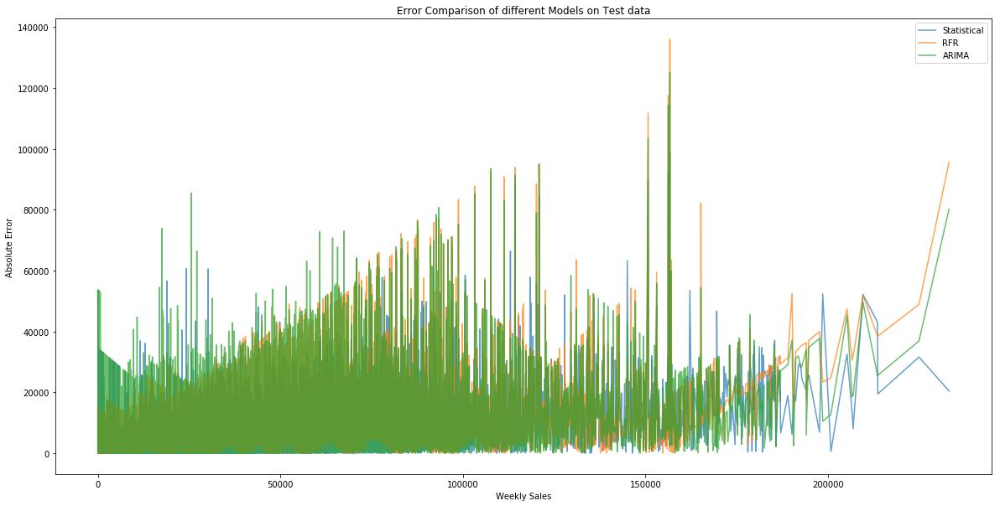

In [419]:
#Plotting the absolute error with the weekly sales for all the 3 predictions
temper1 = test_scored_stats.sort_values(by=['Weekly_Sales'])
temper2 = test_rf.sort_values(by=['Weekly_Sales'])
temper3 = fullyscored_test_arima.sort_values(by=['Weekly_Sales'])

plt.figure(figsize=(20,10))
plt.title('Error Comparison of different Models on Test data')
plt.xlabel('Weekly Sales')
plt.ylabel('Absolute Error')
plt.plot(temper1['Weekly_Sales'], temper1['error_abs_st'], label ='Statistical', alpha = 0.7)
plt.plot(temper2['Weekly_Sales'], temper2['error_abs_rf'], label = 'RFR', alpha = 0.7)
plt.plot(temper3['Weekly_Sales'], temper3['error_abs_ar'], label = 'ARIMA', alpha = 0.7)
plt.legend()

# Discussion and Conclusion

In [ ]:
# Macro Economic Indicators did not help in prediction of weekly sales. The sales data is very similar over different years \
# and this consistency helped to predict the sales. 